# Image features exercise
*Complete and hand in this completed worksheet (including its outputs and any supporting code outside of the worksheet) with your assignment submission. For more details see the [assignments page](http://vision.stanford.edu/teaching/cs231n/assignments.html) on the course website.*

We have seen that we can achieve reasonable performance on an image classification task by training a linear classifier on the pixels of the input image. In this exercise we will show that we can improve our classification performance by training linear classifiers not on raw pixels but on features that are computed from the raw pixels.

All of your work for this exercise will be done in this notebook.

In [1]:
import random
import numpy as np
from cs231n.data_utils import load_CIFAR10
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

## Load data
Similar to previous exercises, we will load CIFAR-10 data from disk.

In [2]:
from cs231n.features import color_histogram_hsv, hog_feature

def get_CIFAR10_data(num_training=49000, num_validation=1000, num_test=1000):
  # Load the raw CIFAR-10 data
  cifar10_dir = 'cs231n/datasets/cifar-10-batches-py'
  X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)
  
  # Subsample the data
  mask = range(num_training, num_training + num_validation)
  X_val = X_train[mask]
  y_val = y_train[mask]
  mask = range(num_training)
  X_train = X_train[mask]
  y_train = y_train[mask]
  mask = range(num_test)
  X_test = X_test[mask]
  y_test = y_test[mask]

  return X_train, y_train, X_val, y_val, X_test, y_test

X_train, y_train, X_val, y_val, X_test, y_test = get_CIFAR10_data()

In [4]:
print X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape

(49000, 32, 32, 3) (49000,) (1000, 32, 32, 3) (1000,) (1000, 32, 32, 3) (1000,)


## Extract Features
For each image we will compute a Histogram of Oriented
Gradients (HOG) as well as a color histogram using the hue channel in HSV
color space. We form our final feature vector for each image by concatenating
the HOG and color histogram feature vectors.

Roughly speaking, HOG should capture the texture of the image while ignoring
color information, and the color histogram represents the color of the input
image while ignoring texture. As a result, we expect that using both together
ought to work better than using either alone. Verifying this assumption would
be a good thing to try for the bonus section.

The `hog_feature` and `color_histogram_hsv` functions both operate on a single
image and return a feature vector for that image. The extract_features
function takes a set of images and a list of feature functions and evaluates
each feature function on each image, storing the results in a matrix where
each column is the concatenation of all feature vectors for a single image.

In [10]:
from cs231n.features import *

num_color_bins = 100 # Number of bins in the color histogram
feature_fns = [hog_feature, lambda img: color_histogram_hsv(img, nbin=num_color_bins)]
X_train_feats = extract_features(X_train, feature_fns, verbose=True)
X_val_feats = extract_features(X_val, feature_fns)
X_test_feats = extract_features(X_test, feature_fns)

# Preprocessing: Subtract the mean feature
mean_feat = np.mean(X_train_feats, axis=0, keepdims=True)
X_train_feats -= mean_feat
X_val_feats -= mean_feat
X_test_feats -= mean_feat

# Preprocessing: Divide by standard deviation. This ensures that each feature
# has roughly the same scale.
std_feat = np.std(X_train_feats, axis=0, keepdims=True)
X_train_feats /= std_feat
X_val_feats /= std_feat
X_test_feats /= std_feat

# Preprocessing: Add a bias dimension
X_train_feats = np.hstack([X_train_feats, np.ones((X_train_feats.shape[0], 1))])
X_val_feats = np.hstack([X_val_feats, np.ones((X_val_feats.shape[0], 1))])
X_test_feats = np.hstack([X_test_feats, np.ones((X_test_feats.shape[0], 1))])

Done extracting features for 1000 / 49000 images
Done extracting features for 2000 / 49000 images
Done extracting features for 3000 / 49000 images
Done extracting features for 4000 / 49000 images
Done extracting features for 5000 / 49000 images
Done extracting features for 6000 / 49000 images
Done extracting features for 7000 / 49000 images
Done extracting features for 8000 / 49000 images
Done extracting features for 9000 / 49000 images
Done extracting features for 10000 / 49000 images
Done extracting features for 11000 / 49000 images
Done extracting features for 12000 / 49000 images
Done extracting features for 13000 / 49000 images
Done extracting features for 14000 / 49000 images
Done extracting features for 15000 / 49000 images
Done extracting features for 16000 / 49000 images
Done extracting features for 17000 / 49000 images
Done extracting features for 18000 / 49000 images
Done extracting features for 19000 / 49000 images
Done extracting features for 20000 / 49000 images
Done extr

## Train SVM on features
Using the multiclass SVM code developed earlier in the assignment, train SVMs on top of the features extracted above; this should achieve better results than training SVMs directly on top of raw pixels.

In [11]:
print X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape
print X_train_feats.shape, y_train.shape, X_val_feats.shape, y_val.shape, X_test_feats.shape, y_test.shape


(49000, 32, 32, 3) (49000,) (1000, 32, 32, 3) (1000,) (1000, 32, 32, 3) (1000,)
(49000, 245) (49000,) (1000, 245) (1000,) (1000, 245) (1000,)


In [7]:
from cs231n.features import * 

# Number of bins in the color histogram

def get_hist_features(X_train, X_val, X_test, num_color_bins):
    feature_fns = [hog_feature, lambda img: color_histogram_hsv(img, nbin=num_color_bins)]

    X_train_feats = extract_features(X_train, feature_fns, verbose=False)
    X_val_feats = extract_features(X_val, feature_fns)
    X_test_feats = extract_features(X_test, feature_fns)

    # Preprocessing: Subtract the mean feature
    mean_feat = np.mean(X_train_feats, axis=0, keepdims=True)
    X_train_feats -= mean_feat
    X_val_feats -= mean_feat
    X_test_feats -= mean_feat

    # Preprocessing: Divide by standard deviation. This ensures that each feature
    # has roughly the same scale.
    std_feat = np.std(X_train_feats, axis=0, keepdims=True)
    X_train_feats /= std_feat
    X_val_feats /= std_feat
    X_test_feats /= std_feat

    # Preprocessing: Add a bias dimension
    X_train_feats = np.hstack([X_train_feats, np.ones((X_train_feats.shape[0], 1))])
    X_val_feats = np.hstack([X_val_feats, np.ones((X_val_feats.shape[0], 1))])
    X_test_feats = np.hstack([X_test_feats, np.ones((X_test_feats.shape[0], 1))])
    return X_train_feats, X_val_feats, X_test_feats

In [12]:
# In the file linear_classifier.py, implement SGD in the function
# LinearClassifier.train() and then run it with the code below.
import time

from cs231n.classifiers import LinearSVM
svm = LinearSVM()
tic = time.time()
loss_hist = svm.train(X_train_feats, y_train, learning_rate=1e-7, reg=5e4,
                      num_iters=1500, verbose=True)
toc = time.time()
print 'That took %fs' % (toc - tic)
def plot_loss_value(loss_hist):
    plt.plot(loss_hist)
    plt.xlabel('Iteration number')
    plt.ylabel('Loss value')
    plt.show()
y_train_pred = svm.predict(X_train_feats)
print 'training accuracy: %f' % (np.mean(y_train == y_train_pred), )
y_val_pred = svm.predict(X_val_feats)
print 'validation accuracy: %f' % (np.mean(y_val == y_val_pred), )

iteration 0 / 1500: loss 69.059748
iteration 100 / 1500: loss 31.050329
iteration 200 / 1500: loss 17.083273
iteration 300 / 1500: loss 11.965592
iteration 400 / 1500: loss 10.087333
iteration 500 / 1500: loss 9.399550
iteration 600 / 1500: loss 9.145279
iteration 700 / 1500: loss 9.052745
iteration 800 / 1500: loss 9.018773
iteration 900 / 1500: loss 9.006525
iteration 1000 / 1500: loss 9.001803
iteration 1100 / 1500: loss 9.000116
iteration 1200 / 1500: loss 8.999367
iteration 1300 / 1500: loss 8.999263
iteration 1400 / 1500: loss 8.998978
That took 27.474632s
training accuracy: 0.411449
validation accuracy: 0.437000


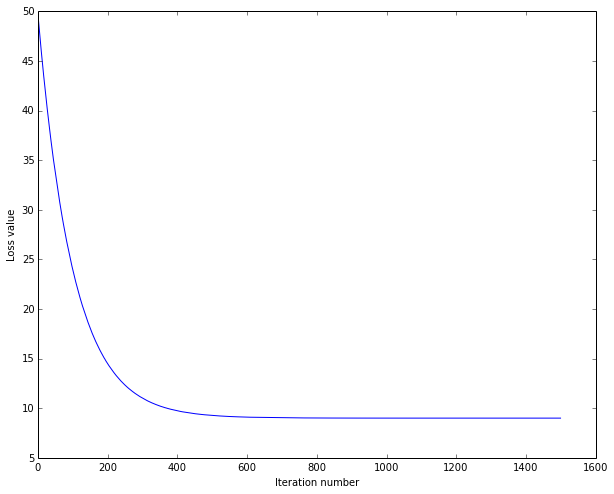

In [9]:
plot_loss_value(loss_hist)

In [13]:
# Use the validation set to tune hyperparameters (regularization strength and
# learning rate). You should experiment with different ranges for the learning
# rates and regularization strengths; if you are careful you should be able to
# get a classification accuracy of about 0.4 on the validation set.
learning_rates = [1e-7, 5e-6, 5e-5, 1e-4, 1e-9, 5e-8,]
regularization_strengths = [1e4, 5e4, 1e5,  1e6, 1e7]
num_bins = [10, 15, 20, 30, 50, 75, 100]

count = len(learning_rates) * len(regularization_strengths) * len(num_bins)
# results is dictionary mapping tuples of the form
# (learning_rate, regularization_strength) to tuples of the form
# (training_accuracy, validation_accuracy). The accuracy is simply the fraction
# of data points that are correctly classified.
results = {}
best_val = -1   # The highest validation accuracy that we have seen so far.
best_svm = None # The LinearSVM object that achieved the highest validation rate.

################################################################################
# TODO:                                                                        #
# You might also want to play with different numbers of bins in the color histogram. 
# If you are careful    #
# you should be able to get accuracy of near 0.44 on the validation set.       #
################################################################################
index = 0
num_iters = 2500
for bins in num_bins:
    X_train_feats, X_val_feats, X_test_feats = get_hist_features(X_train, X_val, X_test, bins)
    for reg in regularization_strengths:
        for learn_rate in learning_rates:
            print "---------START--------------"
            print "(%d) of (%d)" % (index, count)
            index += 1
            print "Running Train and validation for (%e, %e, %d)" % (learn_rate, reg, bins)
            svm = LinearSVM()
            loss_hist = svm.train(X_train_feats, y_train, learning_rate=learn_rate, reg=reg,
                                  num_iters=num_iters, verbose=False)
            plot_loss_value(loss_hist)
            y_train_pred = svm.predict(X_train_feats)
            accuray_train = np.mean(y_train == y_train_pred) * 100
            print '\ttraining accuracy: %f' % (accuray_train )
            y_val_pred = svm.predict(X_val_feats) 
            accuray_val = np.mean(y_val == y_val_pred) *  100
            print '\tvalidation accuracy: %f' % (accuray_val )        
            results[(learn_rate, reg, bins)] = accuray_train, accuray_val, svm, X_test_feats
            print "---------END--------------"
            print
            print
            print

################################################################################
#                              END OF YOUR CODE                                #
################################################################################
    


KeyboardInterrupt: 

lr 1.000000e-09 reg 1.000000e+04 bins 10 train accuracy: 11.165306 val accuracy: 11.100000
lr 1.000000e-09 reg 1.000000e+04 bins 15 train accuracy: 12.655102 val accuracy: 13.000000
lr 1.000000e-09 reg 1.000000e+04 bins 20 train accuracy: 8.455102 val accuracy: 8.500000
lr 1.000000e-09 reg 1.000000e+04 bins 30 train accuracy: 10.683673 val accuracy: 9.100000
lr 1.000000e-09 reg 1.000000e+04 bins 50 train accuracy: 9.655102 val accuracy: 8.600000
lr 1.000000e-09 reg 1.000000e+04 bins 75 train accuracy: 10.010204 val accuracy: 11.200000
lr 1.000000e-09 reg 1.000000e+04 bins 100 train accuracy: 8.255102 val accuracy: 6.600000
lr 1.000000e-09 reg 5.000000e+04 bins 10 train accuracy: 11.806122 val accuracy: 10.600000
lr 1.000000e-09 reg 5.000000e+04 bins 15 train accuracy: 10.316327 val accuracy: 9.500000
lr 1.000000e-09 reg 5.000000e+04 bins 20 train accuracy: 10.771429 val accuracy: 8.500000
lr 1.000000e-09 reg 5.000000e+04 bins 30 train accuracy: 7.883673 val accuracy: 9.400000
lr 1.0000

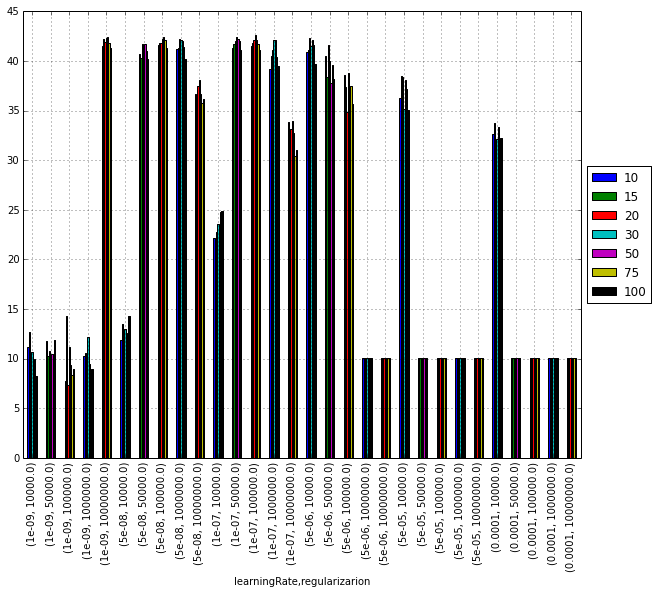

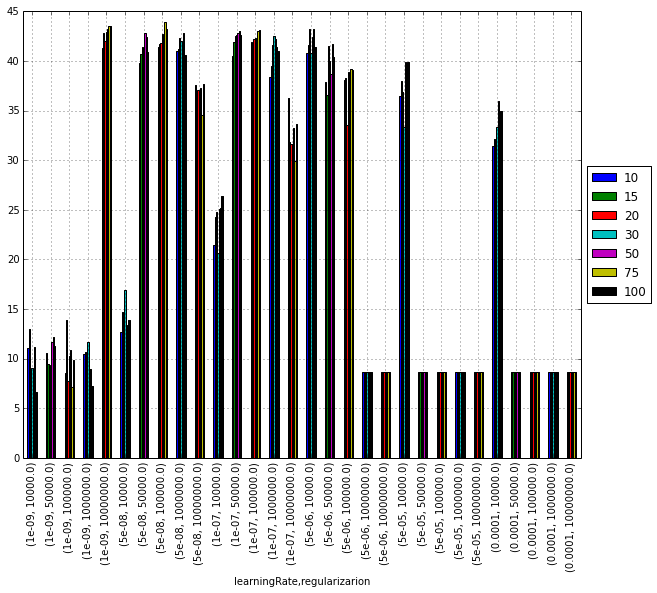

In [18]:
# Print out results.
best_val = -1
best_params = None

for keys in sorted(results):
    lr, reg, bins = keys
    train_accuracy, val_accuracy, svm_obj, X_test_feats = results[(lr, reg, bins)]
    print 'lr %e reg %e bins %d train accuracy: %f val accuracy: %f' % (
                lr, reg, bins, train_accuracy, val_accuracy)
    if best_val == -1 or val_accuracy  > best_val:
        best_val = val_accuracy
        best_svm = svm_obj
        best_params = (lr, reg, bins)
    
print 'best validation accuracy achieved during cross-validation: %f' % best_val
print best_params
                       

# visualize the weights of the best network
#show_net_weights(best_net)
#best_net.params['W1'].shape
train_accuracies = []

val_accuracies = []
lrs = []
regs = []
bins = []
import pandas as pd
for key in results.keys():
    train_accuracies.append(results[key][0])
    val_accuracies.append(results[key][1])
    lrs.append(key[0])
    regs.append(key[1])
    bins.append(key[2])
        
d = {'learningRate' : pd.Series(lrs),
    'regularizarion' : pd.Series(regs),
     'bins' : pd.Series(bins),
     'trainAccuracy': train_accuracies, 
     'valAccuracy': val_accuracies
       }
rows = pd.DataFrame(d)
###
##bad LR= lr = e-4, lr = 5e-05, lr = 1e-09
## good LR= 1e-4 and e4 good and 5e-04 and e4 good and 5e-08 and e-07 and 5e-06 ##

cross_tab = pd.crosstab([rows.learningRate, rows.regularizarion],  [rows.bins],  values=rows.trainAccuracy,
                        aggfunc=np.min).plot(kind='bar').legend(loc='center left', bbox_to_anchor=(1, 0.5))

cross_tab = pd.crosstab([rows.learningRate, rows.regularizarion],  [rows.bins], values=rows.valAccuracy,
                        aggfunc=np.min).plot(kind='bar').legend(loc='center left', bbox_to_anchor=(1, 0.5))


In [23]:
# Evaluate your trained SVM on the test set
test_data = get_hist_features(X_train, X_val, X_test, best_params[2])[2]
y_test_pred = best_svm.predict(test_data)
test_accuracy = np.mean(y_test == y_test_pred)
print test_accuracy

(1000, 220)
0.411


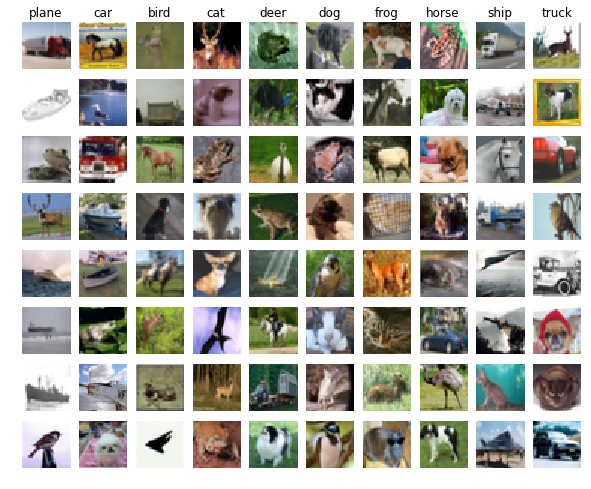

In [26]:
# An important way to gain intuition about how an algorithm works is to
# visualize the mistakes that it makes. In this visualization, we show examples
# of images that are misclassified by our current system. The first column
# shows images that our system labeled as "plane" but whose true label is
# something other than "plane".

examples_per_class = 8
classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
for cls, cls_name in enumerate(classes):
    temp = np.where((y_test != cls) & (y_test_pred == cls))
    idxs = temp[0]
    idxs = np.random.choice(idxs, examples_per_class, replace=False)
    for i, idx in enumerate(idxs):
        plt.subplot(examples_per_class, len(classes), i * len(classes) + cls + 1)
        plt.imshow(X_test[idx].astype('uint8'))
        plt.axis('off')
        if i == 0:
            plt.title(cls_name)
plt.show()

### Inline question 1:
Describe the misclassification results that you see. Do they make sense?

## Neural Network on image features
Earlier in this assigment we saw that training a two-layer neural network on raw pixels achieved better classification performance than linear classifiers on raw pixels. In this notebook we have seen that linear classifiers on image features outperform linear classifiers on raw pixels. 

For completeness, we should also try training a neural network on image features. This approach should outperform all previous approaches: you should easily be able to achieve over 55% classification accuracy on the test set; our best model achieves about 60% classification accuracy.

In [53]:
print X_train_feats.shape


(49000, 155)


### Single training on Neural nets using Feature

In [52]:
X_train_feats, X_val_feats, X_test_feats = get_hist_features(X_train, X_val, X_test, 10)


In [39]:
def reshape_data(X_train, X_val, X_test, num_training=49000, num_validation=1000, num_test=1000):
    # Reshape data to rows
    X_train_re_shape = X_train.reshape(num_training, -1)
    X_val_re_shape = X_val.reshape(num_validation, -1)
    X_test_re_shape = X_test.reshape(num_test, -1)
    return X_train_re_shape, X_val_re_shape, X_test_re_shape

In [54]:
print X_train_feats.shape

(49000, 155)


In [28]:
def plot_stats(stats):
    plt.subplot(2, 1, 1)
    plt.plot(stats['loss_history'])
    plt.title('Loss history')
    plt.xlabel('Iteration')
    plt.ylabel('Loss')

    plt.subplot(2, 1, 2)
    plt.plot(stats['train_acc_history'], label='train')
    plt.plot(stats['val_acc_history'], label='val')
    plt.title('Classification accuracy history')
    plt.xlabel('Epoch')
    plt.ylabel('Clasification accuracy')
    plt.show()


In [61]:
# In the file linear_classifier.py, implement SGD in the function
# LinearClassifier.train() and then run it with the code below.
from cs231n.classifiers.neural_net import TwoLayerNet

hidden_size = 500
num_classes = 10
bins = 10

# Reshape data to rows
# X_train_re_shape, X_val_re_shape, X_test_re_shape =  reshape_data(X_train_feats, 
#                       X_val_feats, X_test_feats)

X_train_re_shape, X_val_re_shape, X_test_re_shape =  reshape_data(X_train, 
                      X_val, X_test)

tic = time.time()
input_size = X_train_feats.shape[1]
net = TwoLayerNet(input_size, hidden_size, num_classes)
stats = net.train(X_train_feats, y_train, X_val_feats, y_val,
            num_iters=num_iters, batch_size=200,
            learning_rate=9e-1, learning_rate_decay=0.95,
            reg=1e-2,  verbose=True)


iteration 0 / 1500: loss 2.302589
iteration 100 / 1500: loss 1.592302
iteration 200 / 1500: loss 1.572100
iteration 300 / 1500: loss 1.500034
iteration 400 / 1500: loss 1.473857
iteration 500 / 1500: loss 1.506842
iteration 600 / 1500: loss 1.576126
iteration 700 / 1500: loss 1.623625
iteration 800 / 1500: loss 1.585775
iteration 900 / 1500: loss 1.525281
iteration 1000 / 1500: loss 1.502116
iteration 1100 / 1500: loss 1.544660
iteration 1200 / 1500: loss 1.597232
iteration 1300 / 1500: loss 1.533048
iteration 1400 / 1500: loss 1.525884


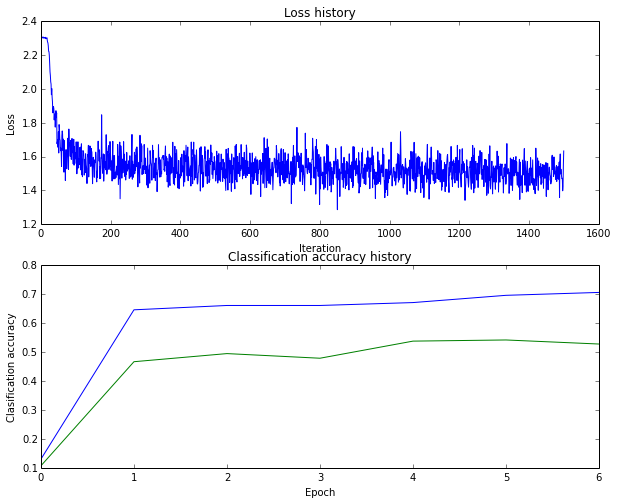

That took 53.090313s
training accuracy: 0.552898
validation accuracy: 0.523000


In [62]:
plot_stats(stats)
# plot_loss_value(stats['loss_history'])
toc = time.time()
print 'That took %fs' % (toc - tic)

y_train_pred = net.predict(X_train_feats)
print 'training accuracy: %f' % (np.mean(y_train == y_train_pred), )
y_val_pred = net.predict(X_val_feats)
print 'validation accuracy: %f' % (np.mean(y_val == y_val_pred), )

START
(0) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:500, learn_rate:1.100000e+00)


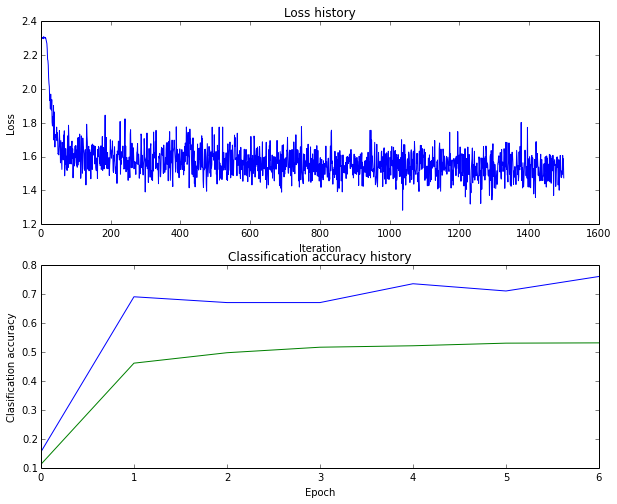

	training accuracy: (52.222449), validation accuracy: (48.700000)
(1) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:50, learn_rate:1.100000e+00)


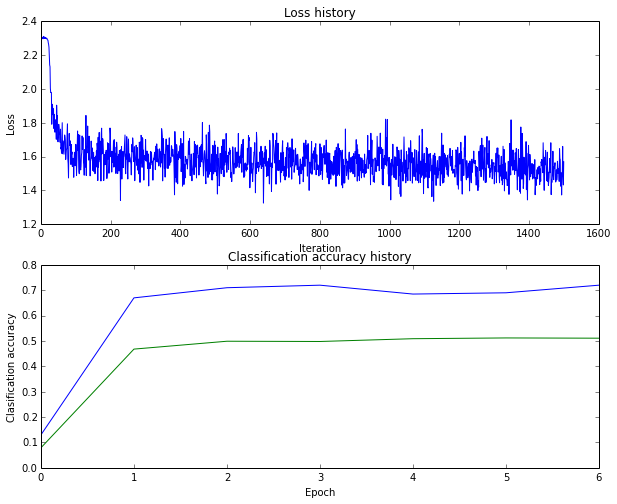

	training accuracy: (51.591837), validation accuracy: (51.000000)
(2) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:100, learn_rate:1.100000e+00)


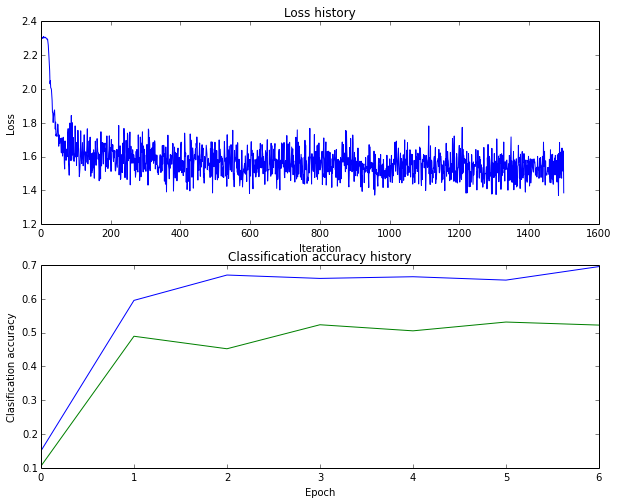

	training accuracy: (53.861224), validation accuracy: (53.700000)
(3) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:200, learn_rate:1.100000e+00)


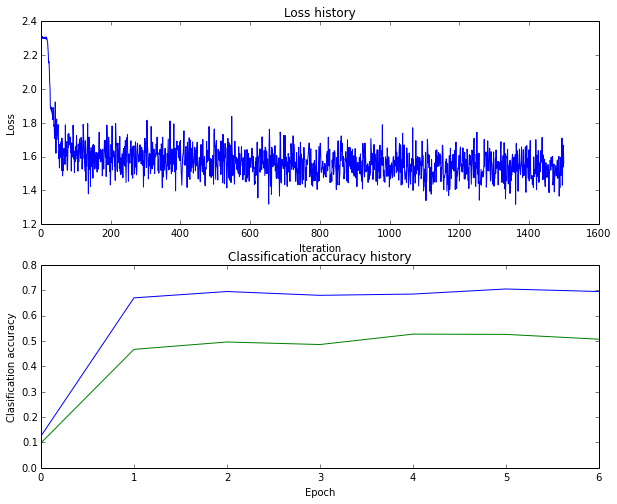

	training accuracy: (53.426531), validation accuracy: (52.100000)
(4) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:500, learn_rate:1.100000e+00)


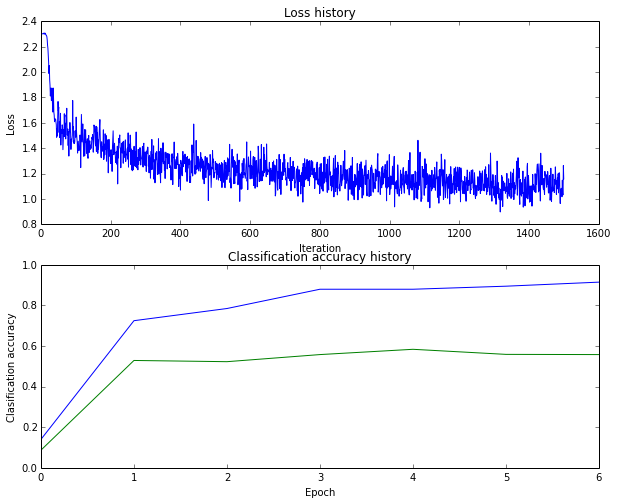

	training accuracy: (68.297959), validation accuracy: (56.200000)
(5) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:50, learn_rate:1.100000e+00)


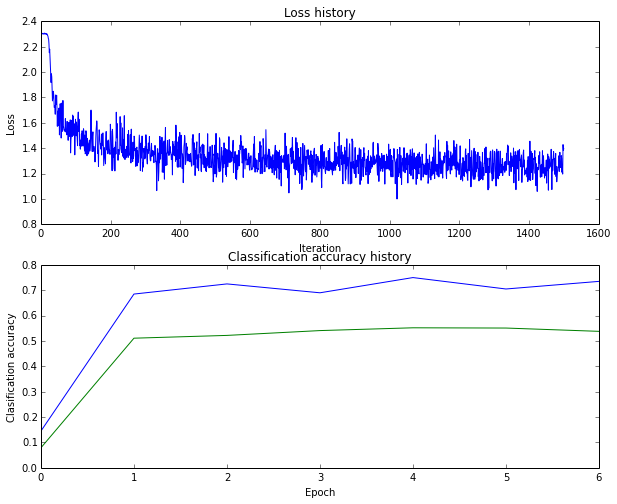

	training accuracy: (58.838776), validation accuracy: (54.700000)
(6) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:100, learn_rate:1.100000e+00)


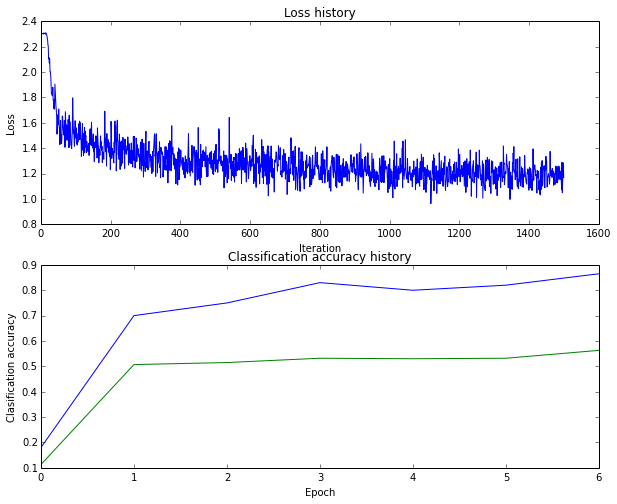

	training accuracy: (62.828571), validation accuracy: (54.600000)
(7) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:200, learn_rate:1.100000e+00)


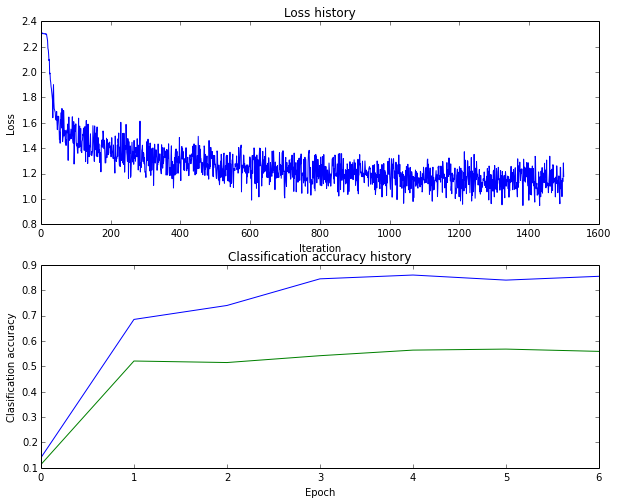

	training accuracy: (66.512245), validation accuracy: (57.100000)
(8) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


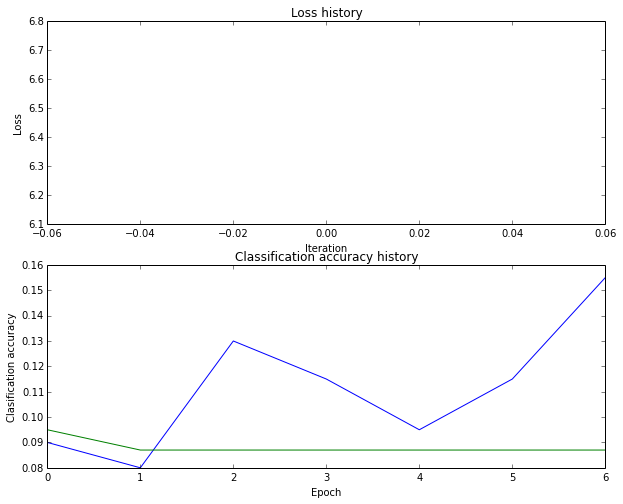

	training accuracy: (10.026531), validation accuracy: (8.700000)
(9) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


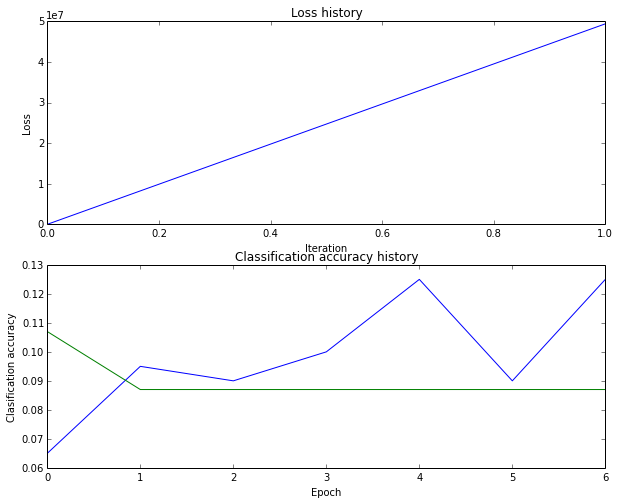

	training accuracy: (10.026531), validation accuracy: (8.700000)
(10) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


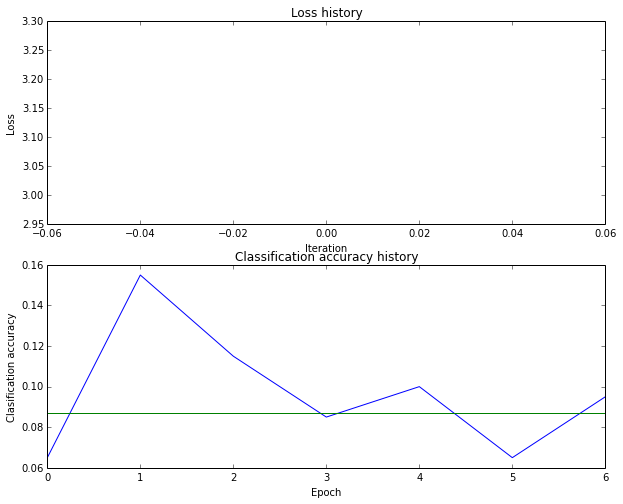

	training accuracy: (10.026531), validation accuracy: (8.700000)
(11) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


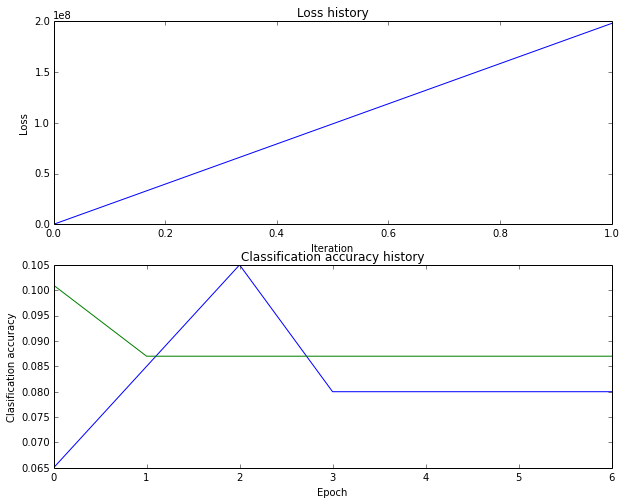

	training accuracy: (10.026531), validation accuracy: (8.700000)
(12) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


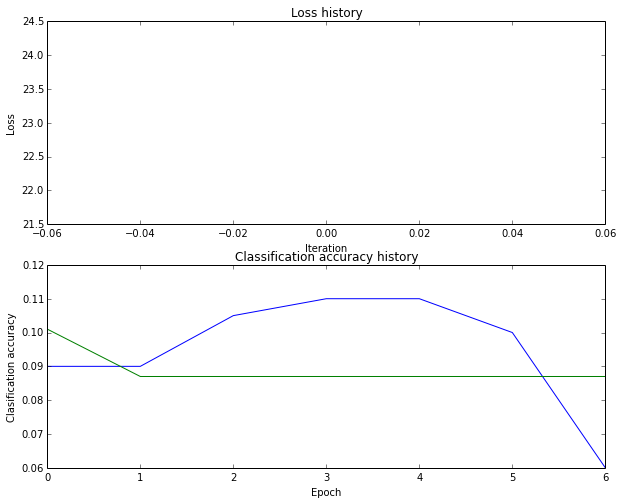

	training accuracy: (10.026531), validation accuracy: (8.700000)
(13) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


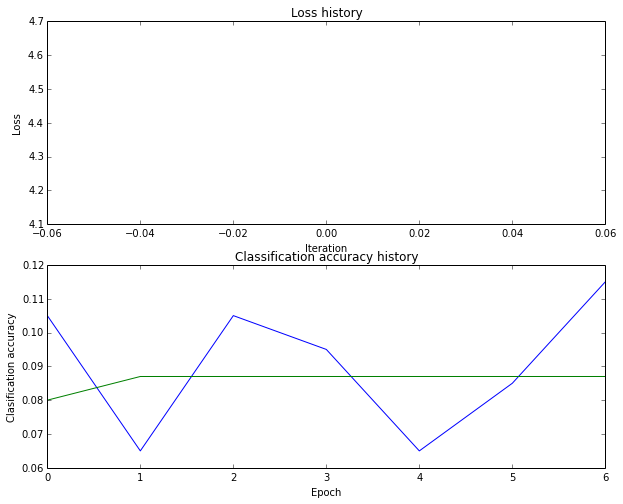

	training accuracy: (10.026531), validation accuracy: (8.700000)
(14) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


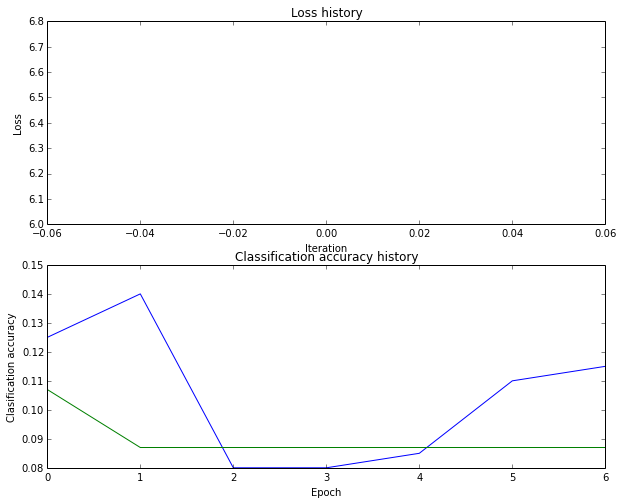

	training accuracy: (10.026531), validation accuracy: (8.700000)
(15) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


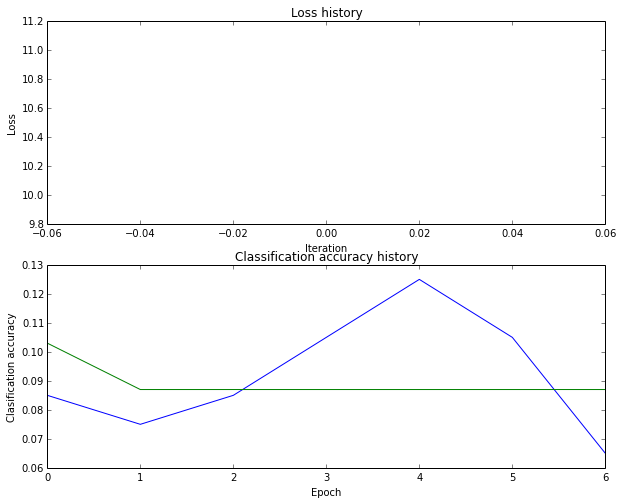

	training accuracy: (10.026531), validation accuracy: (8.700000)
(16) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:500, learn_rate:9.000000e-01)


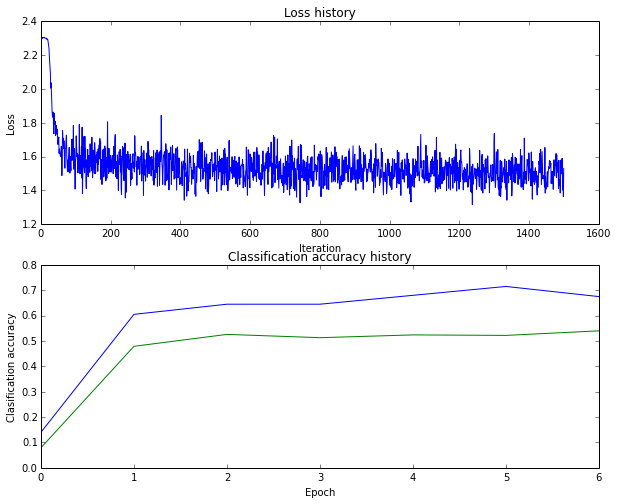

	training accuracy: (56.014286), validation accuracy: (53.200000)
(17) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:50, learn_rate:9.000000e-01)


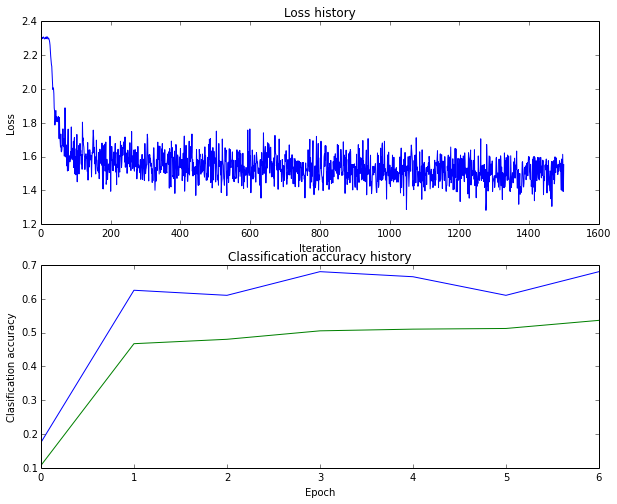

	training accuracy: (53.428571), validation accuracy: (50.500000)
(18) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:100, learn_rate:9.000000e-01)


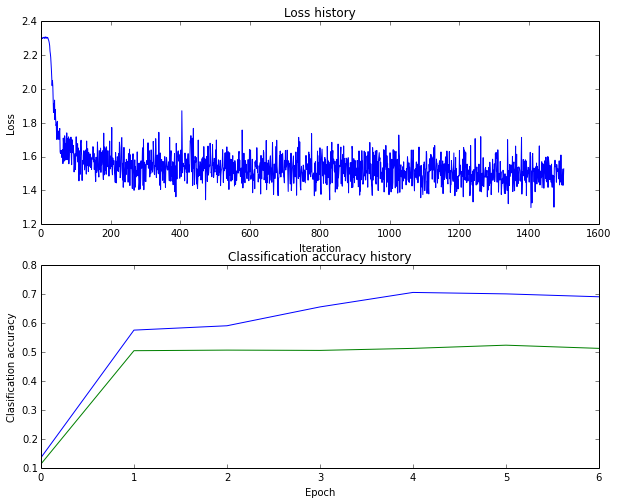

	training accuracy: (53.989796), validation accuracy: (51.200000)
(19) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:200, learn_rate:9.000000e-01)


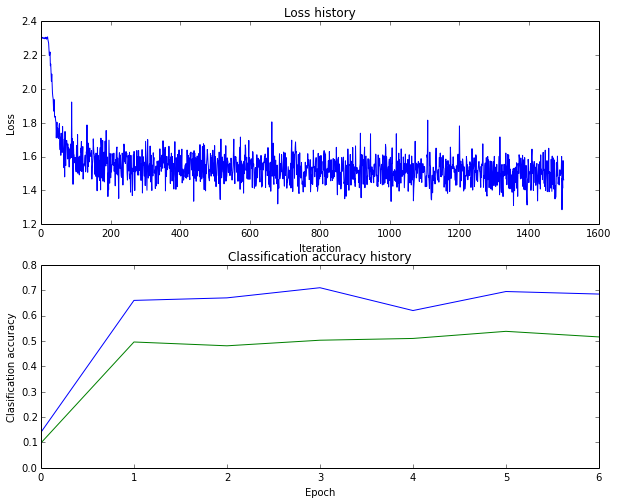

	training accuracy: (55.281633), validation accuracy: (52.000000)
(20) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:500, learn_rate:9.000000e-01)


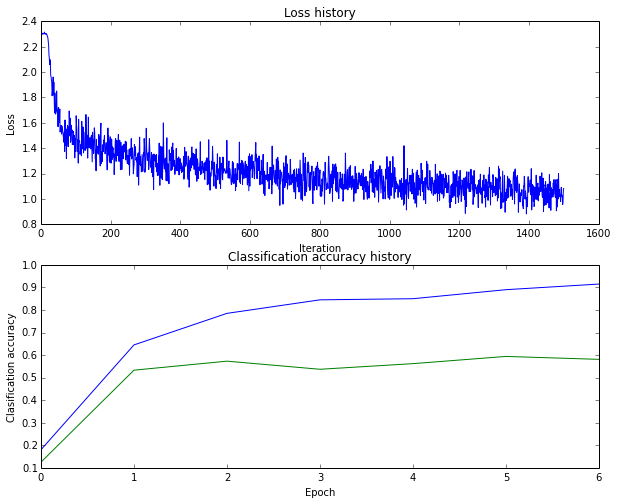

	training accuracy: (70.012245), validation accuracy: (57.200000)
(21) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:50, learn_rate:9.000000e-01)


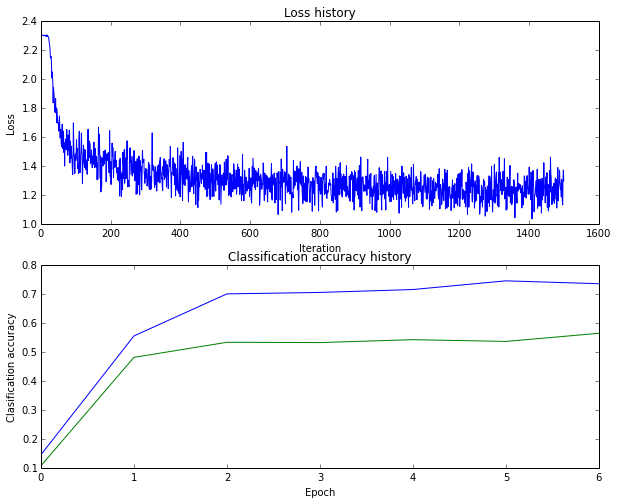

	training accuracy: (58.334694), validation accuracy: (55.500000)
(22) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:100, learn_rate:9.000000e-01)


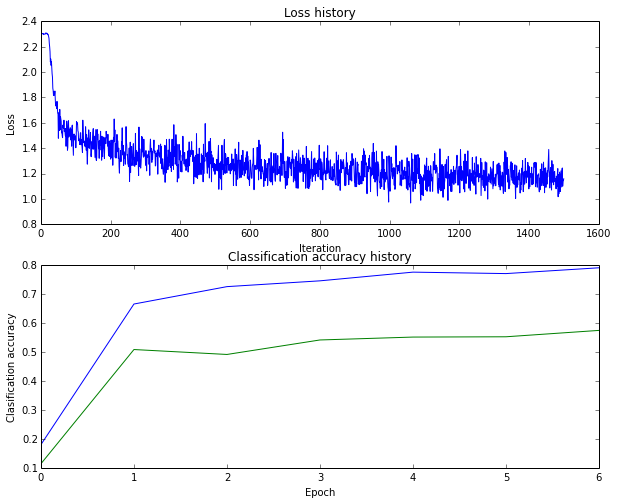

	training accuracy: (63.744898), validation accuracy: (56.400000)
(23) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:200, learn_rate:9.000000e-01)


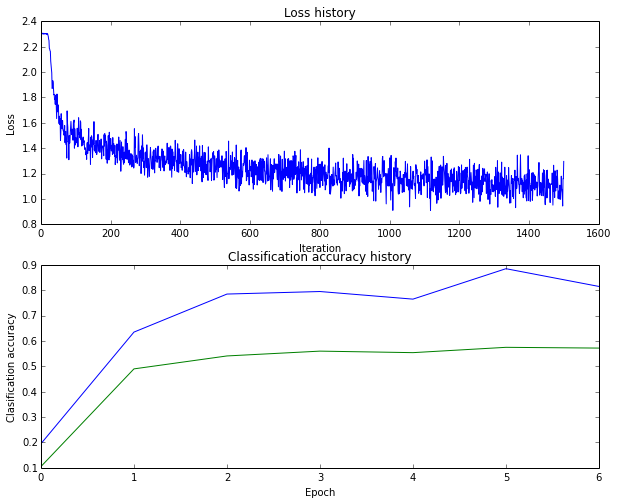

	training accuracy: (67.218367), validation accuracy: (56.300000)
(24) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


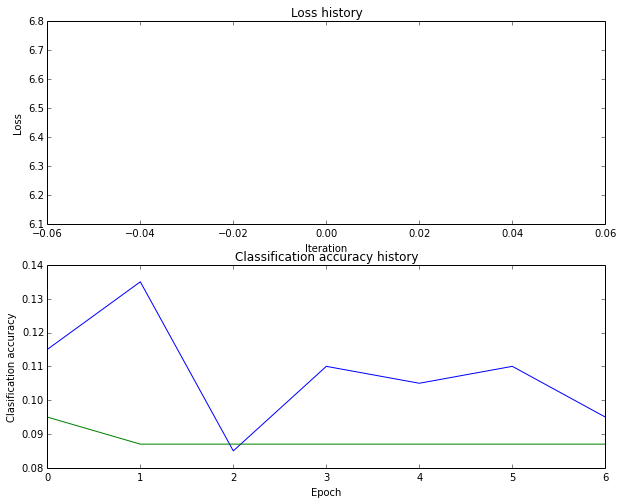

	training accuracy: (10.026531), validation accuracy: (8.700000)
(25) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


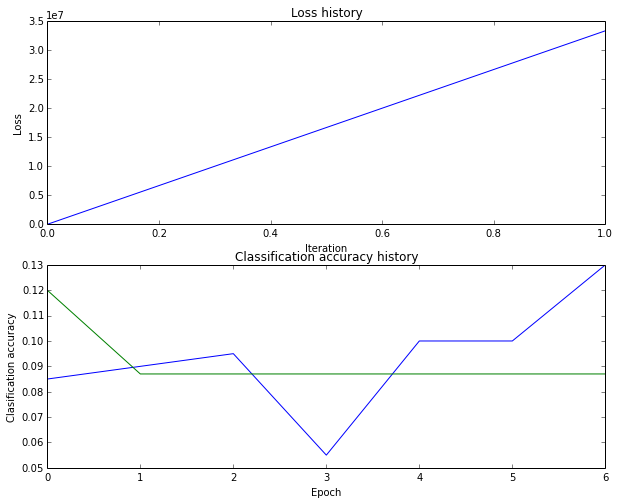

	training accuracy: (10.026531), validation accuracy: (8.700000)
(26) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


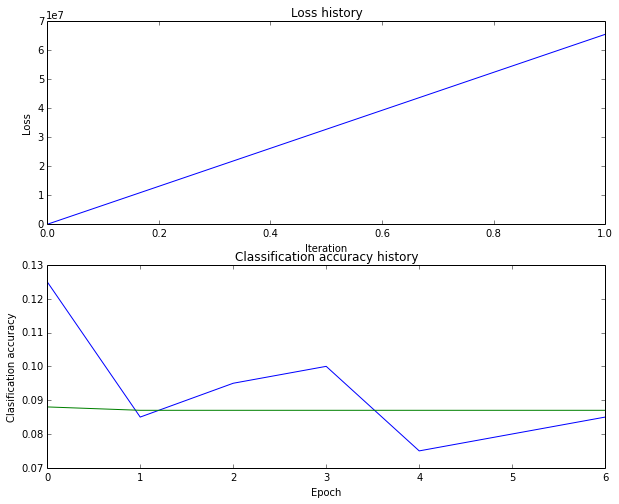

	training accuracy: (10.026531), validation accuracy: (8.700000)
(27) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


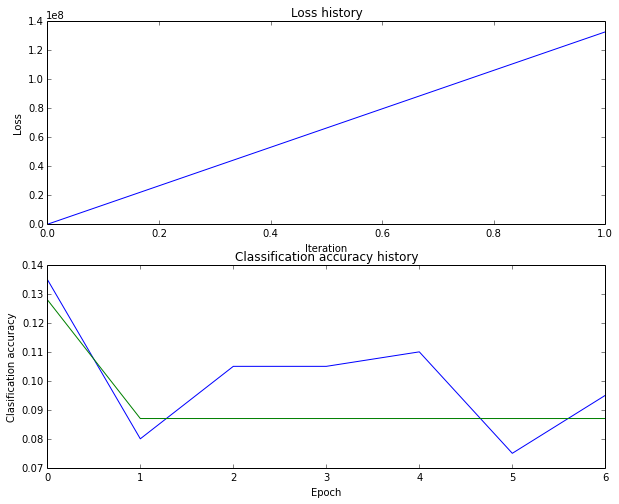

	training accuracy: (10.026531), validation accuracy: (8.700000)
(28) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


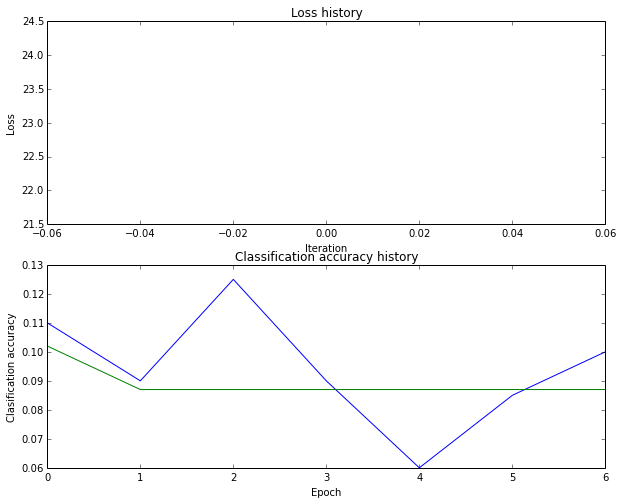

	training accuracy: (10.026531), validation accuracy: (8.700000)
(29) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


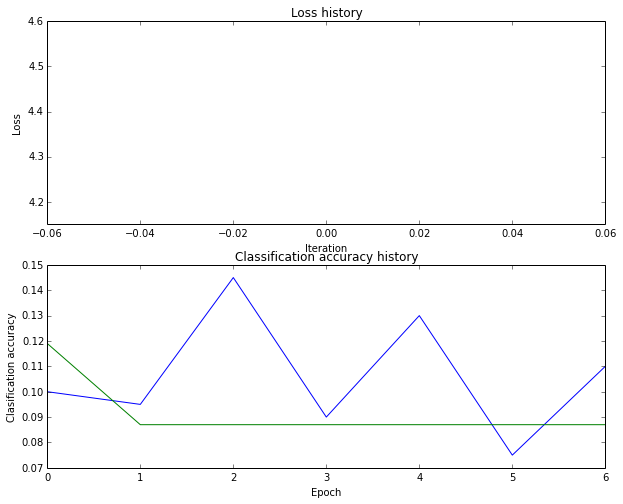

	training accuracy: (10.026531), validation accuracy: (8.700000)
(30) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


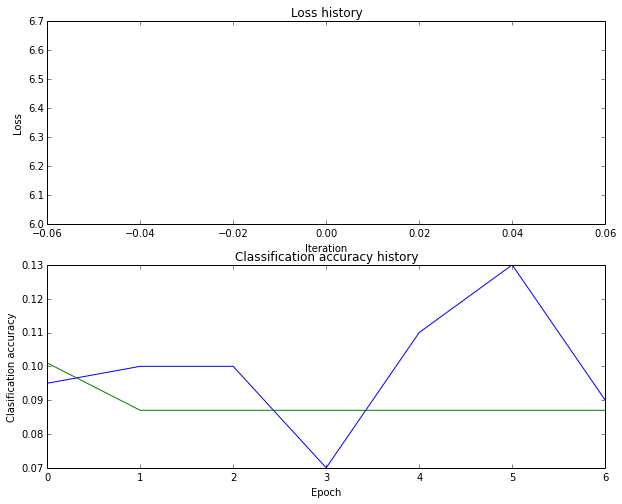

	training accuracy: (10.026531), validation accuracy: (8.700000)
(31) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


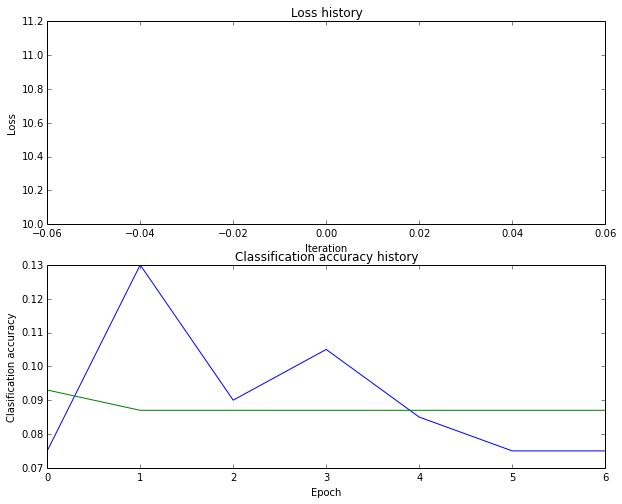

	training accuracy: (10.026531), validation accuracy: (8.700000)
(32) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:500, learn_rate:2.000000e-06)


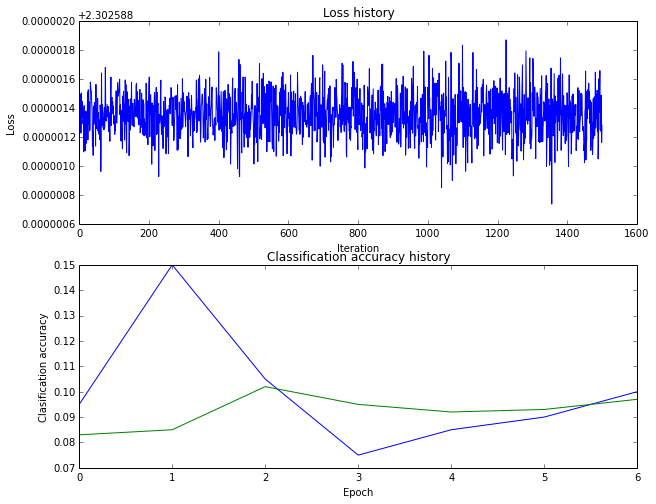

	training accuracy: (9.442857), validation accuracy: (9.500000)
(33) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:50, learn_rate:2.000000e-06)


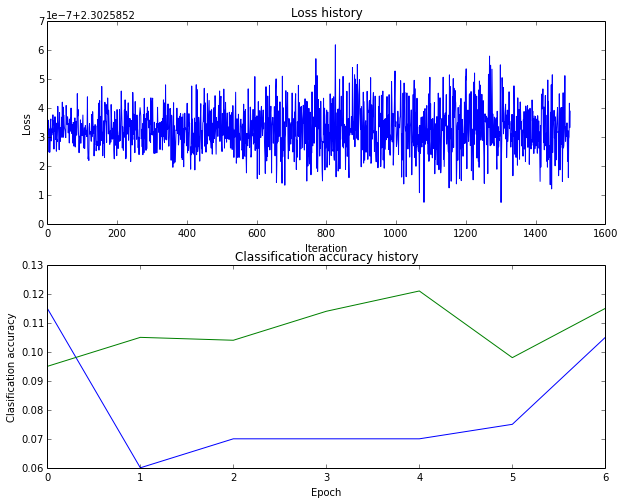

	training accuracy: (8.653061), validation accuracy: (10.400000)
(34) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:100, learn_rate:2.000000e-06)


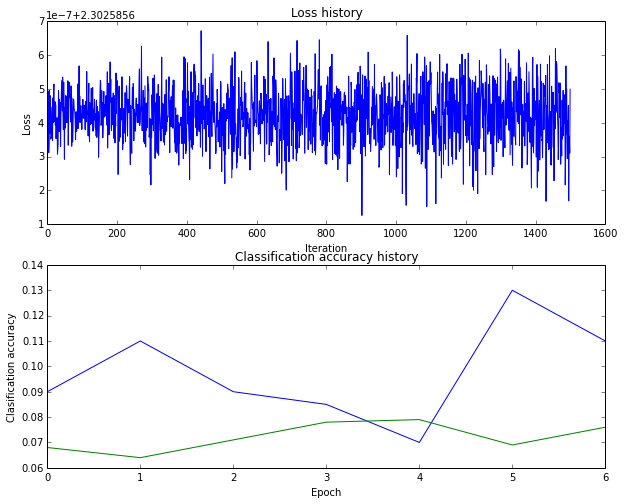

	training accuracy: (9.461224), validation accuracy: (7.300000)
(35) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:200, learn_rate:2.000000e-06)


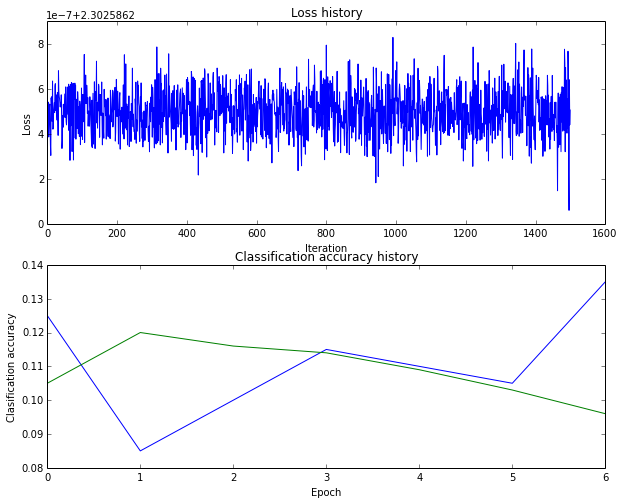

	training accuracy: (10.914286), validation accuracy: (9.700000)
(36) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:500, learn_rate:2.000000e-06)


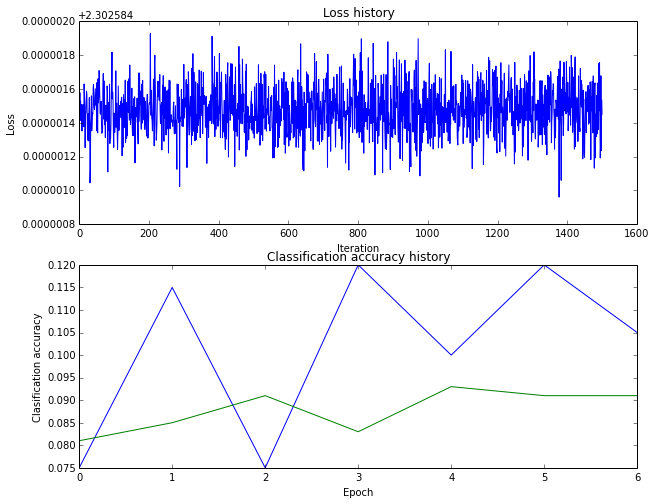

	training accuracy: (11.079592), validation accuracy: (9.600000)
(37) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:50, learn_rate:2.000000e-06)


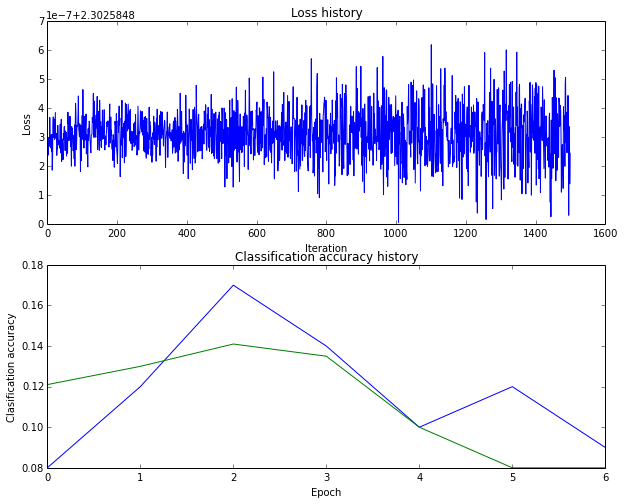

	training accuracy: (10.157143), validation accuracy: (7.900000)
(38) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:100, learn_rate:2.000000e-06)


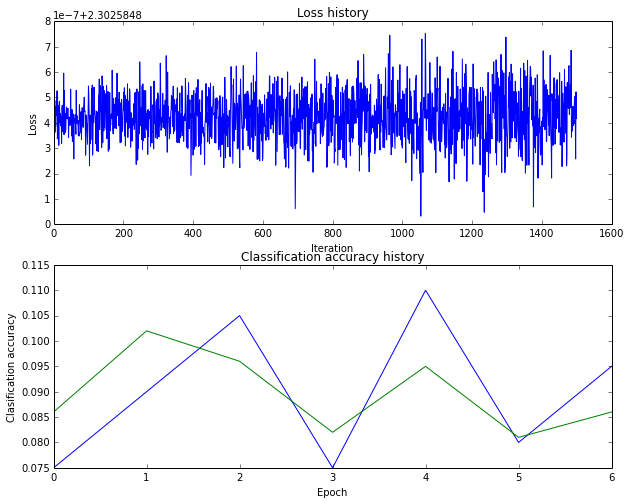

	training accuracy: (10.453061), validation accuracy: (8.800000)
(39) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:200, learn_rate:2.000000e-06)


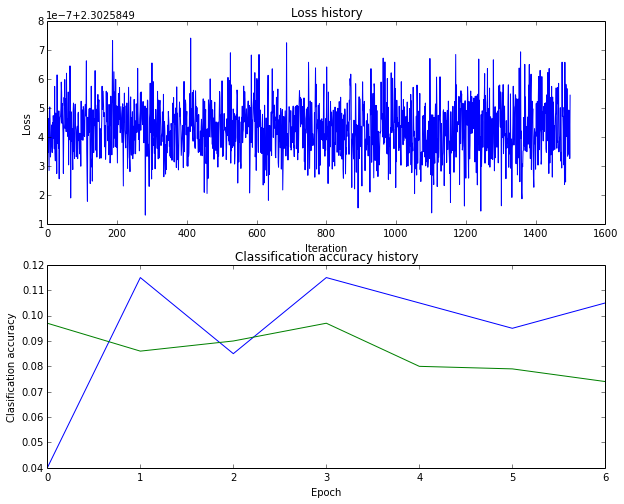

	training accuracy: (9.885714), validation accuracy: (7.500000)
(40) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


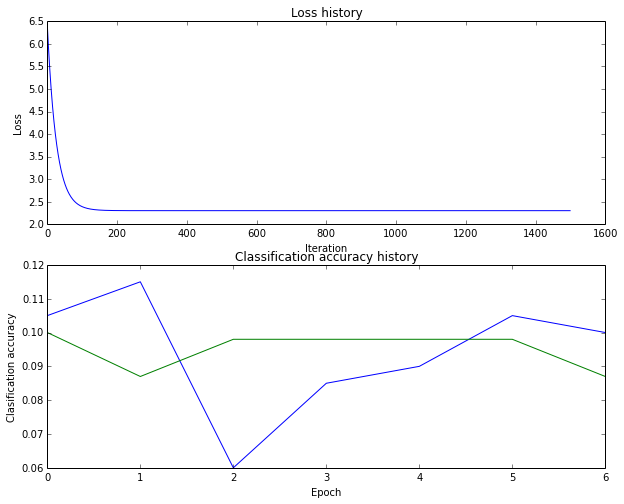

	training accuracy: (10.026531), validation accuracy: (8.700000)
(41) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


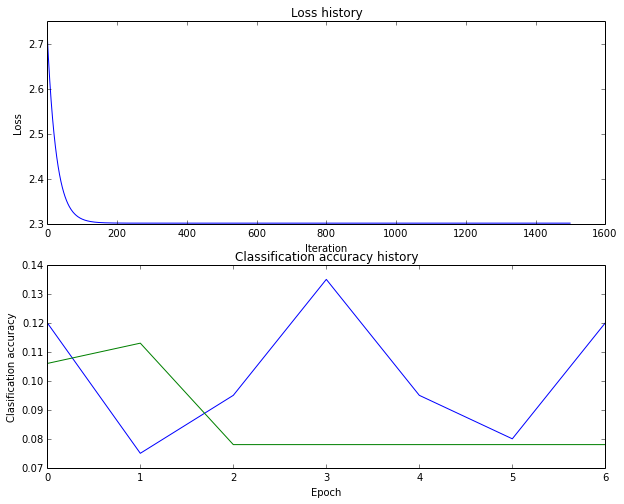

	training accuracy: (10.044898), validation accuracy: (7.800000)
(42) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


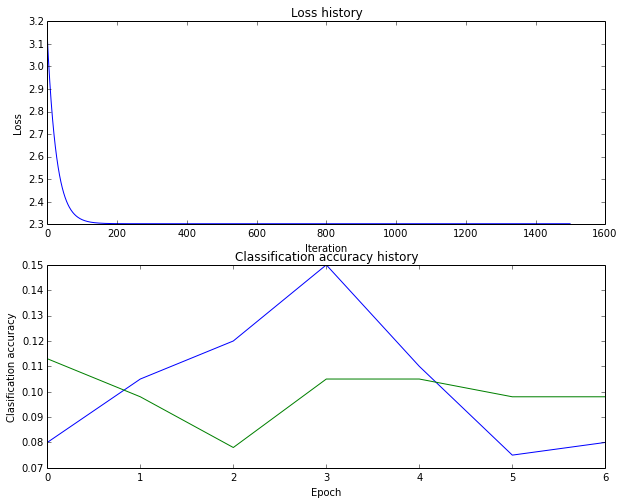

	training accuracy: (10.004082), validation accuracy: (9.800000)
(43) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


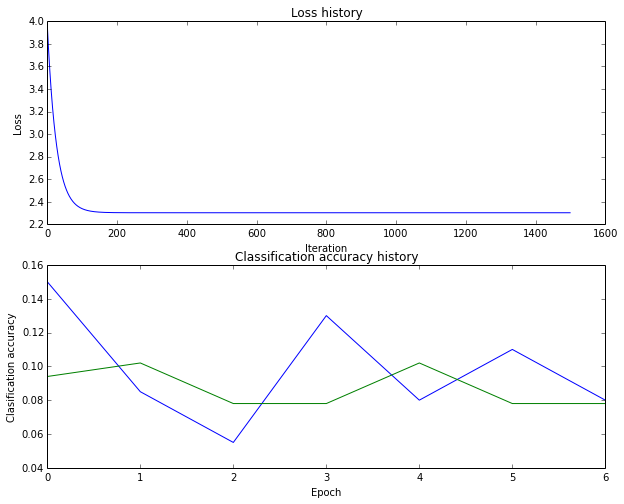

	training accuracy: (9.995918), validation accuracy: (10.200000)
(44) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


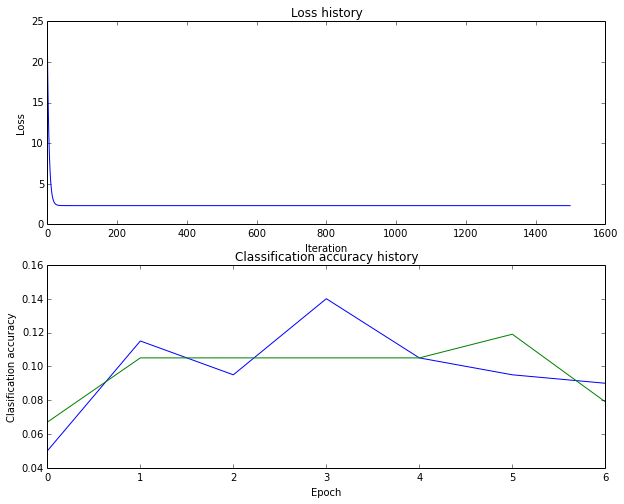

	training accuracy: (9.961224), validation accuracy: (11.900000)
(45) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


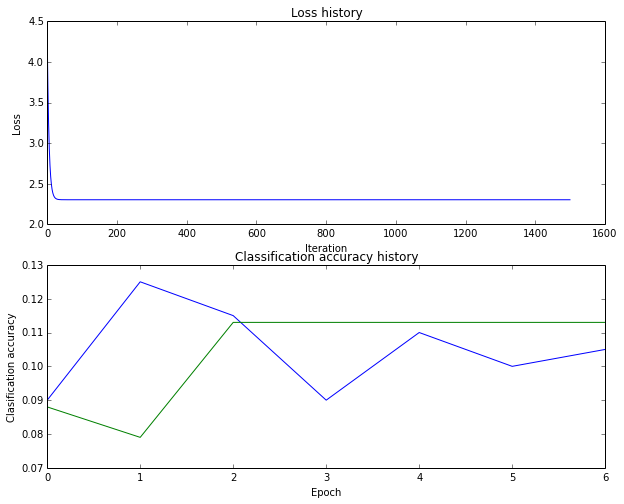

	training accuracy: (9.973469), validation accuracy: (11.300000)
(46) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


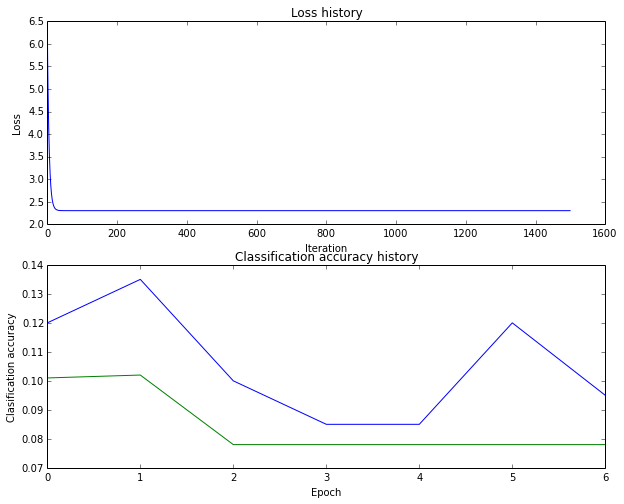

	training accuracy: (10.044898), validation accuracy: (7.800000)
(47) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


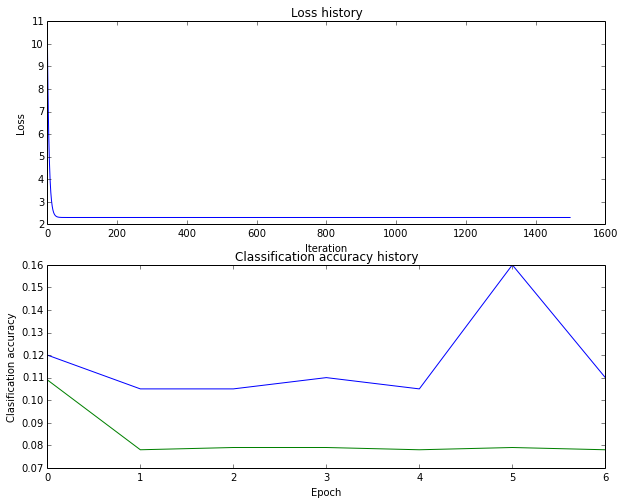

	training accuracy: (10.044898), validation accuracy: (7.800000)
(48) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:500, learn_rate:5.000000e-06)


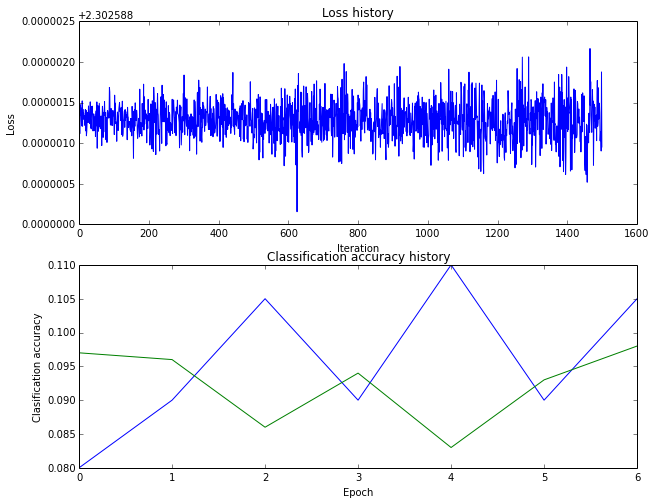

	training accuracy: (9.418367), validation accuracy: (10.400000)
(49) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:50, learn_rate:5.000000e-06)


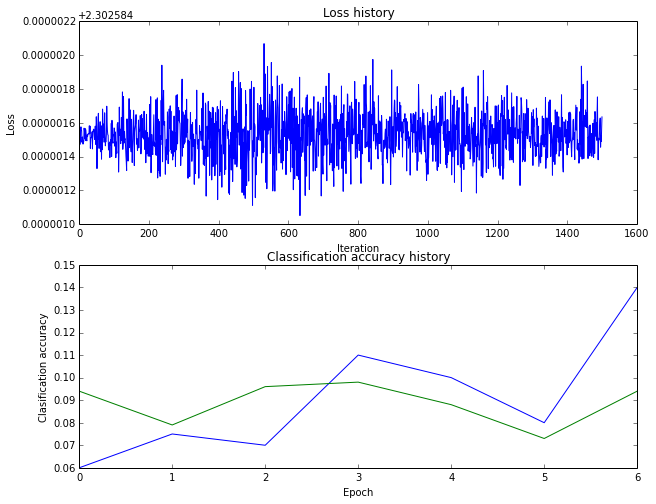

	training accuracy: (9.279592), validation accuracy: (9.000000)
(50) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:100, learn_rate:5.000000e-06)


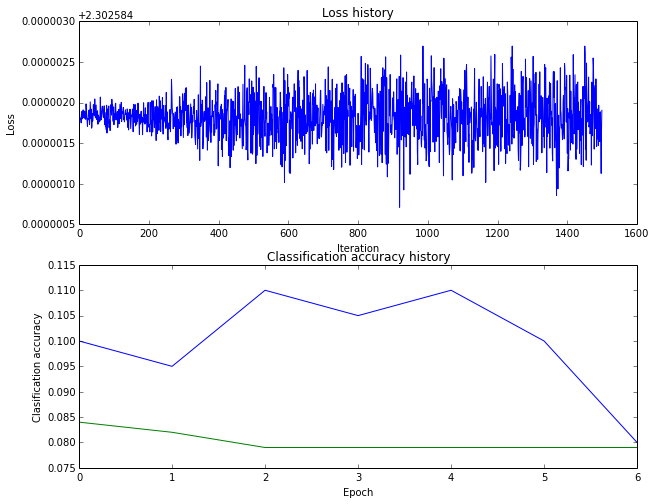

	training accuracy: (10.042857), validation accuracy: (7.900000)
(51) of (384)
Running Train and validation for (bins:10, reg:1.000000e-02, hidden_size:200, learn_rate:5.000000e-06)


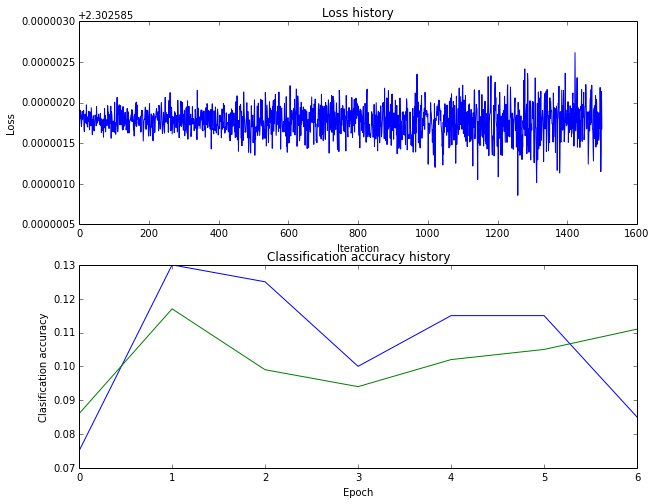

	training accuracy: (10.353061), validation accuracy: (11.100000)
(52) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:500, learn_rate:5.000000e-06)


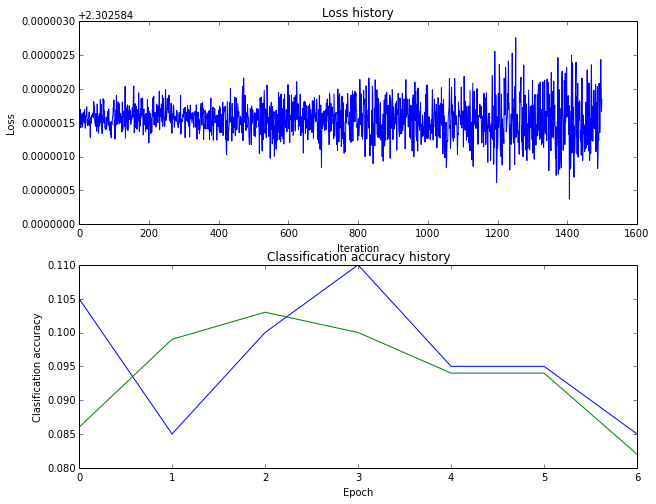

	training accuracy: (10.095918), validation accuracy: (8.100000)
(53) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:50, learn_rate:5.000000e-06)


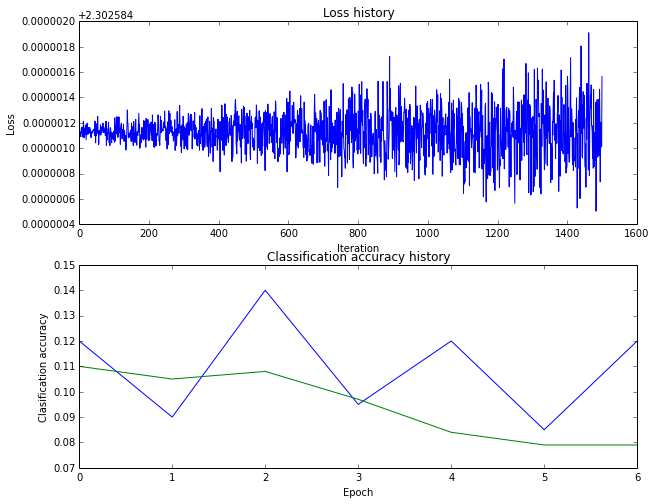

	training accuracy: (10.032653), validation accuracy: (7.900000)
(54) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:100, learn_rate:5.000000e-06)


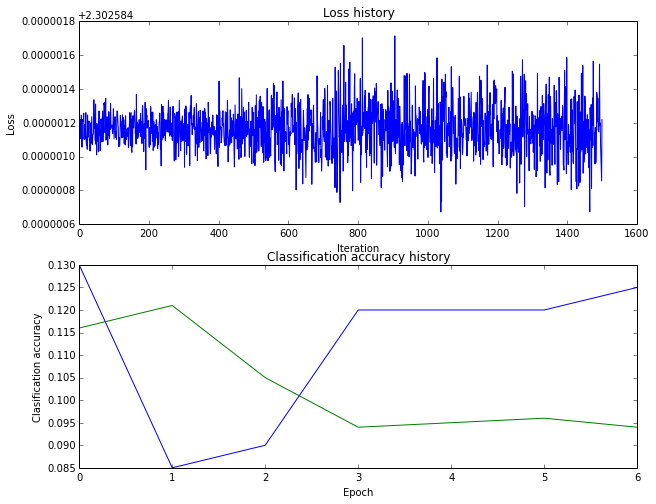

	training accuracy: (9.559184), validation accuracy: (10.600000)
(55) of (384)
Running Train and validation for (bins:10, reg:1.000000e-03, hidden_size:200, learn_rate:5.000000e-06)


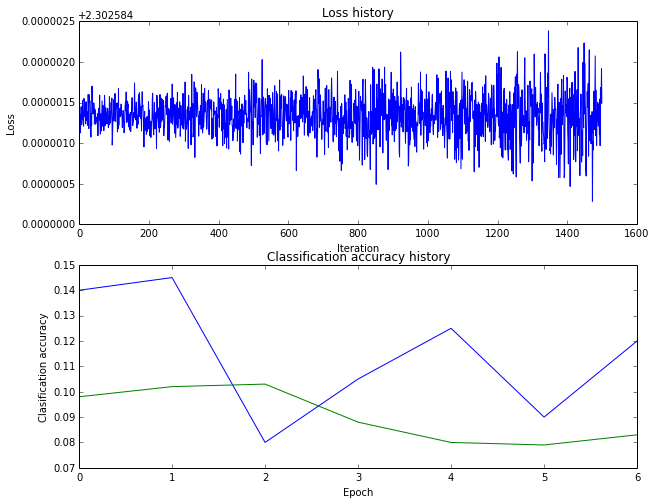

	training accuracy: (10.928571), validation accuracy: (7.700000)
(56) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


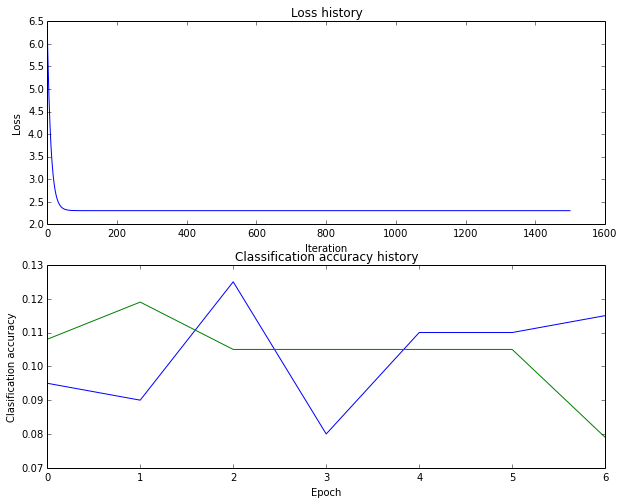

	training accuracy: (9.989796), validation accuracy: (10.500000)
(57) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


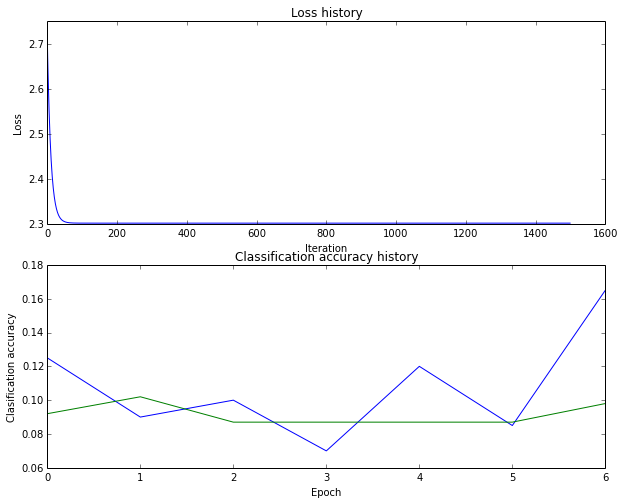

	training accuracy: (10.004082), validation accuracy: (9.800000)
(58) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


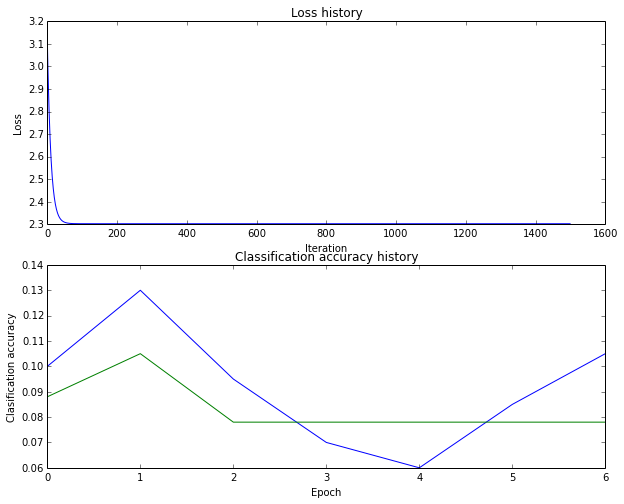

	training accuracy: (10.044898), validation accuracy: (7.800000)
(59) of (384)
Running Train and validation for (bins:10, reg:1.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


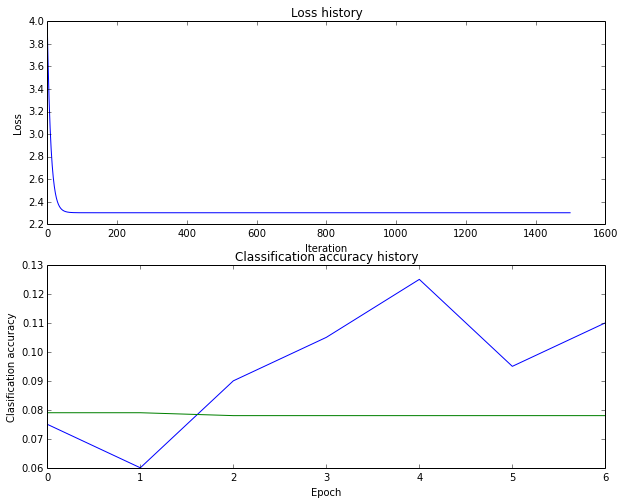

	training accuracy: (10.044898), validation accuracy: (7.800000)
(60) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


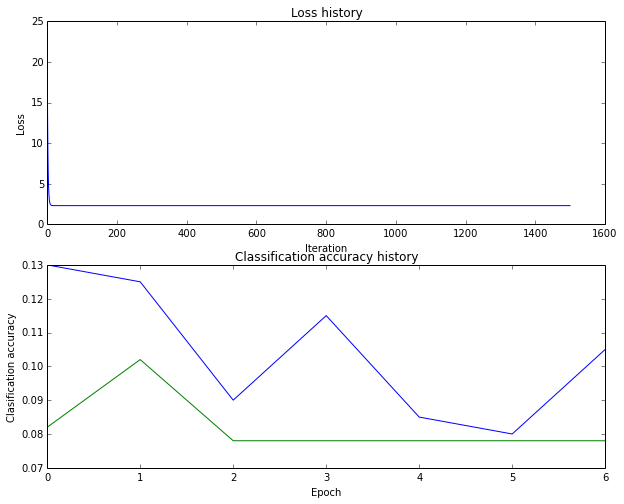

	training accuracy: (10.044898), validation accuracy: (7.800000)
(61) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


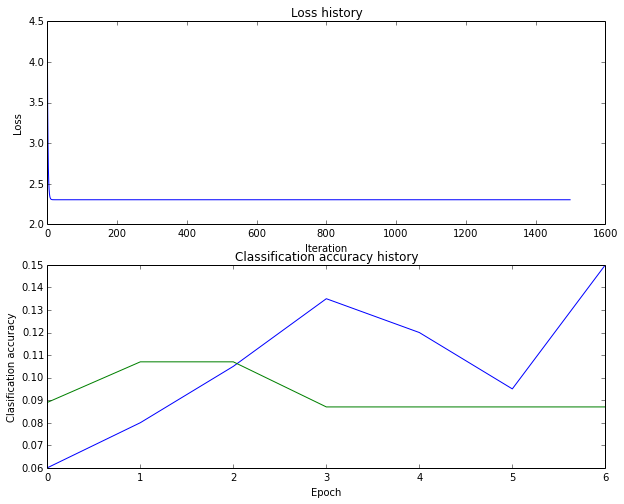

	training accuracy: (10.026531), validation accuracy: (8.700000)
(62) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


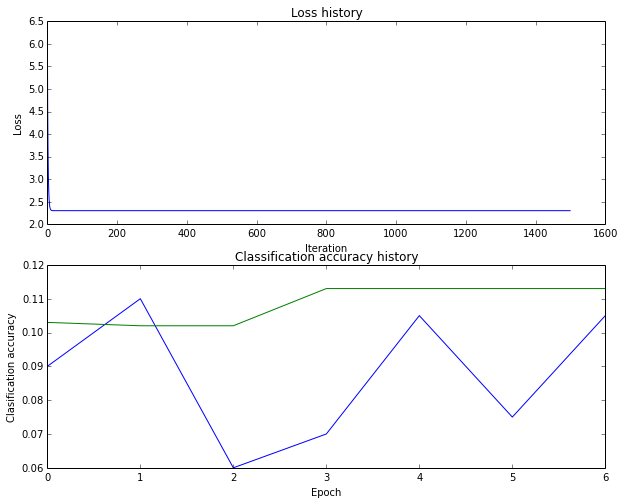

	training accuracy: (9.973469), validation accuracy: (11.300000)
(63) of (384)
Running Train and validation for (bins:10, reg:5.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


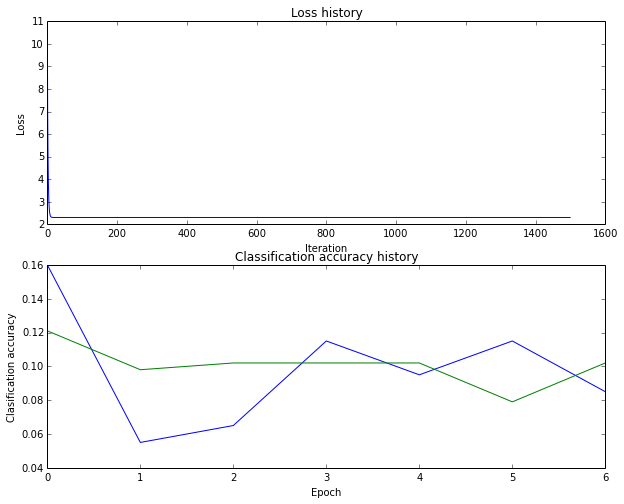

	training accuracy: (10.044898), validation accuracy: (7.800000)
(64) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:500, learn_rate:1.100000e+00)


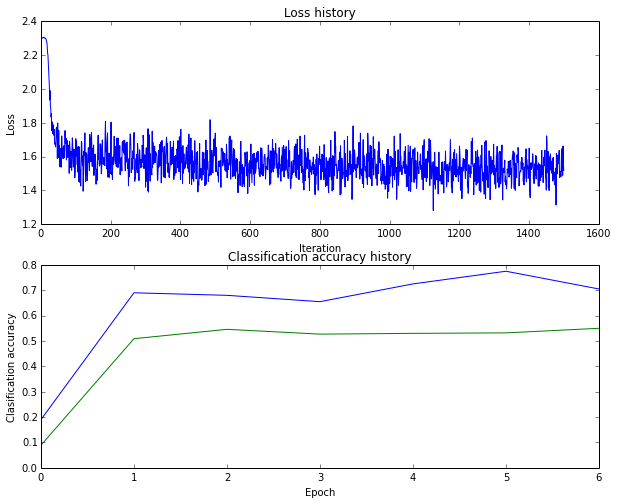

	training accuracy: (55.734694), validation accuracy: (53.300000)
(65) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:50, learn_rate:1.100000e+00)


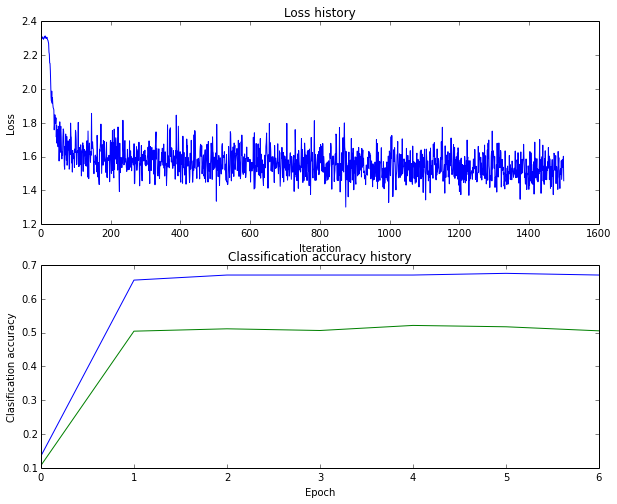

	training accuracy: (54.338776), validation accuracy: (52.800000)
(66) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:100, learn_rate:1.100000e+00)


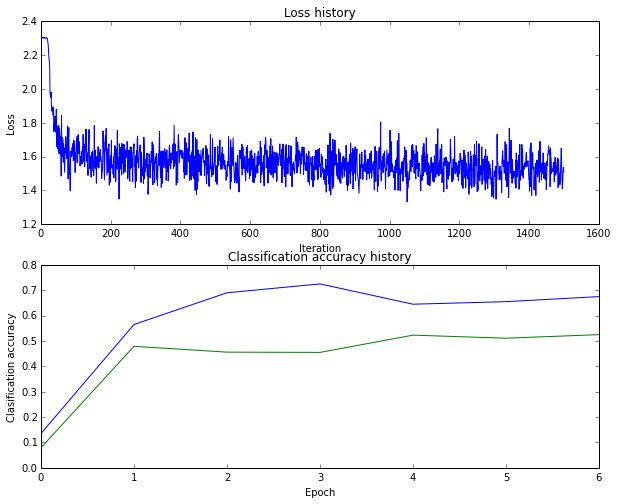

	training accuracy: (53.506122), validation accuracy: (53.000000)
(67) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:200, learn_rate:1.100000e+00)


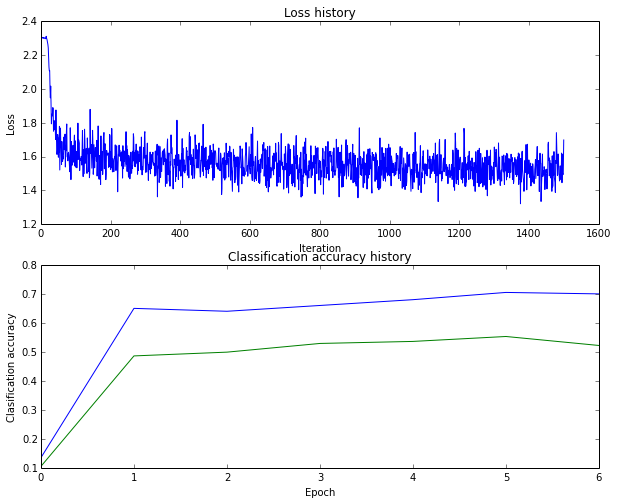

	training accuracy: (51.814286), validation accuracy: (48.900000)
(68) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:500, learn_rate:1.100000e+00)


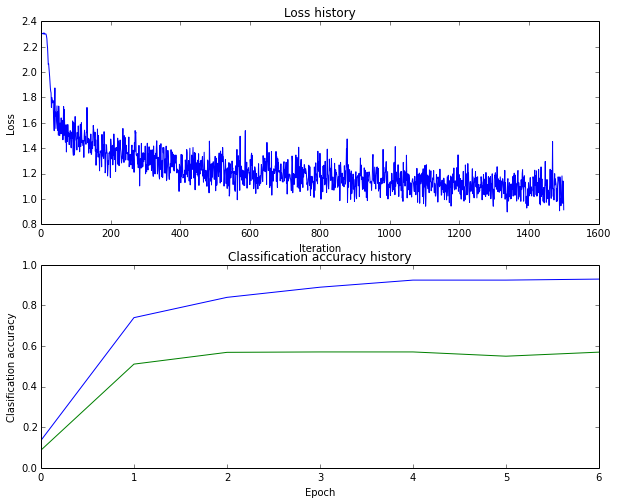

	training accuracy: (69.479592), validation accuracy: (55.900000)
(69) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:50, learn_rate:1.100000e+00)


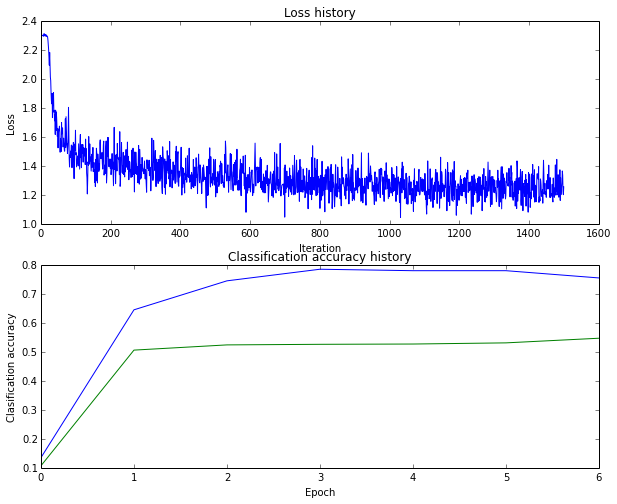

	training accuracy: (59.730612), validation accuracy: (54.500000)
(70) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:100, learn_rate:1.100000e+00)


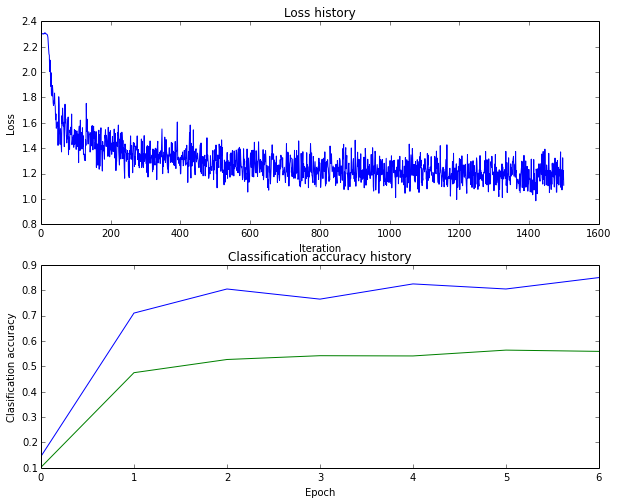

	training accuracy: (62.938776), validation accuracy: (55.600000)
(71) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:200, learn_rate:1.100000e+00)


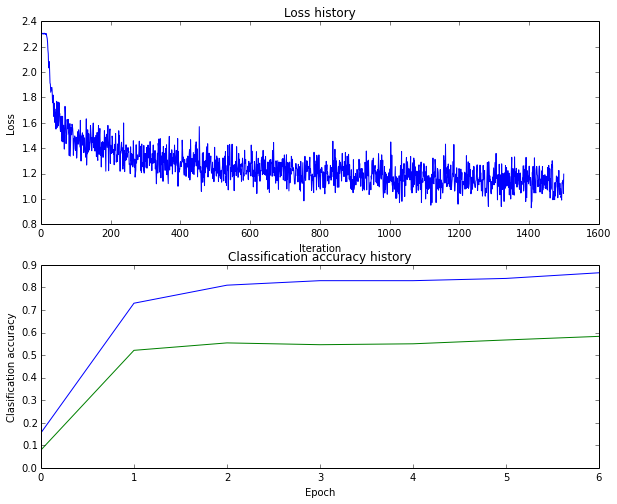

	training accuracy: (66.877551), validation accuracy: (59.800000)
(72) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


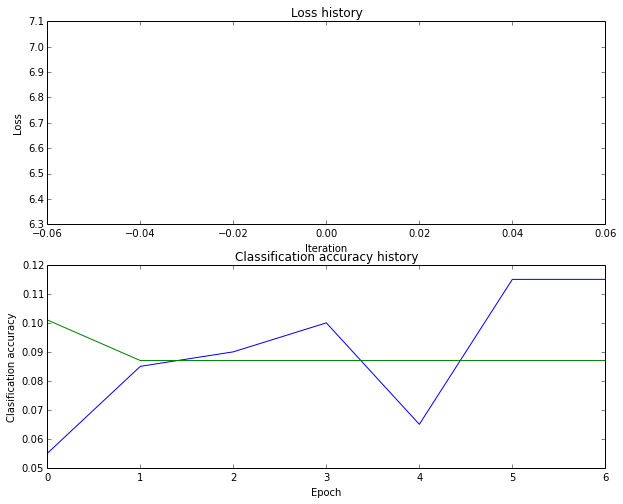

	training accuracy: (10.026531), validation accuracy: (8.700000)
(73) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


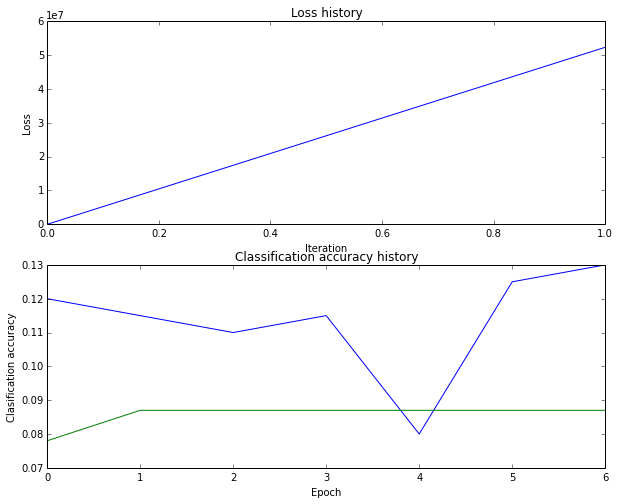

	training accuracy: (10.026531), validation accuracy: (8.700000)
(74) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


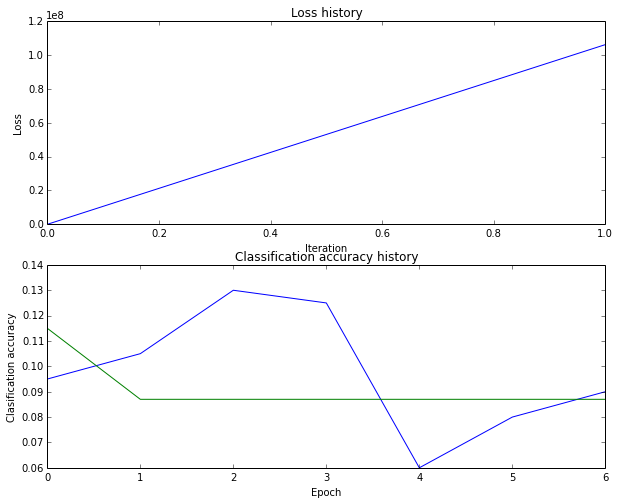

	training accuracy: (10.026531), validation accuracy: (8.700000)
(75) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


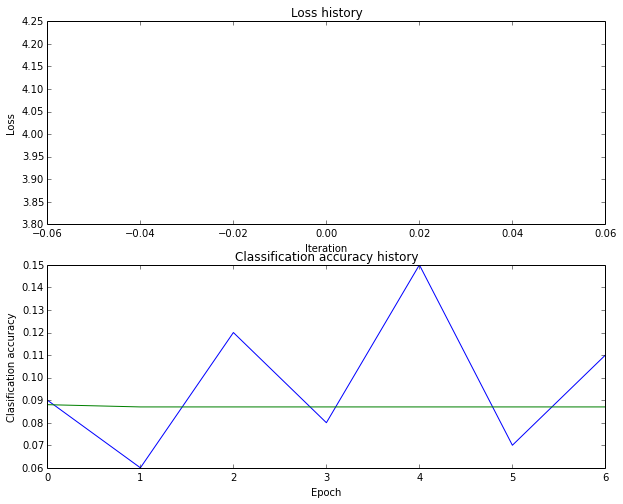

	training accuracy: (10.026531), validation accuracy: (8.700000)
(76) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


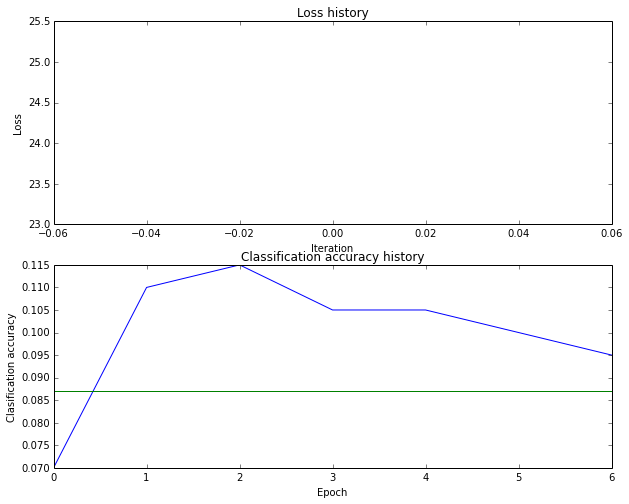

	training accuracy: (10.026531), validation accuracy: (8.700000)
(77) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


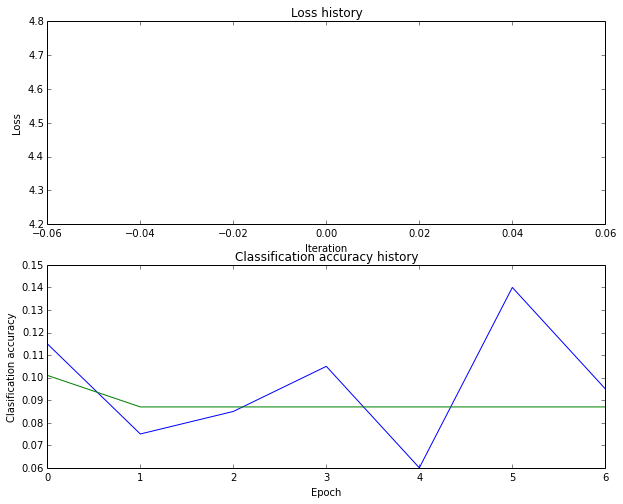

	training accuracy: (10.026531), validation accuracy: (8.700000)
(78) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


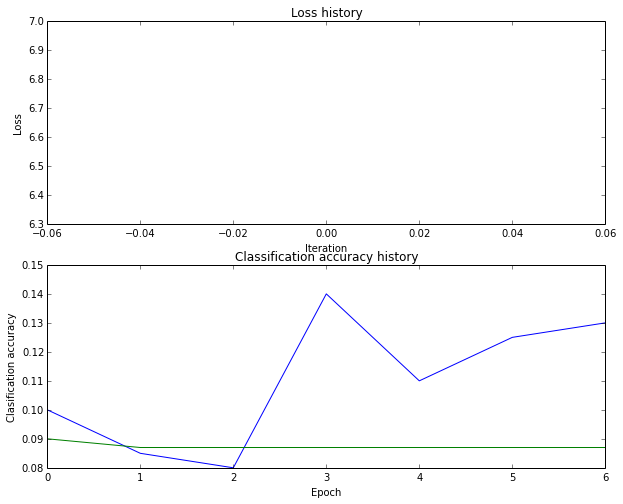

	training accuracy: (10.026531), validation accuracy: (8.700000)
(79) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


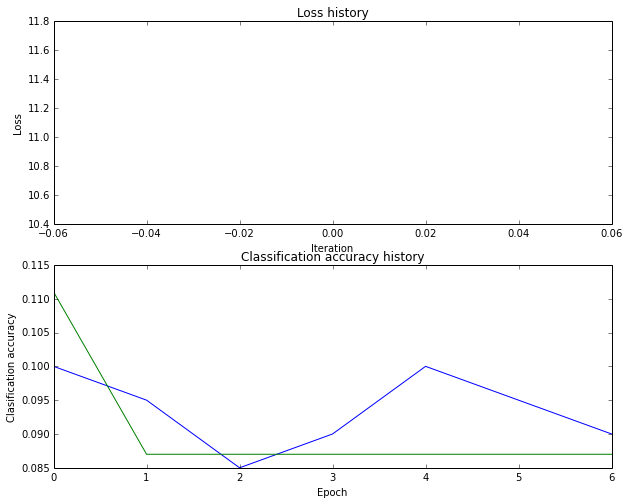

	training accuracy: (10.026531), validation accuracy: (8.700000)
(80) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:500, learn_rate:9.000000e-01)


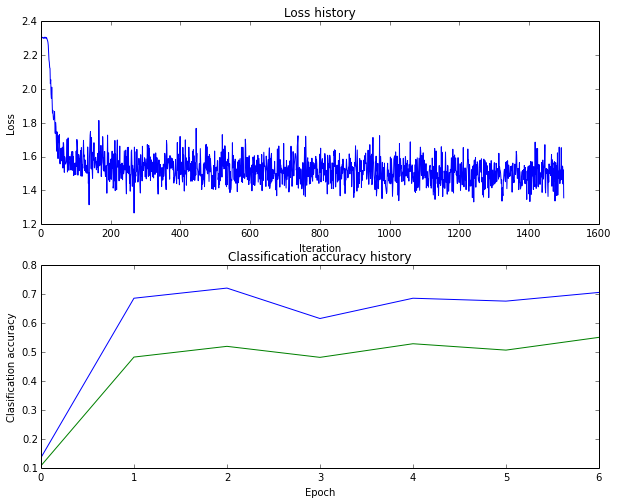

	training accuracy: (56.418367), validation accuracy: (53.700000)
(81) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:50, learn_rate:9.000000e-01)


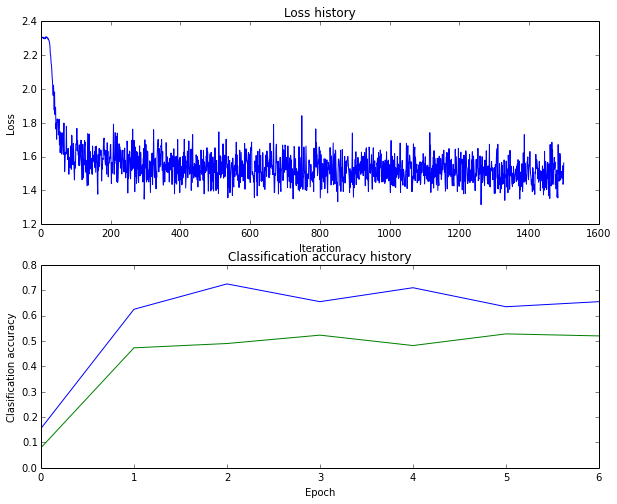

	training accuracy: (54.457143), validation accuracy: (53.700000)
(82) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:100, learn_rate:9.000000e-01)


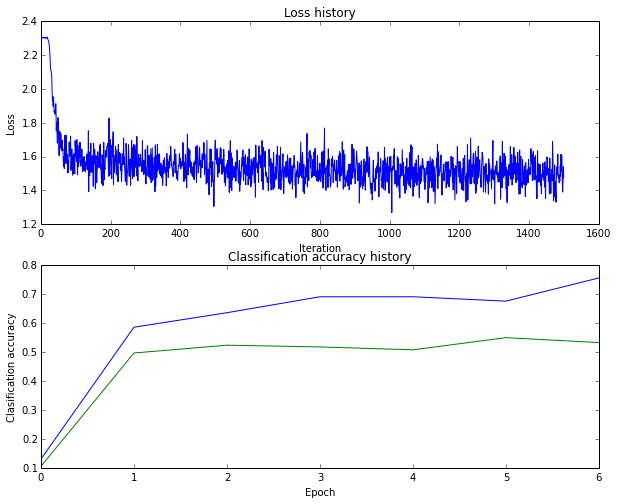

	training accuracy: (54.153061), validation accuracy: (48.800000)
(83) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:200, learn_rate:9.000000e-01)


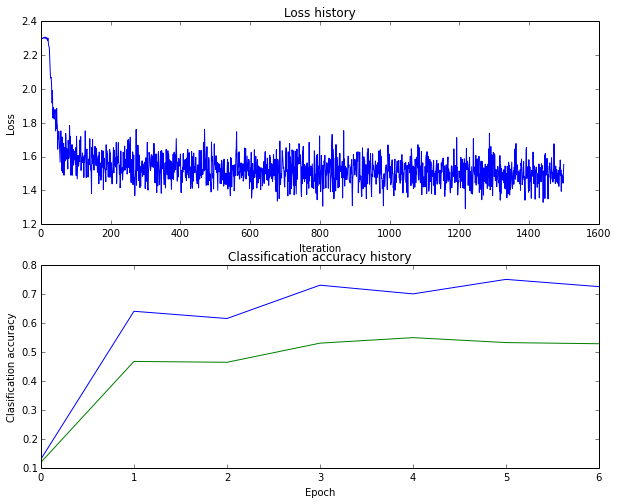

	training accuracy: (55.257143), validation accuracy: (52.200000)
(84) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:500, learn_rate:9.000000e-01)


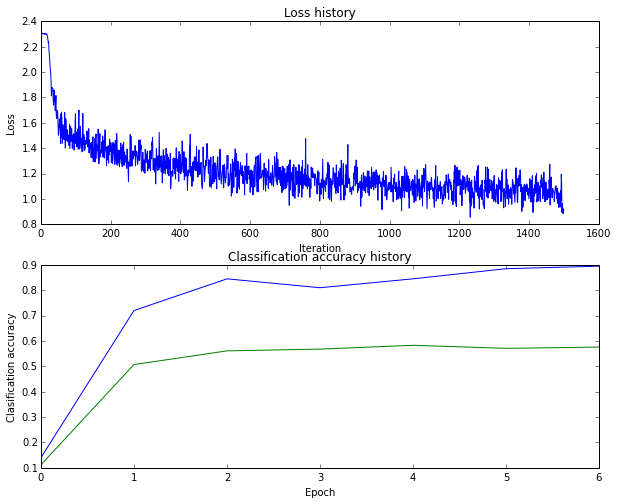

	training accuracy: (70.465306), validation accuracy: (58.900000)
(85) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:50, learn_rate:9.000000e-01)


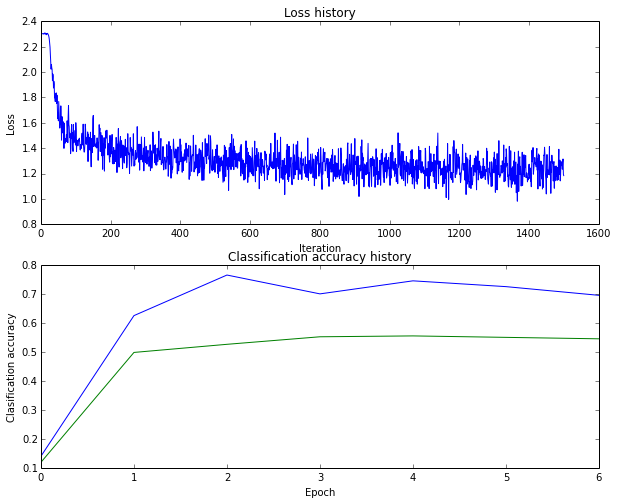

	training accuracy: (60.136735), validation accuracy: (56.600000)
(86) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:100, learn_rate:9.000000e-01)


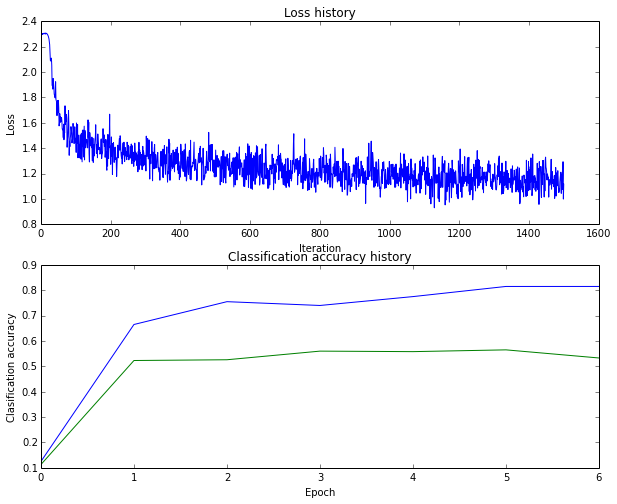

	training accuracy: (63.704082), validation accuracy: (55.800000)
(87) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:200, learn_rate:9.000000e-01)


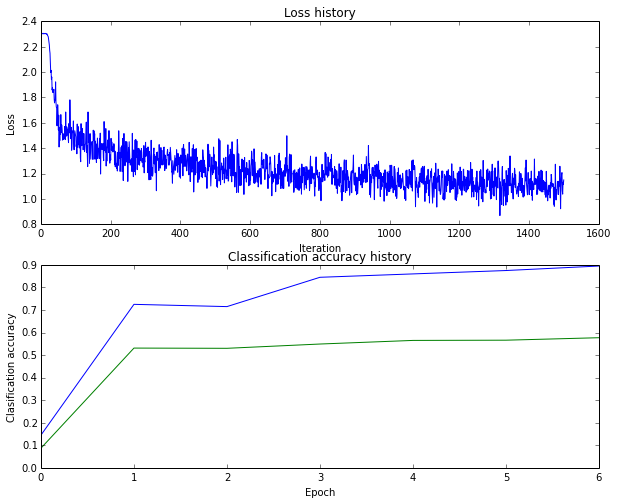

	training accuracy: (66.793878), validation accuracy: (56.300000)
(88) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


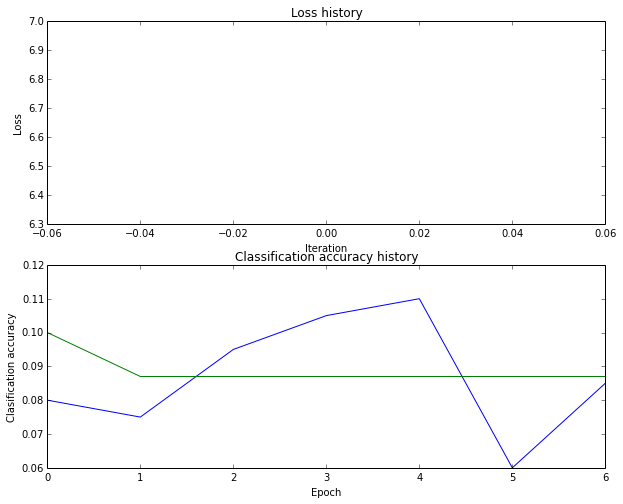

	training accuracy: (10.026531), validation accuracy: (8.700000)
(89) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


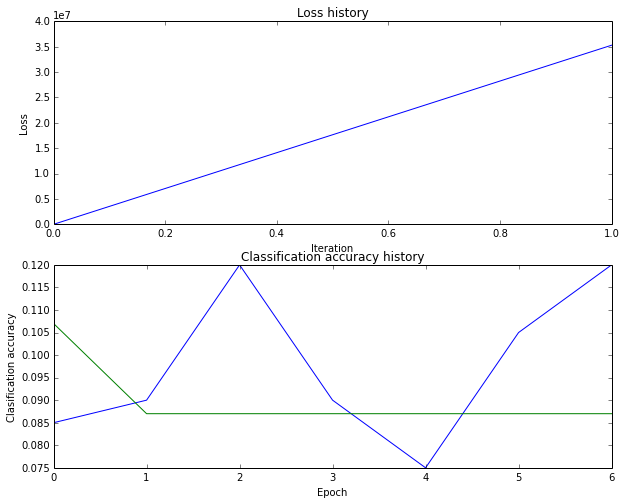

	training accuracy: (10.026531), validation accuracy: (8.700000)
(90) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


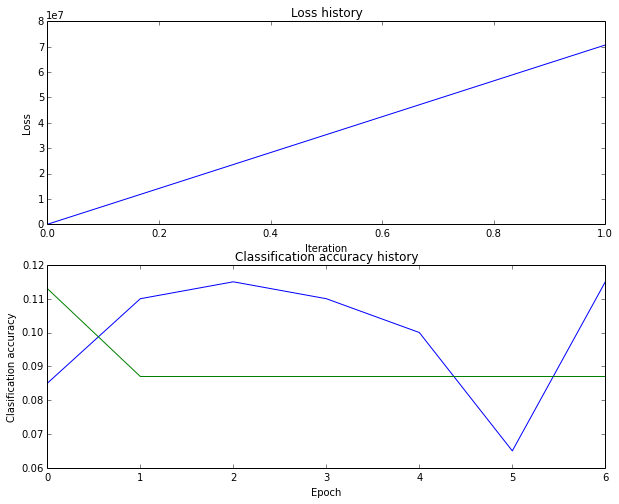

	training accuracy: (10.026531), validation accuracy: (8.700000)
(91) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


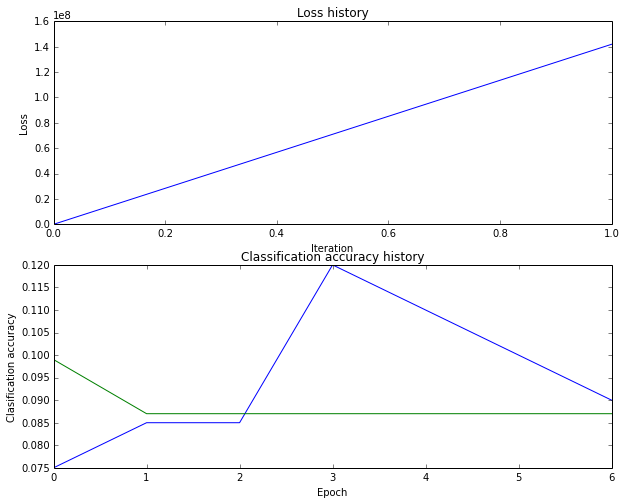

	training accuracy: (10.026531), validation accuracy: (8.700000)
(92) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


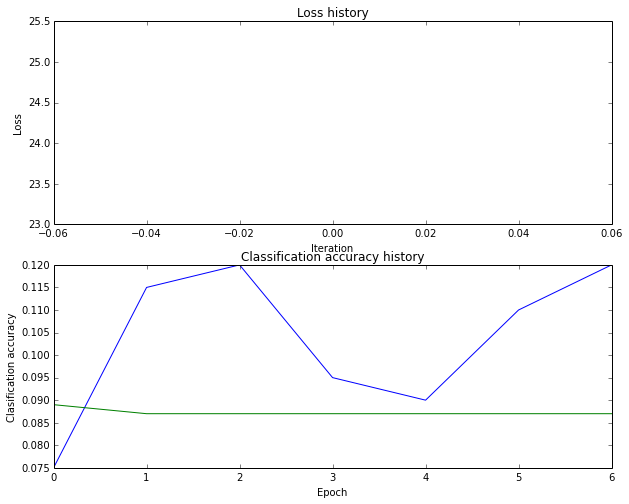

	training accuracy: (10.026531), validation accuracy: (8.700000)
(93) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


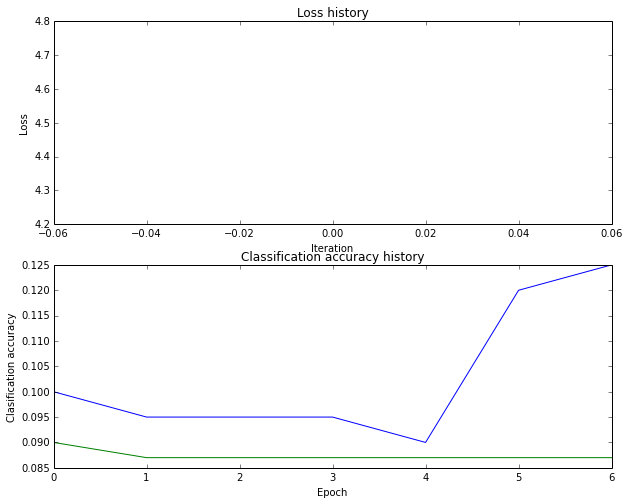

	training accuracy: (10.026531), validation accuracy: (8.700000)
(94) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


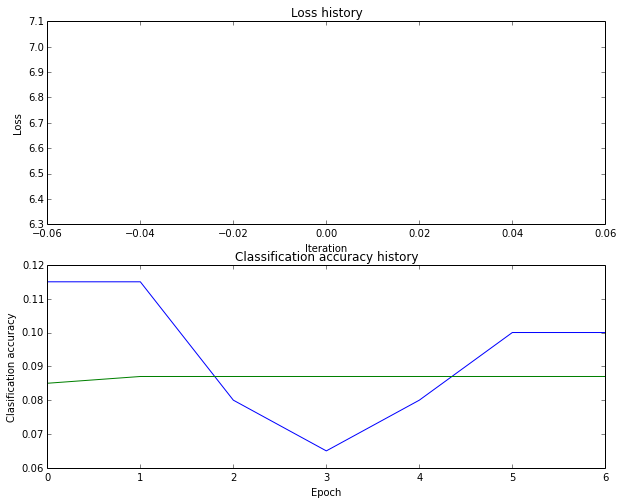

	training accuracy: (10.026531), validation accuracy: (8.700000)
(95) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


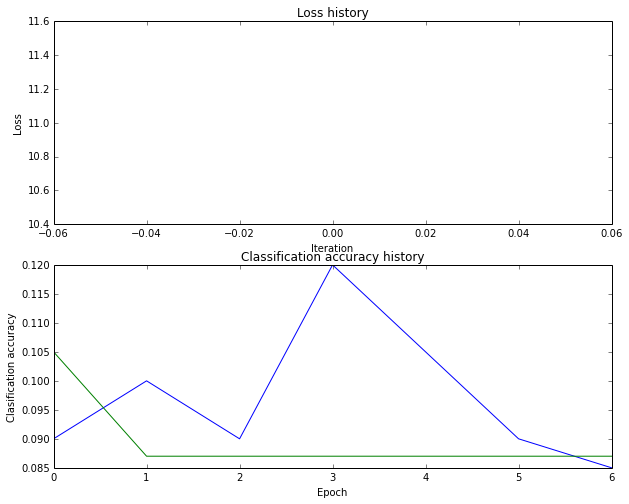

	training accuracy: (10.026531), validation accuracy: (8.700000)
(96) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:500, learn_rate:2.000000e-06)


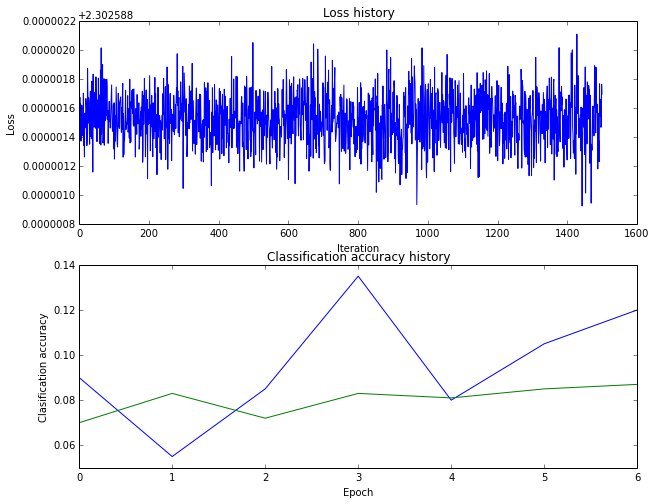

	training accuracy: (9.702041), validation accuracy: (9.100000)
(97) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:50, learn_rate:2.000000e-06)


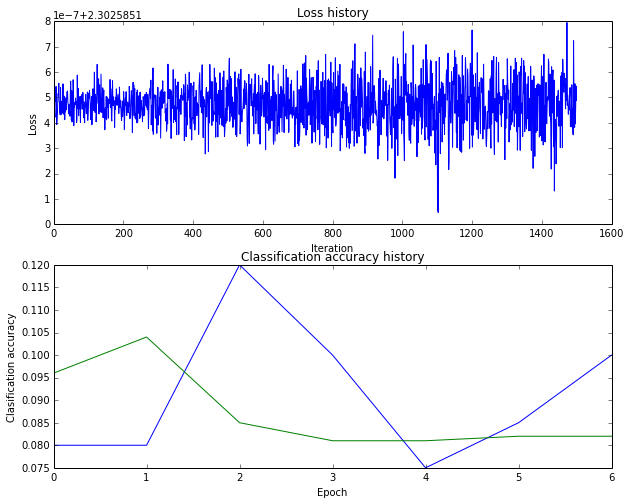

	training accuracy: (9.902041), validation accuracy: (8.400000)
(98) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:100, learn_rate:2.000000e-06)


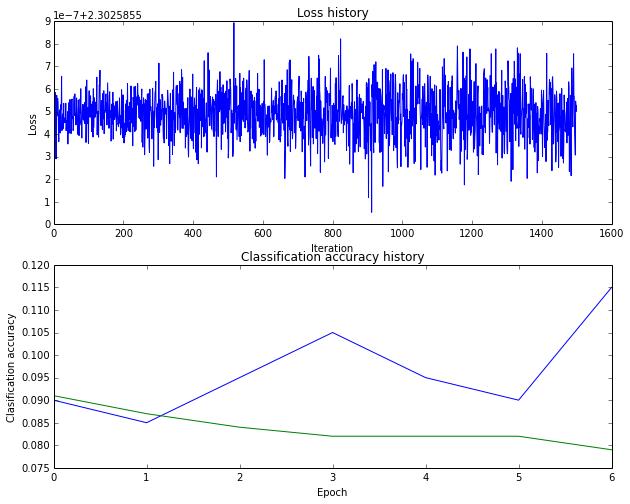

	training accuracy: (10.104082), validation accuracy: (7.900000)
(99) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:200, learn_rate:2.000000e-06)


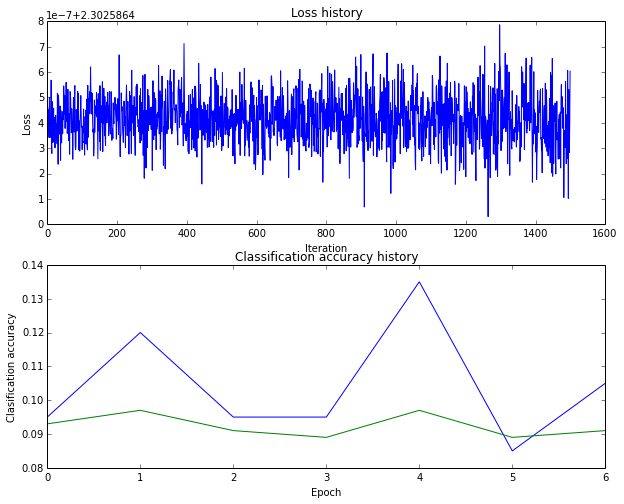

	training accuracy: (9.675510), validation accuracy: (8.300000)
(100) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:500, learn_rate:2.000000e-06)


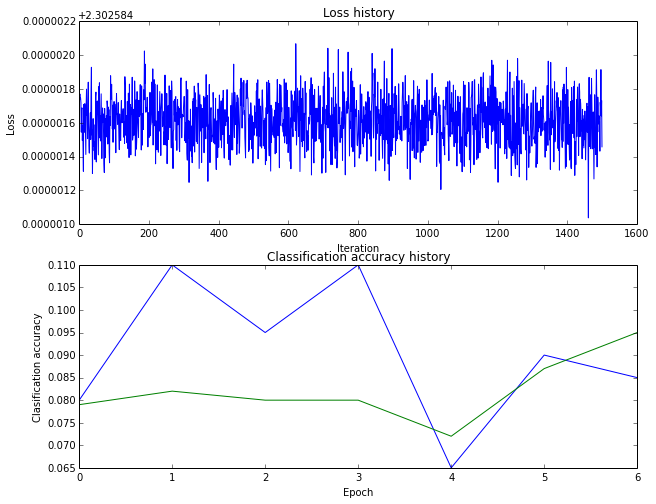

	training accuracy: (8.855102), validation accuracy: (9.500000)
(101) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:50, learn_rate:2.000000e-06)


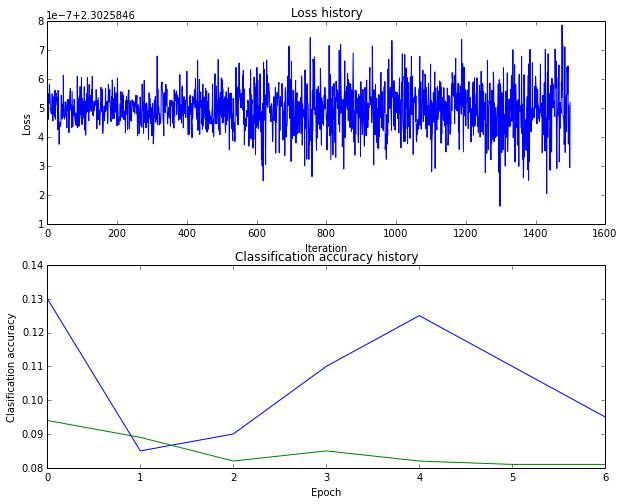

	training accuracy: (10.044898), validation accuracy: (8.100000)
(102) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:100, learn_rate:2.000000e-06)


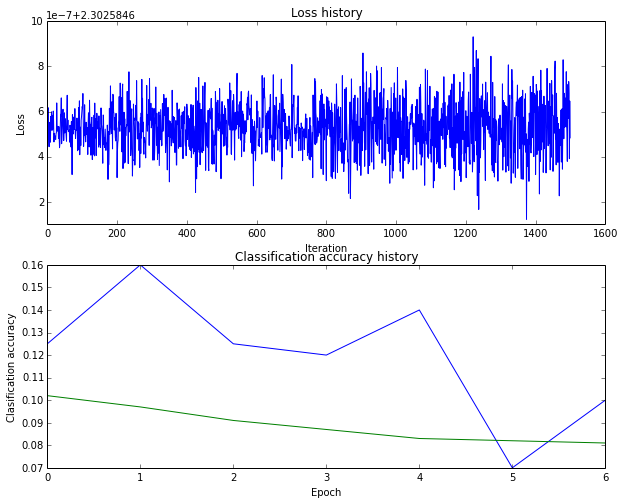

	training accuracy: (10.263265), validation accuracy: (8.100000)
(103) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:200, learn_rate:2.000000e-06)


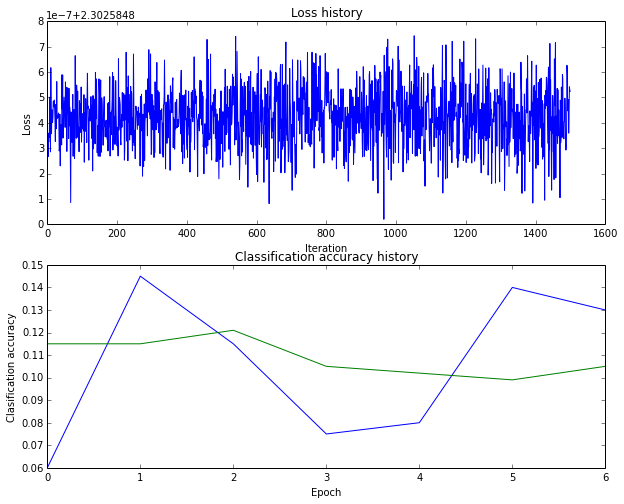

	training accuracy: (10.020408), validation accuracy: (10.200000)
(104) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


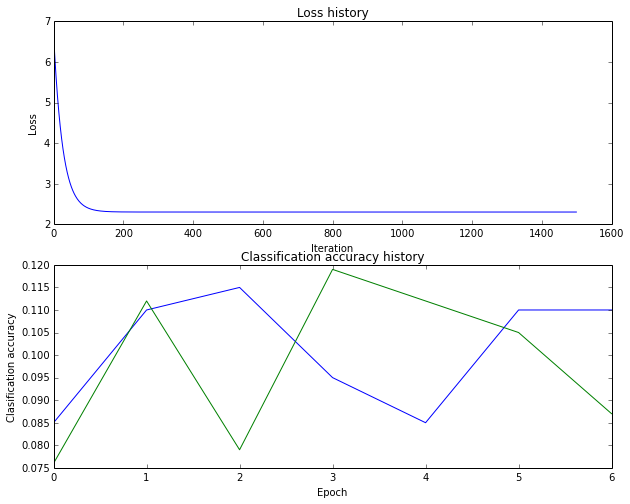

	training accuracy: (10.026531), validation accuracy: (8.700000)
(105) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


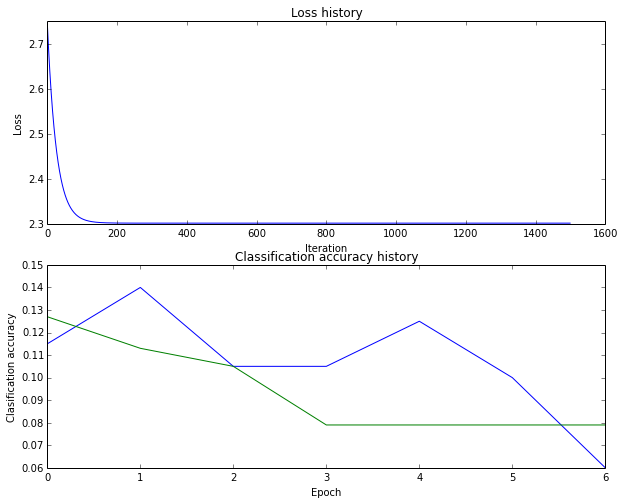

	training accuracy: (10.042857), validation accuracy: (7.900000)
(106) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


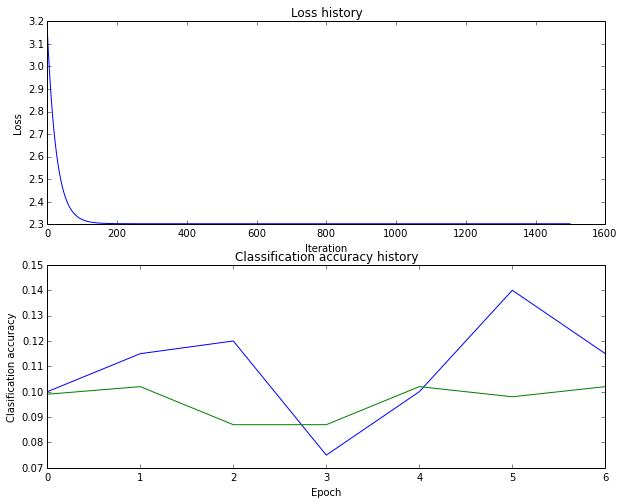

	training accuracy: (9.995918), validation accuracy: (10.200000)
(107) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


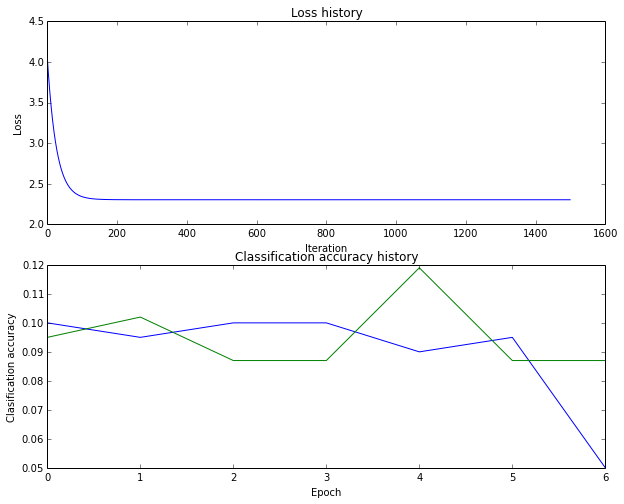

	training accuracy: (10.026531), validation accuracy: (8.700000)
(108) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


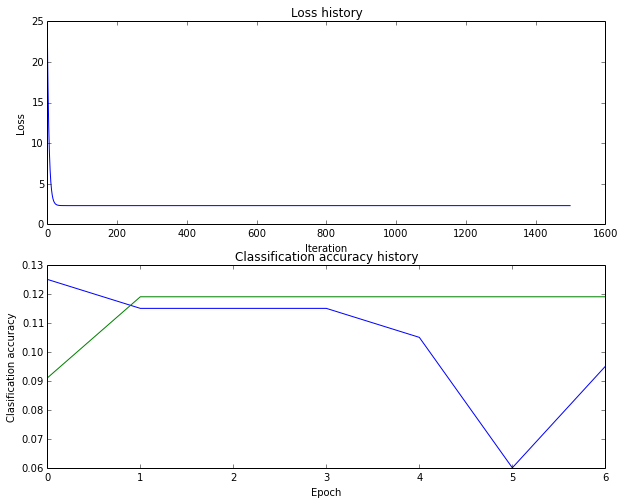

	training accuracy: (9.961224), validation accuracy: (11.900000)
(109) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


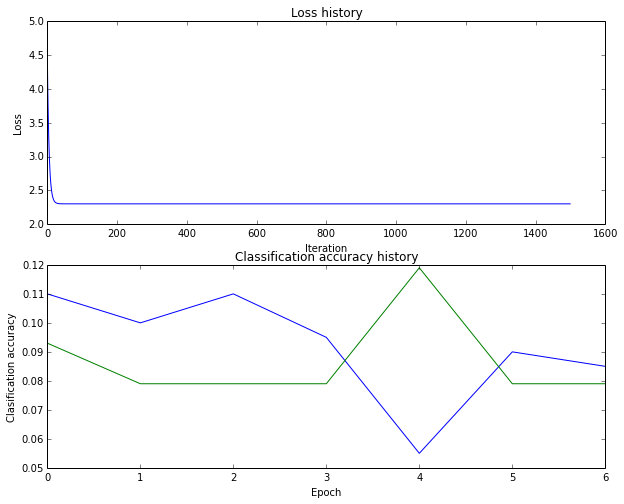

	training accuracy: (10.042857), validation accuracy: (7.900000)
(110) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


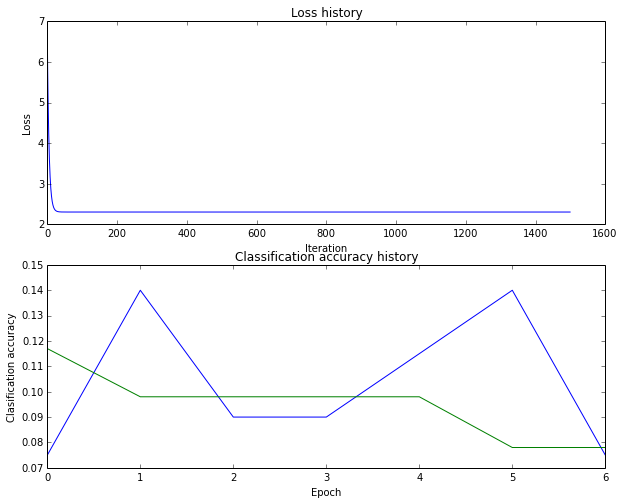

	training accuracy: (10.044898), validation accuracy: (7.800000)
(111) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


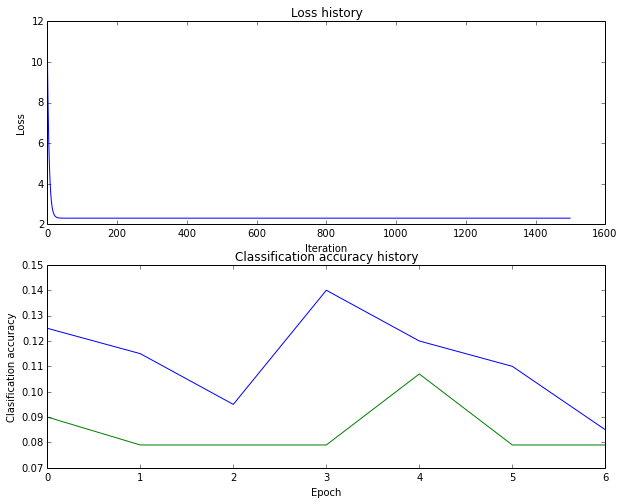

	training accuracy: (10.042857), validation accuracy: (7.900000)
(112) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:500, learn_rate:5.000000e-06)


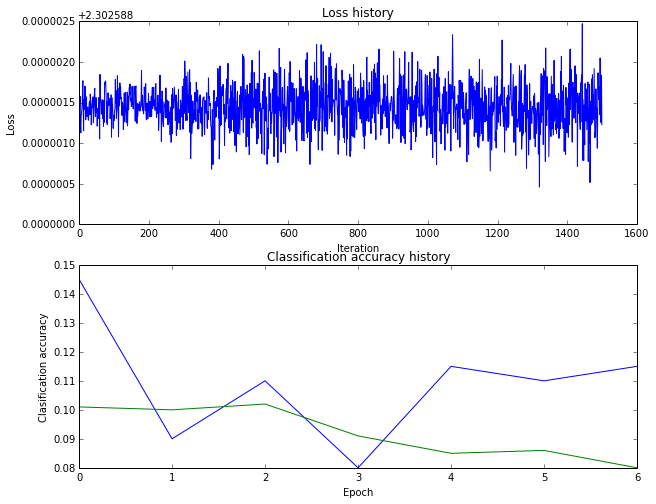

	training accuracy: (10.338776), validation accuracy: (8.100000)
(113) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:50, learn_rate:5.000000e-06)


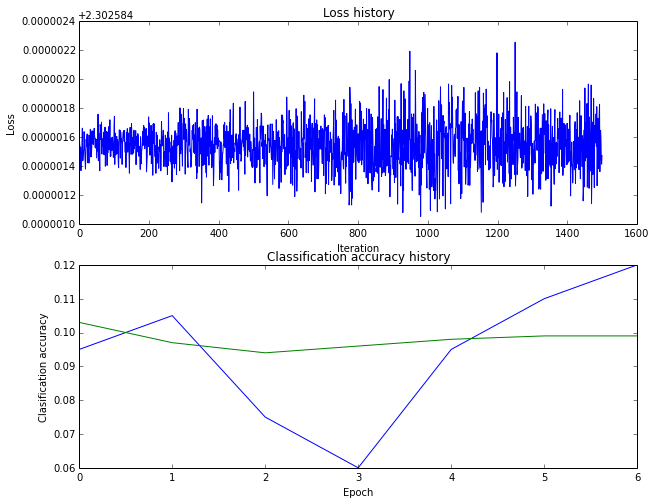

	training accuracy: (9.934694), validation accuracy: (9.800000)
(114) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:100, learn_rate:5.000000e-06)


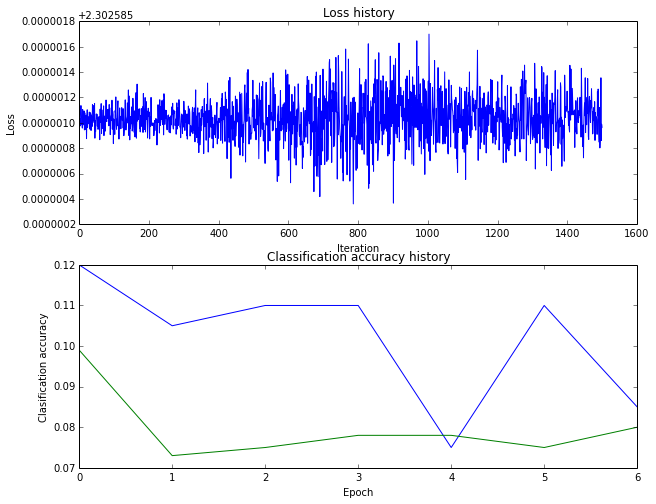

	training accuracy: (9.055102), validation accuracy: (6.700000)
(115) of (384)
Running Train and validation for (bins:20, reg:1.000000e-02, hidden_size:200, learn_rate:5.000000e-06)


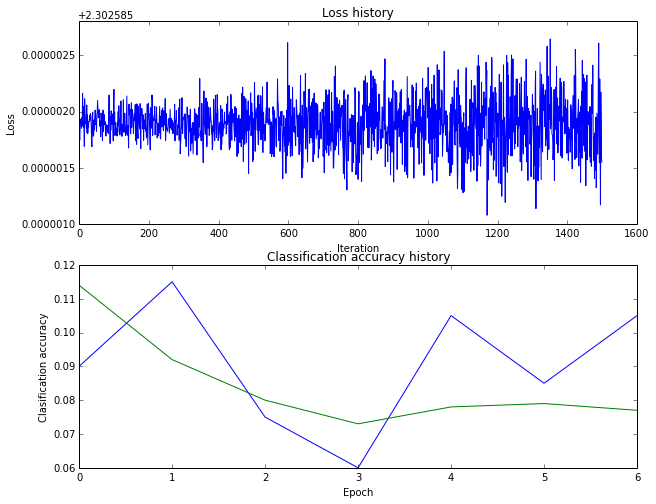

	training accuracy: (10.012245), validation accuracy: (7.900000)
(116) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:500, learn_rate:5.000000e-06)


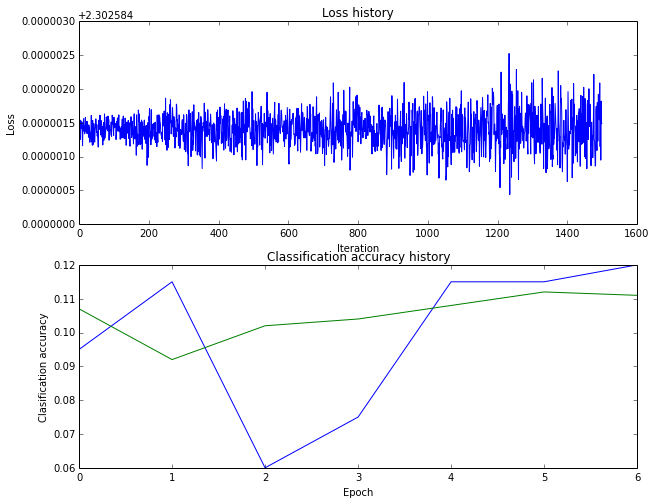

	training accuracy: (10.446939), validation accuracy: (11.400000)
(117) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:50, learn_rate:5.000000e-06)


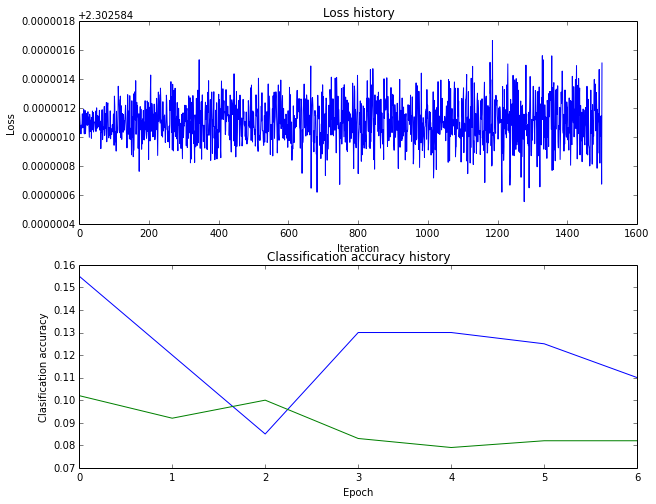

	training accuracy: (9.997959), validation accuracy: (8.900000)
(118) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:100, learn_rate:5.000000e-06)


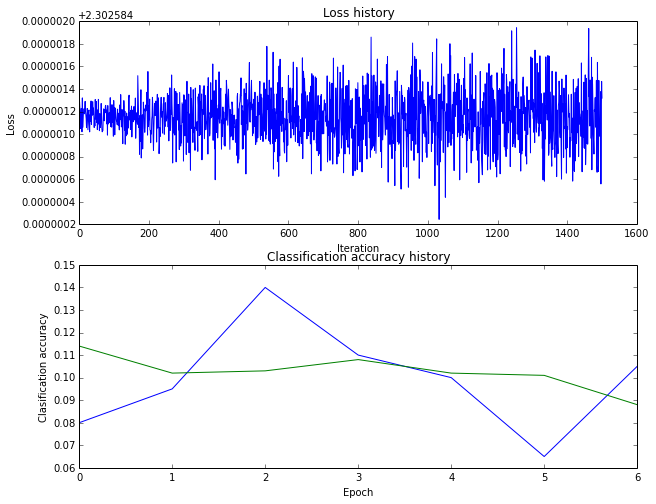

	training accuracy: (10.079592), validation accuracy: (9.100000)
(119) of (384)
Running Train and validation for (bins:20, reg:1.000000e-03, hidden_size:200, learn_rate:5.000000e-06)


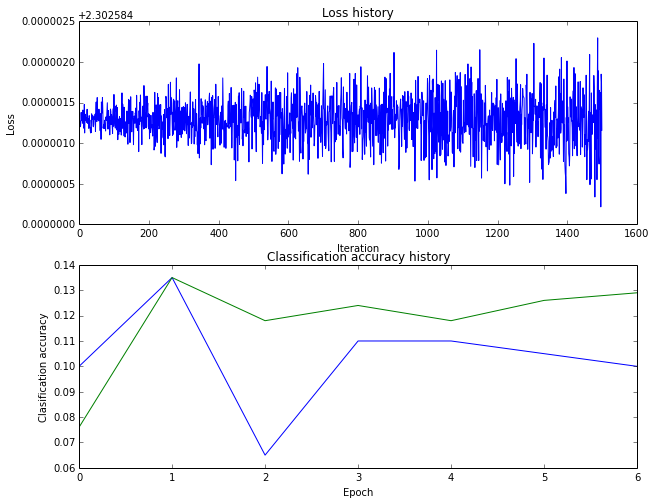

	training accuracy: (11.234694), validation accuracy: (12.900000)
(120) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


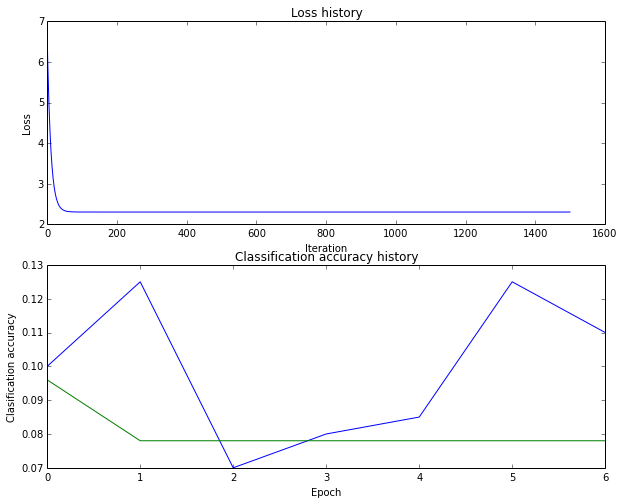

	training accuracy: (10.044898), validation accuracy: (7.800000)
(121) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


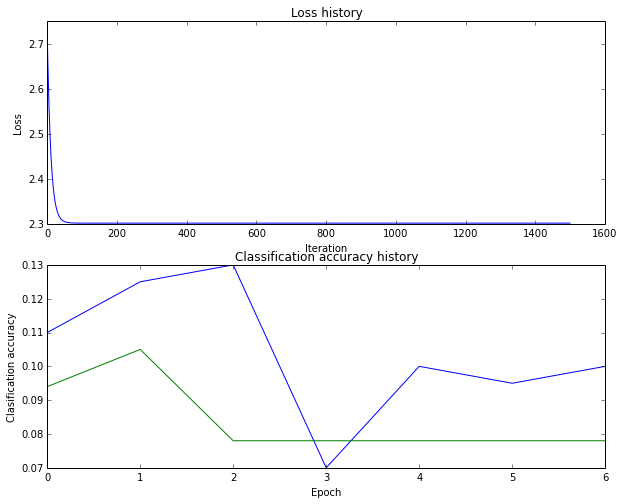

	training accuracy: (10.044898), validation accuracy: (7.800000)
(122) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


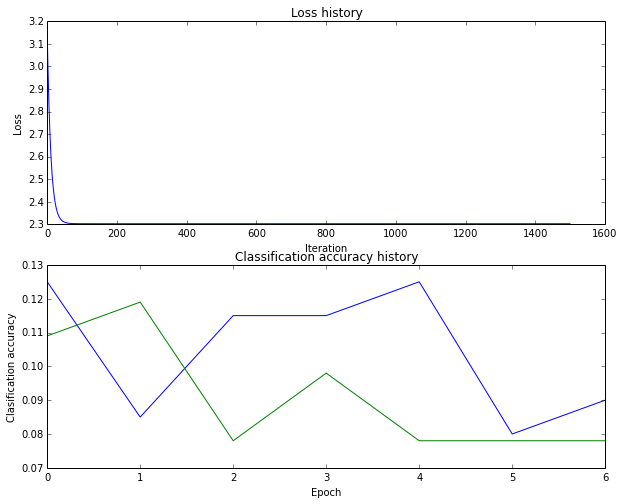

	training accuracy: (10.044898), validation accuracy: (7.800000)
(123) of (384)
Running Train and validation for (bins:20, reg:1.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


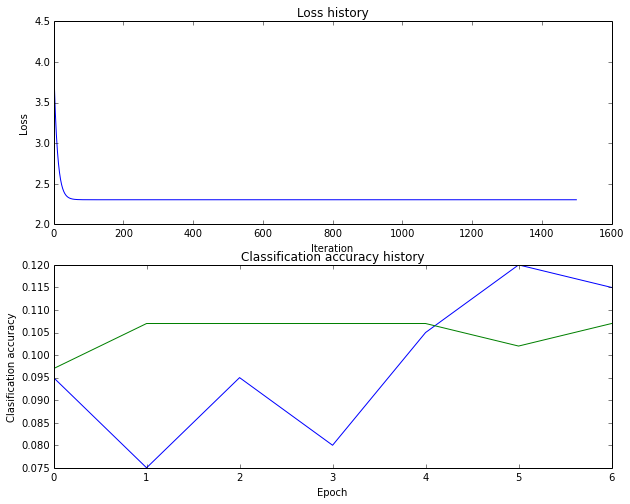

	training accuracy: (9.985714), validation accuracy: (10.700000)
(124) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


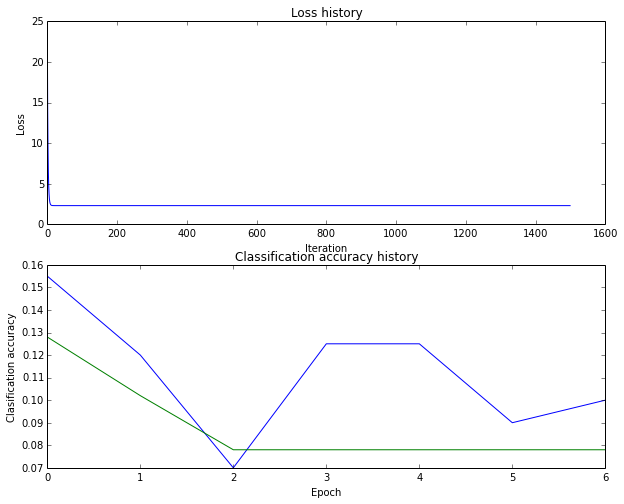

	training accuracy: (10.044898), validation accuracy: (7.800000)
(125) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


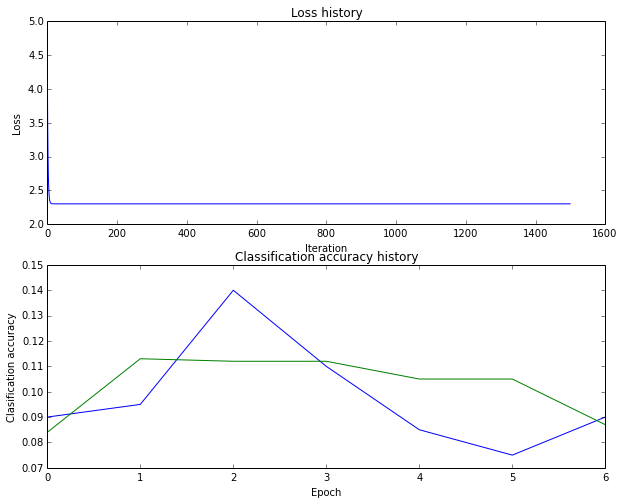

	training accuracy: (10.026531), validation accuracy: (8.700000)
(126) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


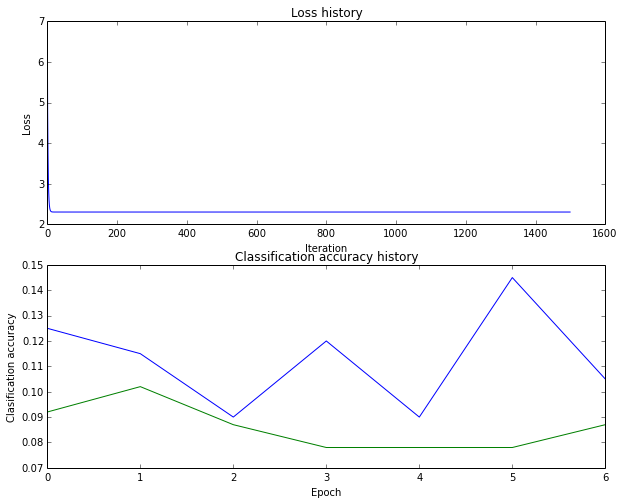

	training accuracy: (10.026531), validation accuracy: (8.700000)
(127) of (384)
Running Train and validation for (bins:20, reg:5.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


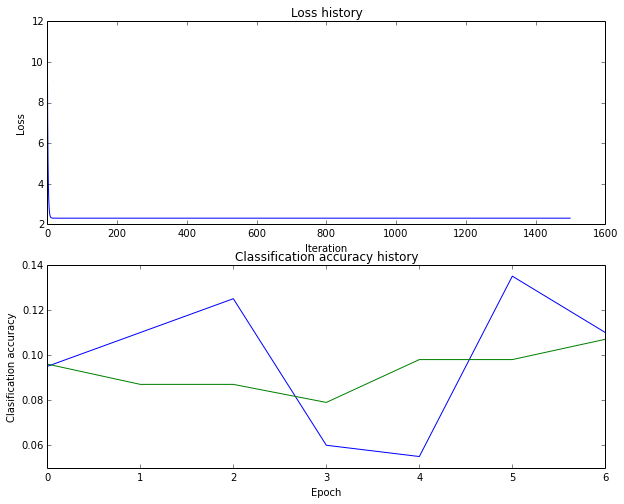

	training accuracy: (10.042857), validation accuracy: (7.900000)
(128) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:500, learn_rate:1.100000e+00)


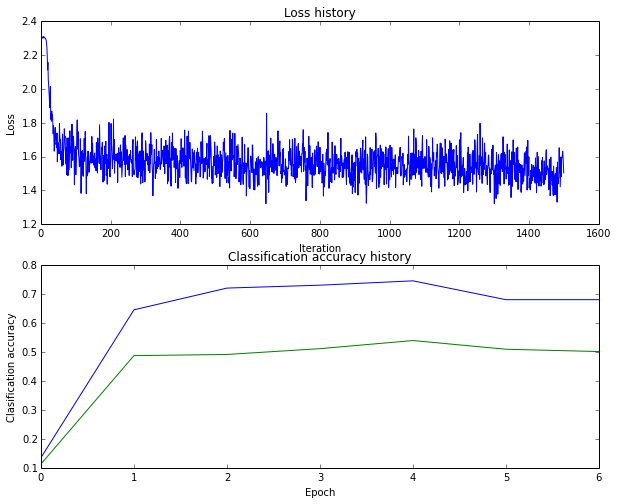

	training accuracy: (55.579592), validation accuracy: (51.800000)
(129) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:50, learn_rate:1.100000e+00)


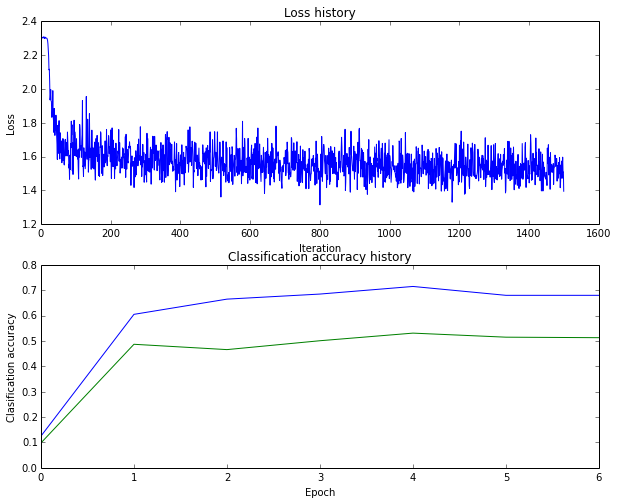

	training accuracy: (54.044898), validation accuracy: (53.000000)
(130) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:100, learn_rate:1.100000e+00)


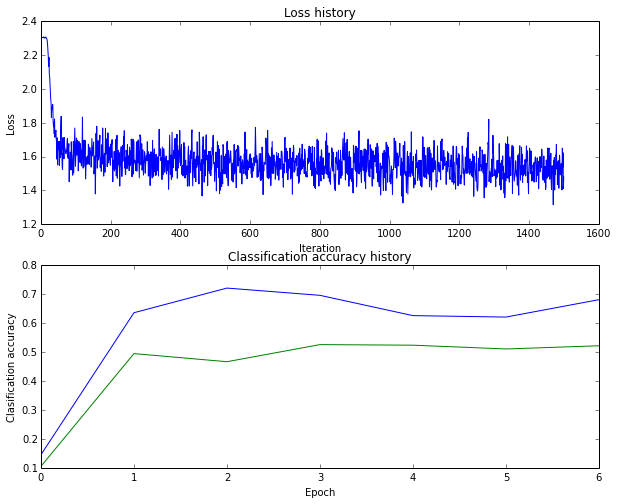

	training accuracy: (54.942857), validation accuracy: (53.500000)
(131) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:200, learn_rate:1.100000e+00)


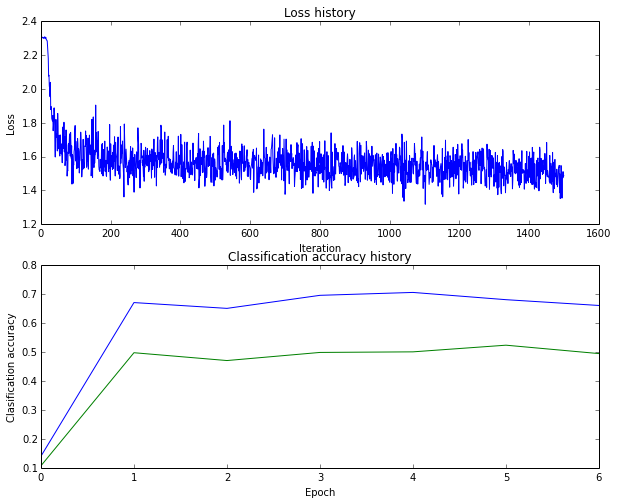

	training accuracy: (55.683673), validation accuracy: (52.700000)
(132) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:500, learn_rate:1.100000e+00)


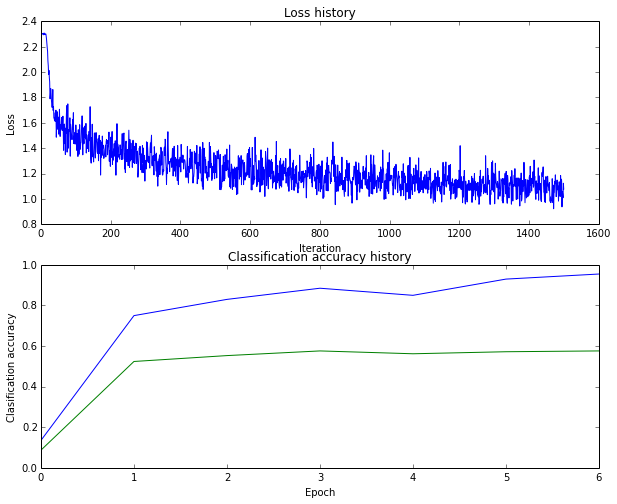

	training accuracy: (70.687755), validation accuracy: (55.300000)
(133) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:50, learn_rate:1.100000e+00)


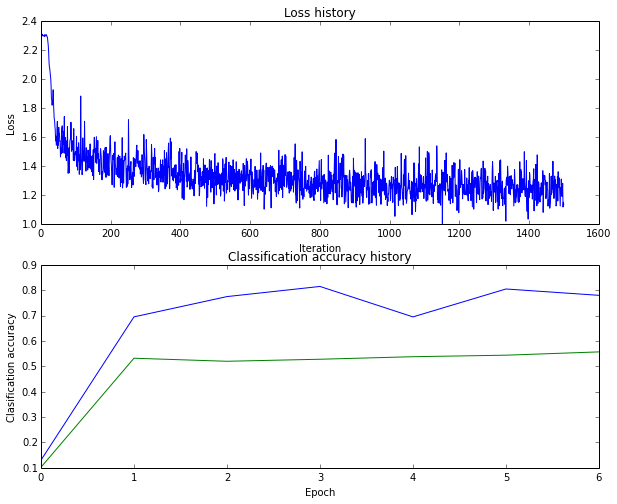

	training accuracy: (59.236735), validation accuracy: (55.100000)
(134) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:100, learn_rate:1.100000e+00)


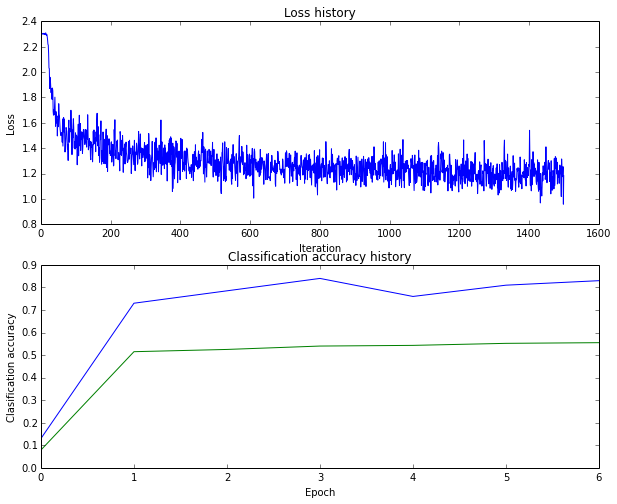

	training accuracy: (63.708163), validation accuracy: (56.000000)
(135) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:200, learn_rate:1.100000e+00)


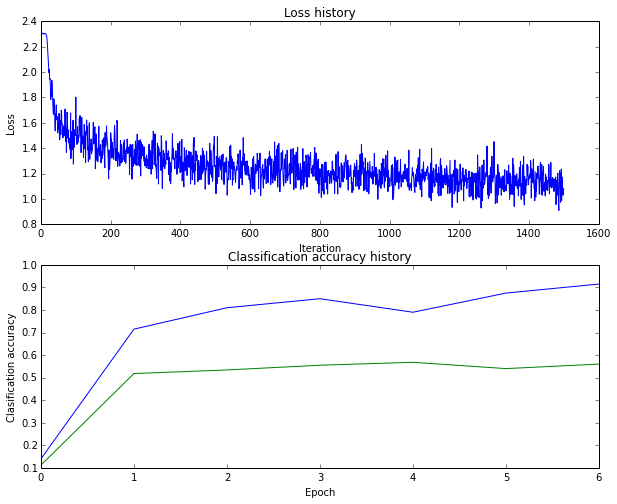

	training accuracy: (67.126531), validation accuracy: (56.500000)
(136) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


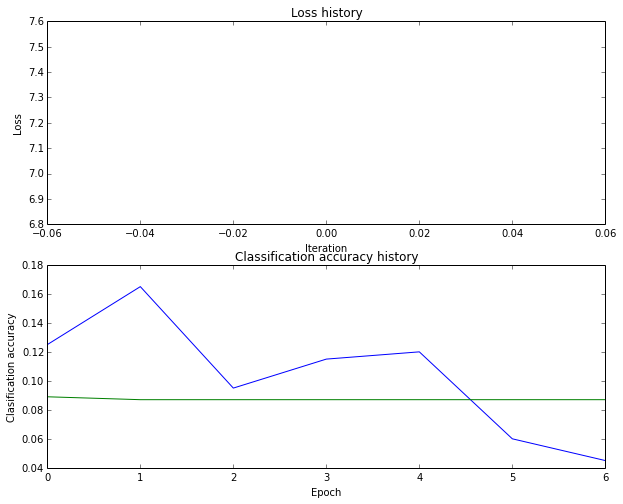

	training accuracy: (10.026531), validation accuracy: (8.700000)
(137) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


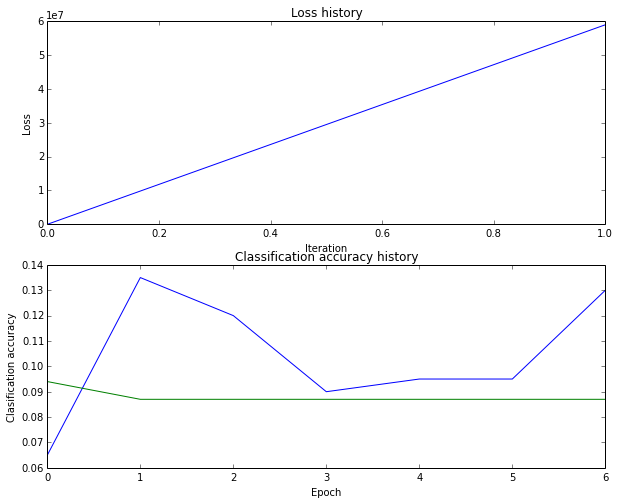

	training accuracy: (10.026531), validation accuracy: (8.700000)
(138) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


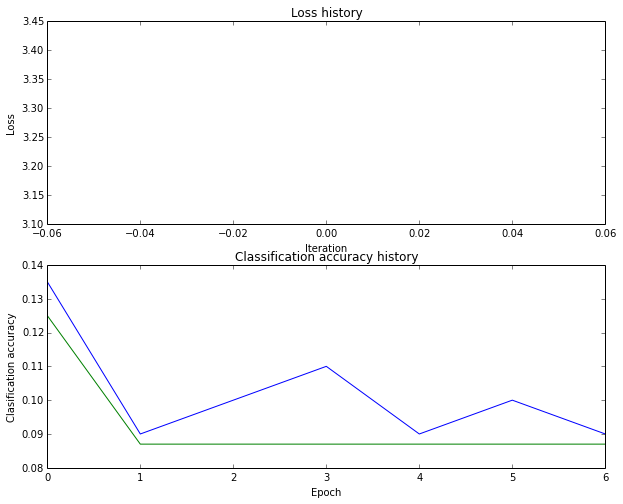

	training accuracy: (10.026531), validation accuracy: (8.700000)
(139) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


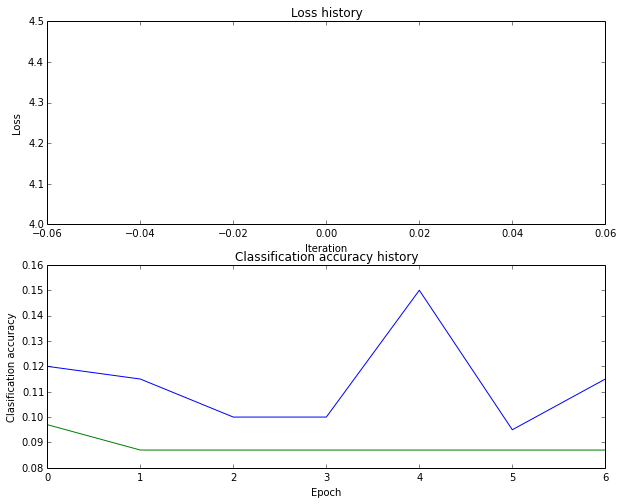

	training accuracy: (10.026531), validation accuracy: (8.700000)
(140) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


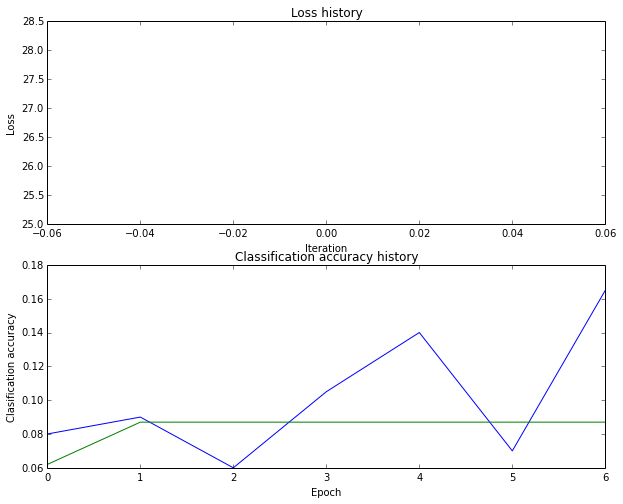

	training accuracy: (10.026531), validation accuracy: (8.700000)
(141) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


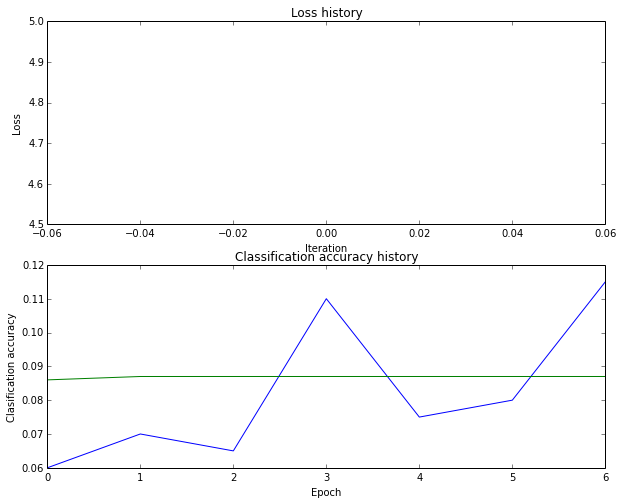

	training accuracy: (10.026531), validation accuracy: (8.700000)
(142) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


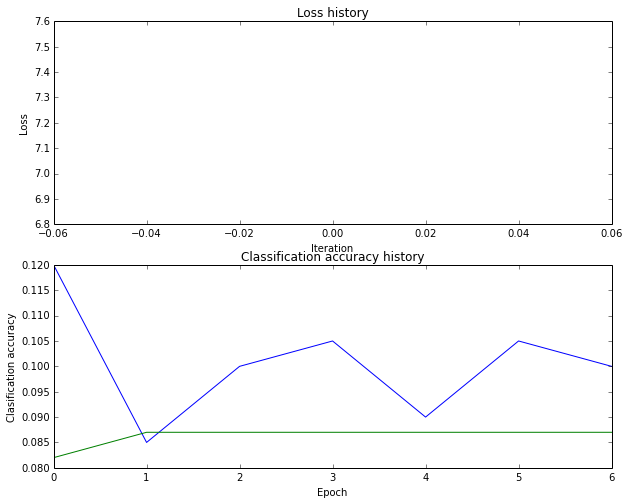

	training accuracy: (10.026531), validation accuracy: (8.700000)
(143) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


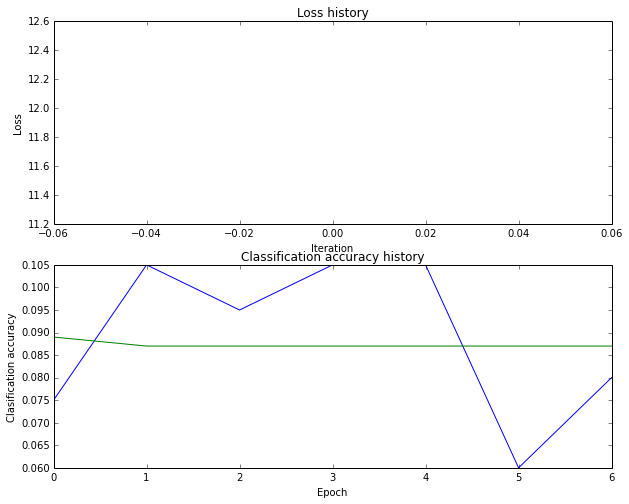

	training accuracy: (10.026531), validation accuracy: (8.700000)
(144) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:500, learn_rate:9.000000e-01)


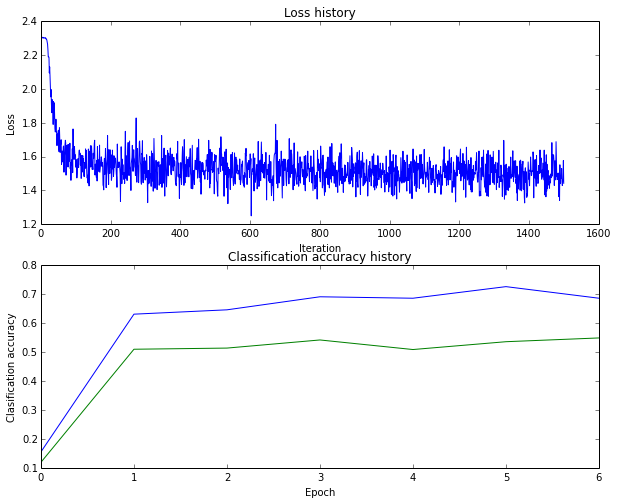

	training accuracy: (56.157143), validation accuracy: (55.500000)
(145) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:50, learn_rate:9.000000e-01)


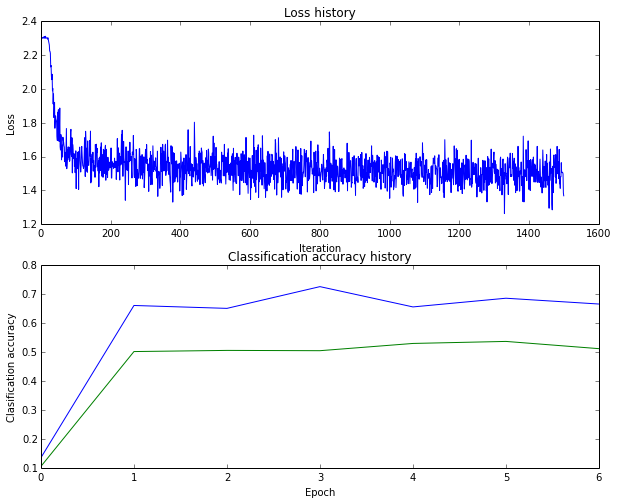

	training accuracy: (54.246939), validation accuracy: (51.700000)
(146) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:100, learn_rate:9.000000e-01)


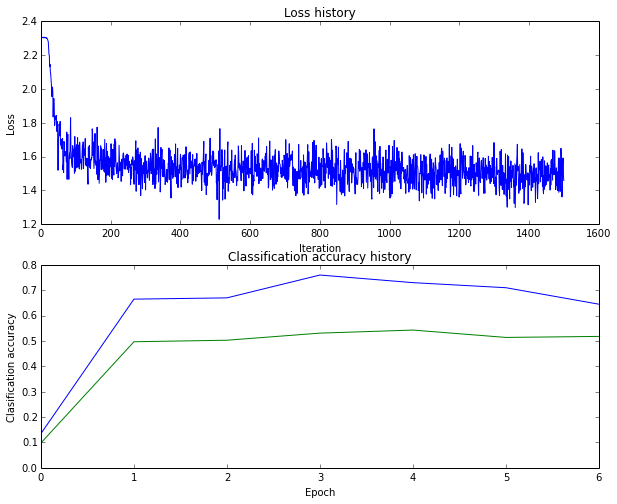

	training accuracy: (55.122449), validation accuracy: (54.100000)
(147) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:200, learn_rate:9.000000e-01)


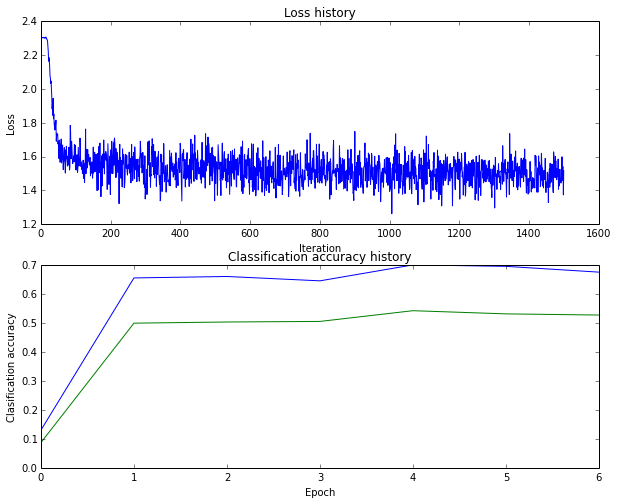

	training accuracy: (56.728571), validation accuracy: (53.900000)
(148) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:500, learn_rate:9.000000e-01)


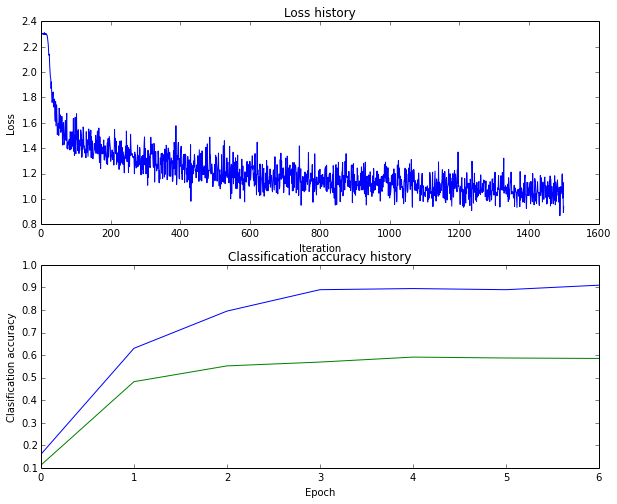

	training accuracy: (70.789796), validation accuracy: (57.400000)
(149) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:50, learn_rate:9.000000e-01)


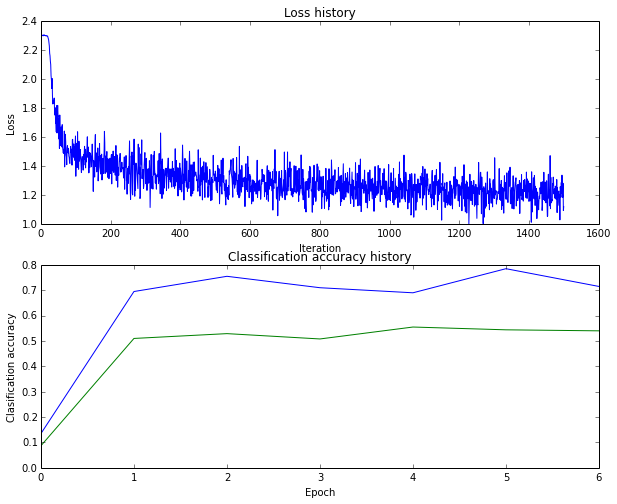

	training accuracy: (60.110204), validation accuracy: (55.600000)
(150) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:100, learn_rate:9.000000e-01)


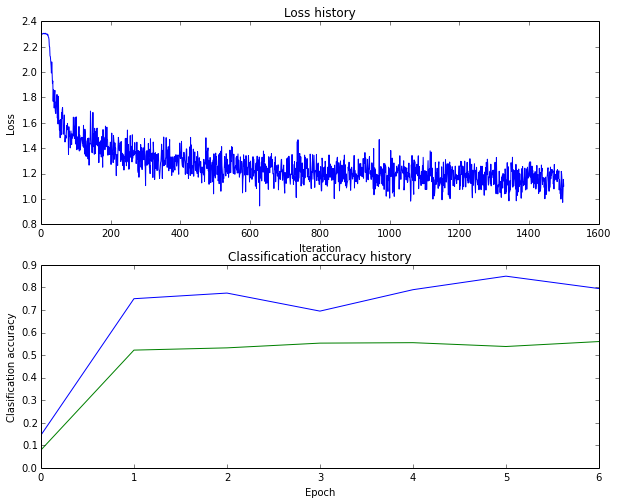

	training accuracy: (63.997959), validation accuracy: (57.200000)
(151) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:200, learn_rate:9.000000e-01)


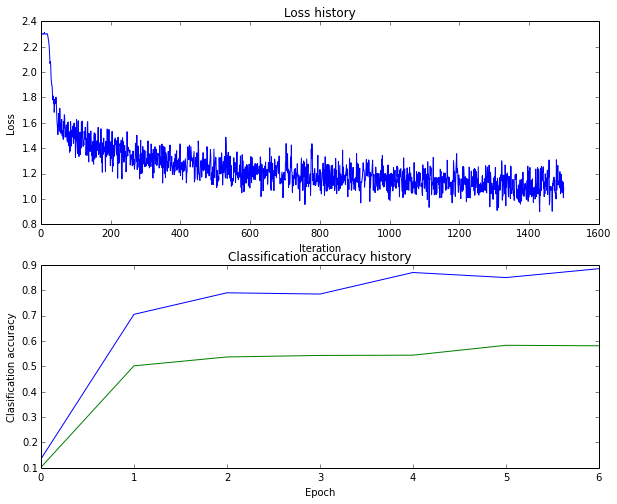

	training accuracy: (64.938776), validation accuracy: (56.600000)
(152) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


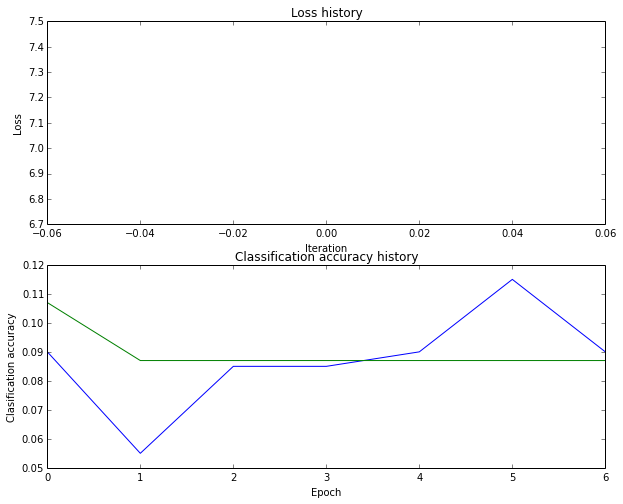

	training accuracy: (10.026531), validation accuracy: (8.700000)
(153) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


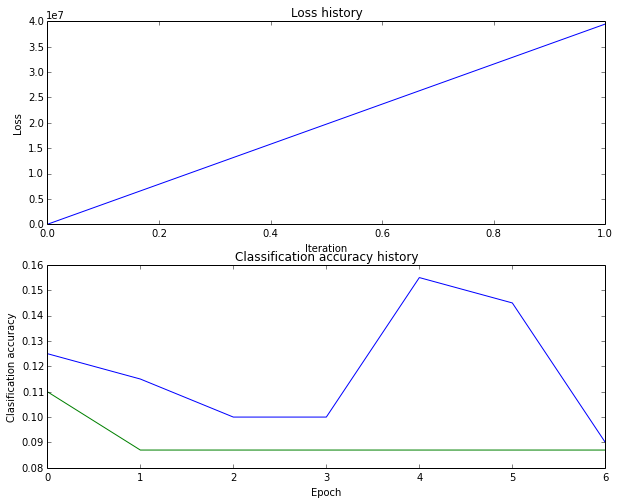

	training accuracy: (10.026531), validation accuracy: (8.700000)
(154) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


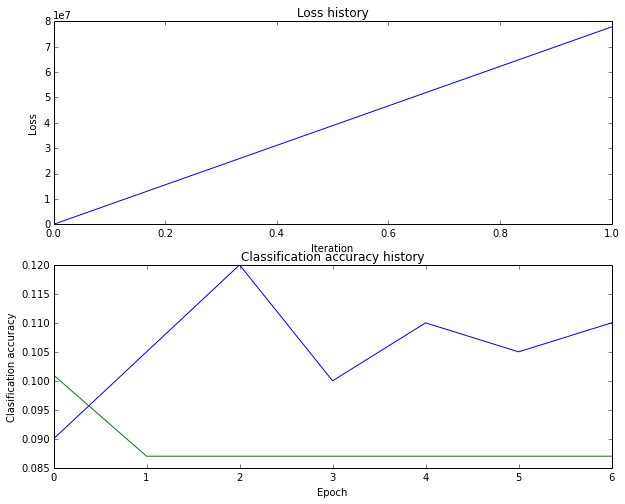

	training accuracy: (10.026531), validation accuracy: (8.700000)
(155) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


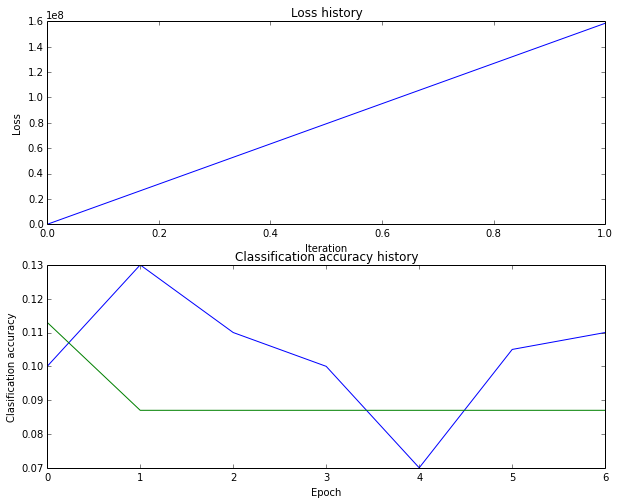

	training accuracy: (10.026531), validation accuracy: (8.700000)
(156) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


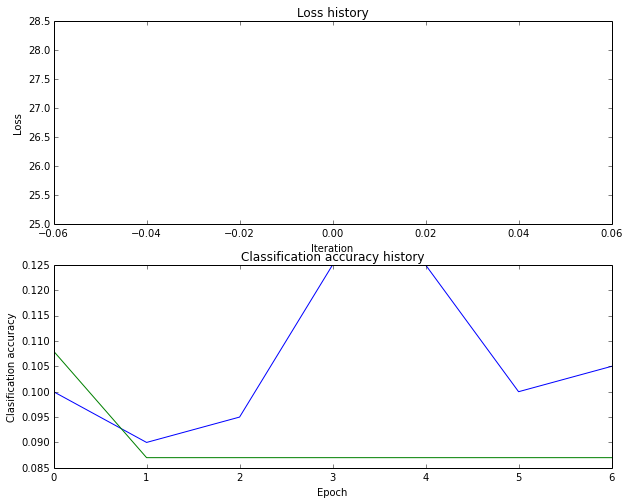

	training accuracy: (10.026531), validation accuracy: (8.700000)
(157) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


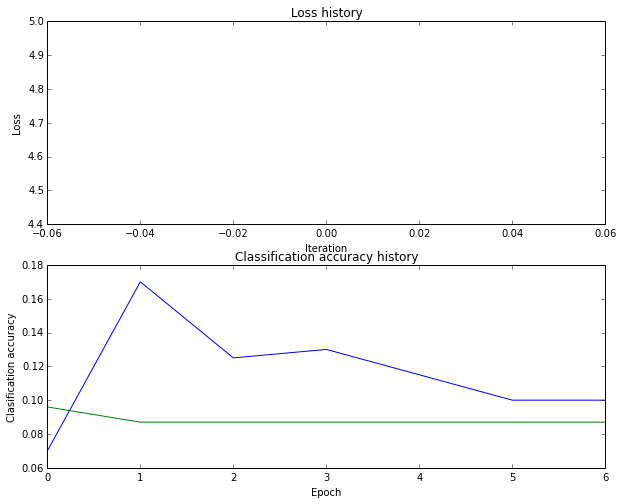

	training accuracy: (10.026531), validation accuracy: (8.700000)
(158) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


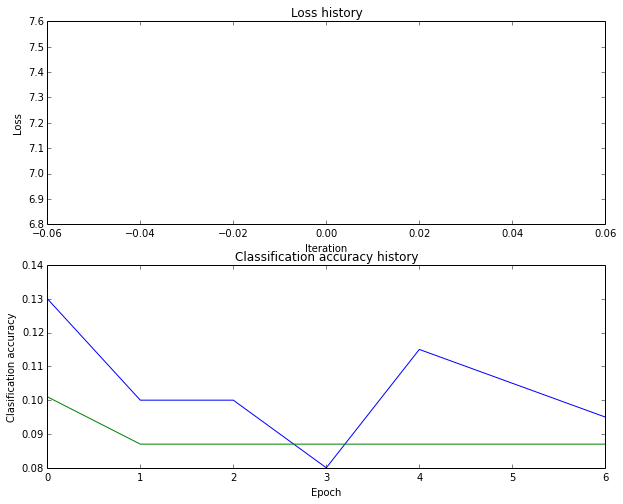

	training accuracy: (10.026531), validation accuracy: (8.700000)
(159) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


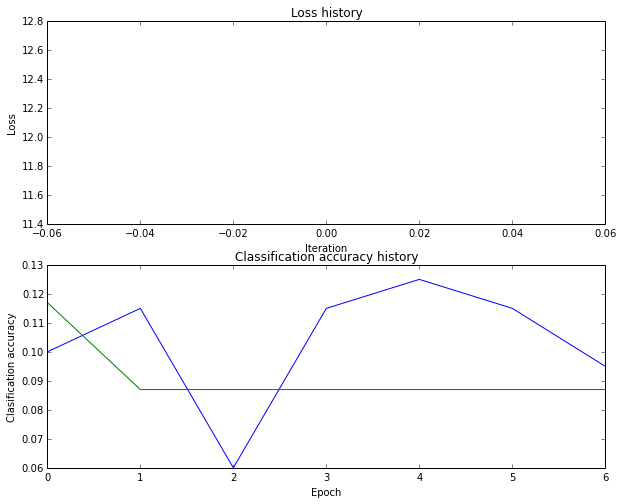

	training accuracy: (10.026531), validation accuracy: (8.700000)
(160) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:500, learn_rate:2.000000e-06)


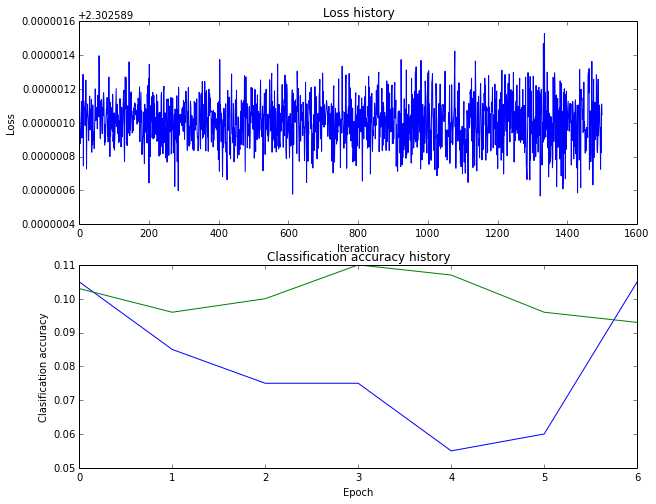

	training accuracy: (9.824490), validation accuracy: (9.300000)
(161) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:50, learn_rate:2.000000e-06)


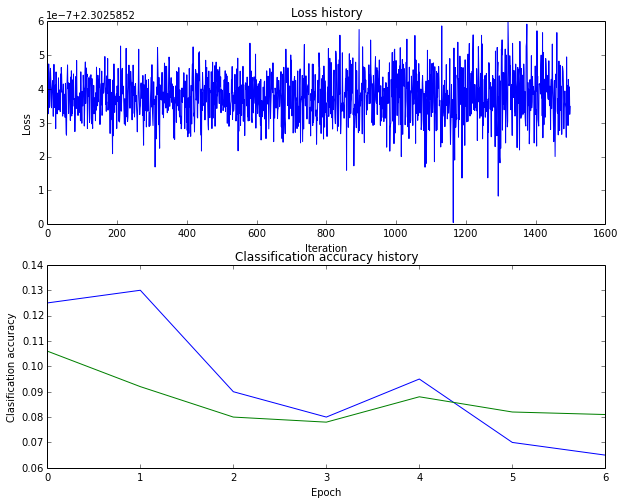

	training accuracy: (9.106122), validation accuracy: (8.100000)
(162) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:100, learn_rate:2.000000e-06)


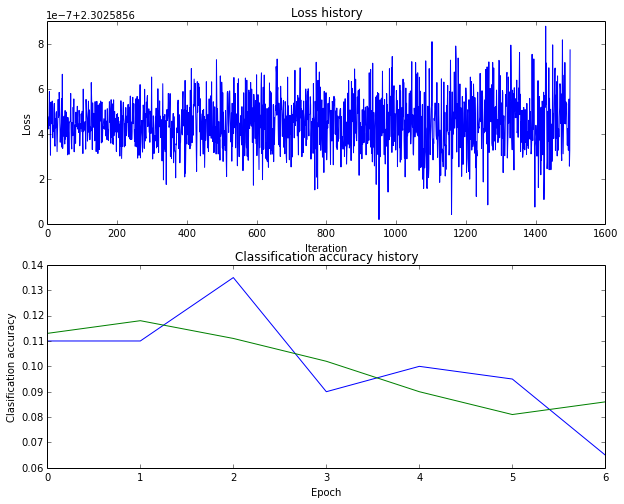

	training accuracy: (10.616327), validation accuracy: (8.800000)
(163) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:200, learn_rate:2.000000e-06)


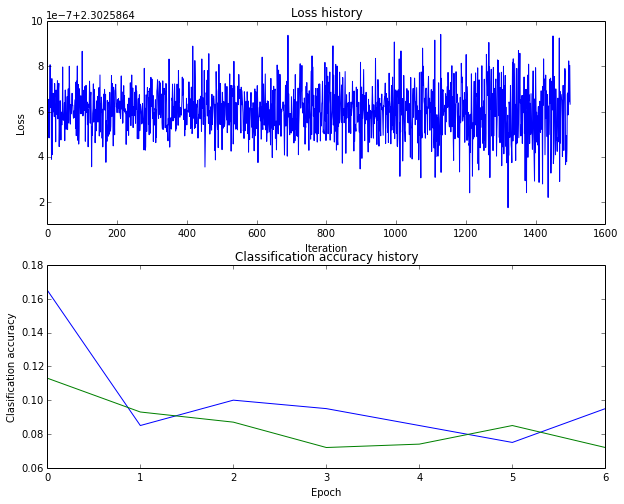

	training accuracy: (9.575510), validation accuracy: (7.300000)
(164) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:500, learn_rate:2.000000e-06)


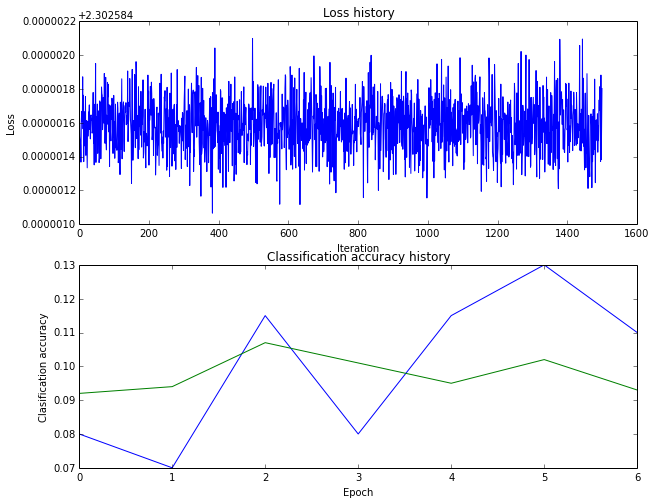

	training accuracy: (10.355102), validation accuracy: (9.500000)
(165) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:50, learn_rate:2.000000e-06)


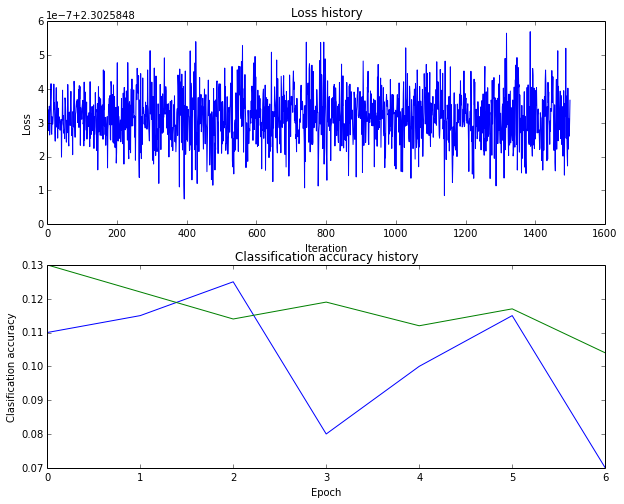

	training accuracy: (9.493878), validation accuracy: (10.600000)
(166) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:100, learn_rate:2.000000e-06)


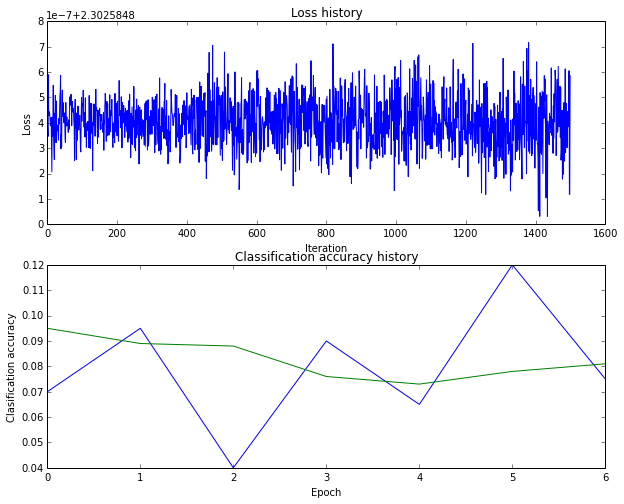

	training accuracy: (9.606122), validation accuracy: (7.900000)
(167) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:200, learn_rate:2.000000e-06)


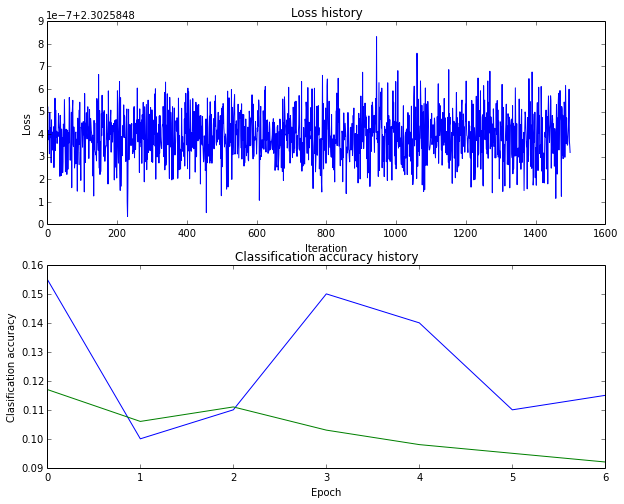

	training accuracy: (11.122449), validation accuracy: (9.000000)
(168) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


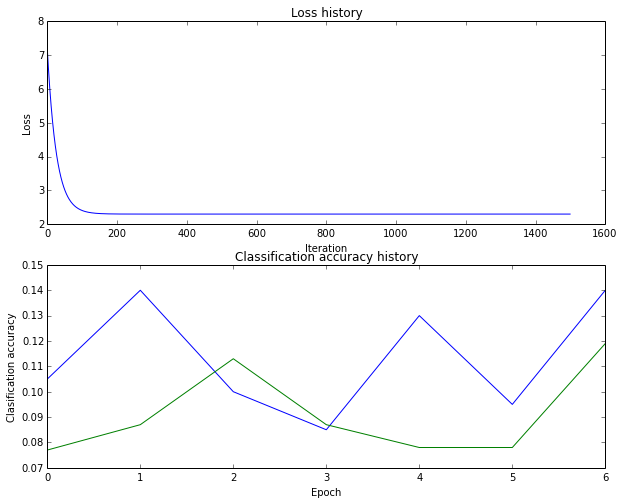

	training accuracy: (10.044898), validation accuracy: (7.800000)
(169) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


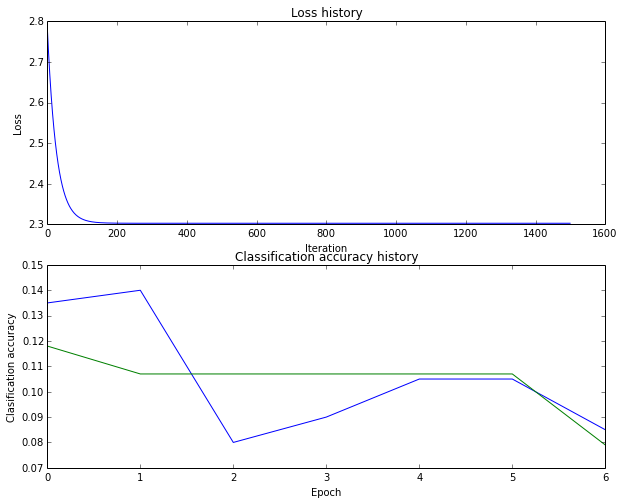

	training accuracy: (10.042857), validation accuracy: (7.900000)
(170) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


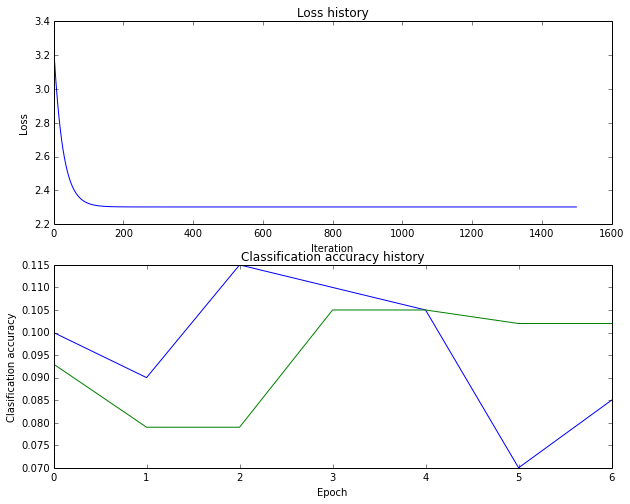

	training accuracy: (9.995918), validation accuracy: (10.200000)
(171) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


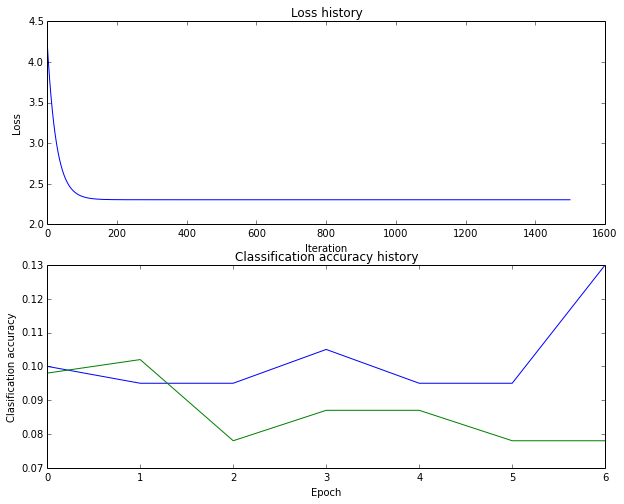

	training accuracy: (10.044898), validation accuracy: (7.800000)
(172) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


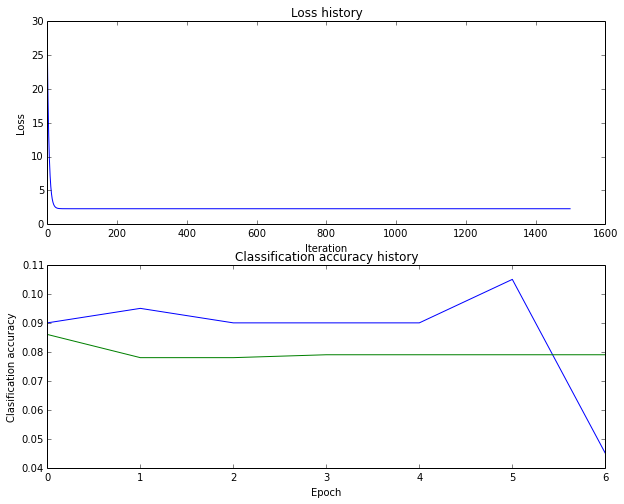

	training accuracy: (10.042857), validation accuracy: (7.900000)
(173) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


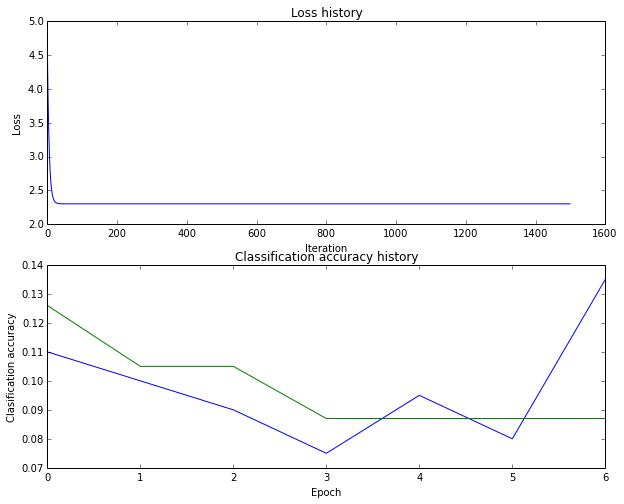

	training accuracy: (10.026531), validation accuracy: (8.700000)
(174) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


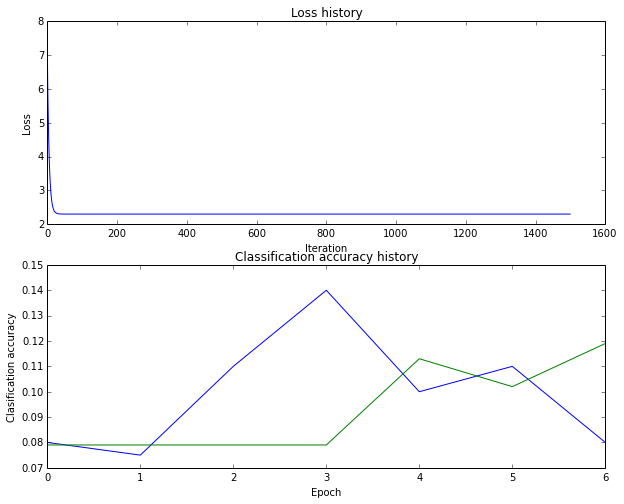

	training accuracy: (9.961224), validation accuracy: (11.900000)
(175) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


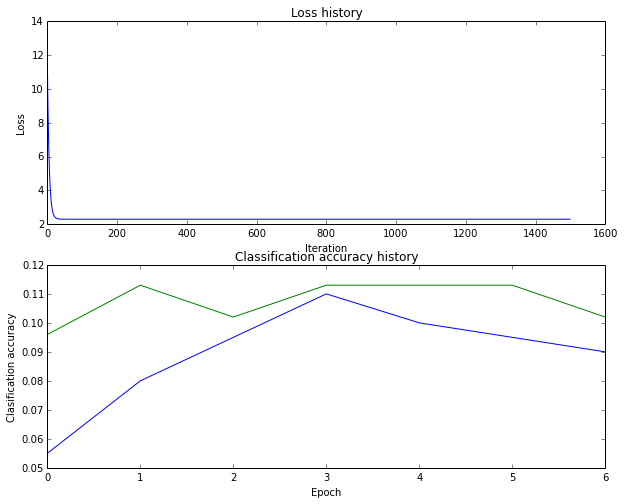

	training accuracy: (9.995918), validation accuracy: (10.200000)
(176) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:500, learn_rate:5.000000e-06)


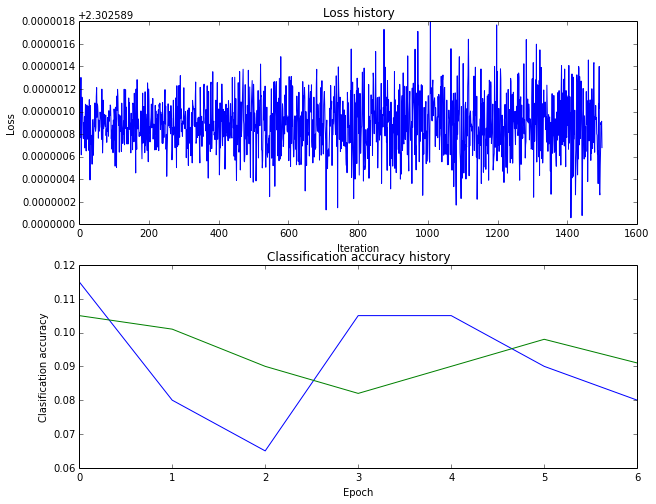

	training accuracy: (9.361224), validation accuracy: (9.100000)
(177) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:50, learn_rate:5.000000e-06)


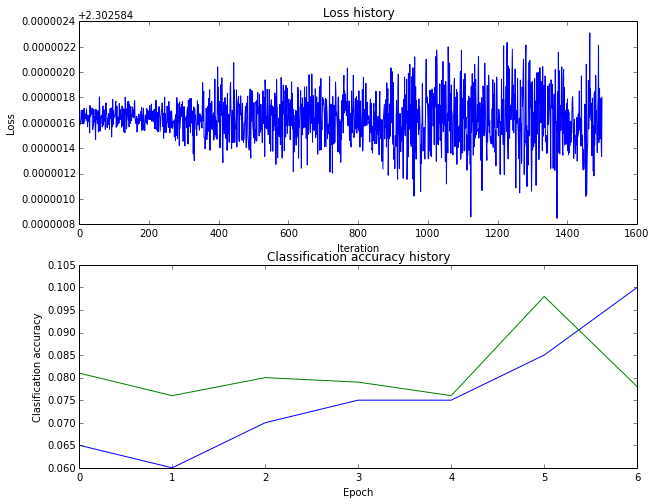

	training accuracy: (9.659184), validation accuracy: (7.500000)
(178) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:100, learn_rate:5.000000e-06)


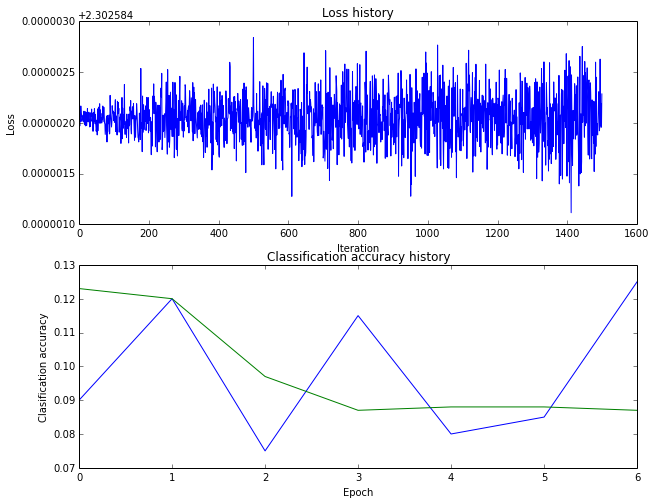

	training accuracy: (9.930612), validation accuracy: (8.700000)
(179) of (384)
Running Train and validation for (bins:40, reg:1.000000e-02, hidden_size:200, learn_rate:5.000000e-06)


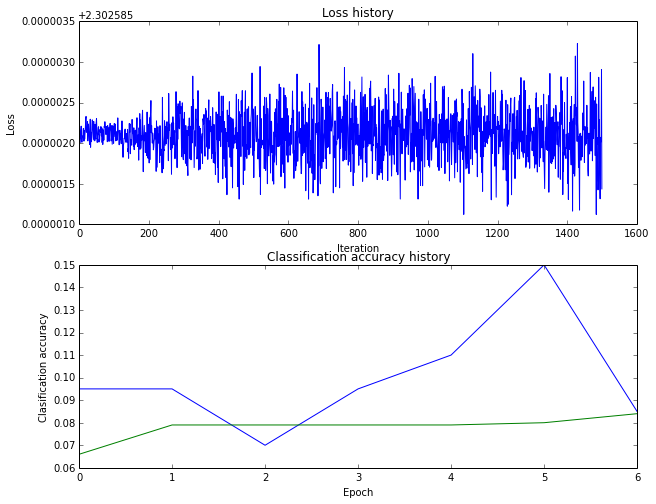

	training accuracy: (10.040816), validation accuracy: (8.000000)
(180) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:500, learn_rate:5.000000e-06)


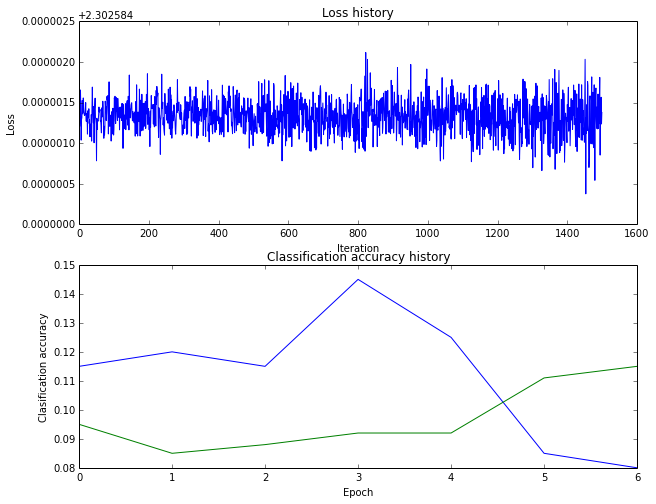

	training accuracy: (9.712245), validation accuracy: (11.500000)
(181) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:50, learn_rate:5.000000e-06)


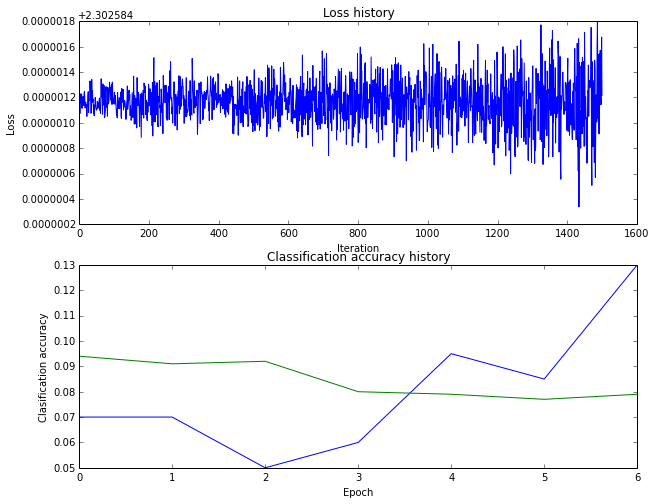

	training accuracy: (9.851020), validation accuracy: (7.700000)
(182) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:100, learn_rate:5.000000e-06)


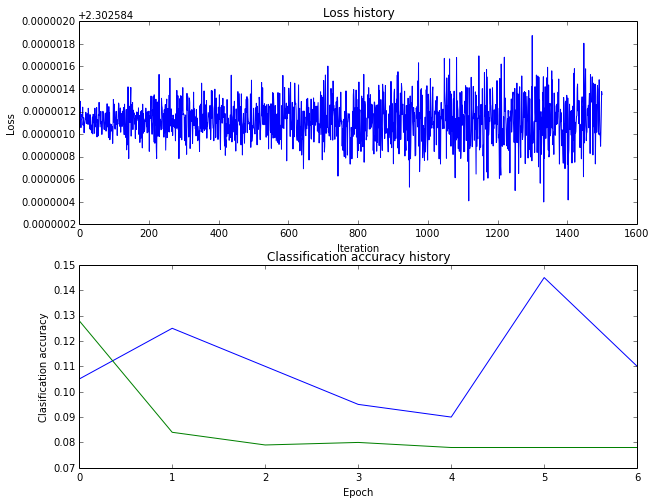

	training accuracy: (10.046939), validation accuracy: (7.800000)
(183) of (384)
Running Train and validation for (bins:40, reg:1.000000e-03, hidden_size:200, learn_rate:5.000000e-06)


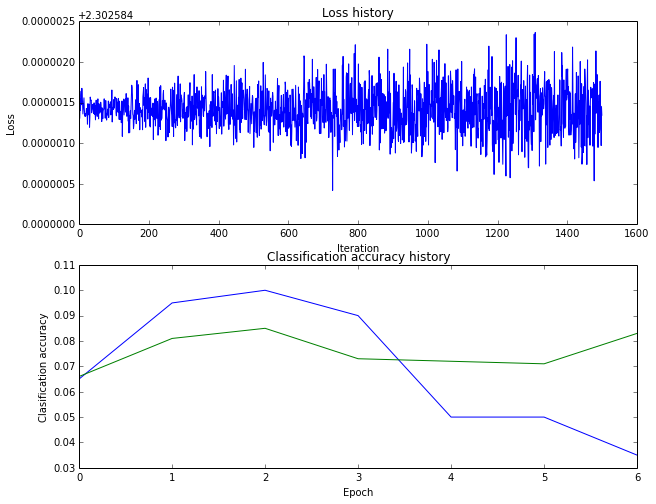

	training accuracy: (8.842857), validation accuracy: (8.300000)
(184) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


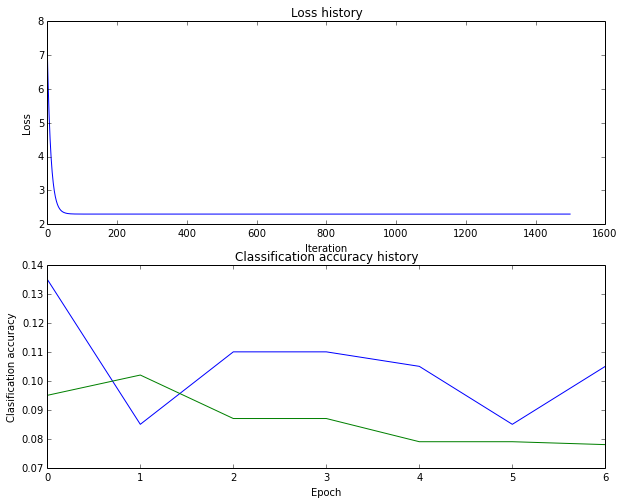

	training accuracy: (10.042857), validation accuracy: (7.900000)
(185) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


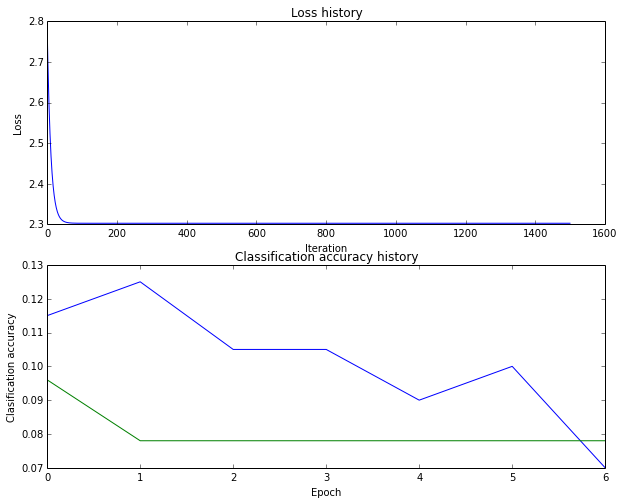

	training accuracy: (10.044898), validation accuracy: (7.800000)
(186) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


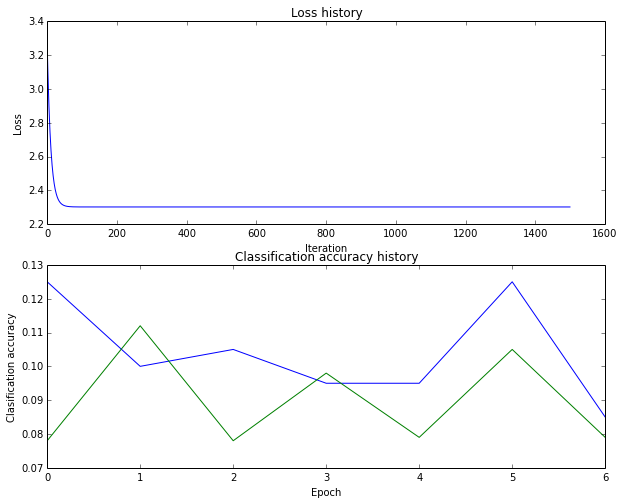

	training accuracy: (10.042857), validation accuracy: (7.900000)
(187) of (384)
Running Train and validation for (bins:40, reg:1.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


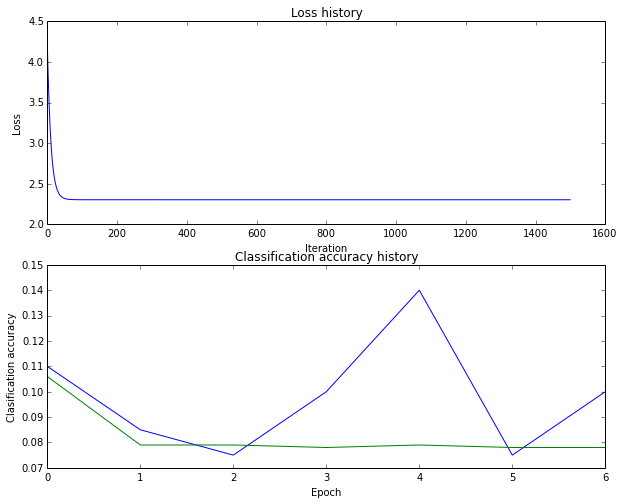

	training accuracy: (10.044898), validation accuracy: (7.800000)
(188) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


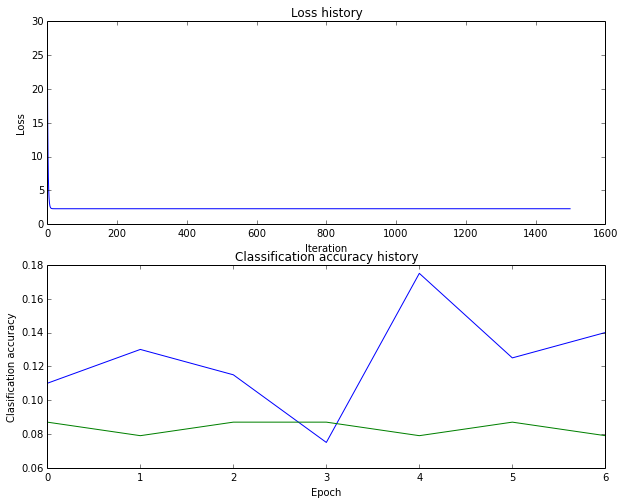

	training accuracy: (10.042857), validation accuracy: (7.900000)
(189) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


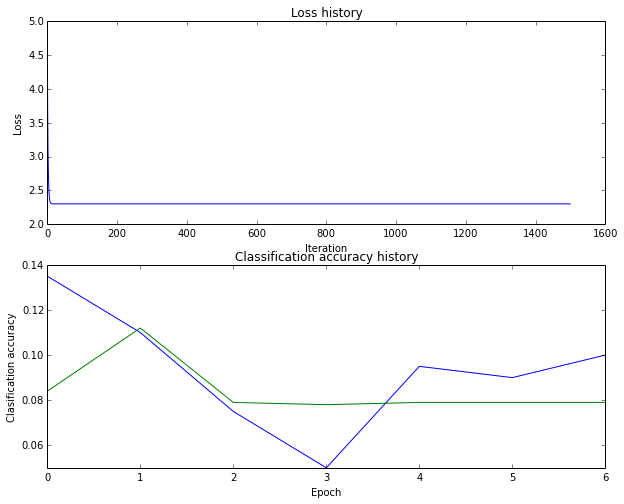

	training accuracy: (10.042857), validation accuracy: (7.900000)
(190) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


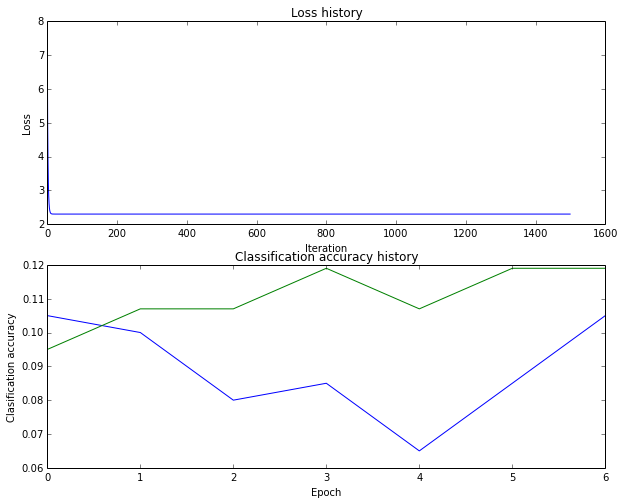

	training accuracy: (9.961224), validation accuracy: (11.900000)
(191) of (384)
Running Train and validation for (bins:40, reg:5.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


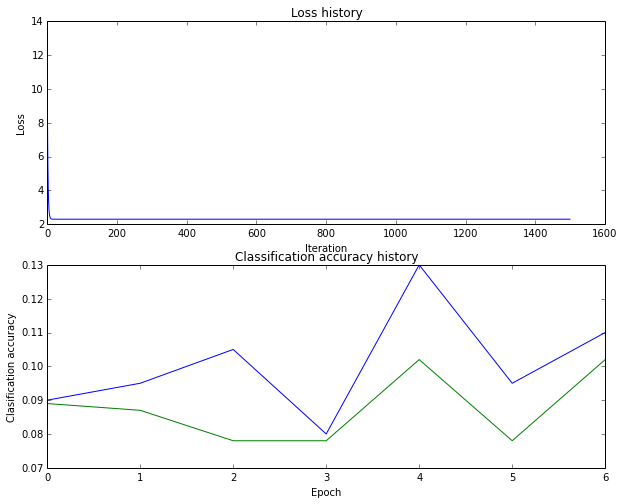

	training accuracy: (9.995918), validation accuracy: (10.200000)
(192) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:500, learn_rate:1.100000e+00)


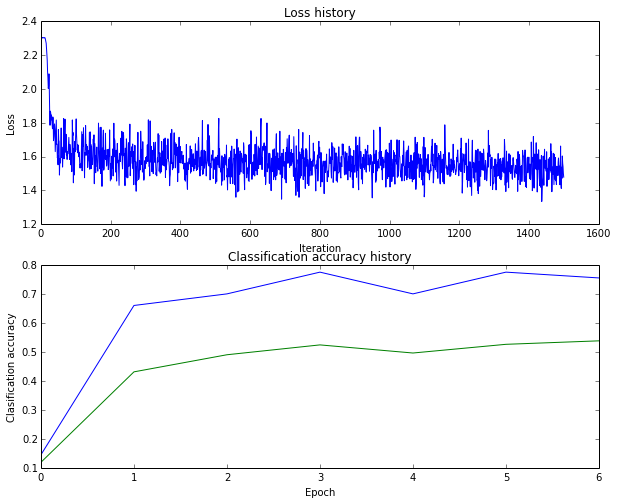

	training accuracy: (55.402041), validation accuracy: (53.900000)
(193) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:50, learn_rate:1.100000e+00)


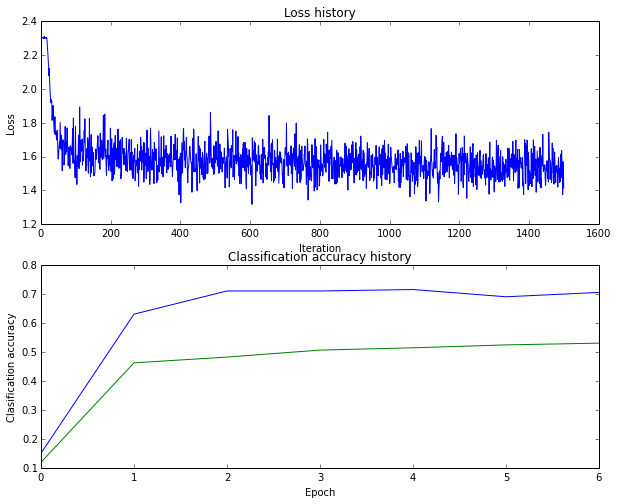

	training accuracy: (52.971429), validation accuracy: (50.200000)
(194) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:100, learn_rate:1.100000e+00)


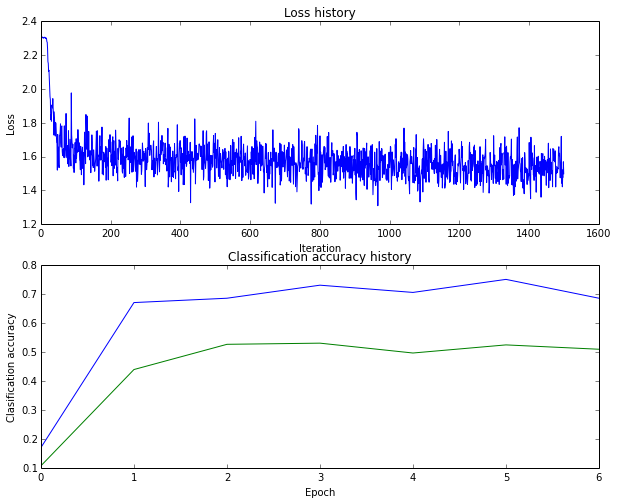

	training accuracy: (52.424490), validation accuracy: (51.600000)
(195) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:200, learn_rate:1.100000e+00)


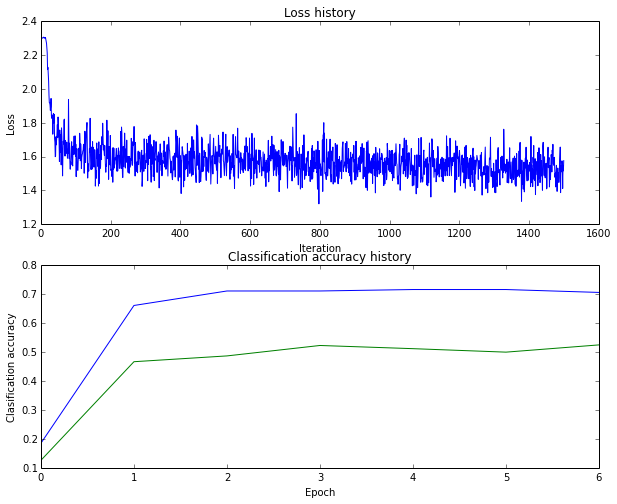

	training accuracy: (53.630612), validation accuracy: (50.400000)
(196) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:500, learn_rate:1.100000e+00)


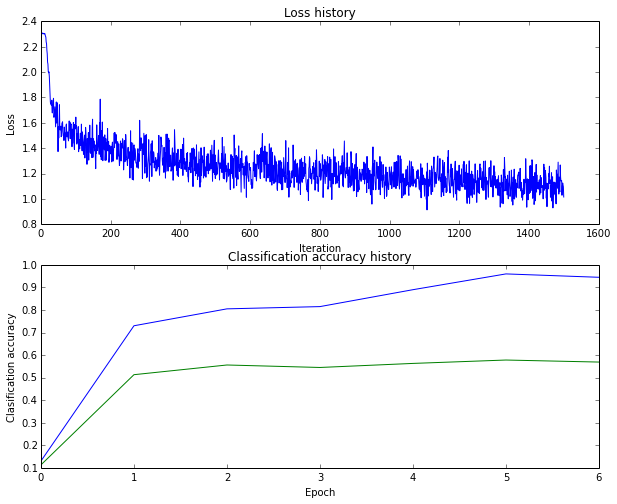

	training accuracy: (71.036735), validation accuracy: (58.700000)
(197) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:50, learn_rate:1.100000e+00)


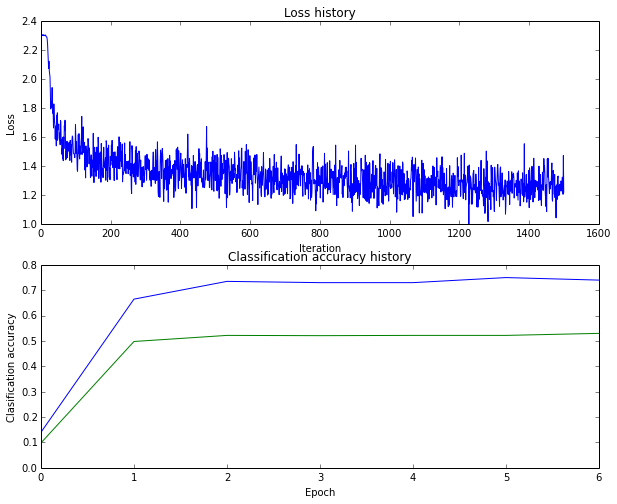

	training accuracy: (60.069388), validation accuracy: (54.400000)
(198) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:100, learn_rate:1.100000e+00)


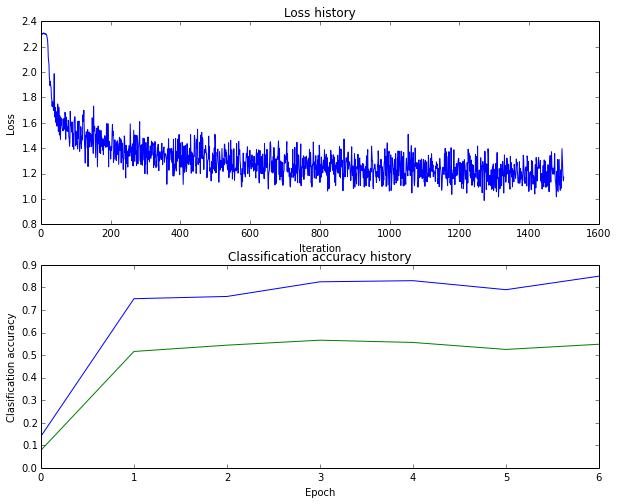

	training accuracy: (62.861224), validation accuracy: (54.800000)
(199) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:200, learn_rate:1.100000e+00)


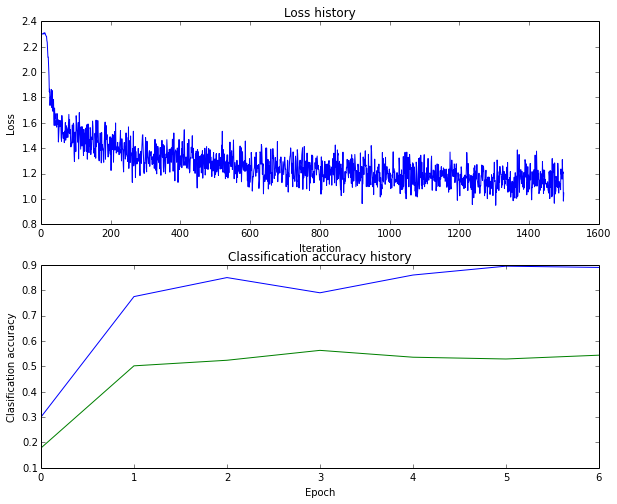

	training accuracy: (66.436735), validation accuracy: (55.900000)
(200) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


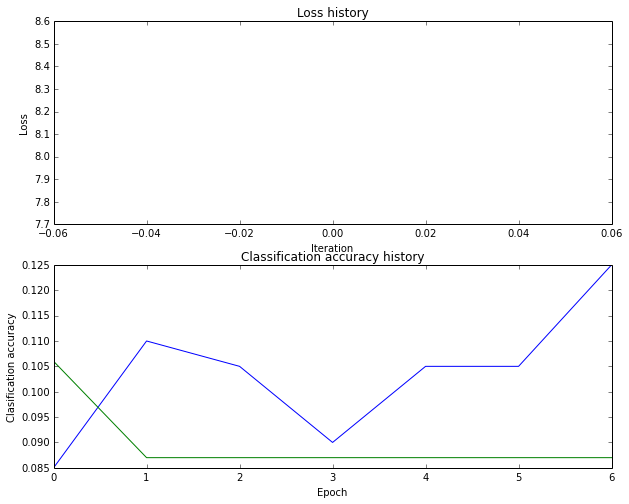

	training accuracy: (10.026531), validation accuracy: (8.700000)
(201) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


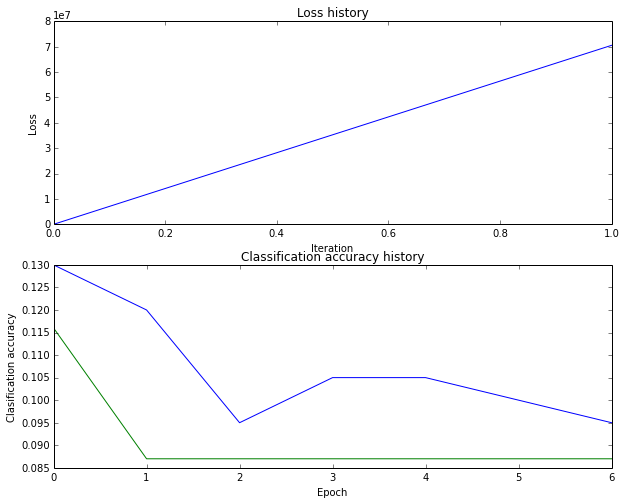

	training accuracy: (10.026531), validation accuracy: (8.700000)
(202) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


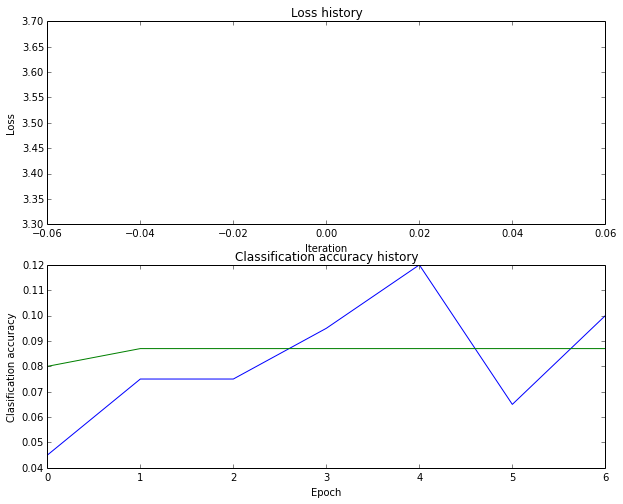

	training accuracy: (10.026531), validation accuracy: (8.700000)
(203) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


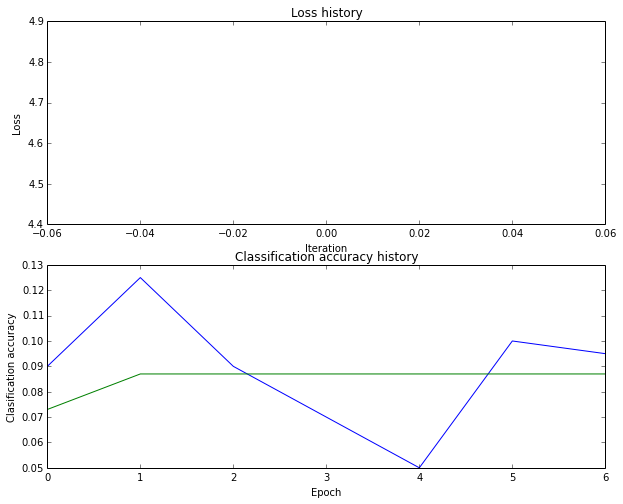

	training accuracy: (10.026531), validation accuracy: (8.700000)
(204) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


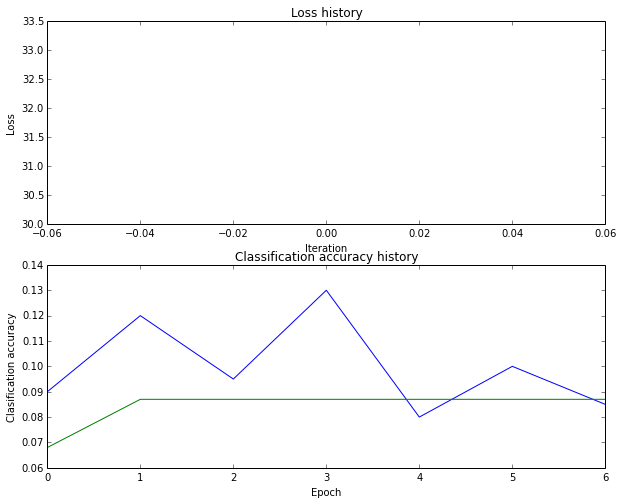

	training accuracy: (10.026531), validation accuracy: (8.700000)
(205) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


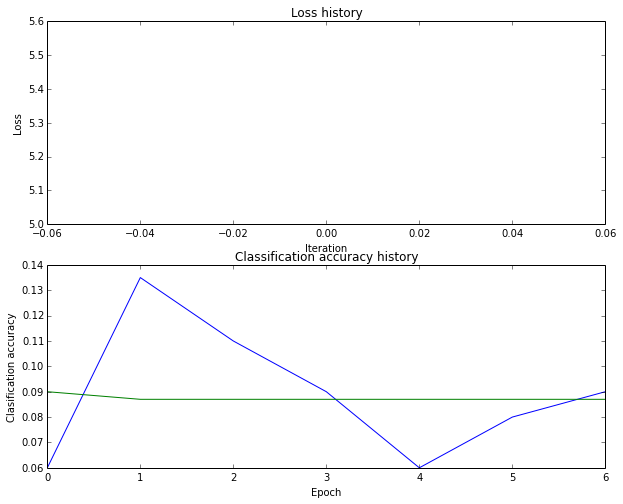

	training accuracy: (10.026531), validation accuracy: (8.700000)
(206) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


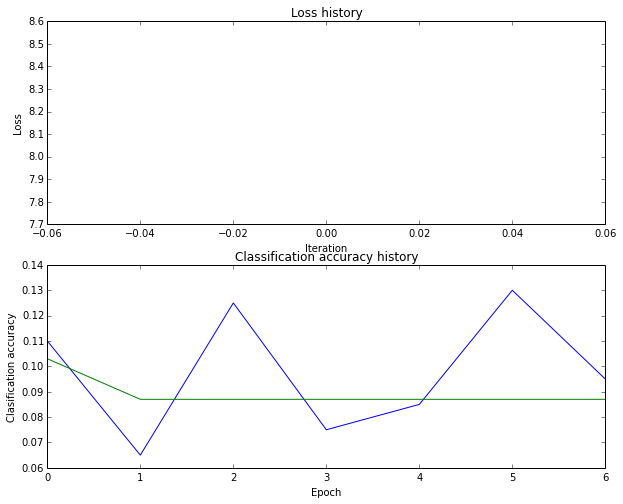

	training accuracy: (10.026531), validation accuracy: (8.700000)
(207) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


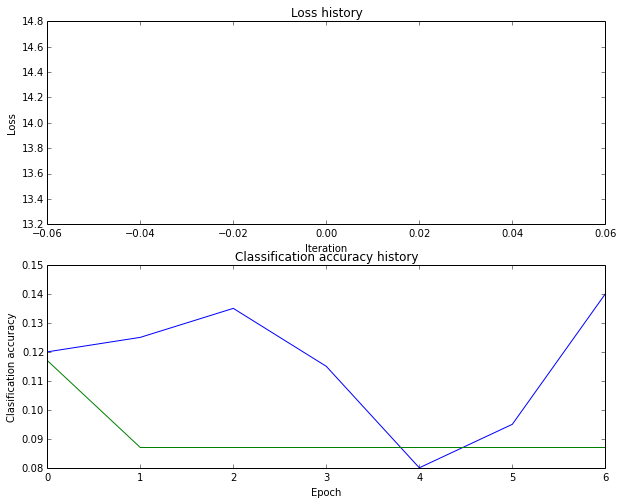

	training accuracy: (10.026531), validation accuracy: (8.700000)
(208) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:500, learn_rate:9.000000e-01)


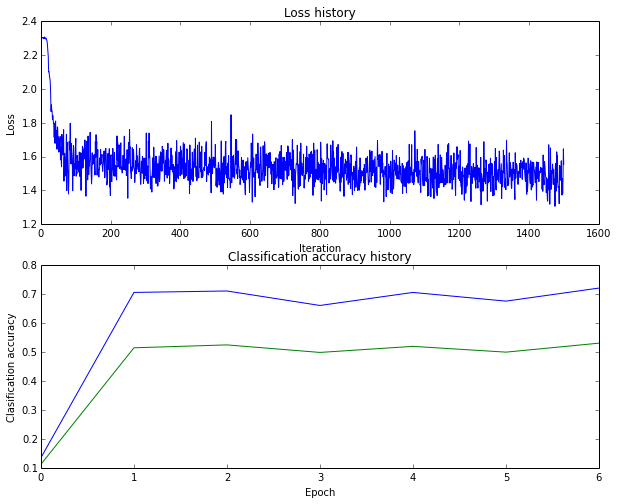

	training accuracy: (54.602041), validation accuracy: (53.400000)
(209) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:50, learn_rate:9.000000e-01)


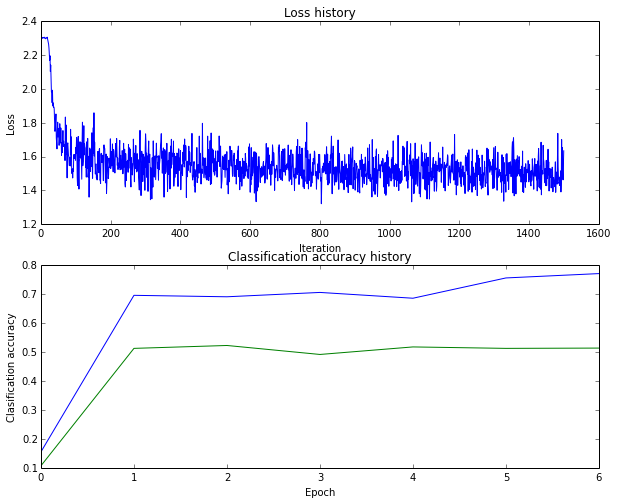

	training accuracy: (54.773469), validation accuracy: (53.100000)
(210) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:100, learn_rate:9.000000e-01)


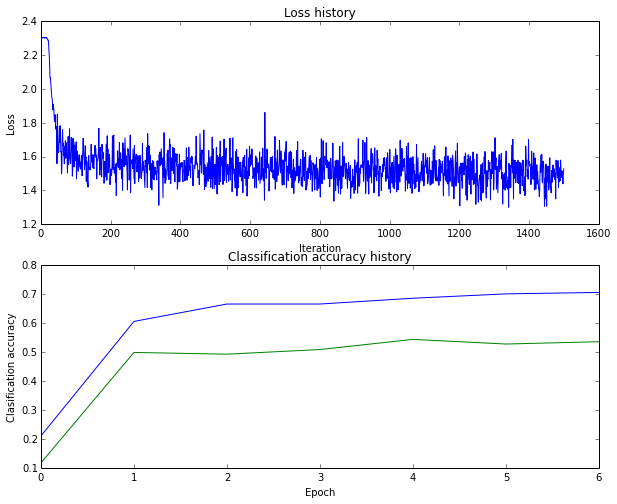

	training accuracy: (54.373469), validation accuracy: (54.000000)
(211) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:200, learn_rate:9.000000e-01)


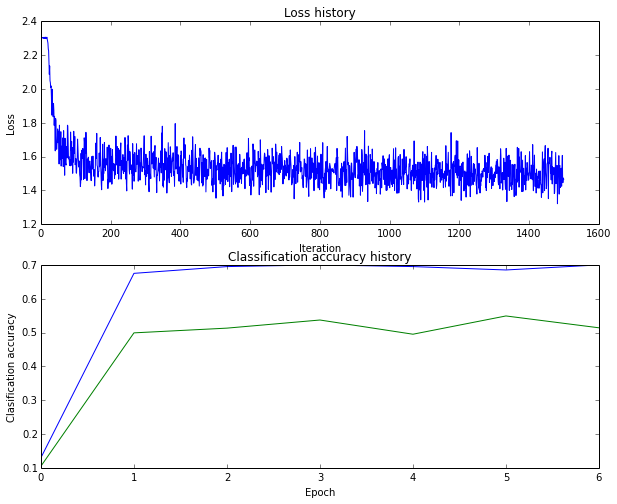

	training accuracy: (54.591837), validation accuracy: (51.900000)
(212) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:500, learn_rate:9.000000e-01)


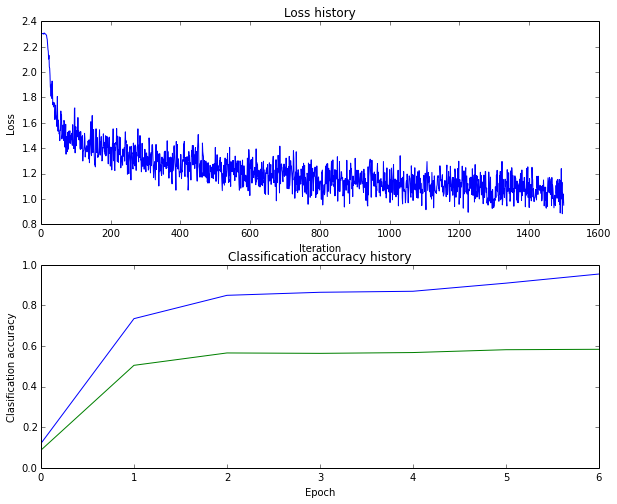

	training accuracy: (70.473469), validation accuracy: (56.900000)
(213) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:50, learn_rate:9.000000e-01)


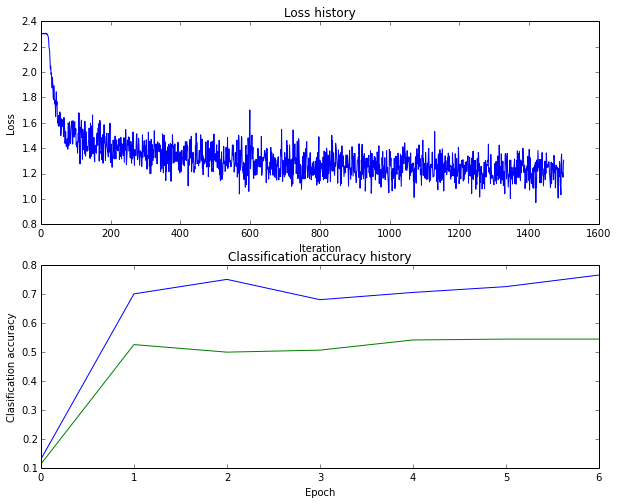

	training accuracy: (60.814286), validation accuracy: (56.300000)
(214) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:100, learn_rate:9.000000e-01)


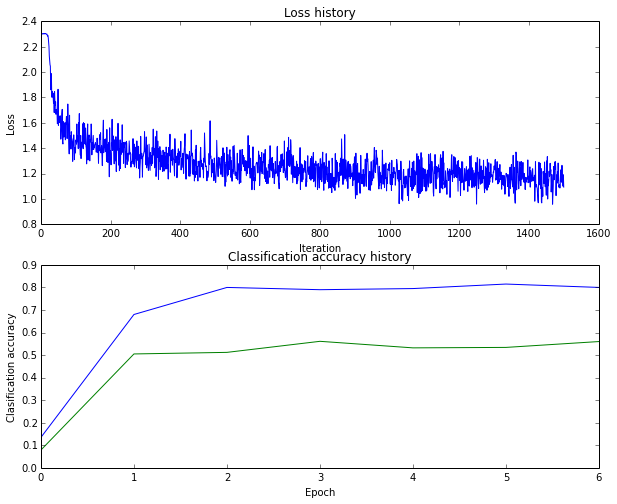

	training accuracy: (63.020408), validation accuracy: (55.700000)
(215) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:200, learn_rate:9.000000e-01)


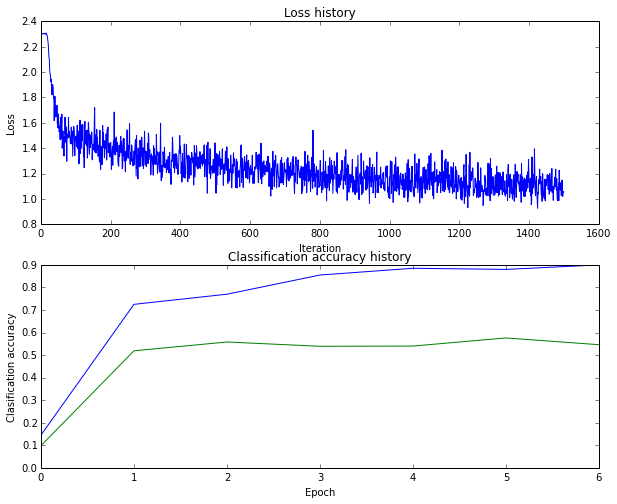

	training accuracy: (68.095918), validation accuracy: (56.400000)
(216) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


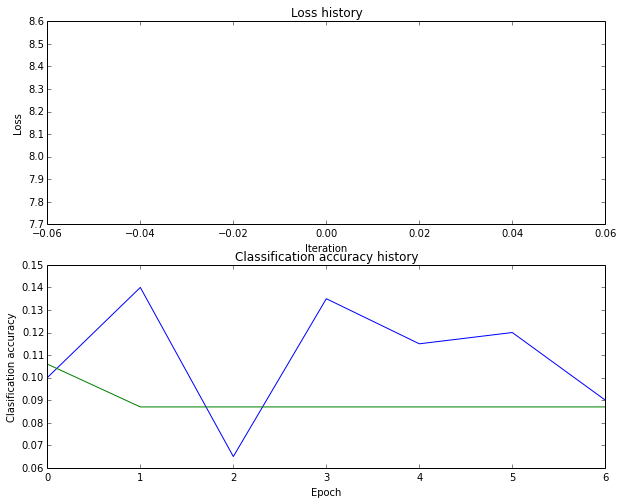

	training accuracy: (10.026531), validation accuracy: (8.700000)
(217) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


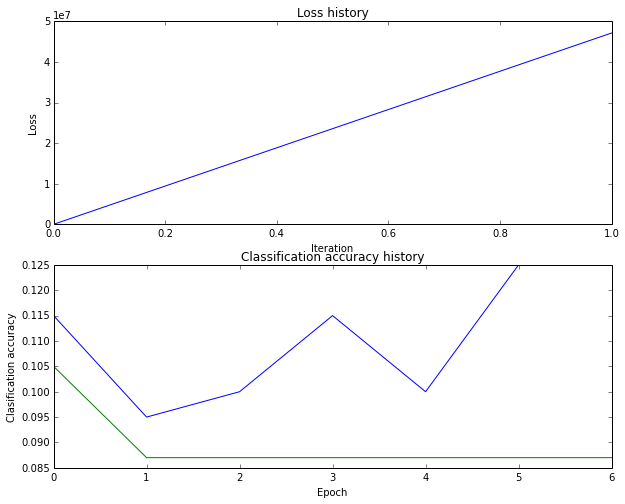

	training accuracy: (10.026531), validation accuracy: (8.700000)
(218) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


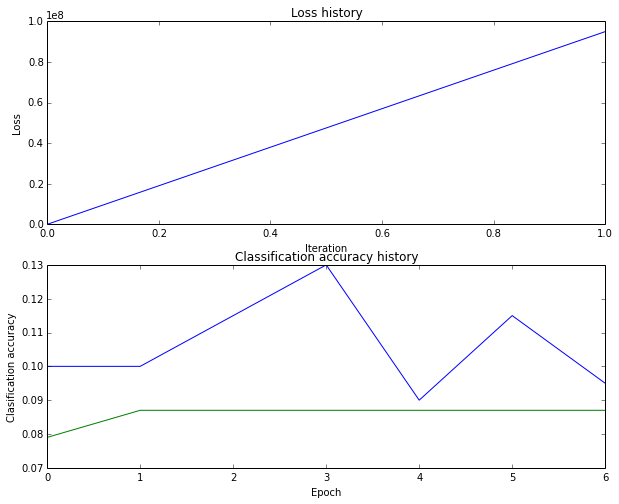

	training accuracy: (10.026531), validation accuracy: (8.700000)
(219) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


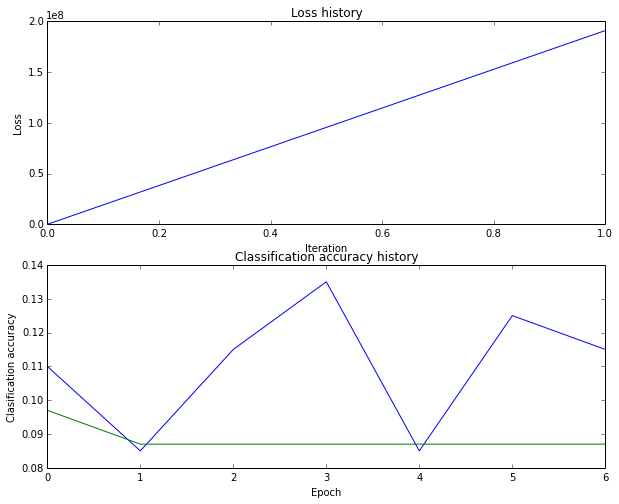

	training accuracy: (10.026531), validation accuracy: (8.700000)
(220) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


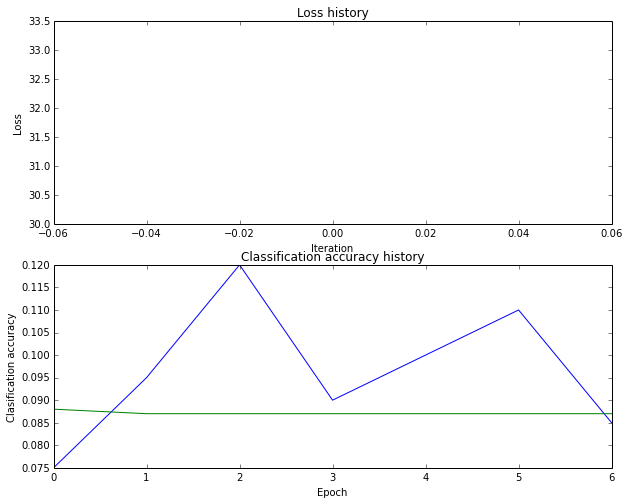

	training accuracy: (10.026531), validation accuracy: (8.700000)
(221) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


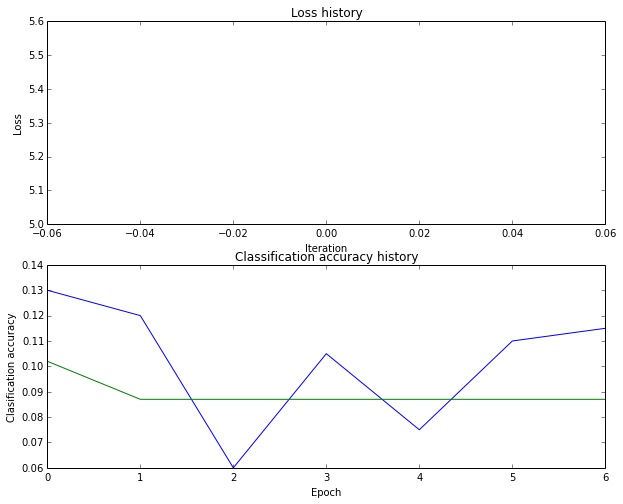

	training accuracy: (10.026531), validation accuracy: (8.700000)
(222) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


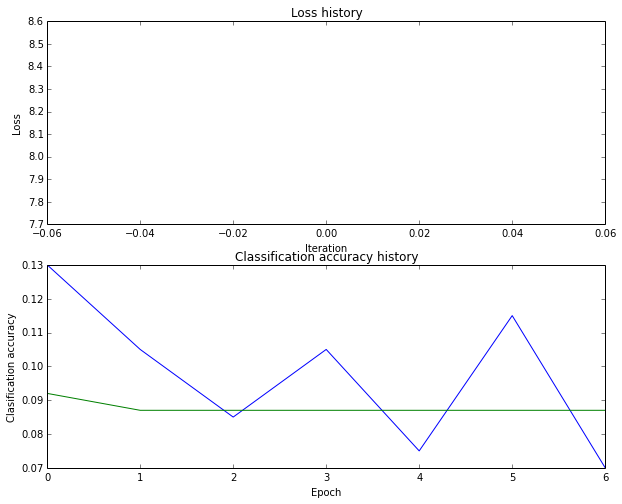

	training accuracy: (10.026531), validation accuracy: (8.700000)
(223) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


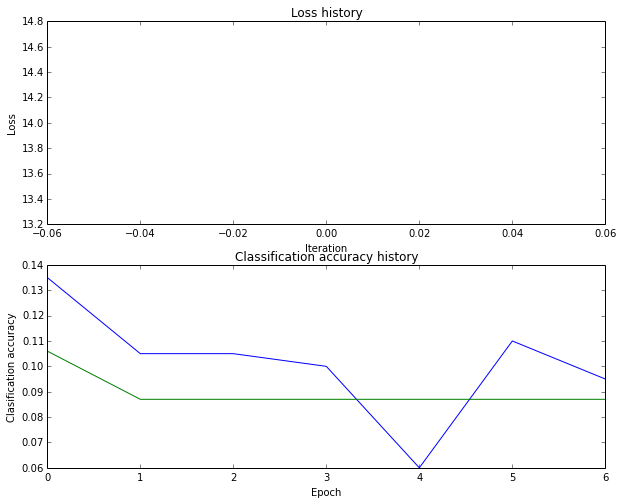

	training accuracy: (10.026531), validation accuracy: (8.700000)
(224) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:500, learn_rate:2.000000e-06)


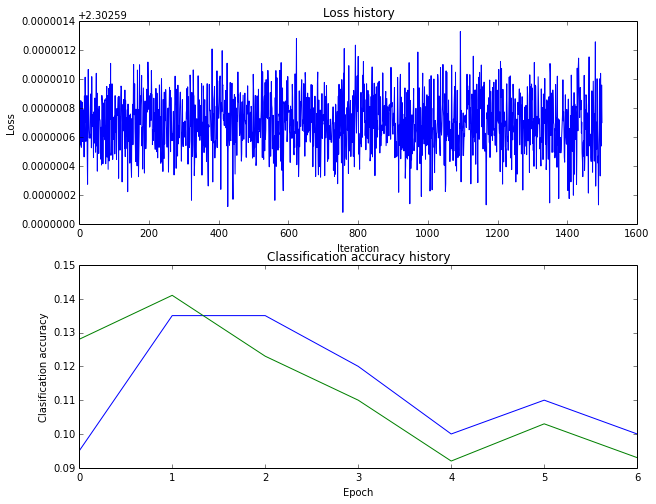

	training accuracy: (10.697959), validation accuracy: (9.300000)
(225) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:50, learn_rate:2.000000e-06)


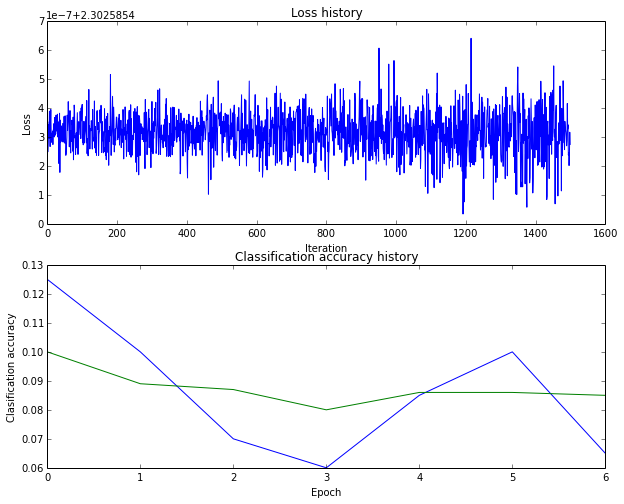

	training accuracy: (9.659184), validation accuracy: (8.500000)
(226) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:100, learn_rate:2.000000e-06)


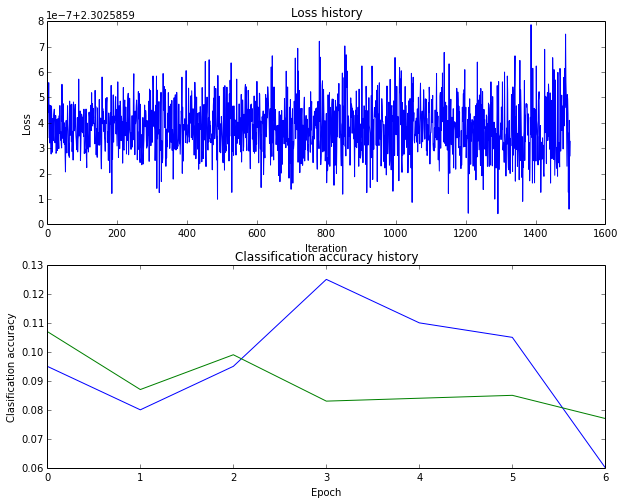

	training accuracy: (10.255102), validation accuracy: (7.500000)
(227) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:200, learn_rate:2.000000e-06)


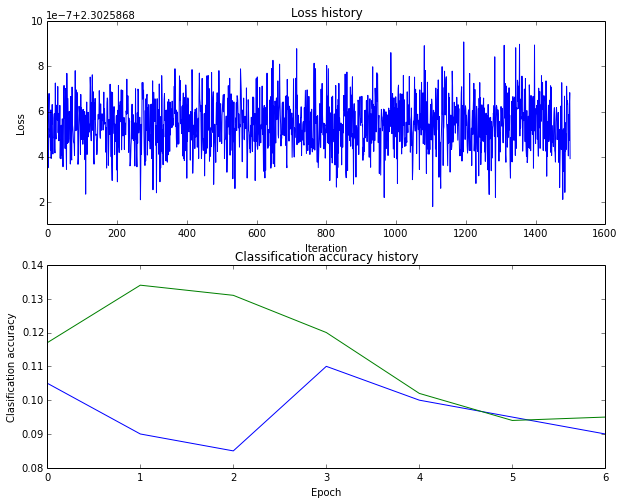

	training accuracy: (10.191837), validation accuracy: (9.300000)
(228) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:500, learn_rate:2.000000e-06)


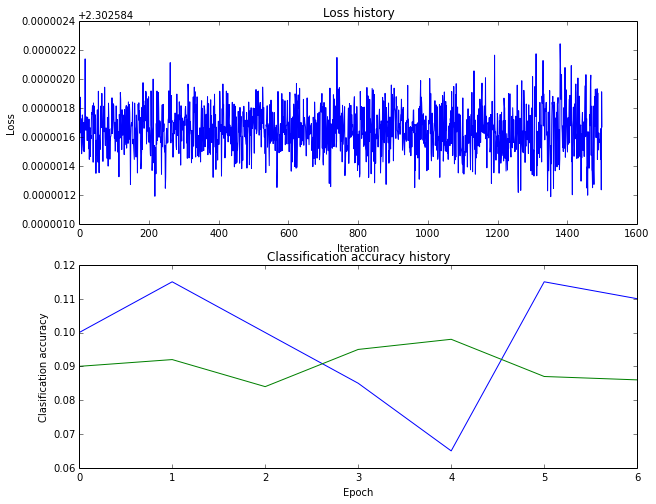

	training accuracy: (10.255102), validation accuracy: (8.600000)
(229) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:50, learn_rate:2.000000e-06)


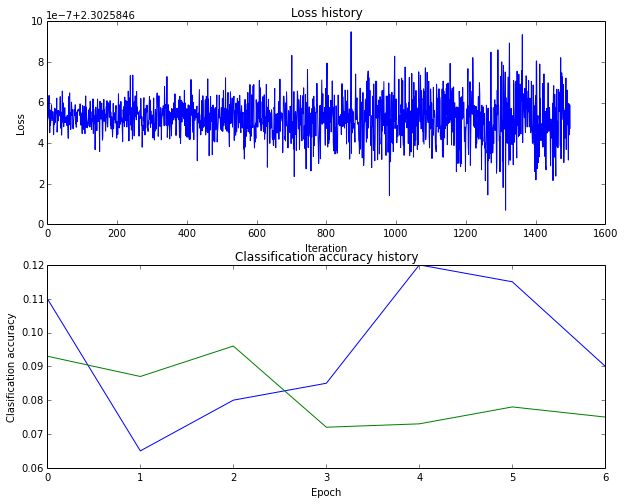

	training accuracy: (10.353061), validation accuracy: (7.400000)
(230) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:100, learn_rate:2.000000e-06)


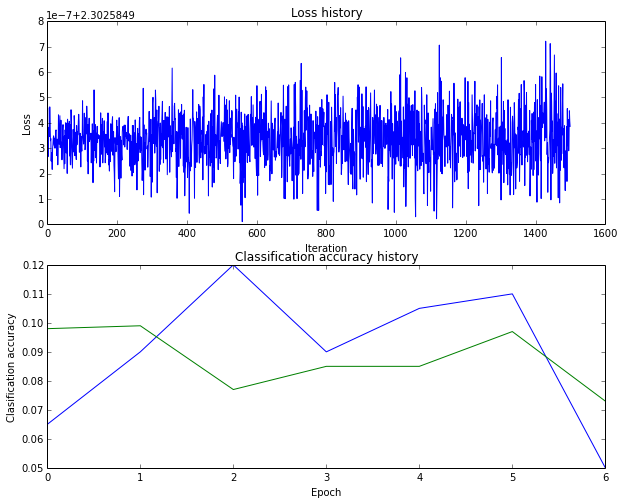

	training accuracy: (8.295918), validation accuracy: (8.400000)
(231) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:200, learn_rate:2.000000e-06)


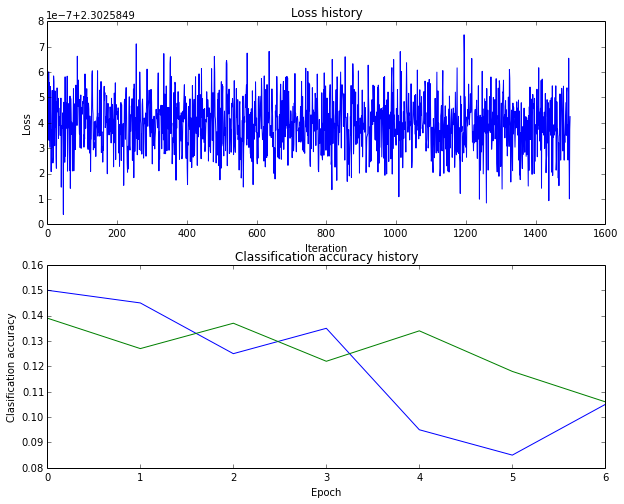

	training accuracy: (10.385714), validation accuracy: (10.600000)
(232) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


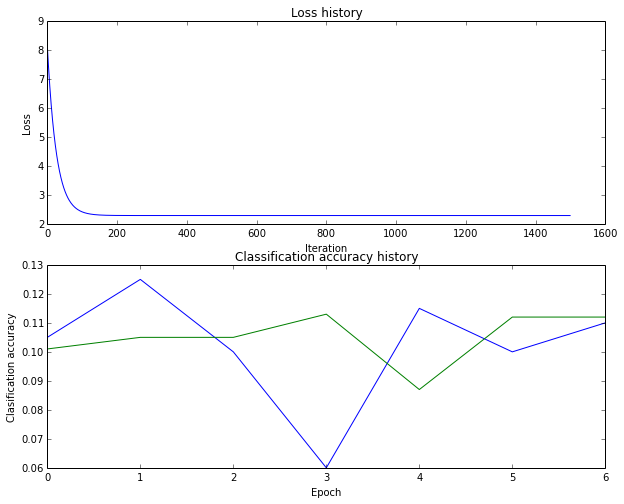

	training accuracy: (9.975510), validation accuracy: (11.200000)
(233) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


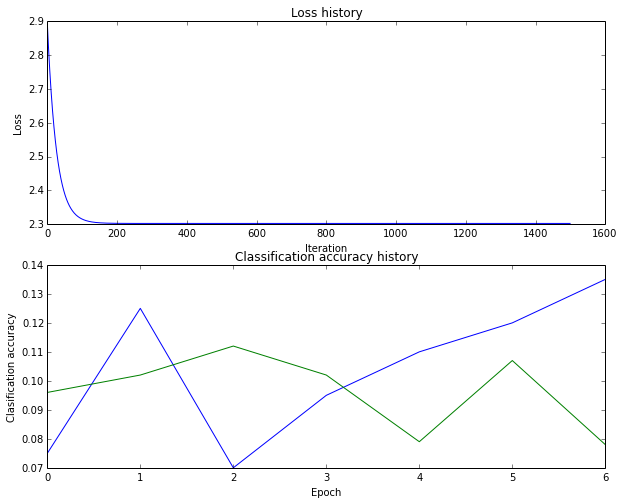

	training accuracy: (9.985714), validation accuracy: (10.700000)
(234) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


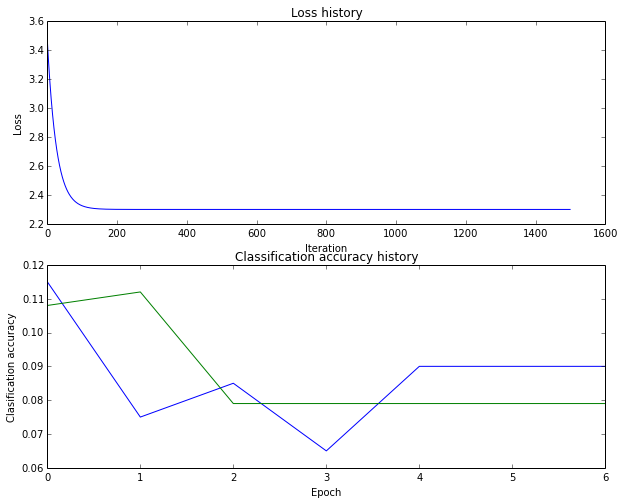

	training accuracy: (10.042857), validation accuracy: (7.900000)
(235) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


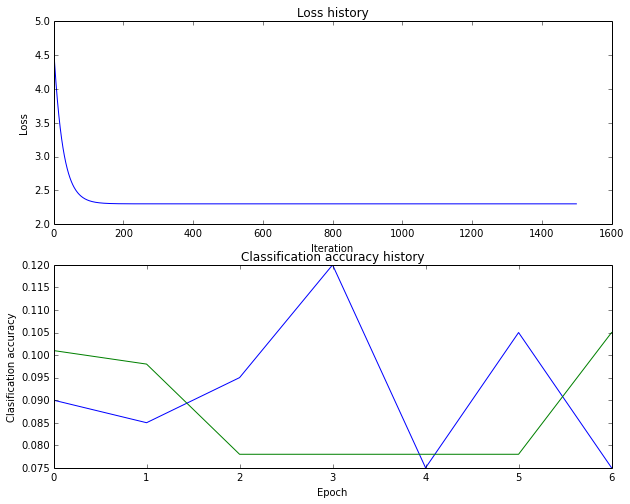

	training accuracy: (9.989796), validation accuracy: (10.500000)
(236) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


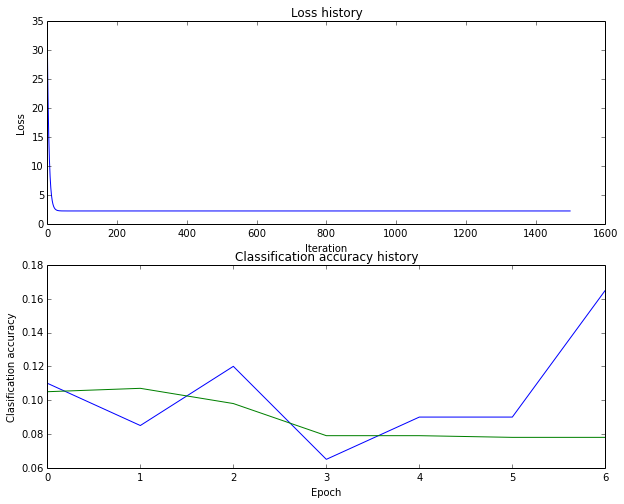

	training accuracy: (10.044898), validation accuracy: (7.800000)
(237) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


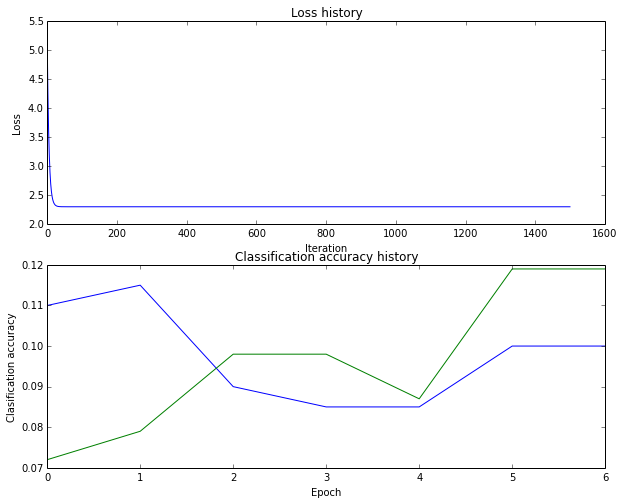

	training accuracy: (9.961224), validation accuracy: (11.900000)
(238) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


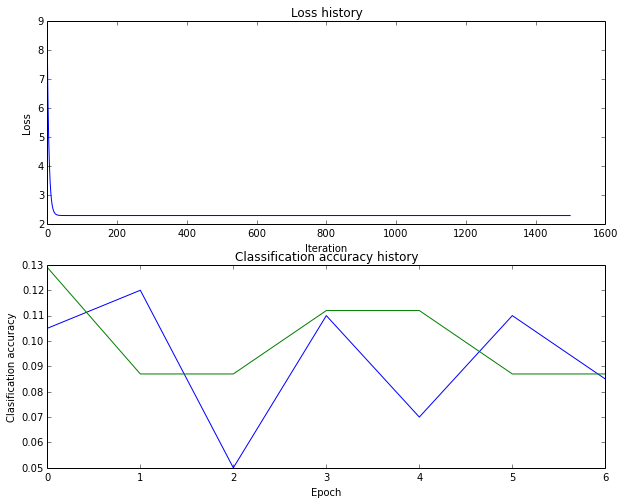

	training accuracy: (10.044898), validation accuracy: (7.800000)
(239) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


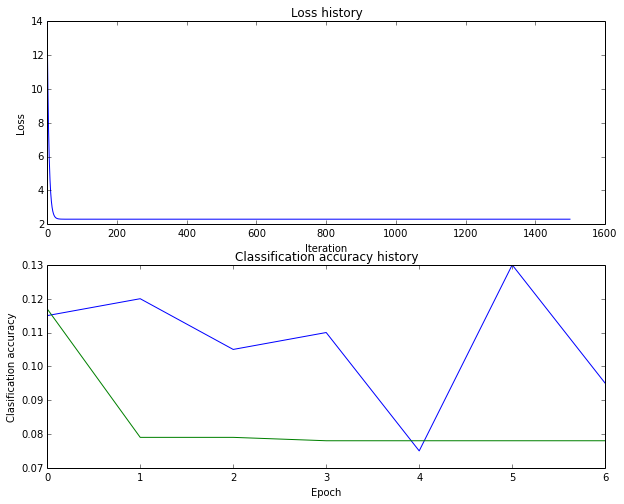

	training accuracy: (10.044898), validation accuracy: (7.800000)
(240) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:500, learn_rate:5.000000e-06)


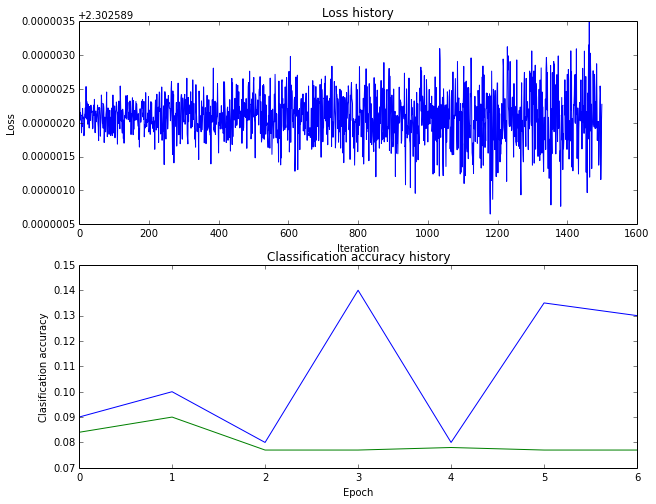

	training accuracy: (10.112245), validation accuracy: (7.700000)
(241) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:50, learn_rate:5.000000e-06)


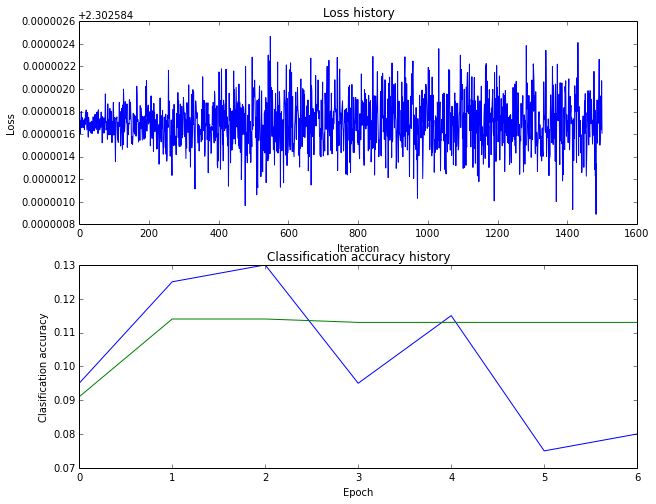

	training accuracy: (9.981633), validation accuracy: (11.300000)
(242) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:100, learn_rate:5.000000e-06)


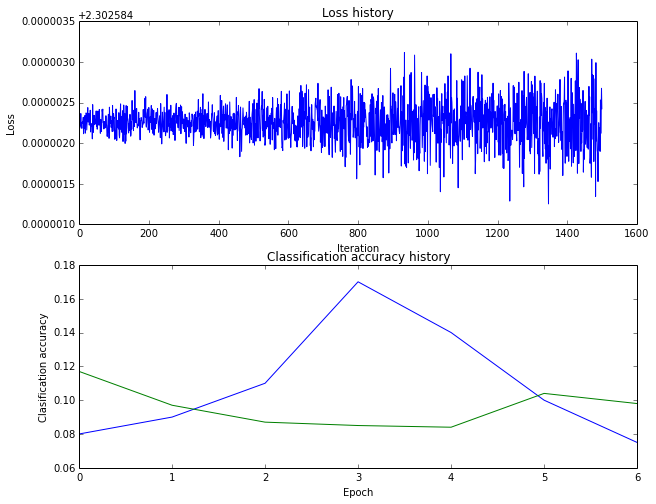

	training accuracy: (10.395918), validation accuracy: (9.600000)
(243) of (384)
Running Train and validation for (bins:80, reg:1.000000e-02, hidden_size:200, learn_rate:5.000000e-06)


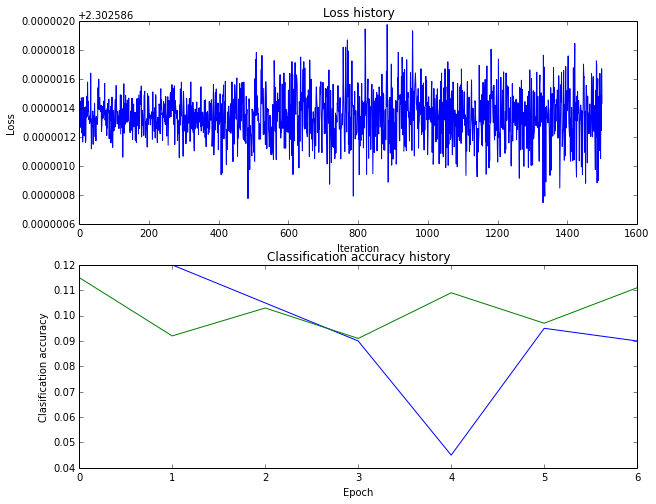

	training accuracy: (10.271429), validation accuracy: (11.100000)
(244) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:500, learn_rate:5.000000e-06)


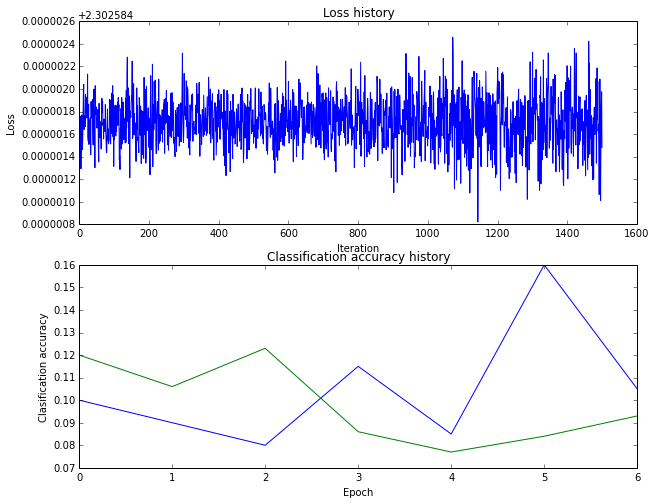

	training accuracy: (10.824490), validation accuracy: (10.300000)
(245) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:50, learn_rate:5.000000e-06)


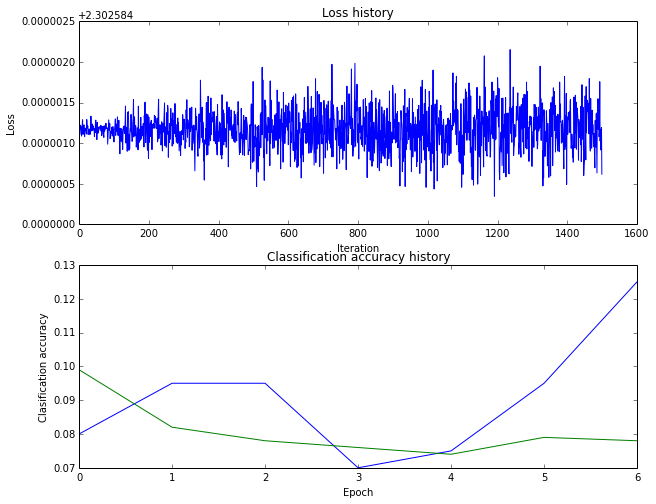

	training accuracy: (10.120408), validation accuracy: (7.900000)
(246) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:100, learn_rate:5.000000e-06)


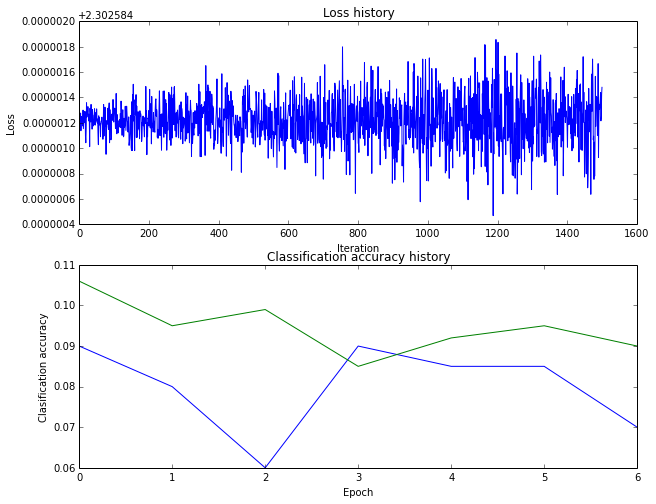

	training accuracy: (9.761224), validation accuracy: (9.400000)
(247) of (384)
Running Train and validation for (bins:80, reg:1.000000e-03, hidden_size:200, learn_rate:5.000000e-06)


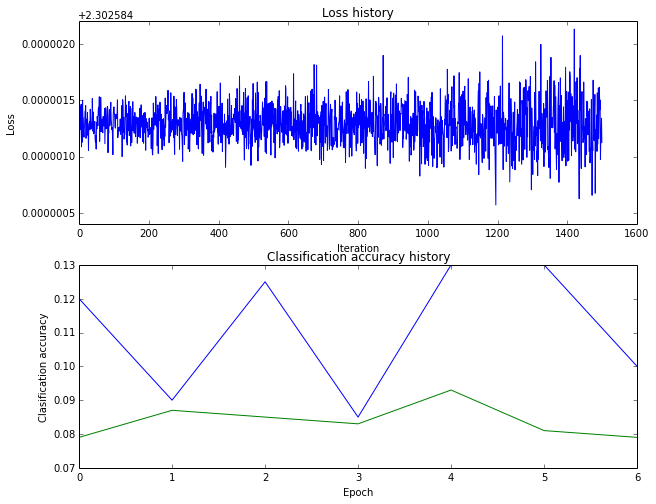

	training accuracy: (10.077551), validation accuracy: (7.800000)
(248) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


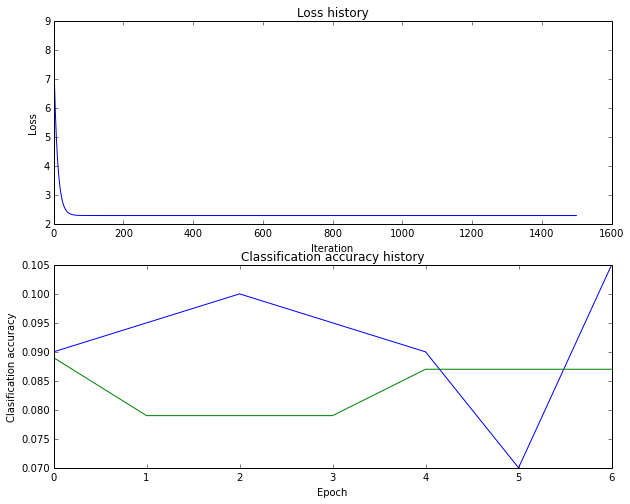

	training accuracy: (10.026531), validation accuracy: (8.700000)
(249) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


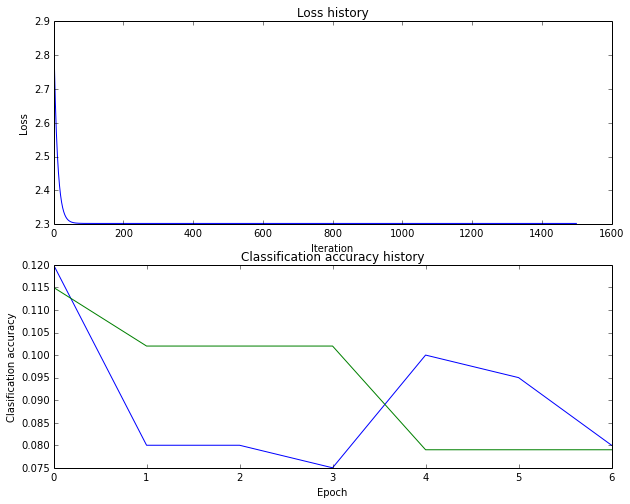

	training accuracy: (9.995918), validation accuracy: (10.200000)
(250) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


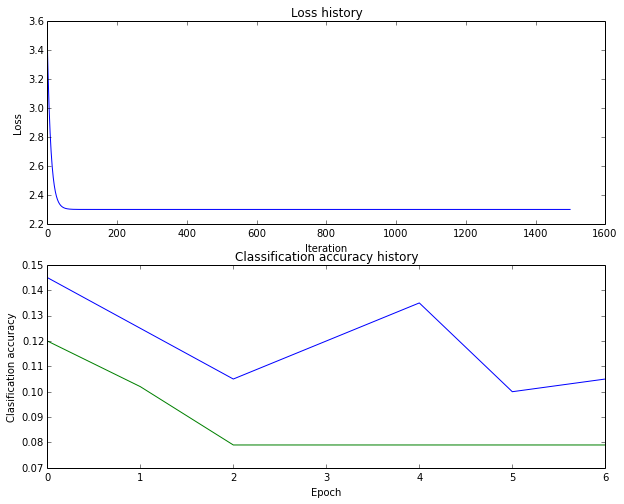

	training accuracy: (10.042857), validation accuracy: (7.900000)
(251) of (384)
Running Train and validation for (bins:80, reg:1.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


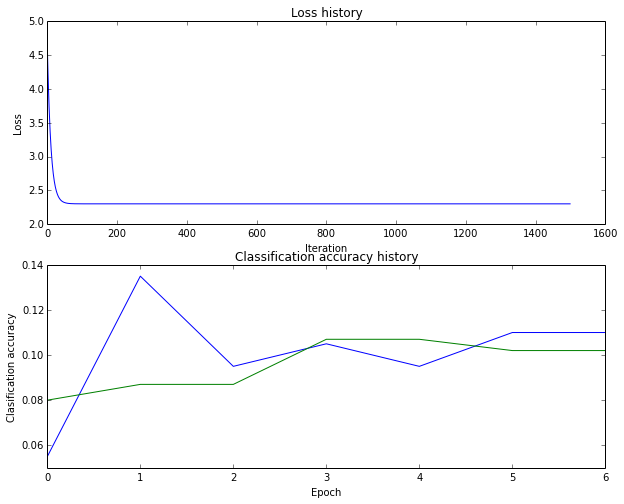

	training accuracy: (9.995918), validation accuracy: (10.200000)
(252) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


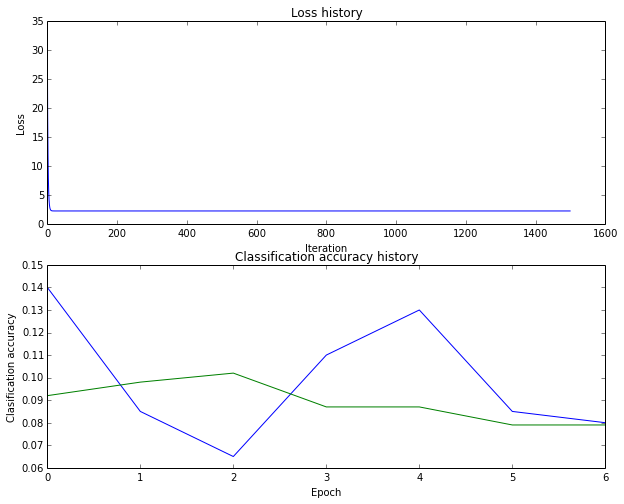

	training accuracy: (9.995918), validation accuracy: (10.200000)
(253) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


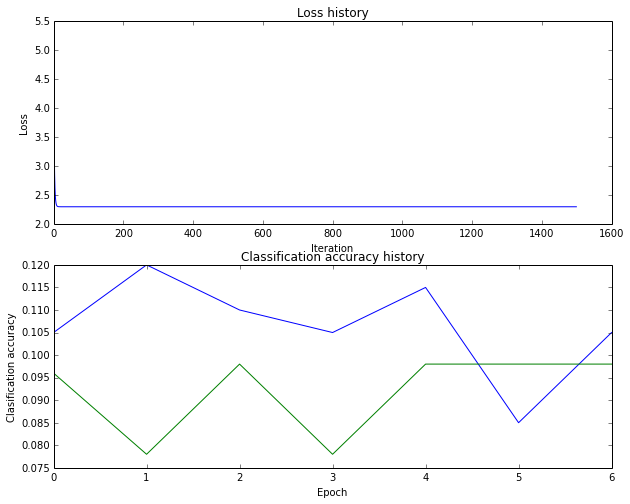

	training accuracy: (10.004082), validation accuracy: (9.800000)
(254) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


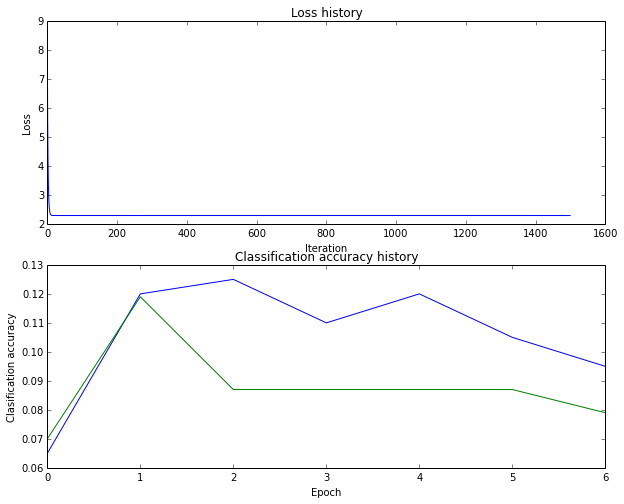

	training accuracy: (10.042857), validation accuracy: (7.900000)
(255) of (384)
Running Train and validation for (bins:80, reg:5.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


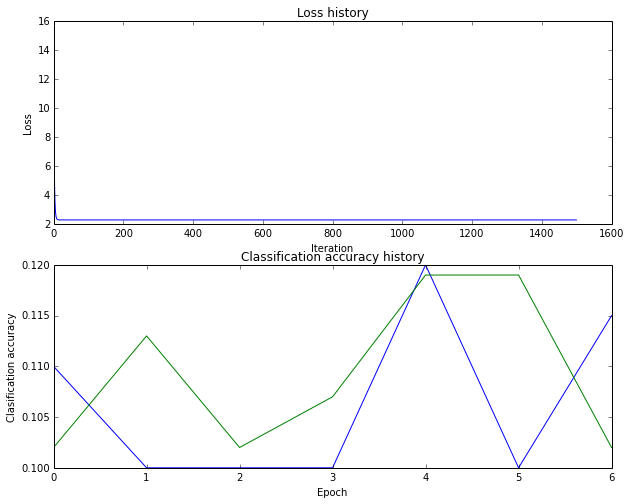

	training accuracy: (9.995918), validation accuracy: (10.200000)
(256) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:500, learn_rate:1.100000e+00)


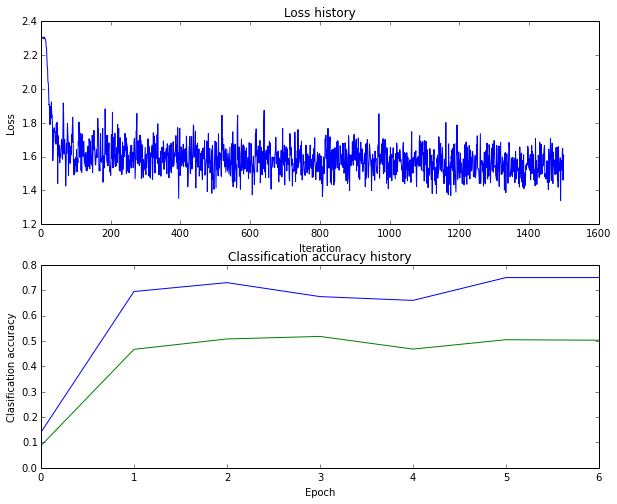

	training accuracy: (54.830612), validation accuracy: (51.700000)
(257) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:50, learn_rate:1.100000e+00)


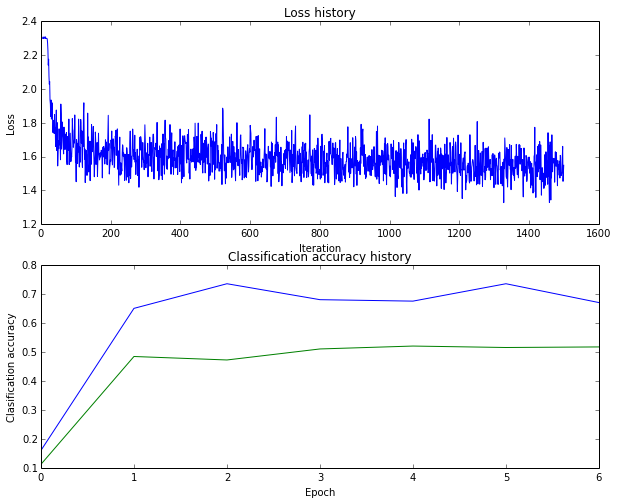

	training accuracy: (51.528571), validation accuracy: (51.900000)
(258) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:100, learn_rate:1.100000e+00)


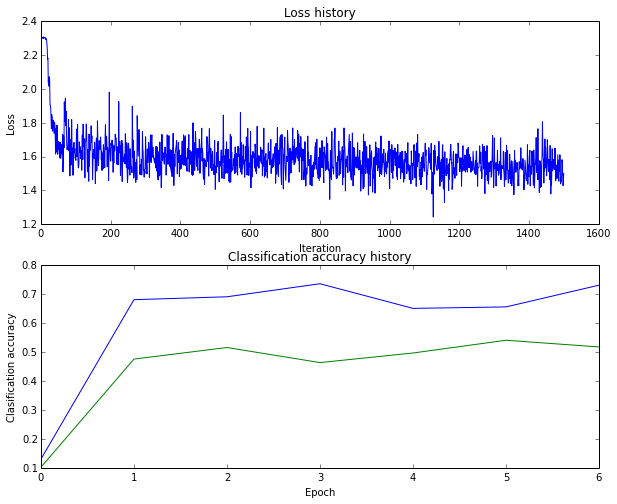

	training accuracy: (54.285714), validation accuracy: (53.000000)
(259) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:200, learn_rate:1.100000e+00)


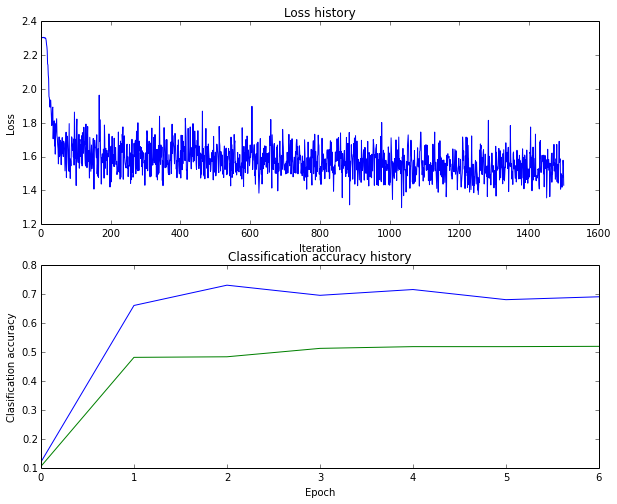

	training accuracy: (51.853061), validation accuracy: (50.700000)
(260) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:500, learn_rate:1.100000e+00)


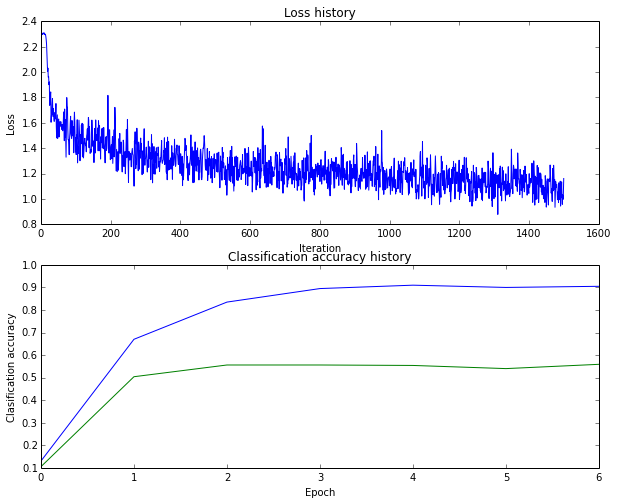

	training accuracy: (69.361224), validation accuracy: (56.200000)
(261) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:50, learn_rate:1.100000e+00)


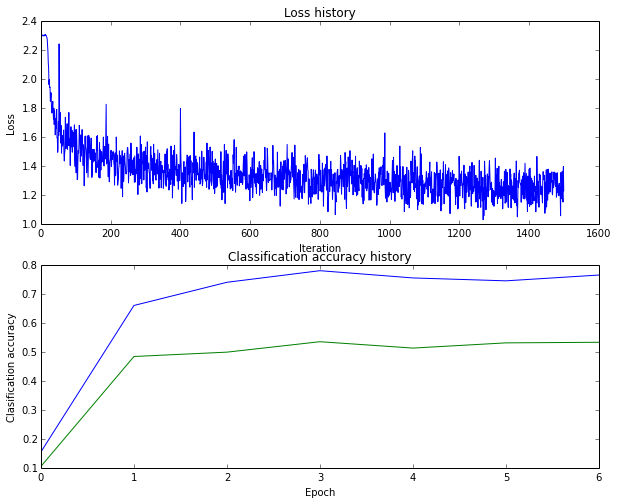

	training accuracy: (59.959184), validation accuracy: (54.900000)
(262) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:100, learn_rate:1.100000e+00)


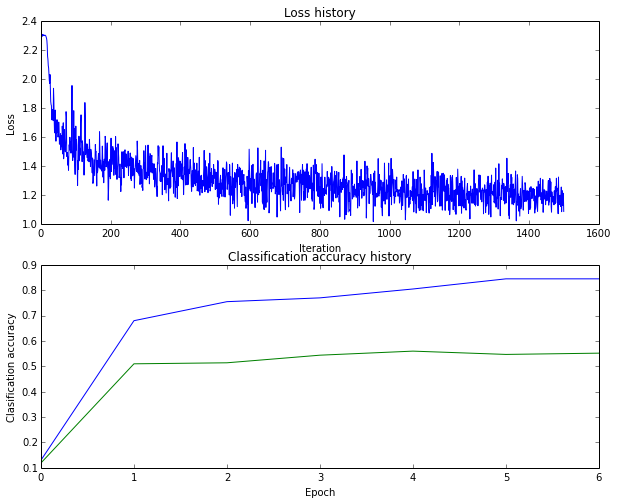

	training accuracy: (62.695918), validation accuracy: (54.800000)
(263) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:200, learn_rate:1.100000e+00)


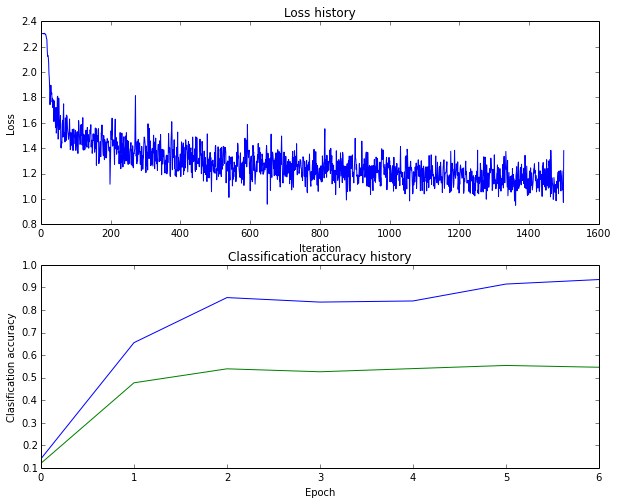

	training accuracy: (64.961224), validation accuracy: (54.000000)
(264) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


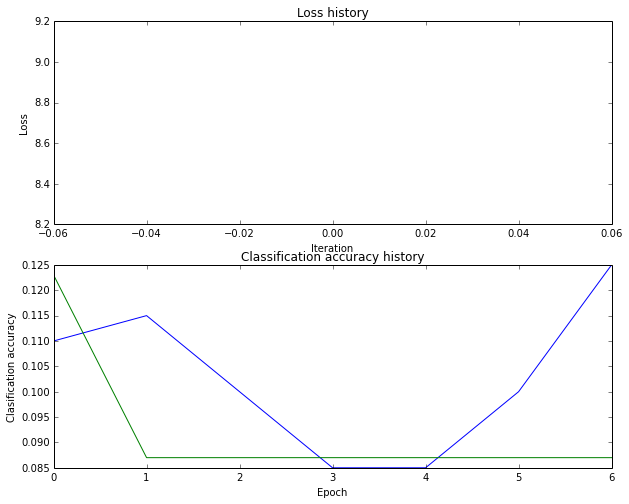

	training accuracy: (10.026531), validation accuracy: (8.700000)
(265) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


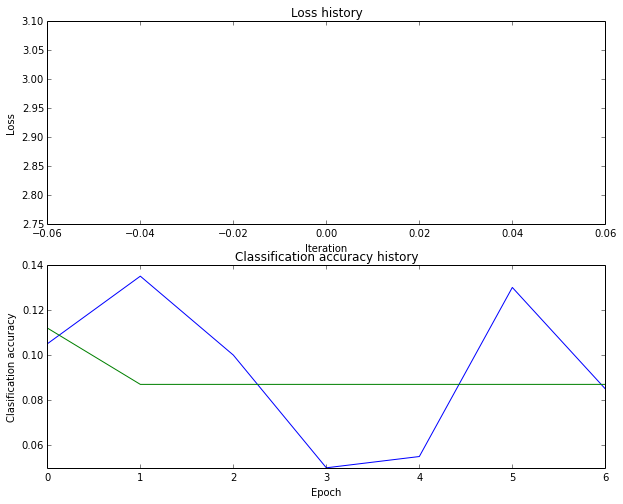

	training accuracy: (10.026531), validation accuracy: (8.700000)
(266) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


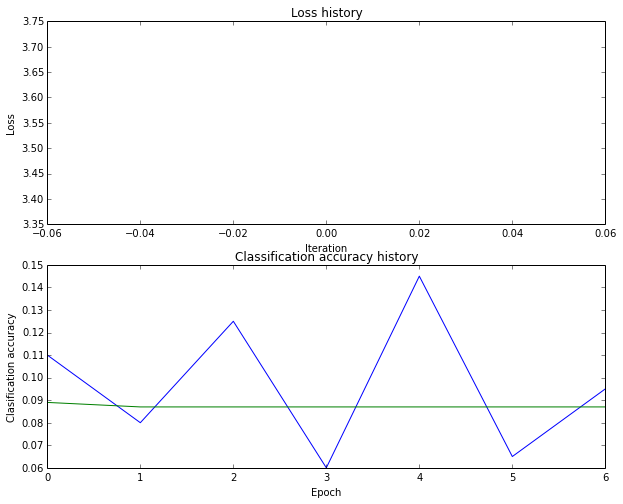

	training accuracy: (10.026531), validation accuracy: (8.700000)
(267) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


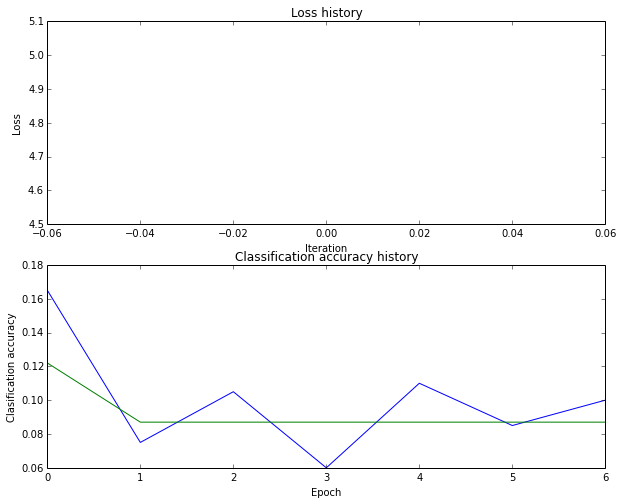

	training accuracy: (10.026531), validation accuracy: (8.700000)
(268) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


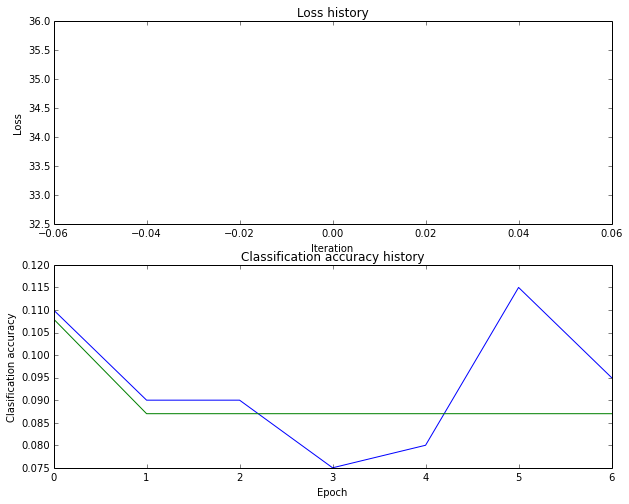

	training accuracy: (10.026531), validation accuracy: (8.700000)
(269) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


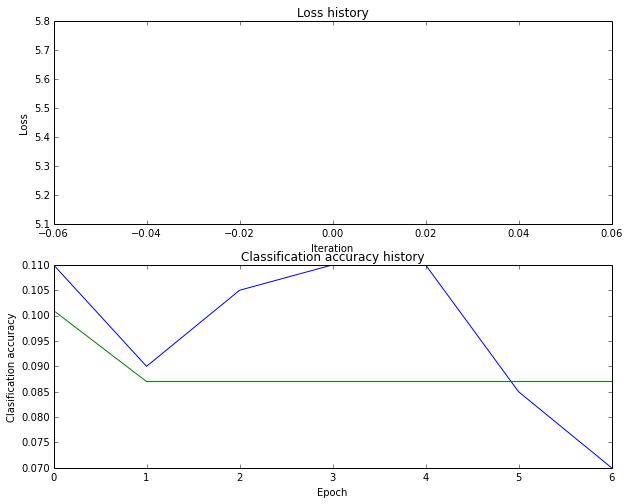

	training accuracy: (10.026531), validation accuracy: (8.700000)
(270) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


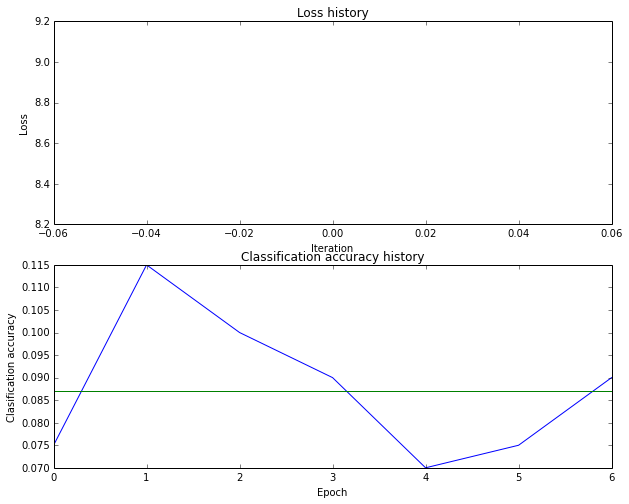

	training accuracy: (10.026531), validation accuracy: (8.700000)
(271) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


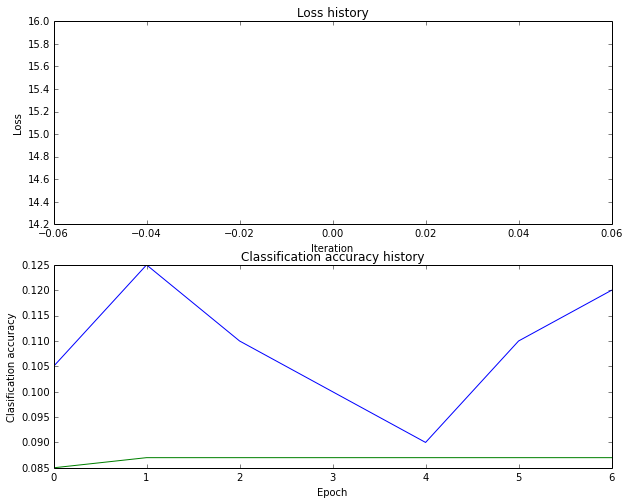

	training accuracy: (10.026531), validation accuracy: (8.700000)
(272) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:500, learn_rate:9.000000e-01)


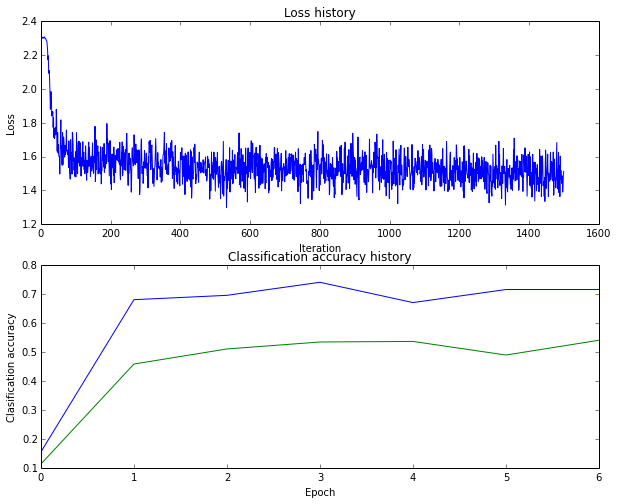

	training accuracy: (54.289796), validation accuracy: (51.900000)
(273) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:50, learn_rate:9.000000e-01)


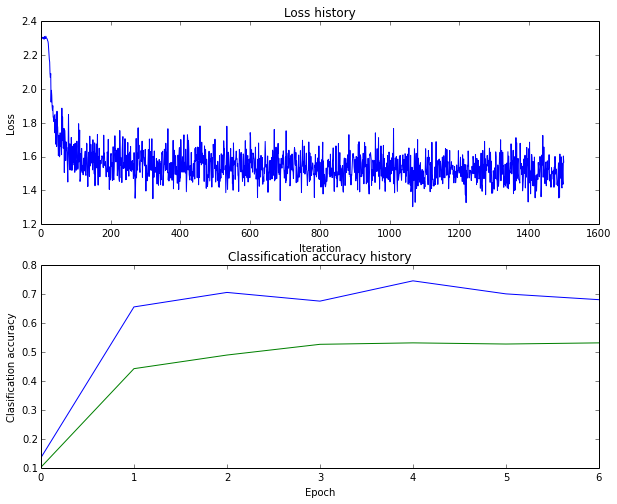

	training accuracy: (54.222449), validation accuracy: (51.200000)
(274) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:100, learn_rate:9.000000e-01)


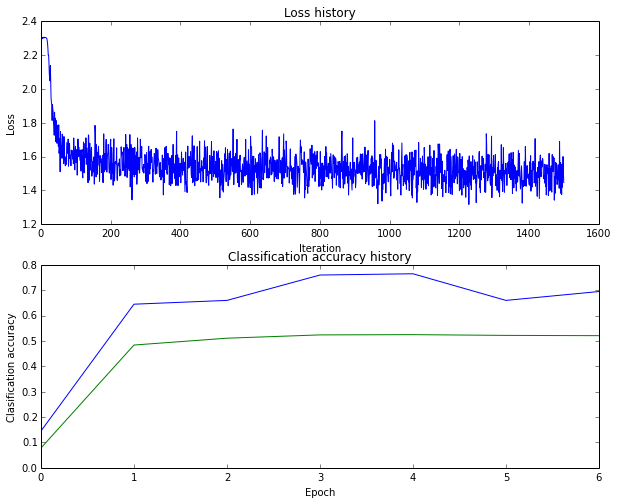

	training accuracy: (54.465306), validation accuracy: (52.400000)
(275) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:200, learn_rate:9.000000e-01)


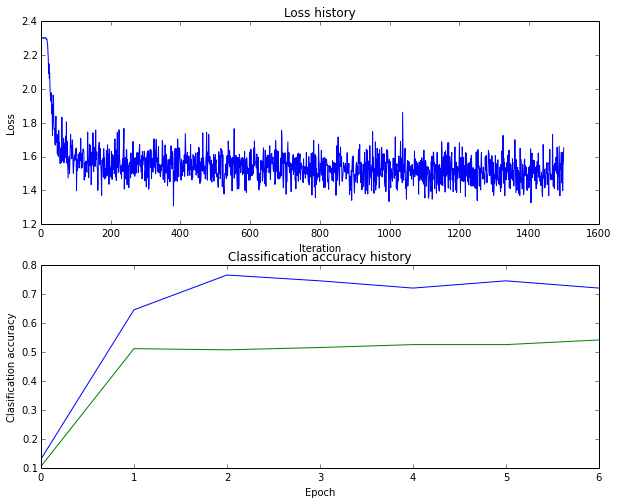

	training accuracy: (55.808163), validation accuracy: (55.000000)
(276) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:500, learn_rate:9.000000e-01)


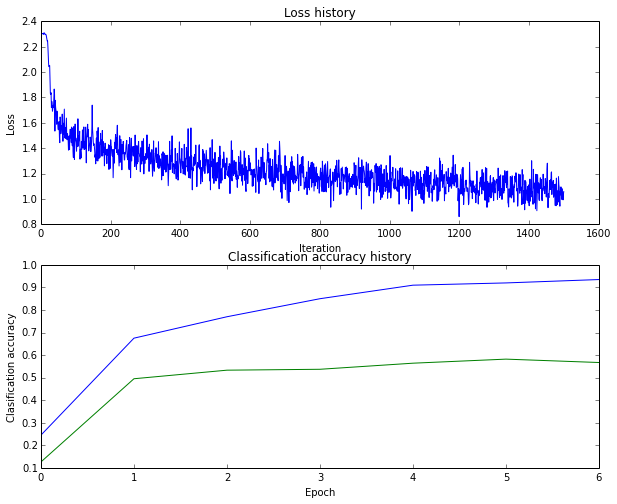

	training accuracy: (70.075510), validation accuracy: (57.400000)
(277) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:50, learn_rate:9.000000e-01)


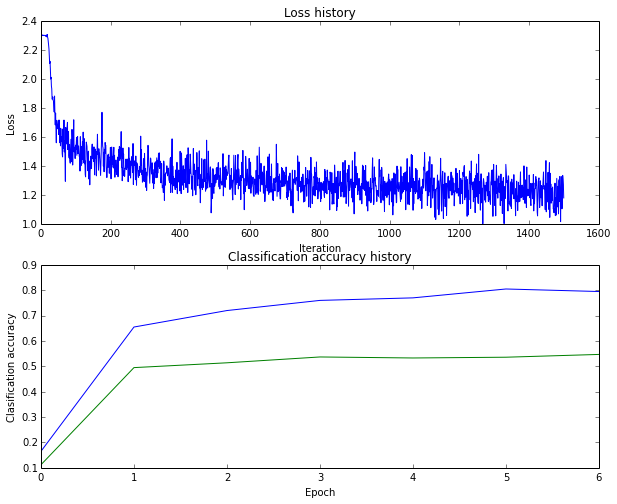

	training accuracy: (59.140816), validation accuracy: (53.000000)
(278) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:100, learn_rate:9.000000e-01)


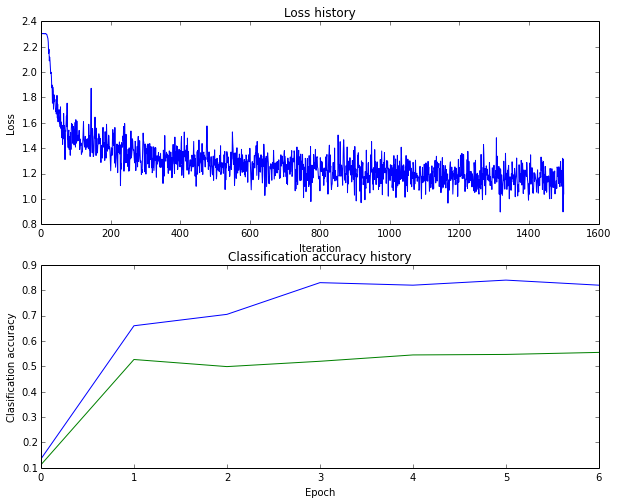

	training accuracy: (64.020408), validation accuracy: (56.300000)
(279) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:200, learn_rate:9.000000e-01)


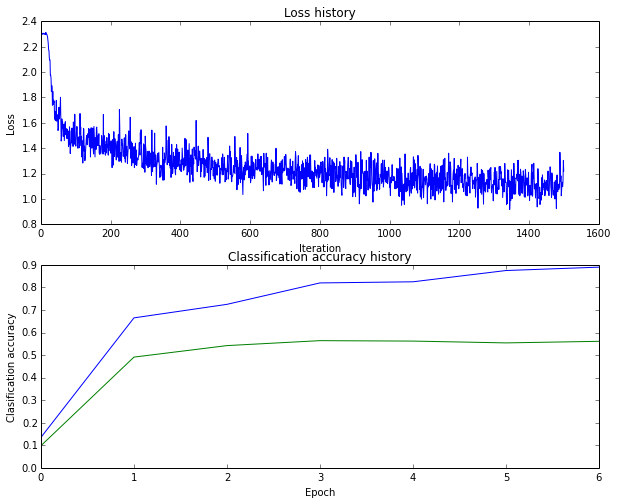

	training accuracy: (65.695918), validation accuracy: (56.400000)
(280) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


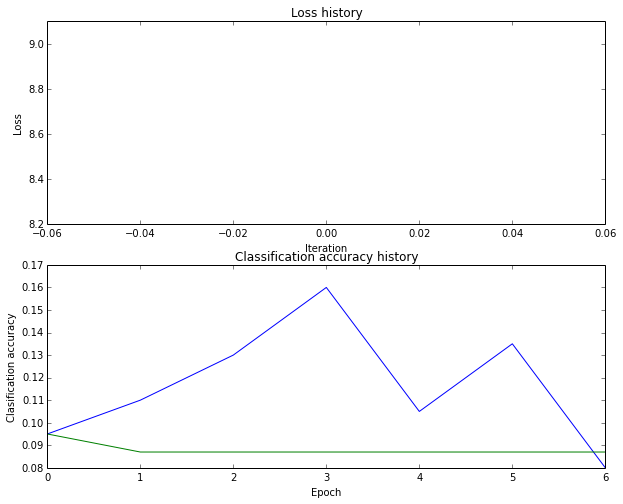

	training accuracy: (10.026531), validation accuracy: (8.700000)
(281) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


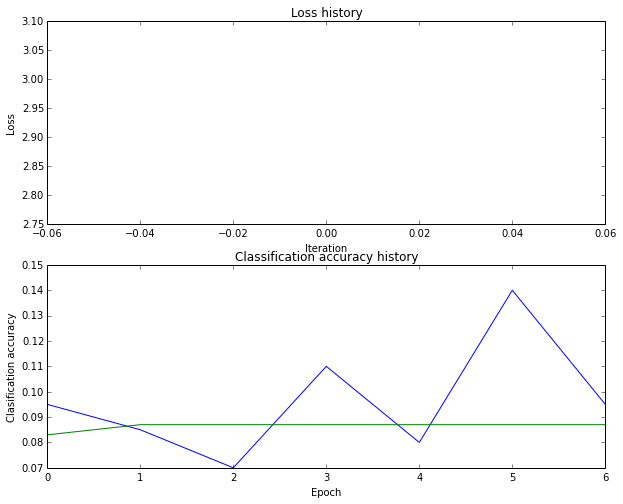

	training accuracy: (10.026531), validation accuracy: (8.700000)
(282) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


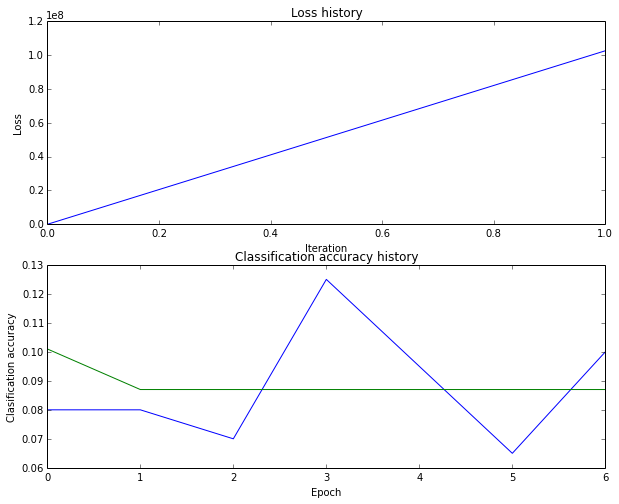

	training accuracy: (10.026531), validation accuracy: (8.700000)
(283) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


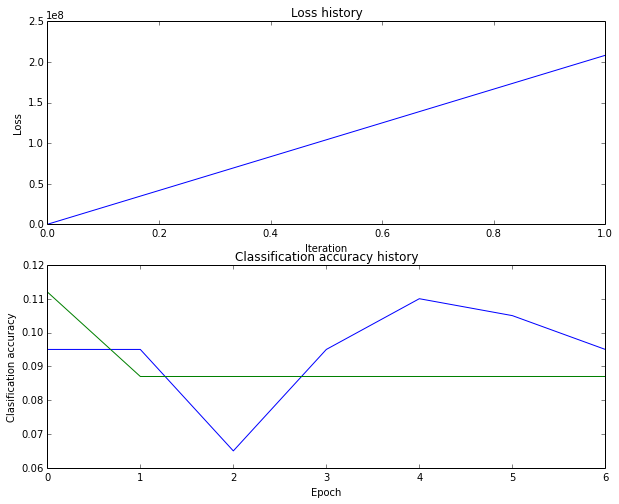

	training accuracy: (10.026531), validation accuracy: (8.700000)
(284) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


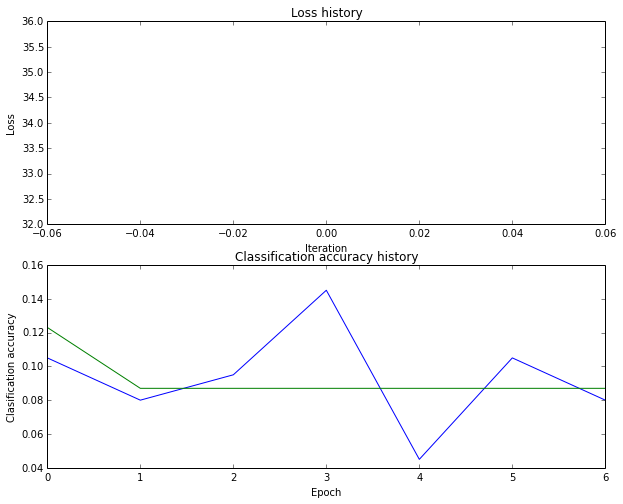

	training accuracy: (10.026531), validation accuracy: (8.700000)
(285) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


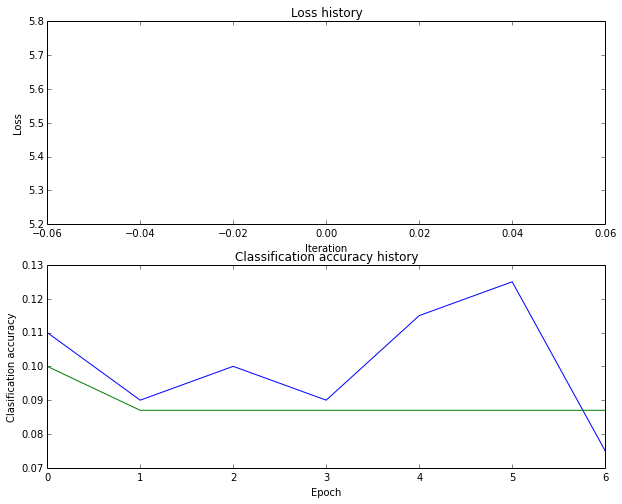

	training accuracy: (10.026531), validation accuracy: (8.700000)
(286) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


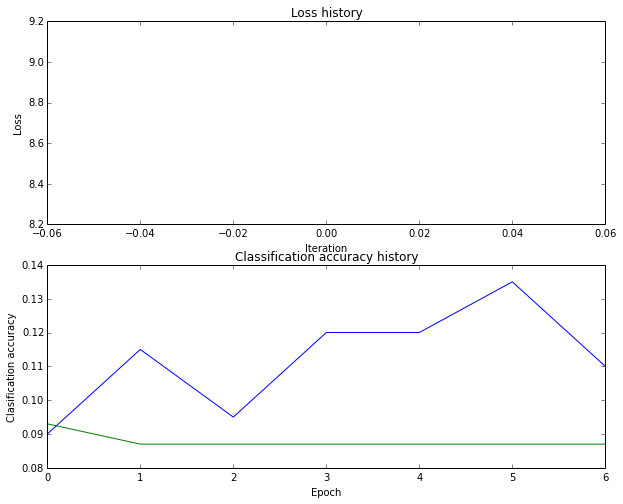

	training accuracy: (10.026531), validation accuracy: (8.700000)
(287) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


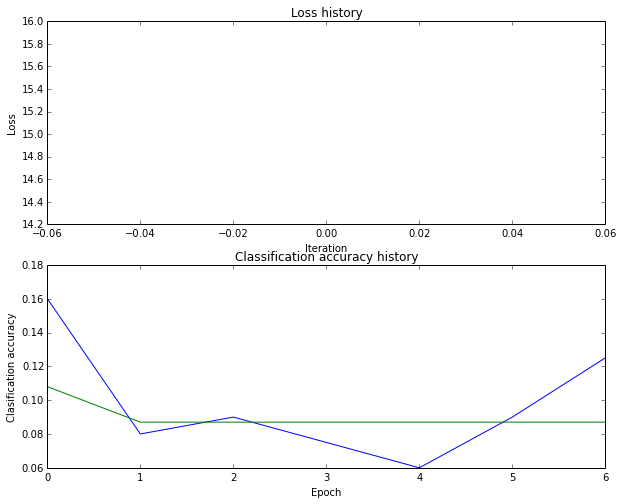

	training accuracy: (10.026531), validation accuracy: (8.700000)
(288) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:500, learn_rate:2.000000e-06)


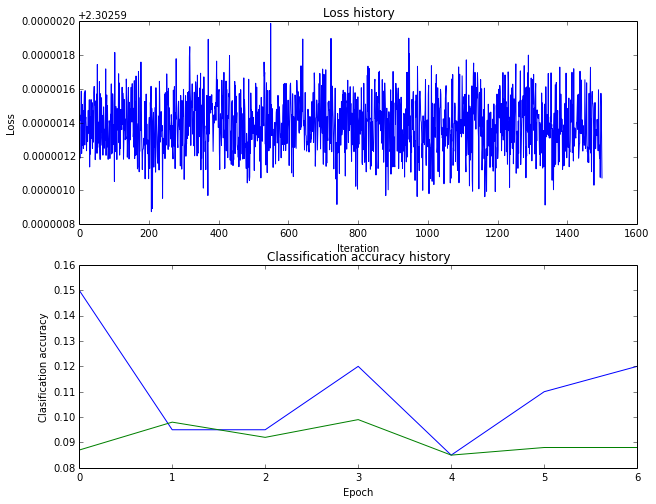

	training accuracy: (10.200000), validation accuracy: (9.200000)
(289) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:50, learn_rate:2.000000e-06)


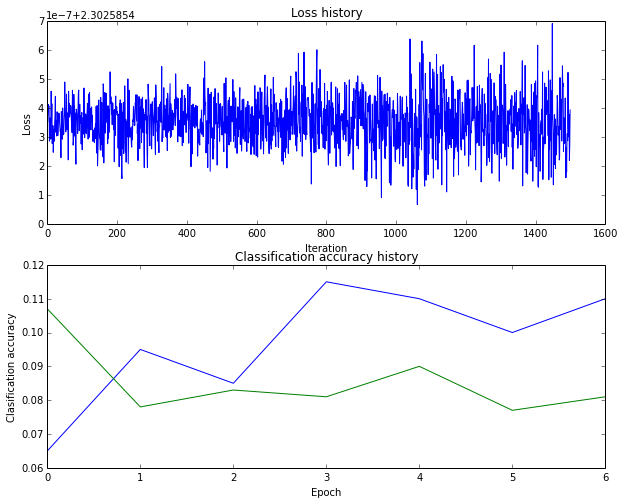

	training accuracy: (9.926531), validation accuracy: (7.300000)
(290) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:100, learn_rate:2.000000e-06)


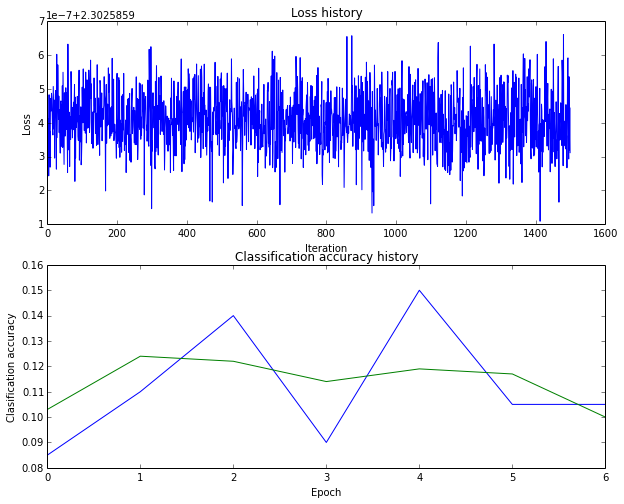

	training accuracy: (11.075510), validation accuracy: (10.400000)
(291) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:200, learn_rate:2.000000e-06)


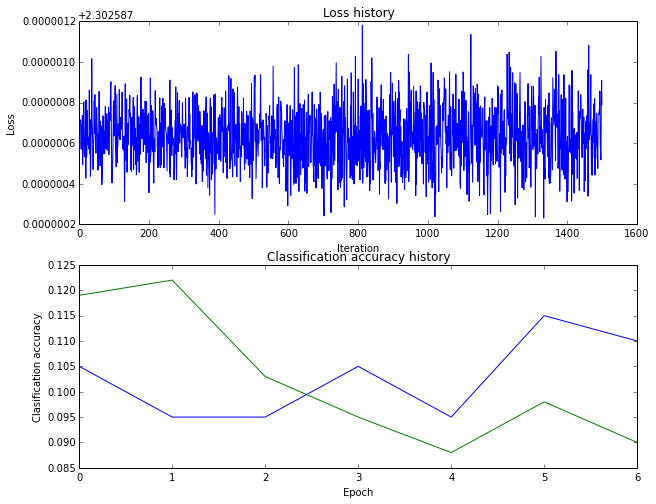

	training accuracy: (10.959184), validation accuracy: (9.600000)
(292) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:500, learn_rate:2.000000e-06)


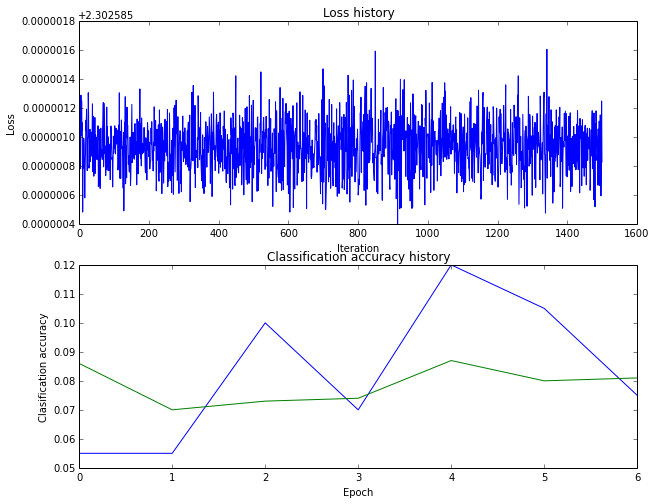

	training accuracy: (7.504082), validation accuracy: (7.800000)
(293) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:50, learn_rate:2.000000e-06)


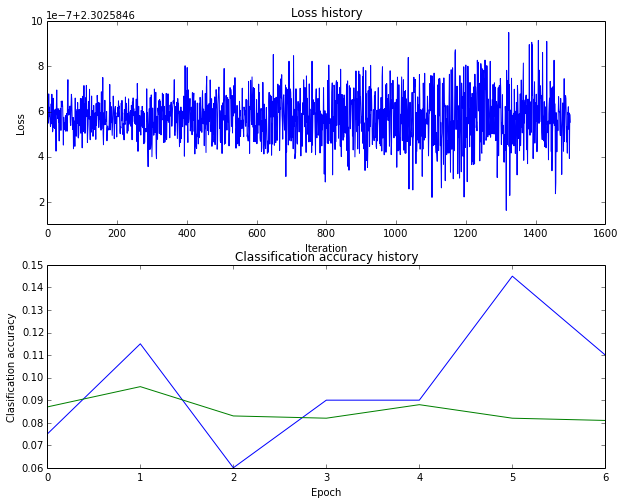

	training accuracy: (9.367347), validation accuracy: (8.300000)
(294) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:100, learn_rate:2.000000e-06)


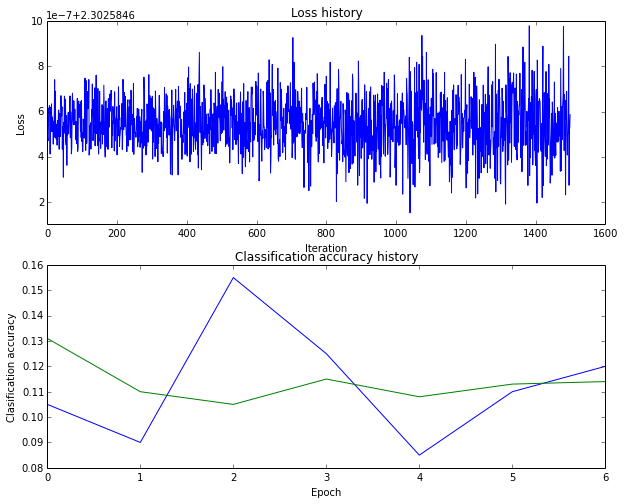

	training accuracy: (13.024490), validation accuracy: (11.500000)
(295) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:200, learn_rate:2.000000e-06)


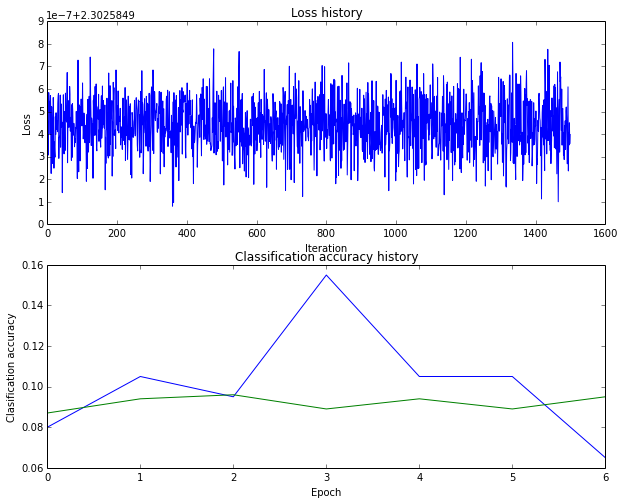

	training accuracy: (10.642857), validation accuracy: (9.300000)
(296) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


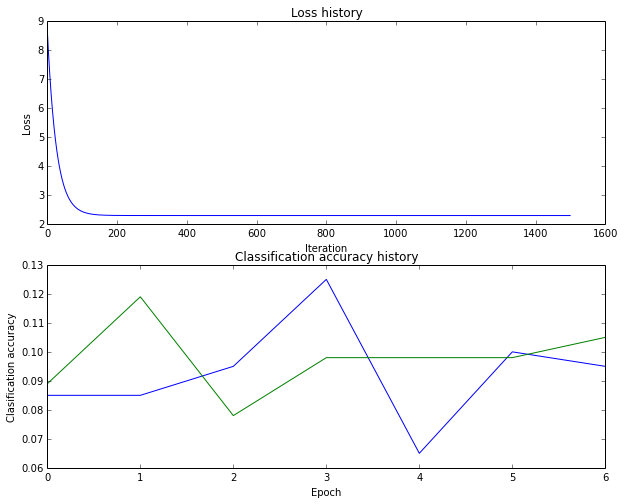

	training accuracy: (10.042857), validation accuracy: (7.900000)
(297) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


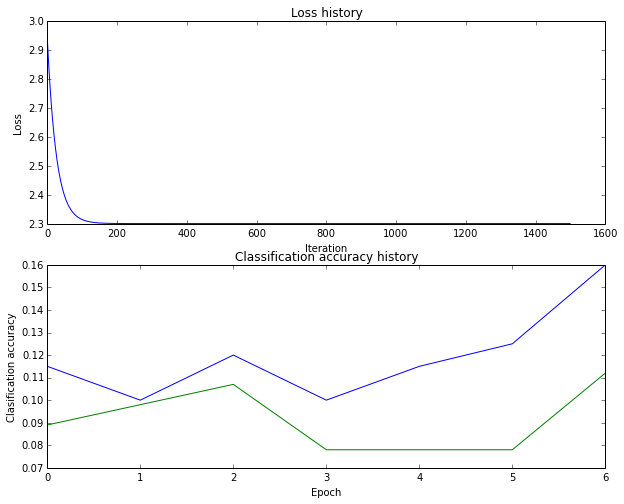

	training accuracy: (9.975510), validation accuracy: (11.200000)
(298) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


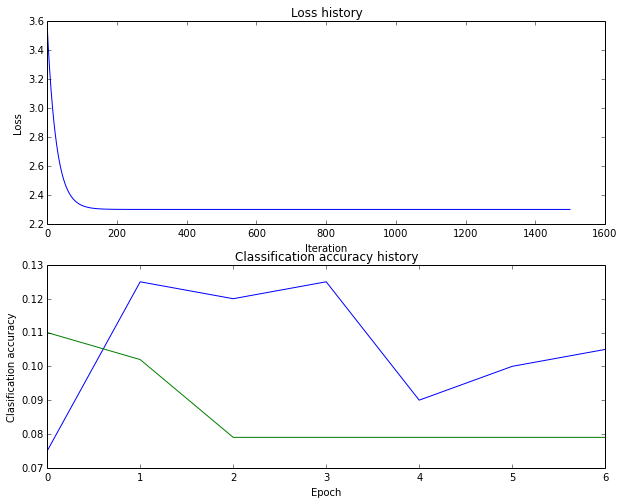

	training accuracy: (10.042857), validation accuracy: (7.900000)
(299) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


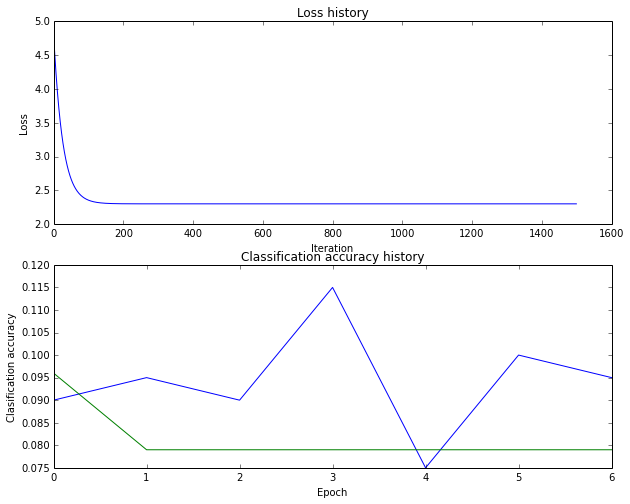

	training accuracy: (10.042857), validation accuracy: (7.900000)
(300) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


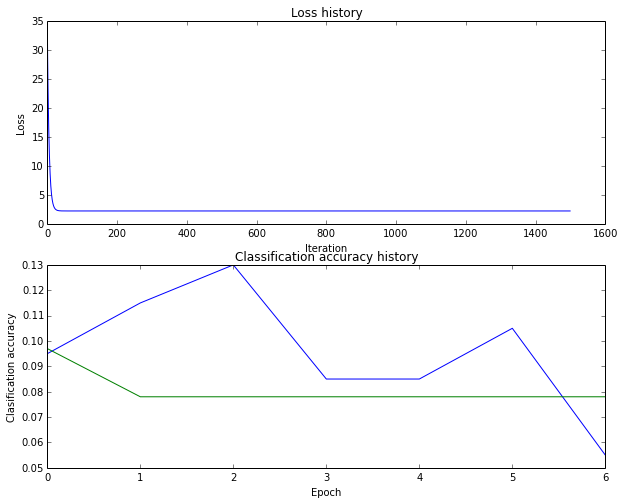

	training accuracy: (10.044898), validation accuracy: (7.800000)
(301) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


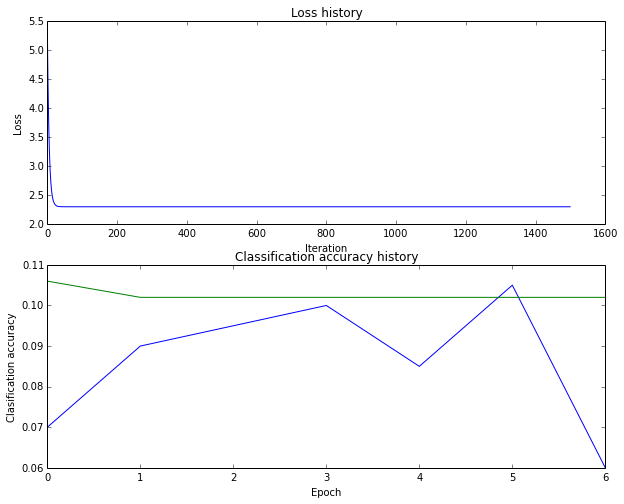

	training accuracy: (9.995918), validation accuracy: (10.200000)
(302) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


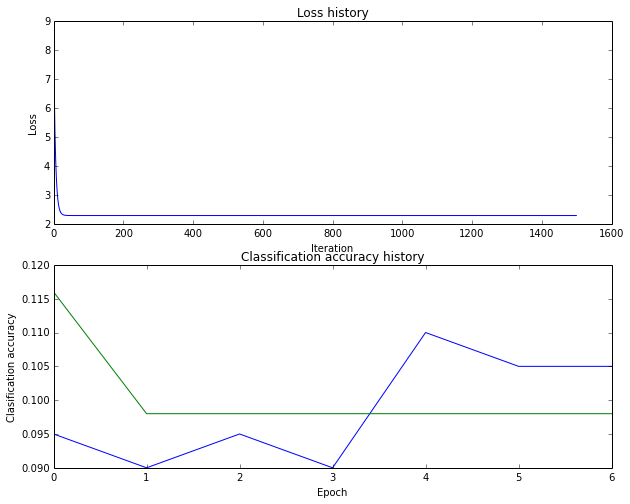

	training accuracy: (10.004082), validation accuracy: (9.800000)
(303) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


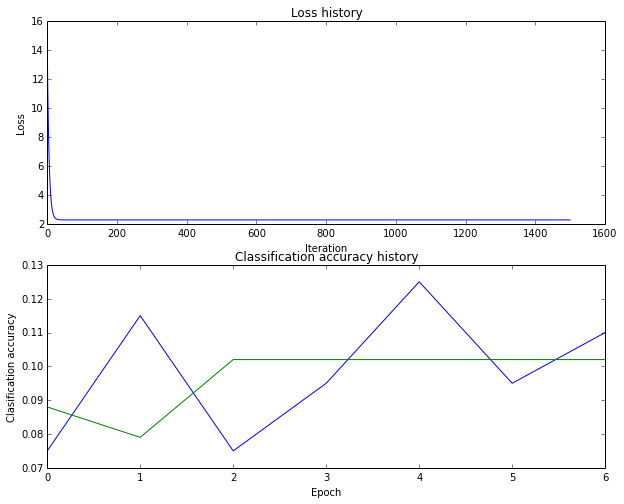

	training accuracy: (9.995918), validation accuracy: (10.200000)
(304) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:500, learn_rate:5.000000e-06)


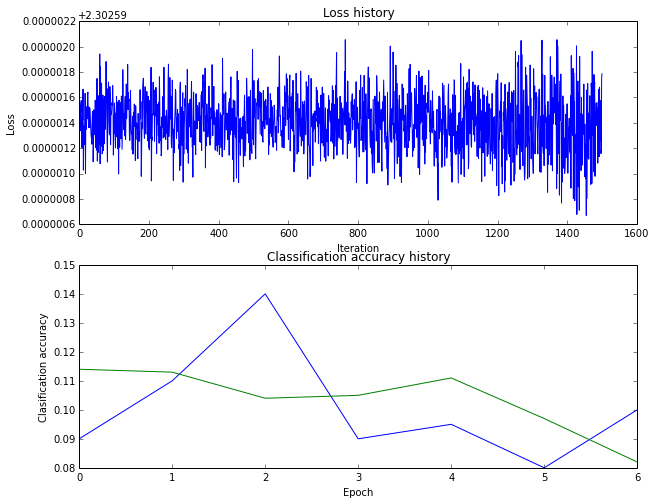

	training accuracy: (9.826531), validation accuracy: (8.500000)
(305) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:50, learn_rate:5.000000e-06)


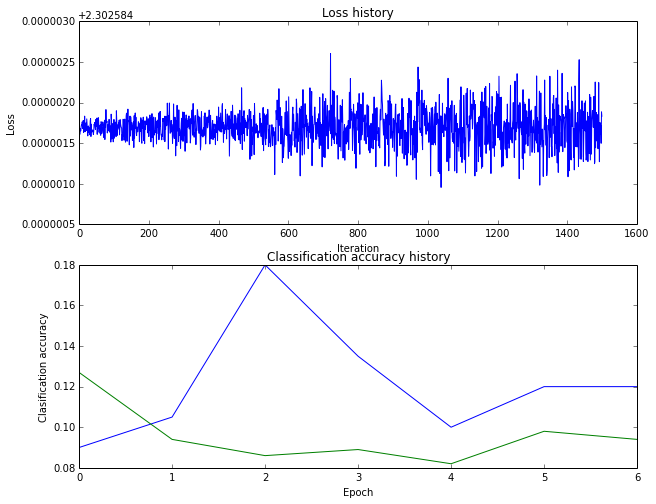

	training accuracy: (10.481633), validation accuracy: (9.800000)
(306) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:100, learn_rate:5.000000e-06)


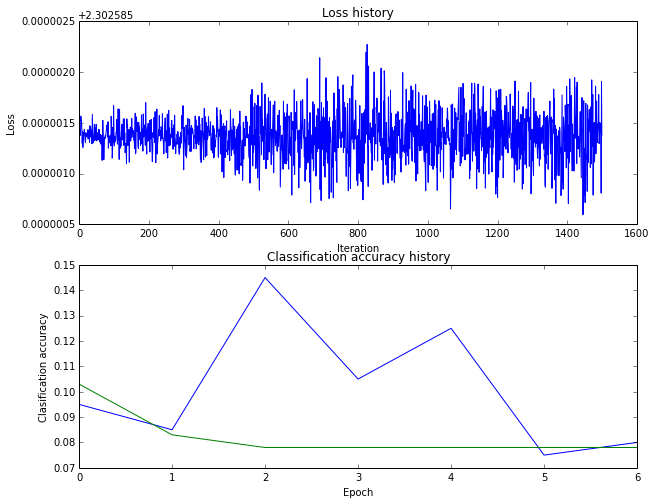

	training accuracy: (10.073469), validation accuracy: (7.800000)
(307) of (384)
Running Train and validation for (bins:100, reg:1.000000e-02, hidden_size:200, learn_rate:5.000000e-06)


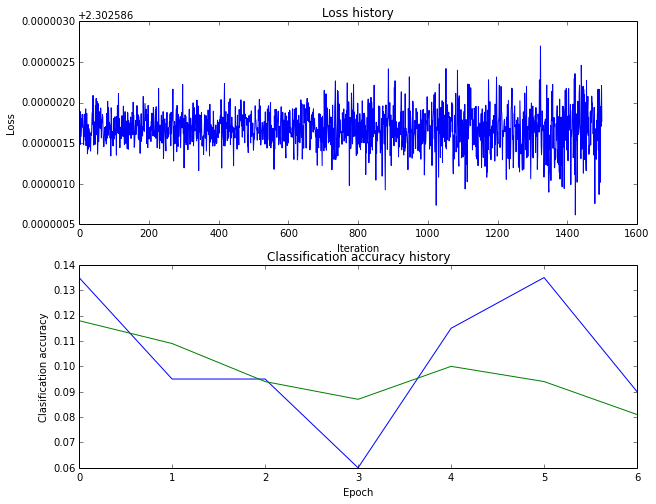

	training accuracy: (10.063265), validation accuracy: (7.800000)
(308) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:500, learn_rate:5.000000e-06)


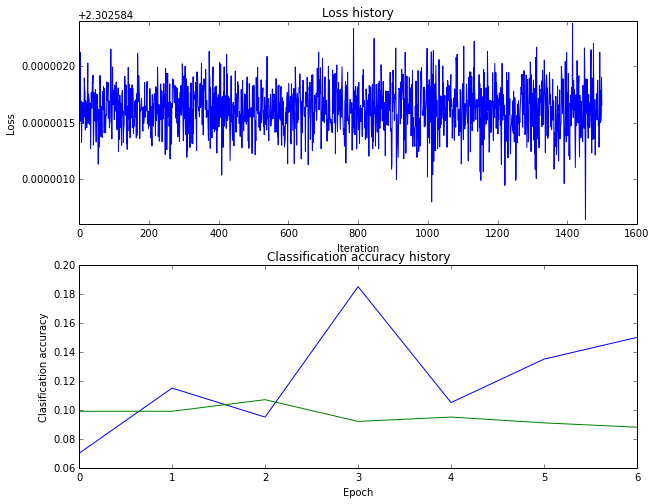

	training accuracy: (11.279592), validation accuracy: (8.700000)
(309) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:50, learn_rate:5.000000e-06)


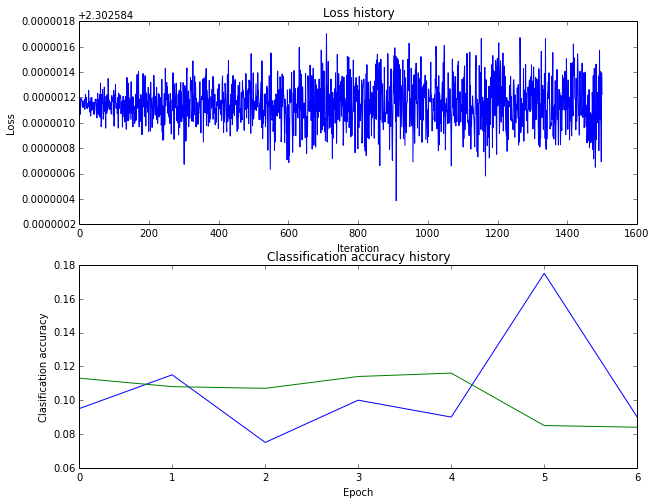

	training accuracy: (9.977551), validation accuracy: (8.400000)
(310) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:100, learn_rate:5.000000e-06)


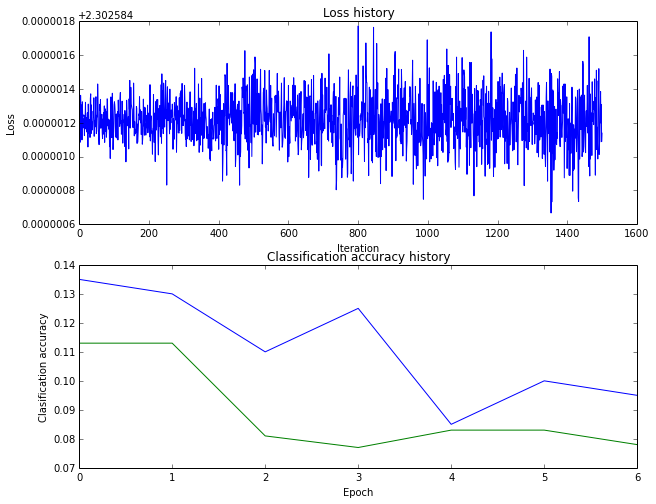

	training accuracy: (10.346939), validation accuracy: (7.700000)
(311) of (384)
Running Train and validation for (bins:100, reg:1.000000e-03, hidden_size:200, learn_rate:5.000000e-06)


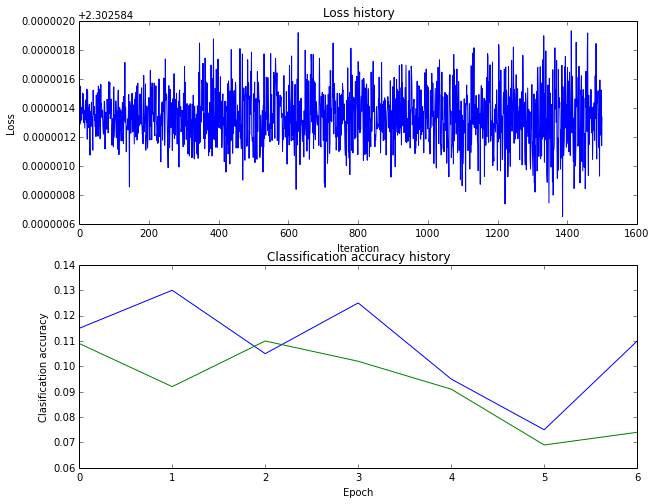

	training accuracy: (9.993878), validation accuracy: (7.300000)
(312) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


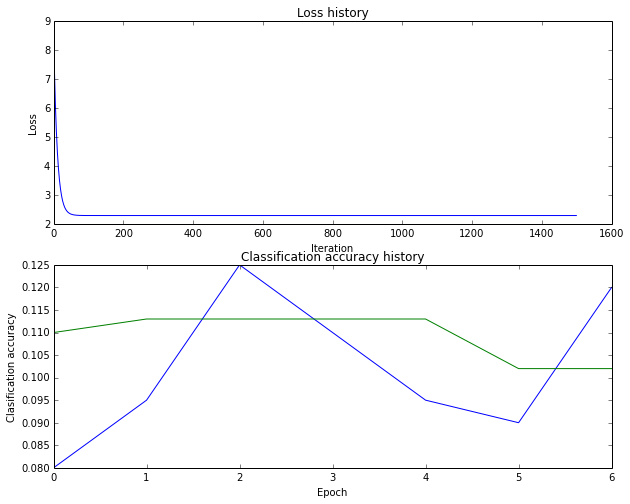

	training accuracy: (9.995918), validation accuracy: (10.200000)
(313) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


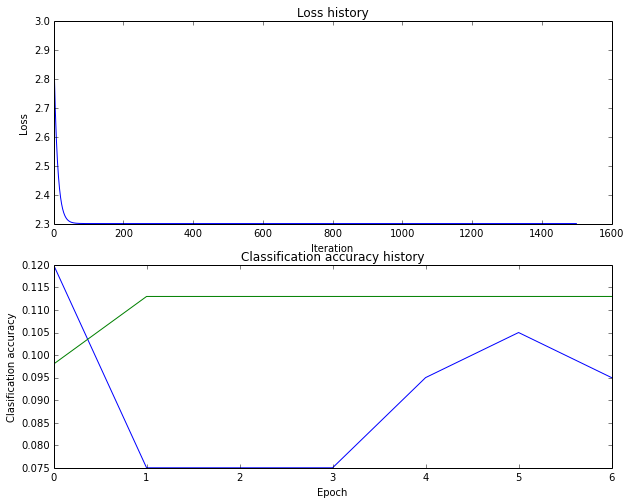

	training accuracy: (9.973469), validation accuracy: (11.300000)
(314) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


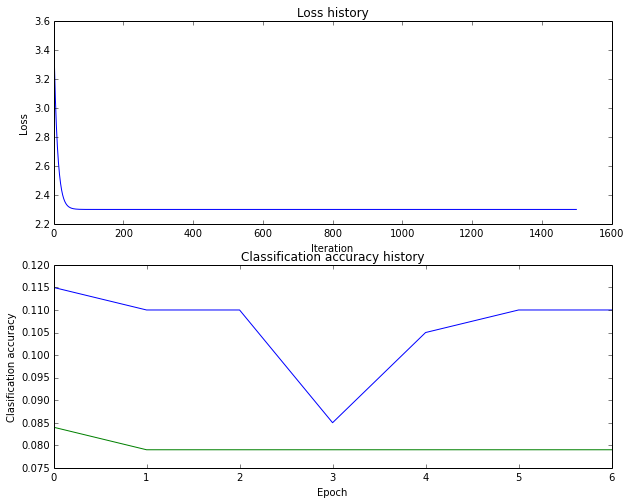

	training accuracy: (10.042857), validation accuracy: (7.900000)
(315) of (384)
Running Train and validation for (bins:100, reg:1.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


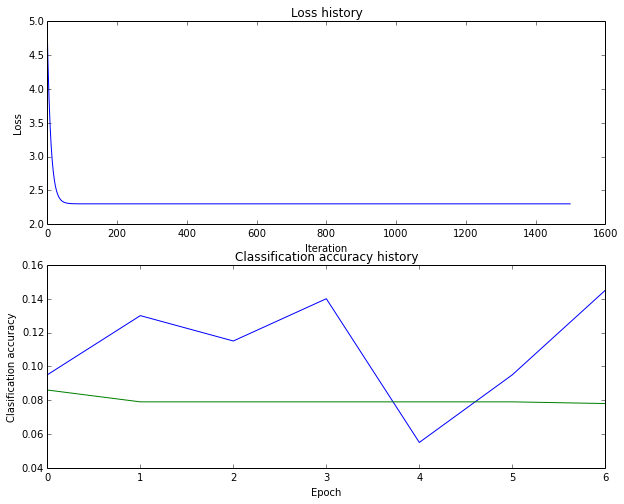

	training accuracy: (10.044898), validation accuracy: (7.800000)
(316) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


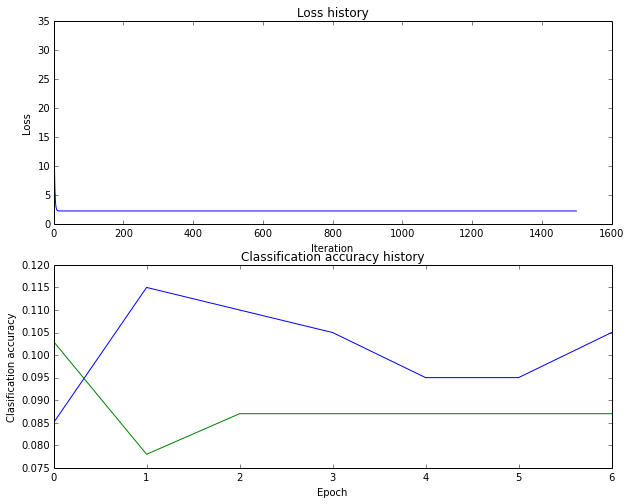

	training accuracy: (10.026531), validation accuracy: (8.700000)
(317) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


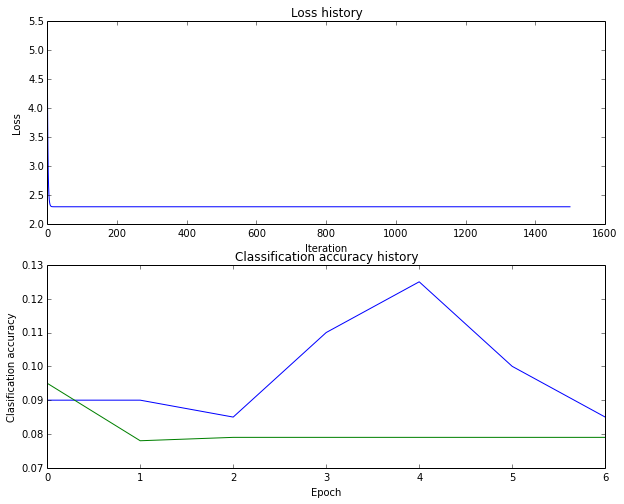

	training accuracy: (10.042857), validation accuracy: (7.900000)
(318) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


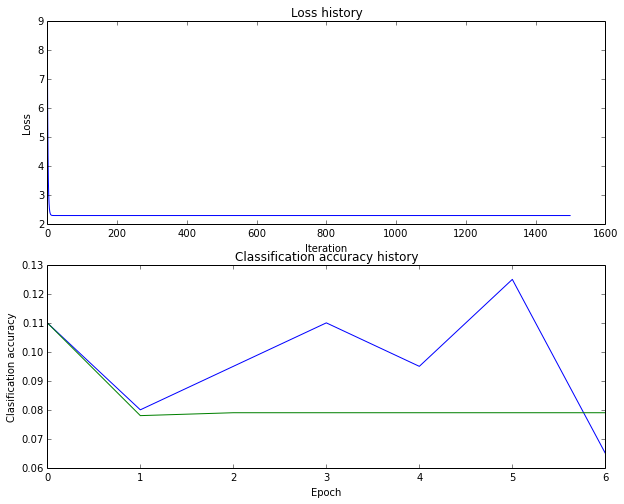

	training accuracy: (10.042857), validation accuracy: (7.900000)
(319) of (384)
Running Train and validation for (bins:100, reg:5.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


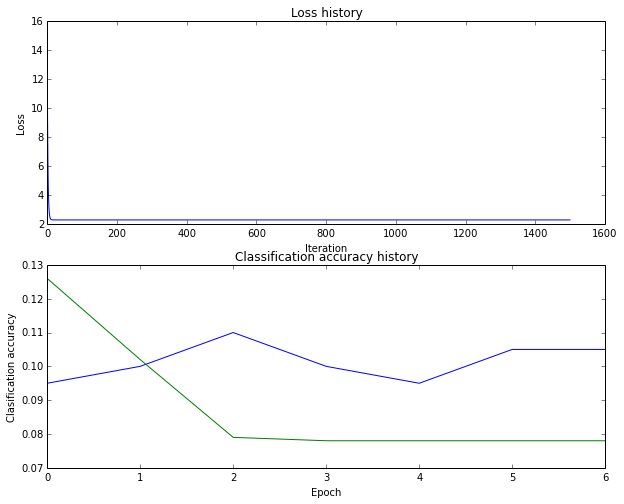

	training accuracy: (10.044898), validation accuracy: (7.800000)
(320) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:500, learn_rate:1.100000e+00)


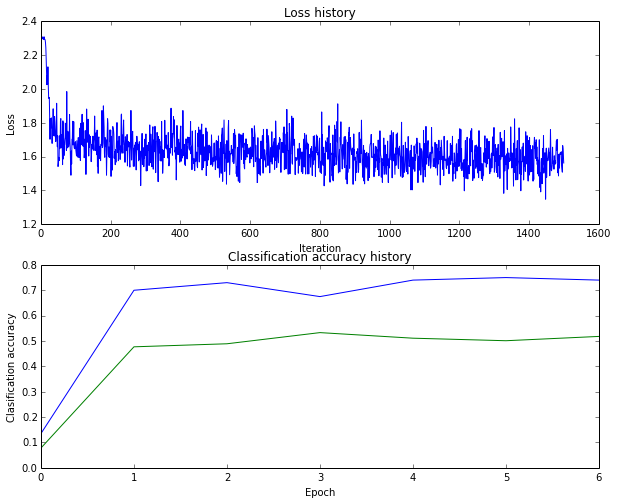

	training accuracy: (52.908163), validation accuracy: (52.100000)
(321) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:50, learn_rate:1.100000e+00)


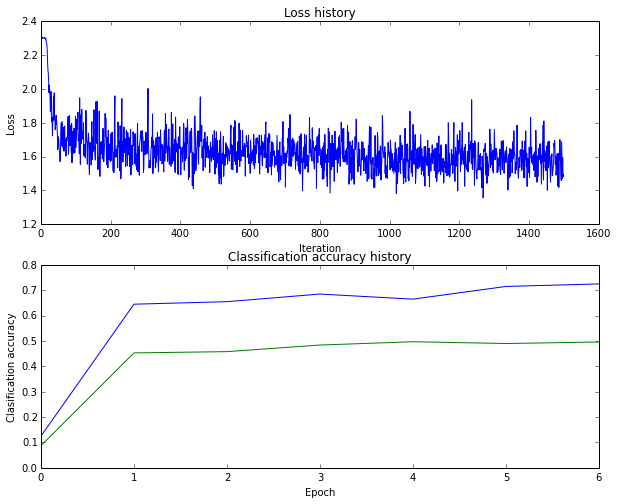

	training accuracy: (52.591837), validation accuracy: (52.400000)
(322) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:100, learn_rate:1.100000e+00)


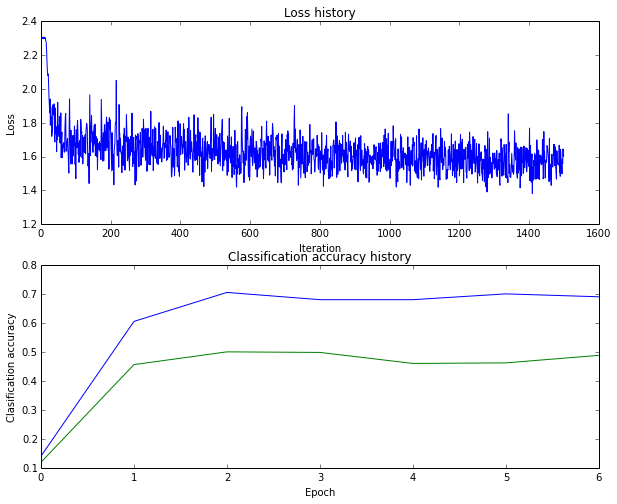

	training accuracy: (53.540816), validation accuracy: (51.500000)
(323) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:200, learn_rate:1.100000e+00)


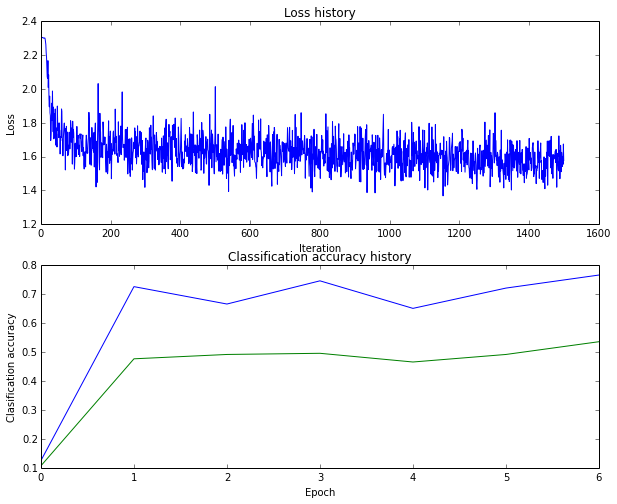

	training accuracy: (53.910204), validation accuracy: (52.100000)
(324) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:500, learn_rate:1.100000e+00)


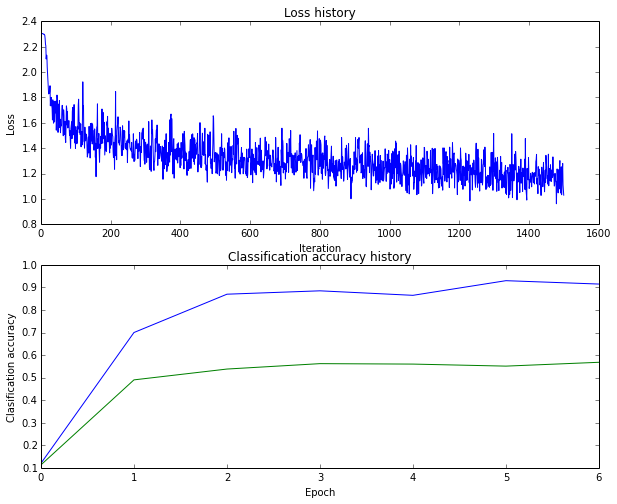

	training accuracy: (68.038776), validation accuracy: (53.800000)
(325) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:50, learn_rate:1.100000e+00)


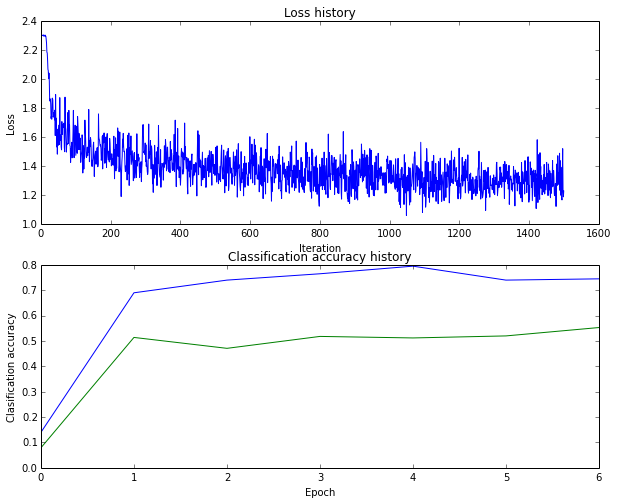

	training accuracy: (58.975510), validation accuracy: (54.100000)
(326) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:100, learn_rate:1.100000e+00)


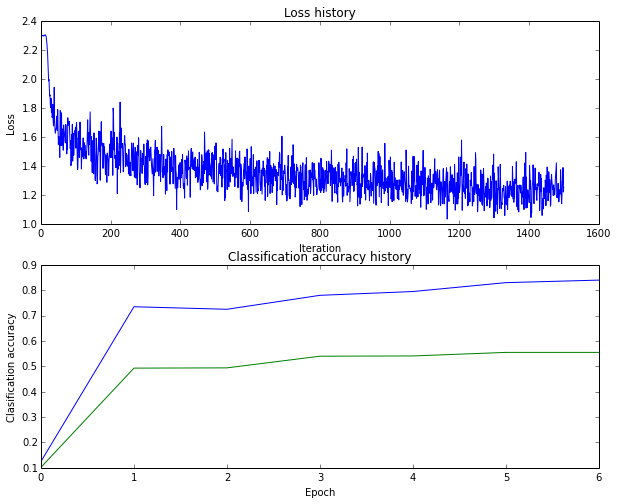

	training accuracy: (62.220408), validation accuracy: (54.900000)
(327) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:200, learn_rate:1.100000e+00)


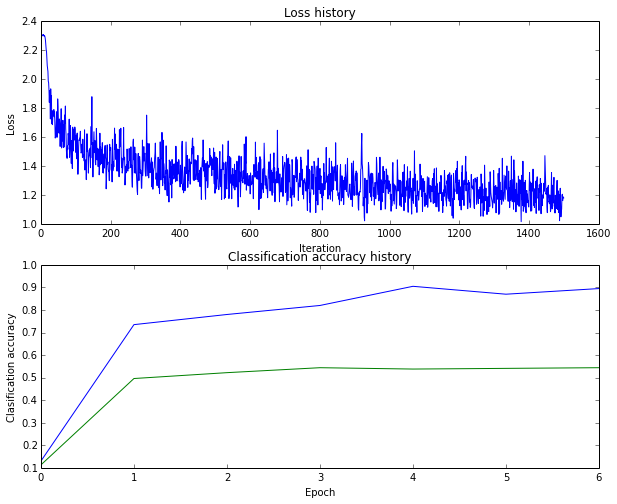

	training accuracy: (66.224490), validation accuracy: (55.600000)
(328) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


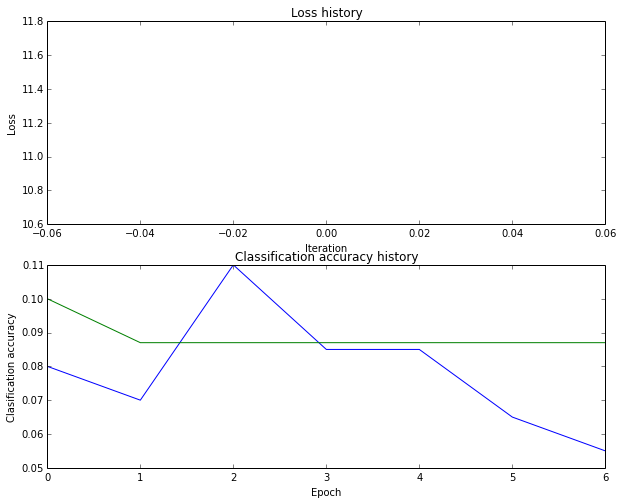

	training accuracy: (10.026531), validation accuracy: (8.700000)
(329) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


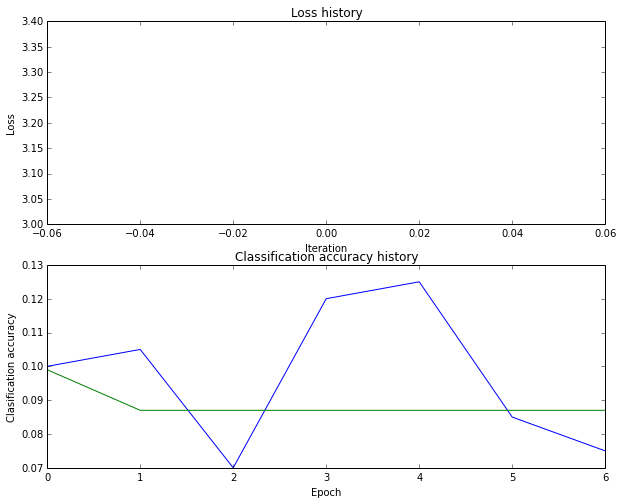

	training accuracy: (10.026531), validation accuracy: (8.700000)
(330) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


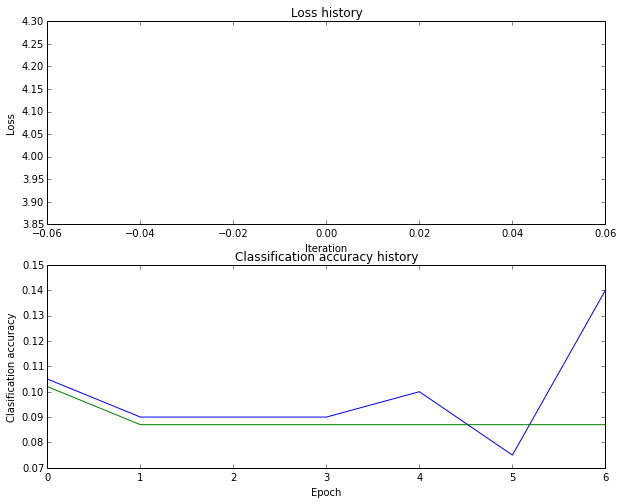

	training accuracy: (10.026531), validation accuracy: (8.700000)
(331) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


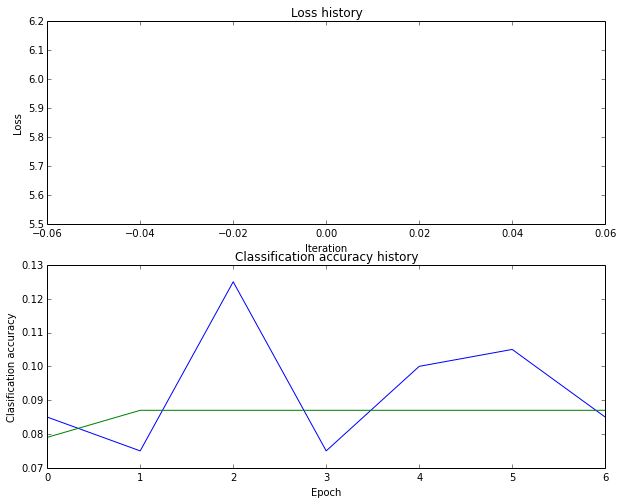

	training accuracy: (10.026531), validation accuracy: (8.700000)
(332) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:500, learn_rate:1.100000e+00)


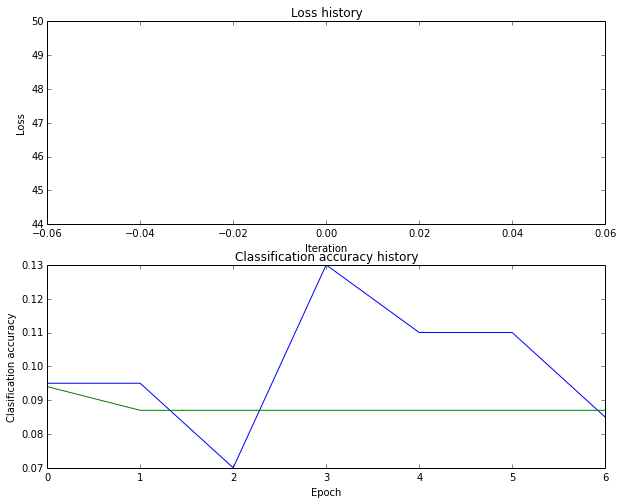

	training accuracy: (10.026531), validation accuracy: (8.700000)
(333) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:50, learn_rate:1.100000e+00)


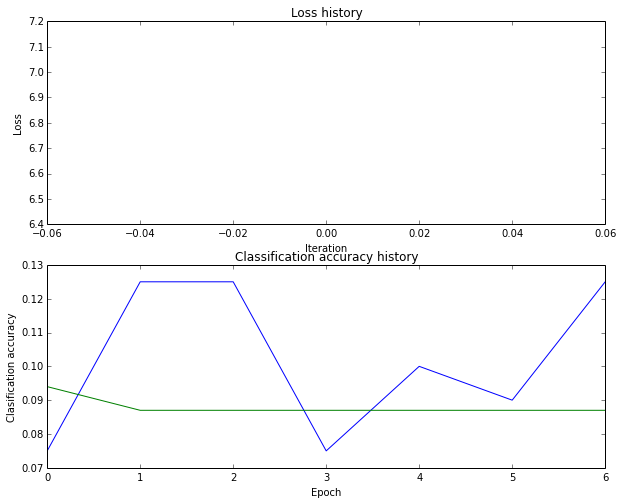

	training accuracy: (10.026531), validation accuracy: (8.700000)
(334) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:100, learn_rate:1.100000e+00)


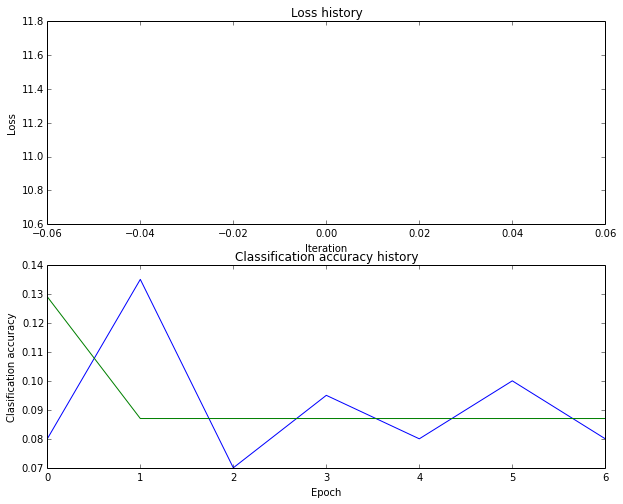

	training accuracy: (10.026531), validation accuracy: (8.700000)
(335) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:200, learn_rate:1.100000e+00)


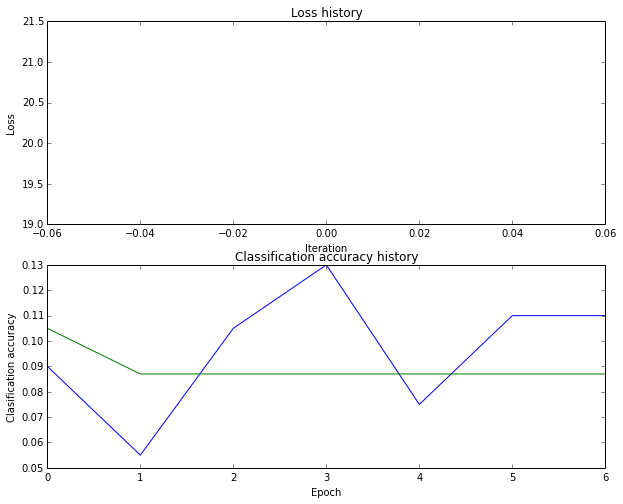

	training accuracy: (10.026531), validation accuracy: (8.700000)
(336) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:500, learn_rate:9.000000e-01)


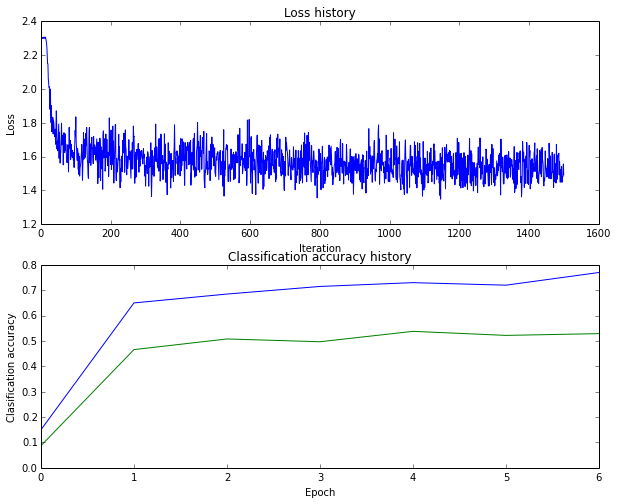

	training accuracy: (55.551020), validation accuracy: (54.900000)
(337) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:50, learn_rate:9.000000e-01)


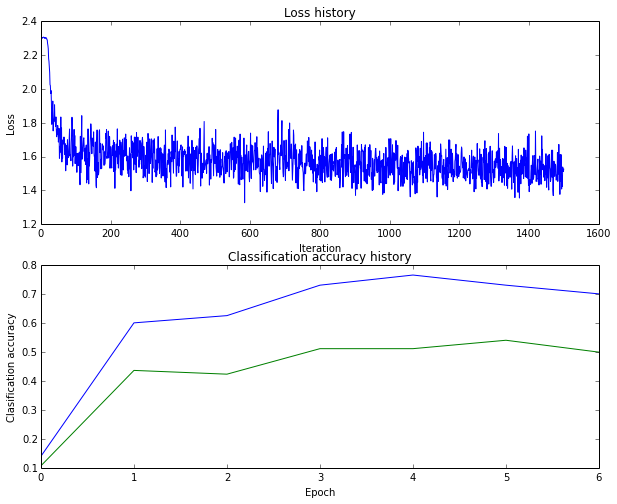

	training accuracy: (53.538776), validation accuracy: (53.300000)
(338) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:100, learn_rate:9.000000e-01)


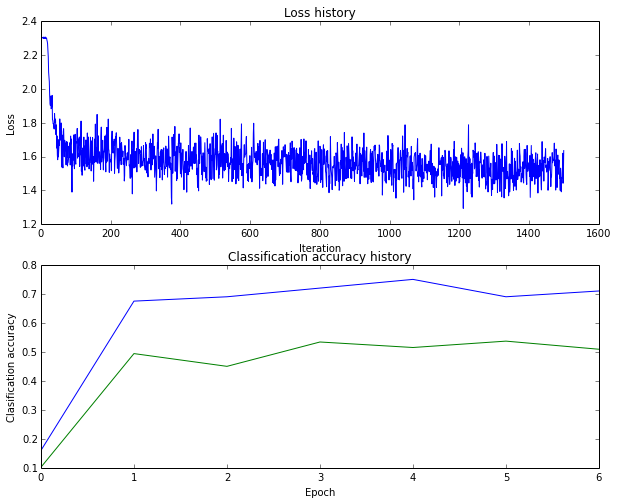

	training accuracy: (54.832653), validation accuracy: (53.000000)
(339) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:200, learn_rate:9.000000e-01)


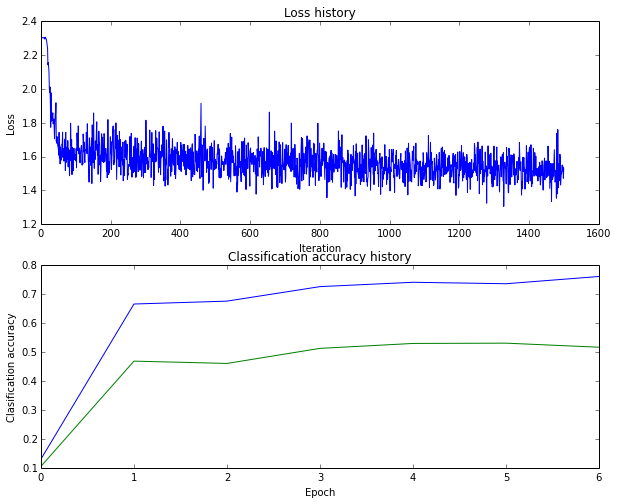

	training accuracy: (54.991837), validation accuracy: (54.300000)
(340) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:500, learn_rate:9.000000e-01)


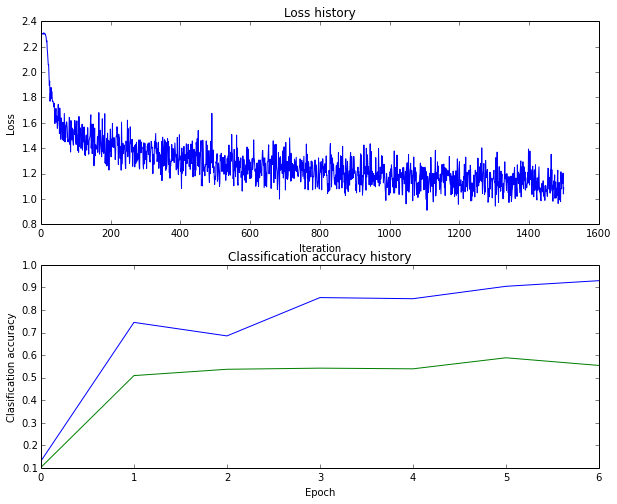

	training accuracy: (69.818367), validation accuracy: (56.700000)
(341) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:50, learn_rate:9.000000e-01)


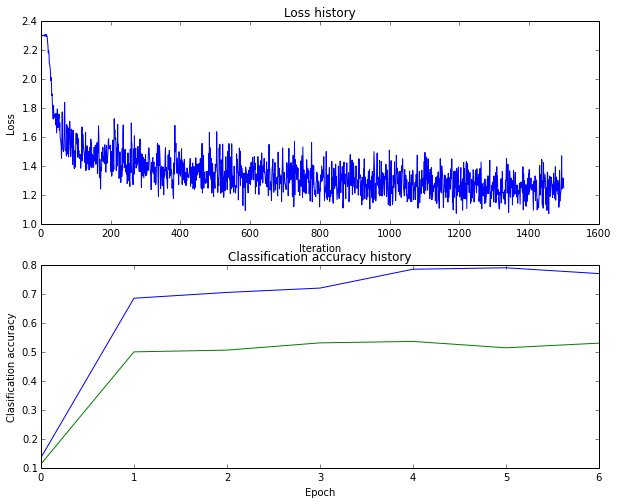

	training accuracy: (59.973469), validation accuracy: (53.800000)
(342) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:100, learn_rate:9.000000e-01)


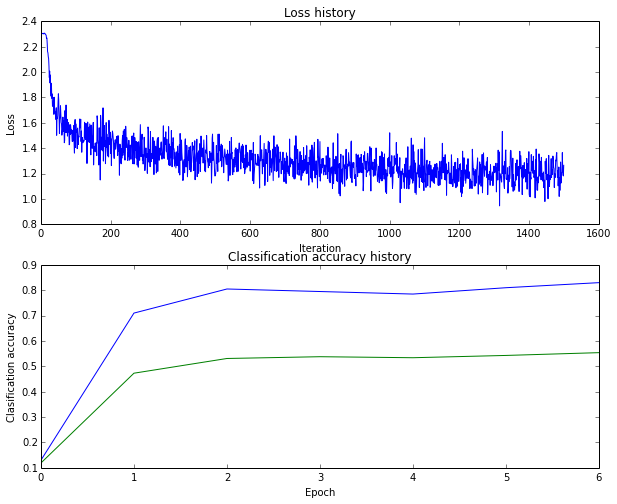

	training accuracy: (64.040816), validation accuracy: (54.000000)
(343) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:200, learn_rate:9.000000e-01)


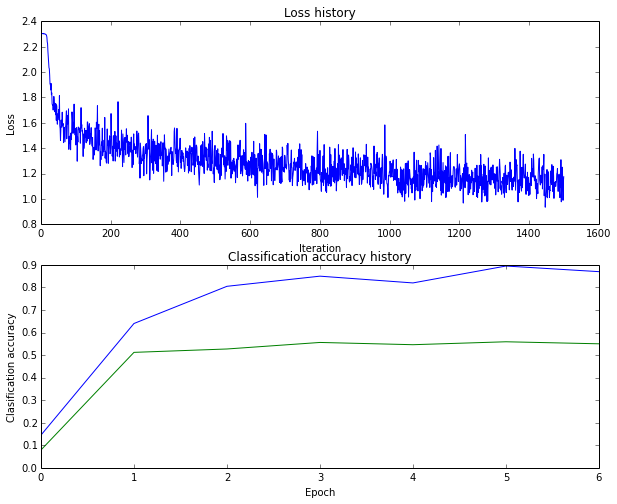

	training accuracy: (66.728571), validation accuracy: (54.700000)
(344) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


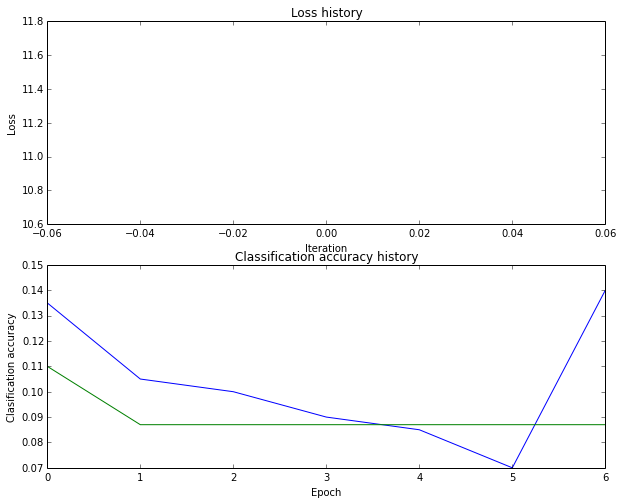

	training accuracy: (10.026531), validation accuracy: (8.700000)
(345) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


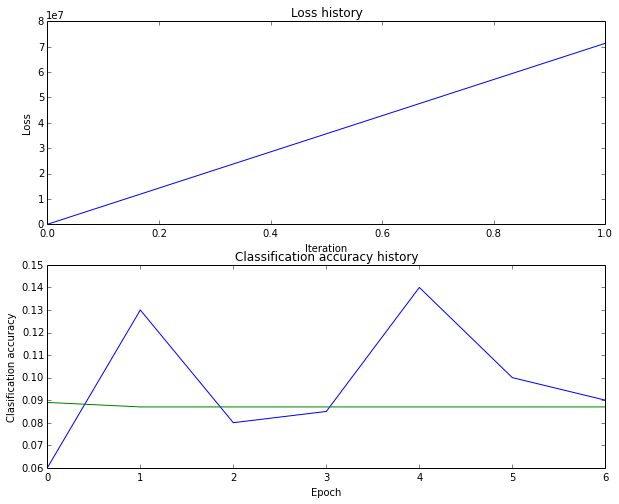

	training accuracy: (10.026531), validation accuracy: (8.700000)
(346) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


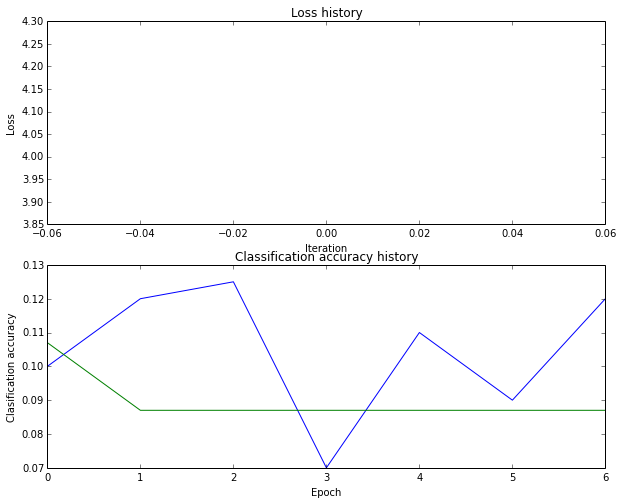

	training accuracy: (10.026531), validation accuracy: (8.700000)
(347) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


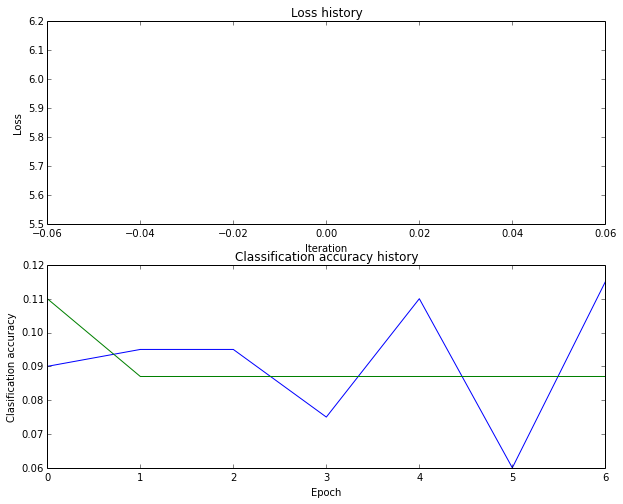

	training accuracy: (10.026531), validation accuracy: (8.700000)
(348) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:500, learn_rate:9.000000e-01)


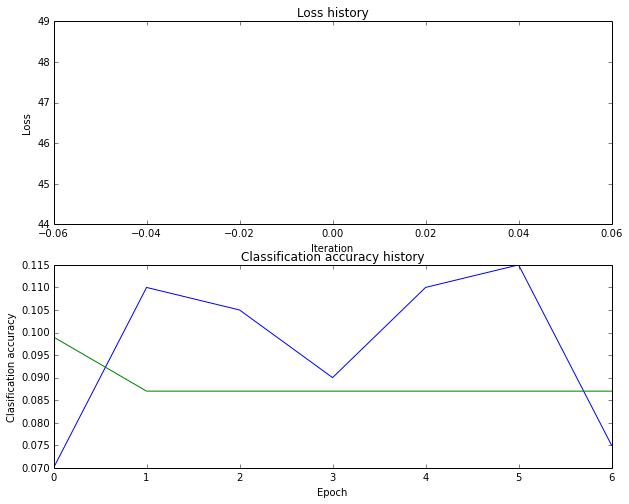

	training accuracy: (10.026531), validation accuracy: (8.700000)
(349) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:50, learn_rate:9.000000e-01)


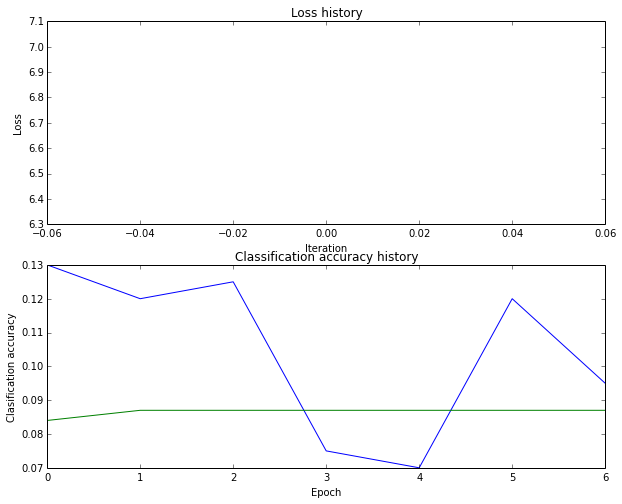

	training accuracy: (10.026531), validation accuracy: (8.700000)
(350) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:100, learn_rate:9.000000e-01)


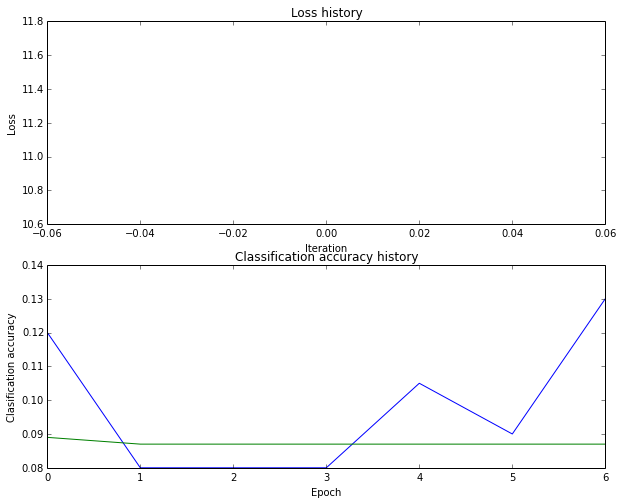

	training accuracy: (10.026531), validation accuracy: (8.700000)
(351) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:200, learn_rate:9.000000e-01)


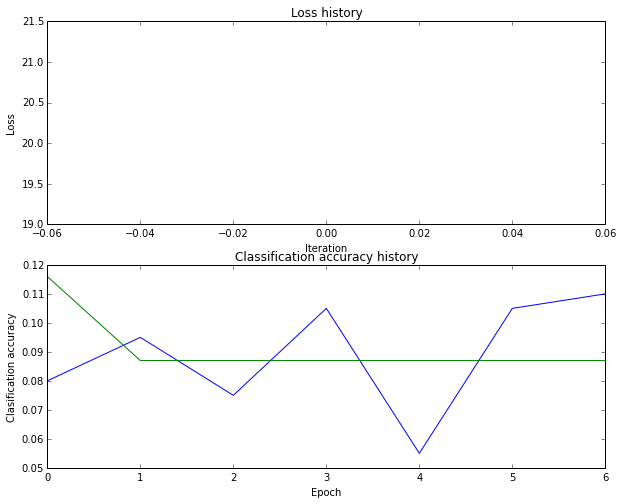

	training accuracy: (10.026531), validation accuracy: (8.700000)
(352) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:500, learn_rate:2.000000e-06)


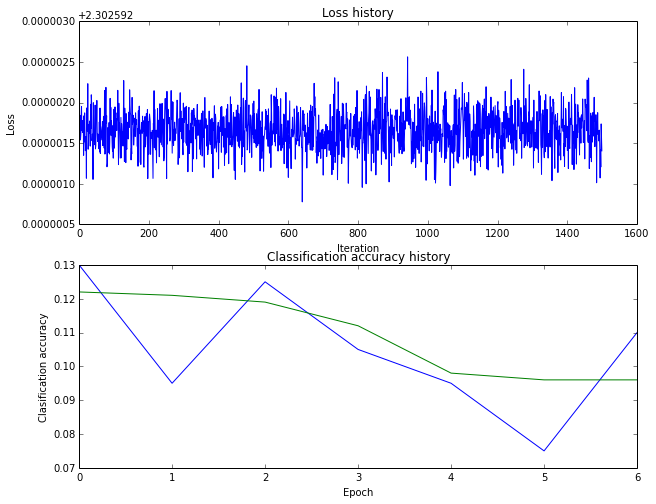

	training accuracy: (10.824490), validation accuracy: (9.600000)
(353) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:50, learn_rate:2.000000e-06)


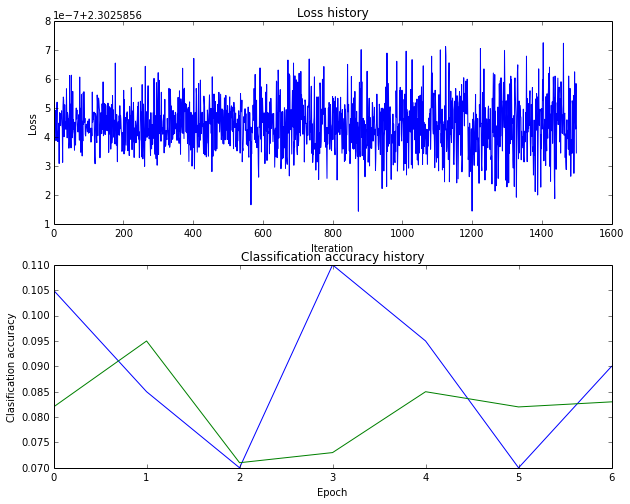

	training accuracy: (10.114286), validation accuracy: (8.300000)
(354) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:100, learn_rate:2.000000e-06)


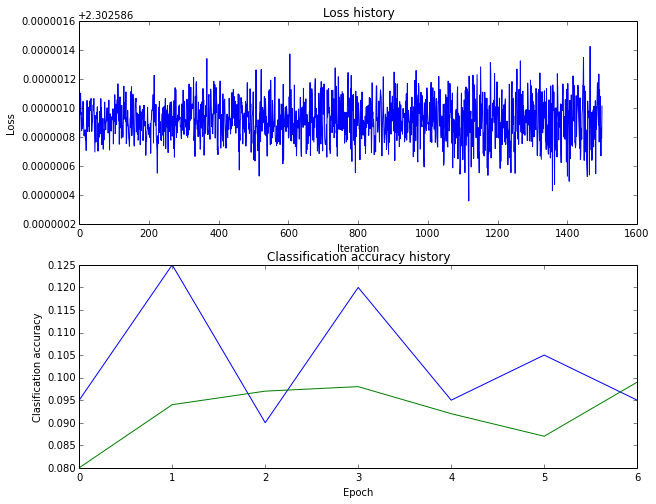

	training accuracy: (9.238776), validation accuracy: (9.900000)
(355) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:200, learn_rate:2.000000e-06)


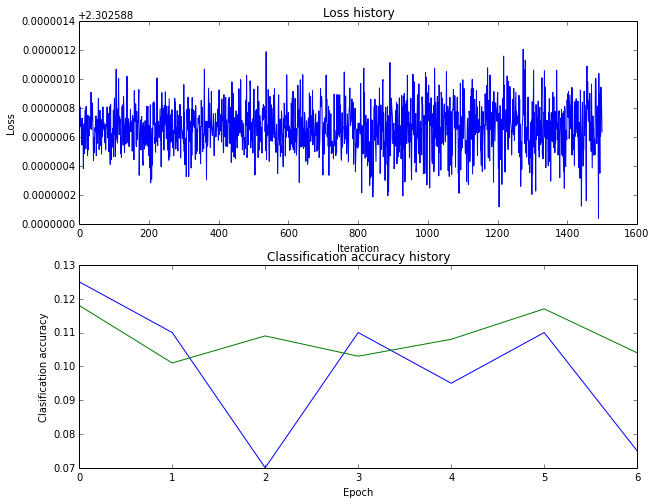

	training accuracy: (10.114286), validation accuracy: (10.100000)
(356) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:500, learn_rate:2.000000e-06)


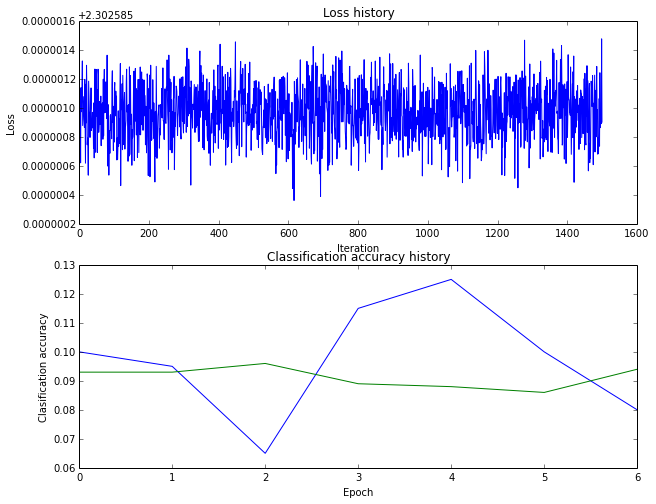

	training accuracy: (10.108163), validation accuracy: (10.000000)
(357) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:50, learn_rate:2.000000e-06)


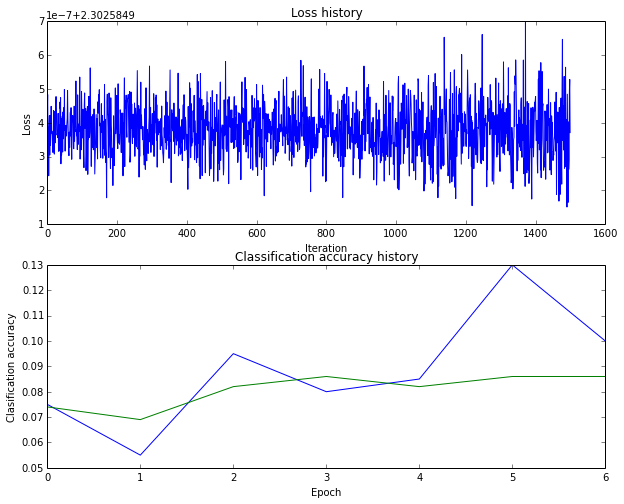

	training accuracy: (9.971429), validation accuracy: (9.300000)
(358) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:100, learn_rate:2.000000e-06)


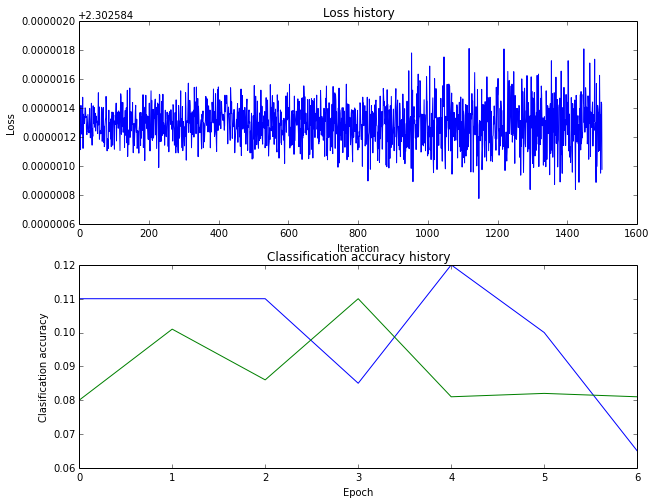

	training accuracy: (9.689796), validation accuracy: (8.300000)
(359) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:200, learn_rate:2.000000e-06)


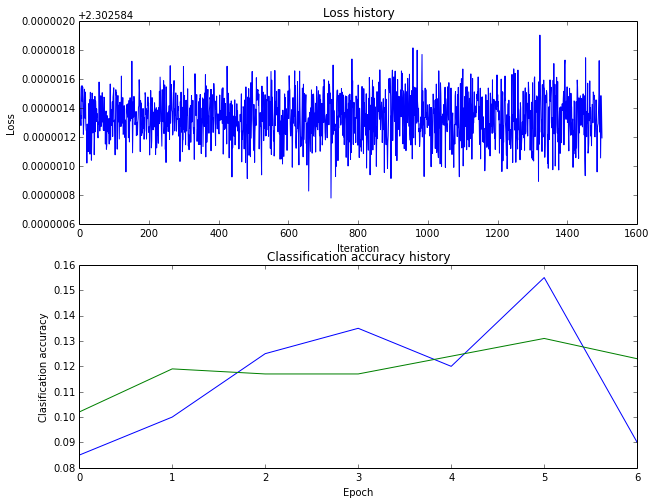

	training accuracy: (11.251020), validation accuracy: (12.300000)
(360) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


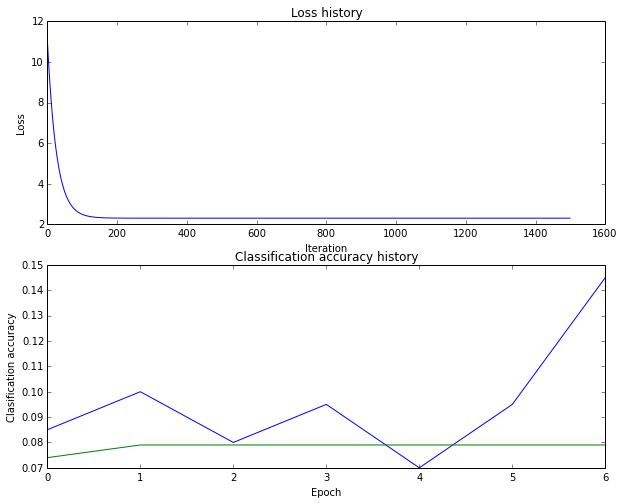

	training accuracy: (10.042857), validation accuracy: (7.900000)
(361) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


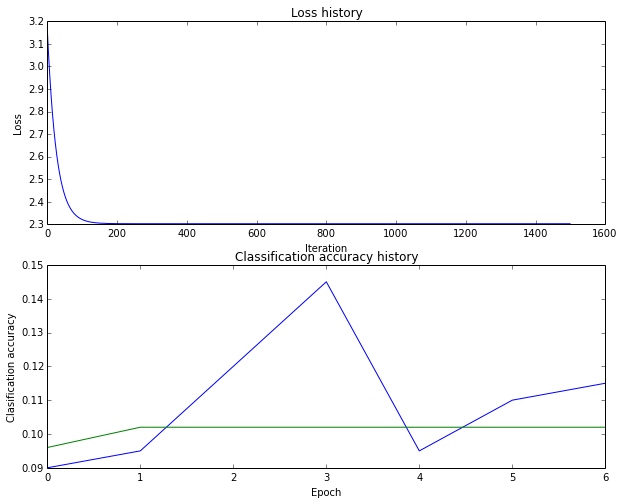

	training accuracy: (9.989796), validation accuracy: (10.500000)
(362) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


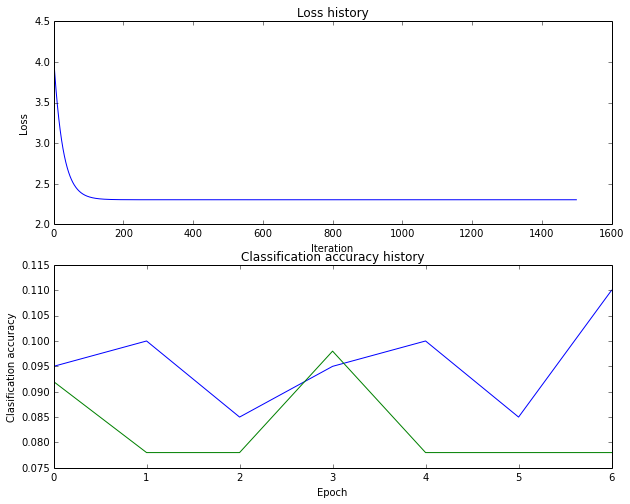

	training accuracy: (10.044898), validation accuracy: (7.800000)
(363) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


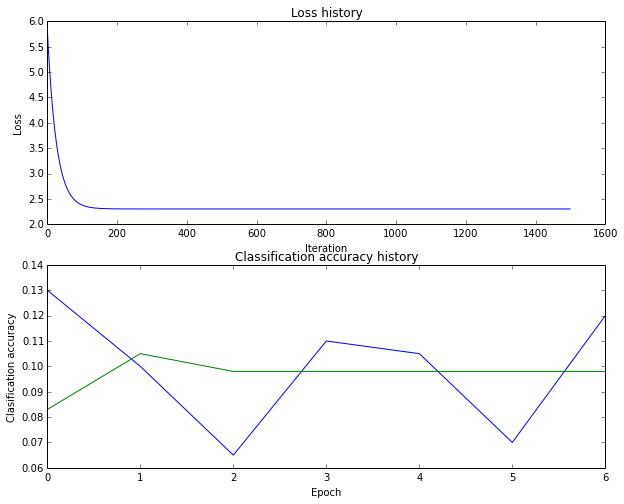

	training accuracy: (10.004082), validation accuracy: (9.800000)
(364) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:500, learn_rate:2.000000e-06)


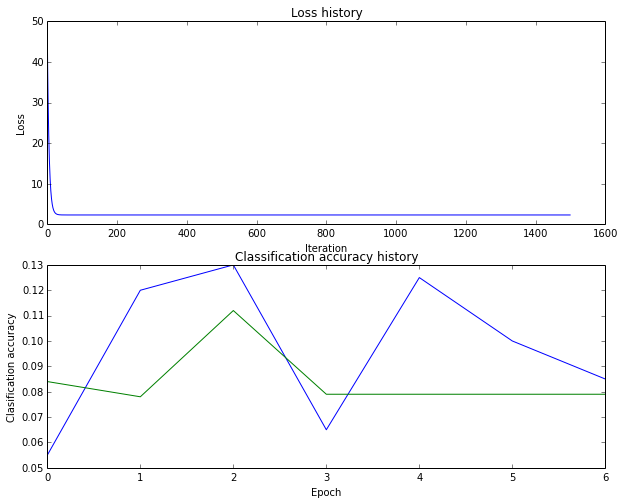

	training accuracy: (10.042857), validation accuracy: (7.900000)
(365) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:50, learn_rate:2.000000e-06)


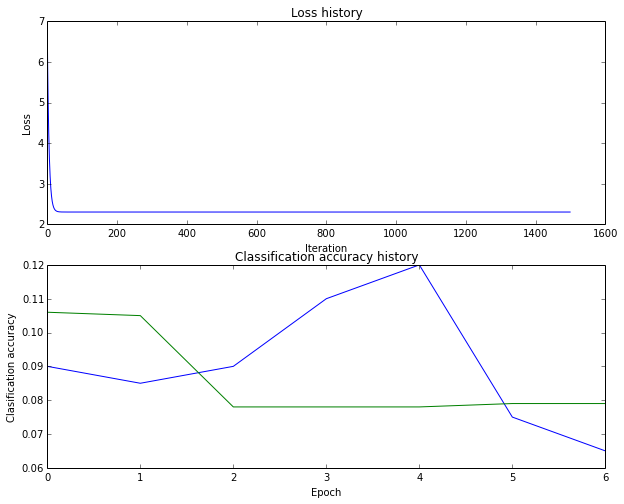

	training accuracy: (10.042857), validation accuracy: (7.900000)
(366) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:100, learn_rate:2.000000e-06)


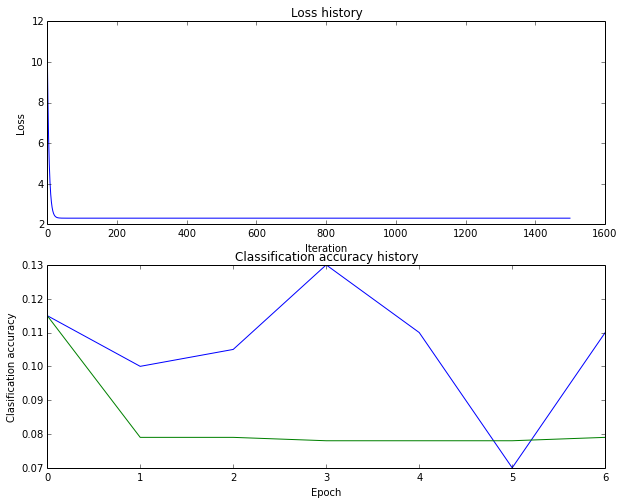

	training accuracy: (10.042857), validation accuracy: (7.900000)
(367) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:200, learn_rate:2.000000e-06)


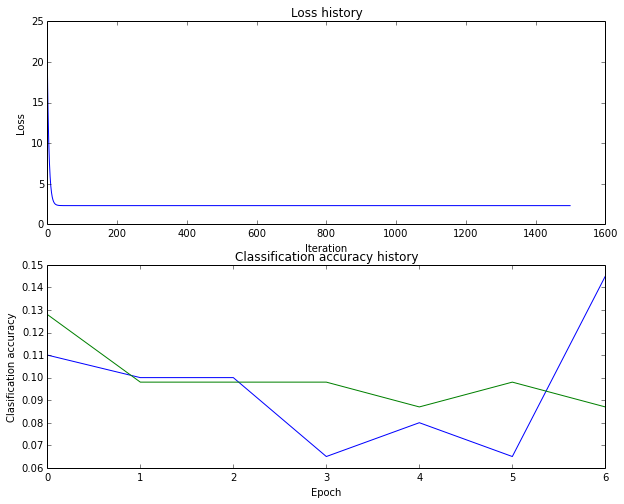

	training accuracy: (10.026531), validation accuracy: (8.700000)
(368) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:500, learn_rate:5.000000e-06)


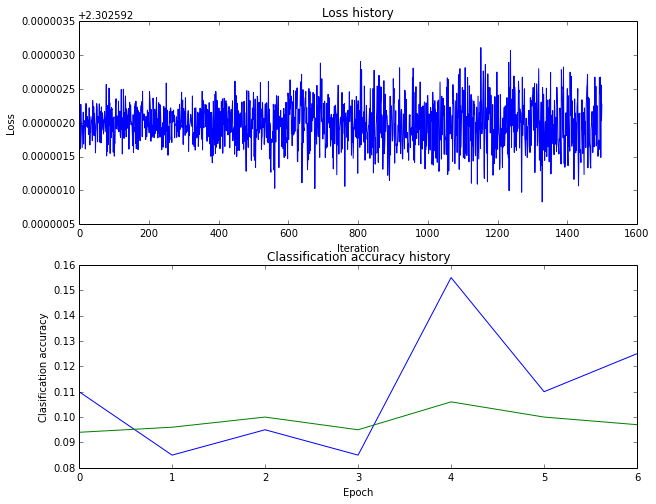

	training accuracy: (10.248980), validation accuracy: (10.100000)
(369) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:50, learn_rate:5.000000e-06)


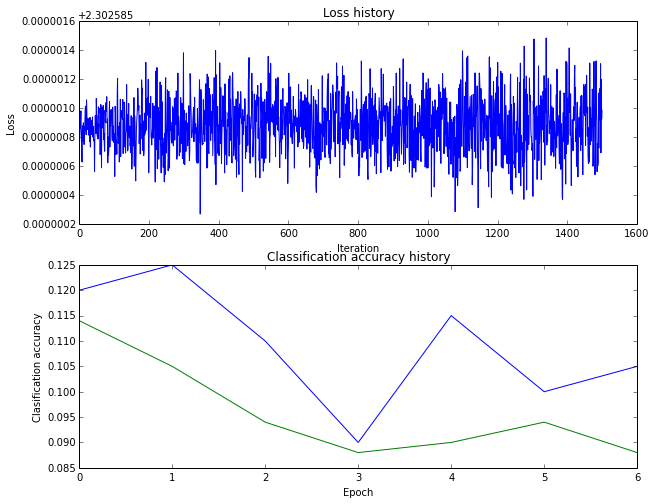

	training accuracy: (9.938776), validation accuracy: (8.700000)
(370) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:100, learn_rate:5.000000e-06)


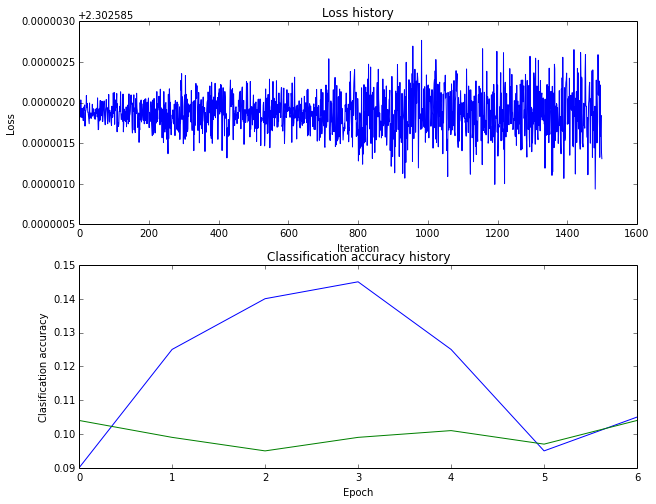

	training accuracy: (10.916327), validation accuracy: (10.300000)
(371) of (384)
Running Train and validation for (bins:200, reg:1.000000e-02, hidden_size:200, learn_rate:5.000000e-06)


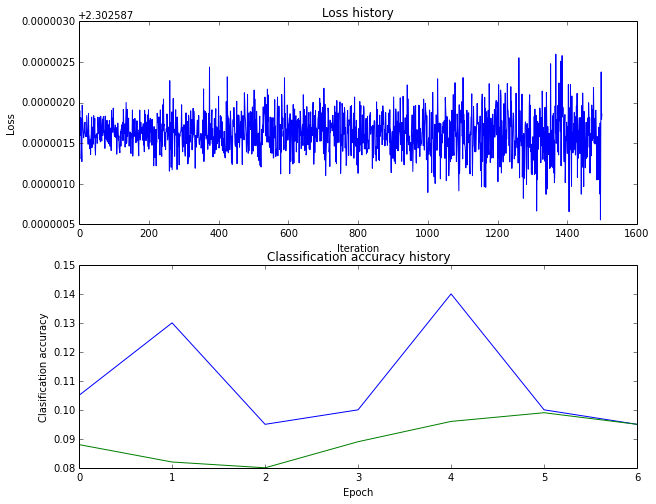

	training accuracy: (10.183673), validation accuracy: (9.300000)
(372) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:500, learn_rate:5.000000e-06)


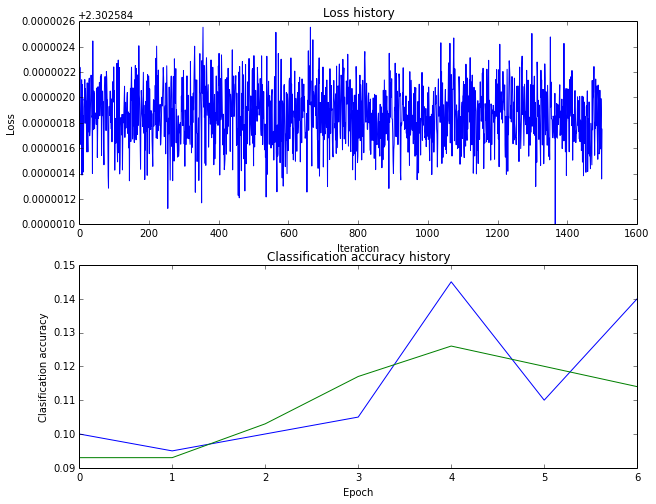

	training accuracy: (9.791837), validation accuracy: (11.700000)
(373) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:50, learn_rate:5.000000e-06)


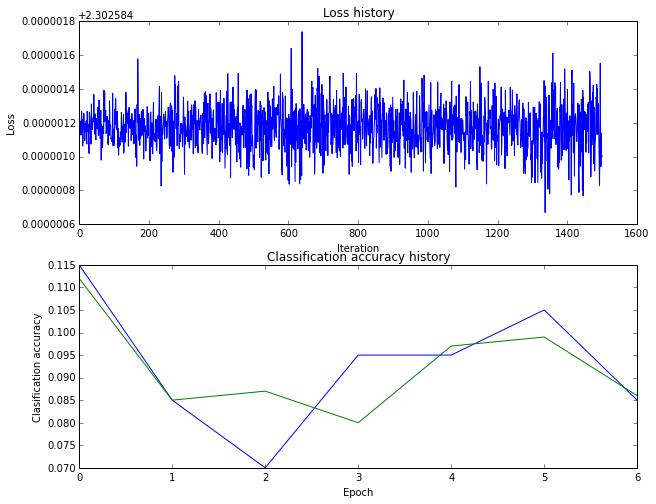

	training accuracy: (9.577551), validation accuracy: (8.200000)
(374) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:100, learn_rate:5.000000e-06)


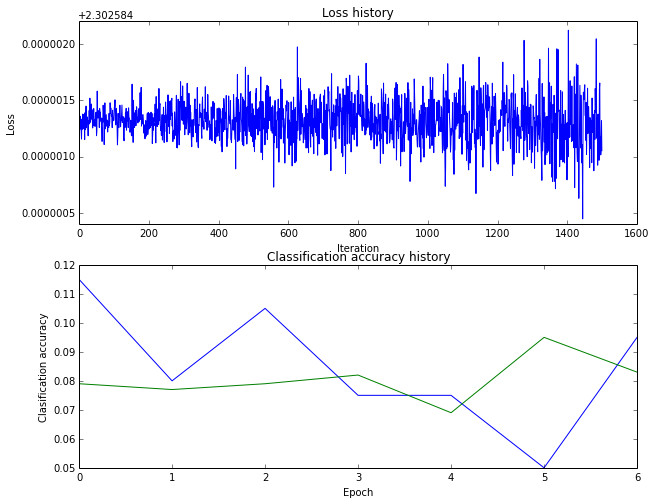

	training accuracy: (9.495918), validation accuracy: (7.900000)
(375) of (384)
Running Train and validation for (bins:200, reg:1.000000e-03, hidden_size:200, learn_rate:5.000000e-06)


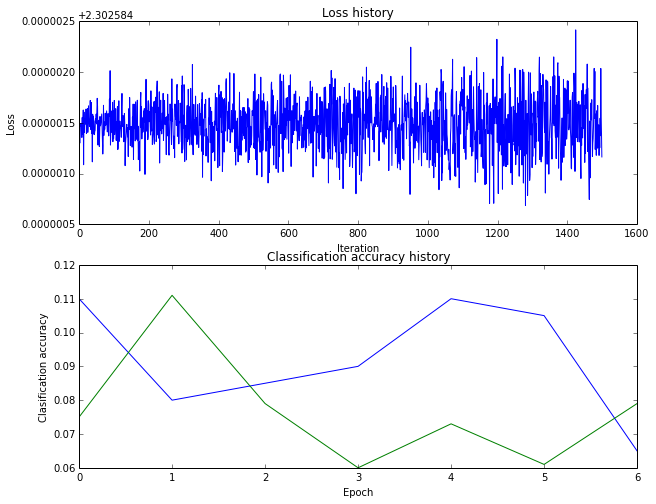

	training accuracy: (10.093878), validation accuracy: (7.900000)
(376) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


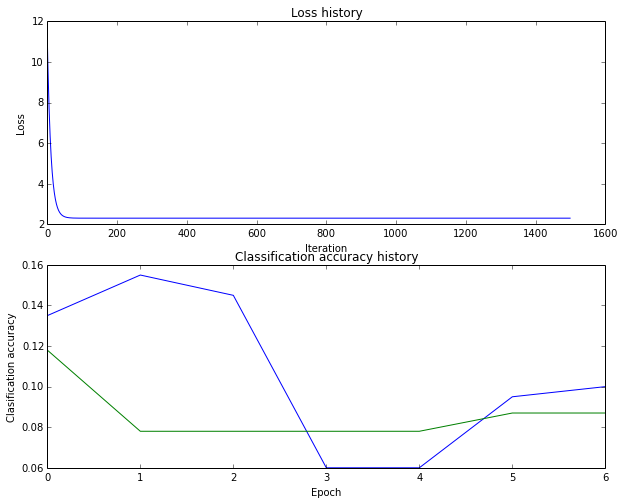

	training accuracy: (10.026531), validation accuracy: (8.700000)
(377) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


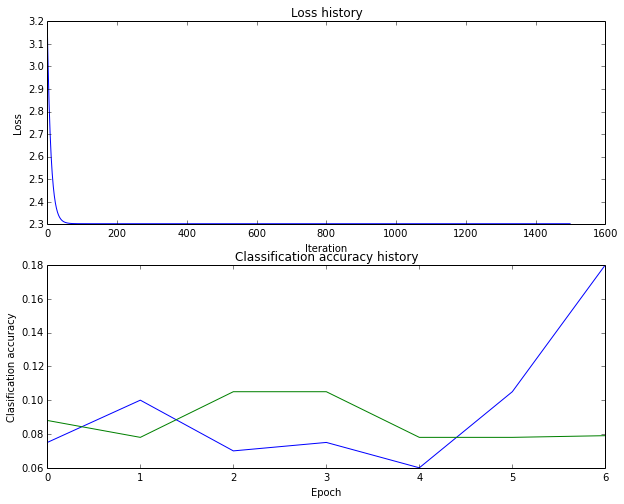

	training accuracy: (10.042857), validation accuracy: (7.900000)
(378) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


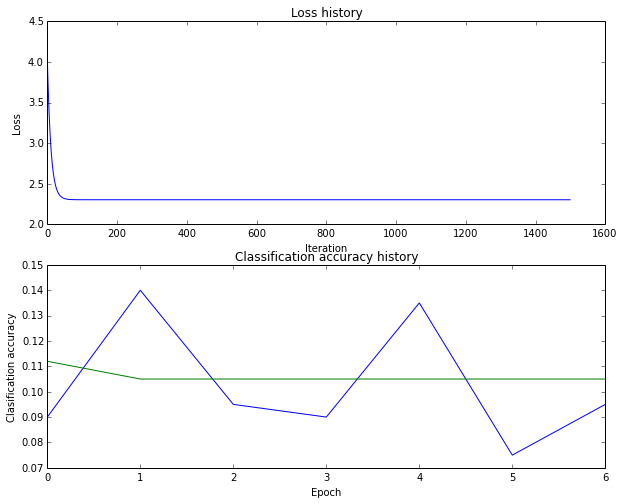

	training accuracy: (9.989796), validation accuracy: (10.500000)
(379) of (384)
Running Train and validation for (bins:200, reg:1.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


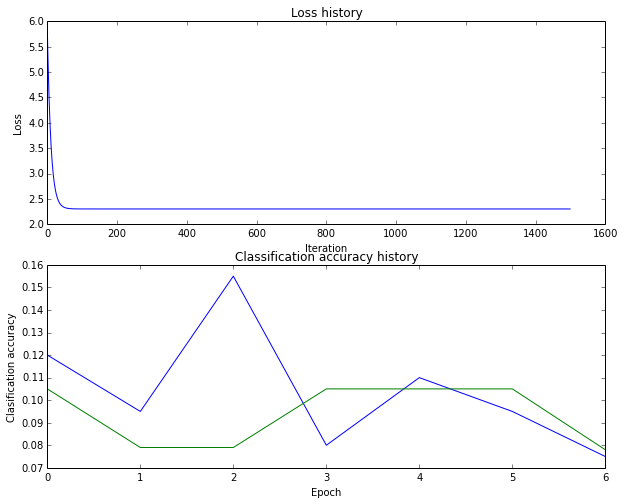

	training accuracy: (10.044898), validation accuracy: (7.800000)
(380) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:500, learn_rate:5.000000e-06)


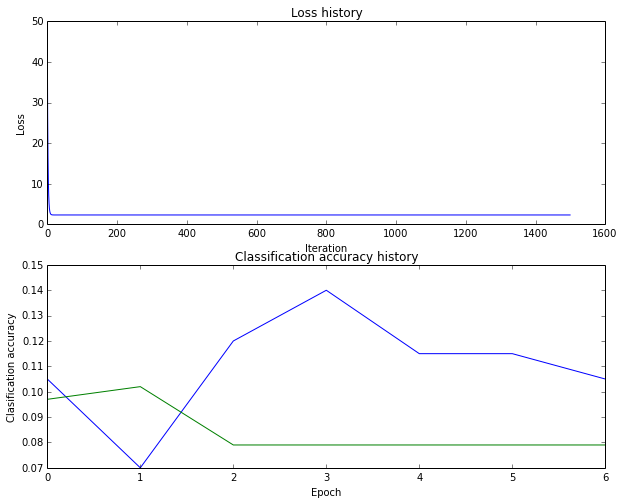

	training accuracy: (10.042857), validation accuracy: (7.900000)
(381) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:50, learn_rate:5.000000e-06)


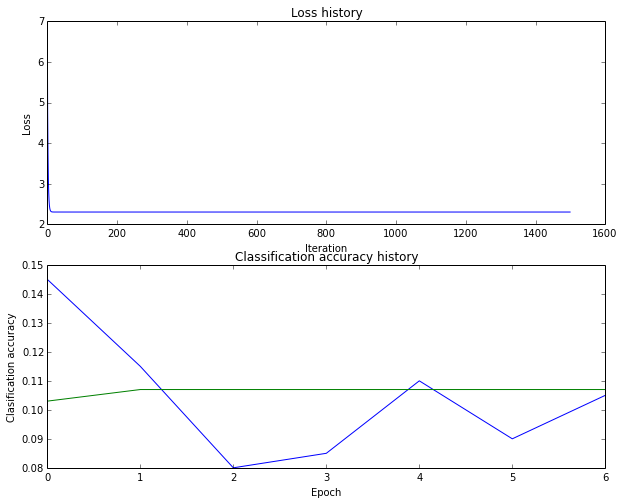

	training accuracy: (9.985714), validation accuracy: (10.700000)
(382) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:100, learn_rate:5.000000e-06)


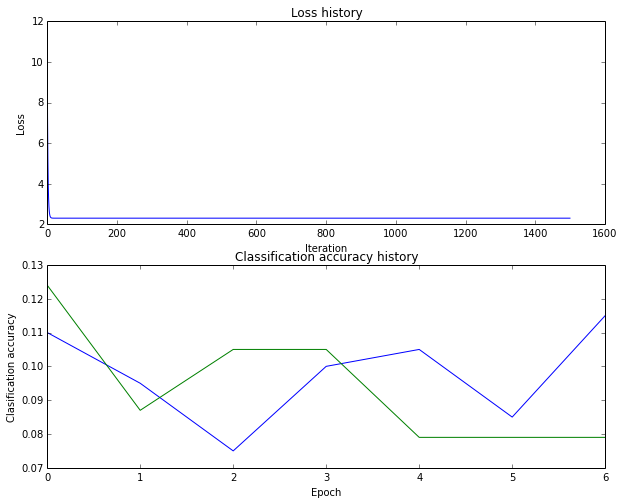

	training accuracy: (10.042857), validation accuracy: (7.900000)
(383) of (384)
Running Train and validation for (bins:200, reg:5.000000e+04, hidden_size:200, learn_rate:5.000000e-06)


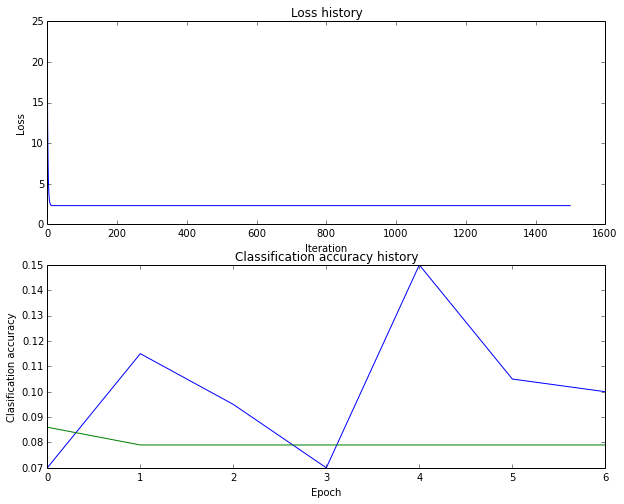

	training accuracy: (10.042857), validation accuracy: (7.900000)


In [65]:
from cs231n.classifiers.neural_net import TwoLayerNet

results = {}
best_val = -1   # The highest validation accuracy that we have seen so far.
best_net = None # store the best model into this 

#numer of training epochs
hidden_sizes = [500, 50, 100, 200]
learning_rates = [1.1, 9e-1, 2e-6, 5e-6]
regularization_strengths = [1e-2, 1e-3, 1e4, 5e4]
num_bins = [10, 20, 40, 80, 100, 200]


num_iters = 1500
num_classes = 10

print "START"
count = len(learning_rates) * len(regularization_strengths) * len(num_bins) * len(hidden_sizes)
index = 0
for bins in num_bins:
    X_train_feats, X_val_feats, X_test_feats = get_hist_features(X_train, X_val, X_test, bins)
    for learn_rate in learning_rates:
        for reg in regularization_strengths:
            for hidden_size in hidden_sizes:
                print "(%d) of (%d)" % (index, count)
                index += 1
                print "Running Train and validation for (bins:%d, reg:%e, hidden_size:%d, learn_rate:%e)"% (bins, reg, hidden_size, learn_rate)
                input_size = X_train_feats.shape[1]
                net = TwoLayerNet(input_size, hidden_size, num_classes)

                stats = net.train(X_train_feats, y_train, X_val_feats, y_val,
                            num_iters=num_iters, batch_size=200,
                            learning_rate=learn_rate, learning_rate_decay=0.95,
                            reg=reg, verbose=False)
                plot_stats(stats)
                y_train_pred = net.predict(X_train_feats)
                accuray_train = np.mean(y_train == y_train_pred) * 100
                y_val_pred = net.predict(X_val_feats) 
                accuray_val = np.mean(y_val == y_val_pred) *  100
                print '\ttraining accuracy: (%f), validation accuracy: (%f)' % (accuray_train,  accuray_val)
                results[(bins, reg, hidden_size, learn_rate)] = accuray_train, accuray_val, net
            

bins:10 reg:1.000000e-03, hidden_size:50, learn_rate:2.000000e-06, train accuracy: 10.157143, val accuracy: 7.900000
bins:10 reg:1.000000e-03, hidden_size:50, learn_rate:5.000000e-06, train accuracy: 10.032653, val accuracy: 7.900000
bins:10 reg:1.000000e-03, hidden_size:50, learn_rate:9.000000e-01, train accuracy: 58.334694, val accuracy: 55.500000
bins:10 reg:1.000000e-03, hidden_size:50, learn_rate:1.100000e+00, train accuracy: 58.838776, val accuracy: 54.700000
bins:10 reg:1.000000e-03, hidden_size:100, learn_rate:2.000000e-06, train accuracy: 10.453061, val accuracy: 8.800000
bins:10 reg:1.000000e-03, hidden_size:100, learn_rate:5.000000e-06, train accuracy: 9.559184, val accuracy: 10.600000
bins:10 reg:1.000000e-03, hidden_size:100, learn_rate:9.000000e-01, train accuracy: 63.744898, val accuracy: 56.400000
bins:10 reg:1.000000e-03, hidden_size:100, learn_rate:1.100000e+00, train accuracy: 62.828571, val accuracy: 54.600000
bins:10 reg:1.000000e-03, hidden_size:200, learn_rate:2.

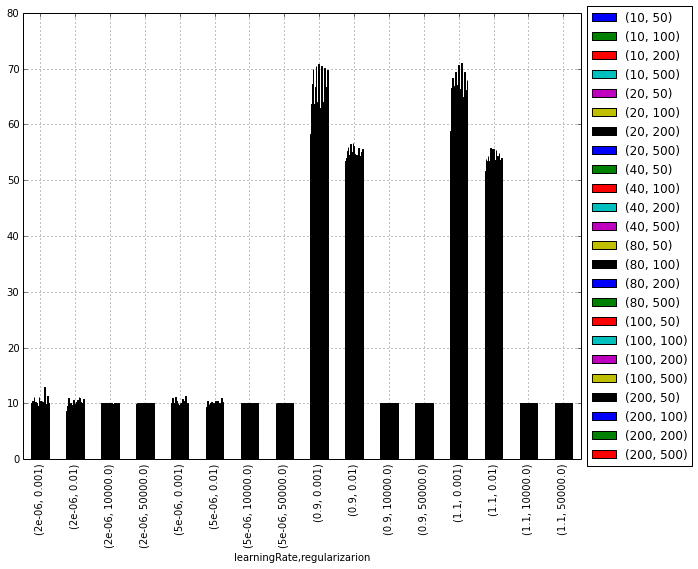

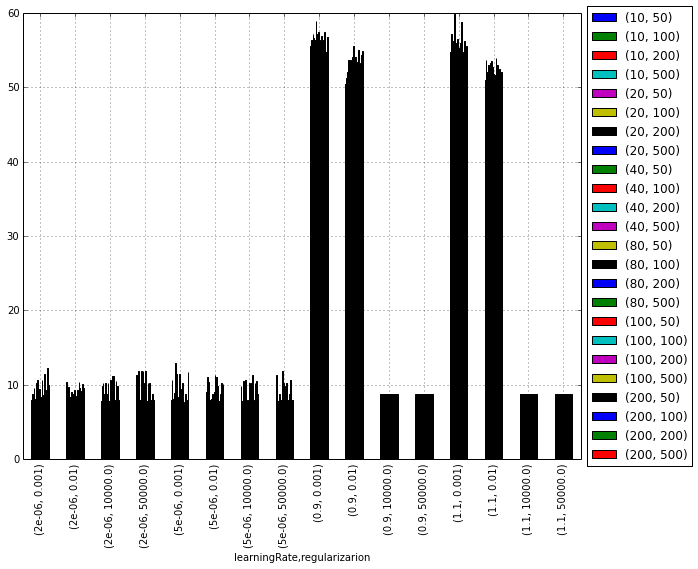

In [95]:
# Print out results.
best_val = -1
best_params = None

for keys in sorted(results):
    bins, reg, hidden_size, learn_rate = keys
    accuray_train, accuray_val, net = results[bins, reg, hidden_size, learn_rate]
    print 'bins:%d reg:%e, hidden_size:%d, learn_rate:%e, train accuracy: %f, val accuracy: %f' % (
                bins, reg, hidden_size, learn_rate, accuray_train, accuray_val)
    if best_val == -1 or accuray_val  > best_val:
        best_val = accuray_val
        best_svm = net
        best_params = keys
    
print 'best validation accuracy achieved during cross-validation: %f' % best_val
bins, reg, hidden_size, learn_rate = best_params
print best_params
print 'bins:%d reg:%e, hidden_size:%d, learn_rate:%e, train accuracy: %f, val accuracy: %f' % (
                bins, reg, hidden_size, learn_rate, results[best_params][0], results[best_params][1])                       

train_accuracies = []
val_accuracies = []
lrs = []
regs = []
bins = []
hidden_size = []
import pandas as pd
for key in sorted(results):
    train_accuracies.append(results[key][0])
    val_accuracies.append(results[key][1])
    bins.append(key[0])
    regs.append(key[1])
    hidden_size.append(key[2])
    lrs.append(key[3])
        
d = {'learningRate' : pd.Series(lrs),
    'regularizarion' : pd.Series(regs),
     'bins' : pd.Series(bins),
     'hiddens': pd.Series(hidden_size),
     'trainAccuracy': train_accuracies, 
     'valAccuracy': val_accuracies
       }
rows = pd.DataFrame(d)
cross_tab = pd.crosstab([rows.learningRate, rows.regularizarion],  [rows.bins, rows.hiddens],  values=rows.trainAccuracy,
                        aggfunc=np.min).plot(kind='bar').legend(loc='center left', bbox_to_anchor=(1, 0.5))

cross_tab = pd.crosstab([rows.learningRate, rows.regularizarion],  [rows.bins, rows.hiddens], values=rows.valAccuracy,  aggfunc=np.min).plot(kind='bar').legend(loc='center left', bbox_to_anchor=(1, 0.5))


In [80]:
def show_net_weights(net):
  W1 = net.params['W1']
  W1 = W1.reshape(32, 32, 3, -1).transpose(3, 0, 1, 2)
  plt.imshow(visualize_grid(W1, padding=3).astype('uint8'))
  plt.gca().axis('off')
  plt.show()

In [89]:
# Run your neural net classifier on the test set. You should be able to
# get more than 55% accuracy.

net = results[best_params][2]
X_train_feats, X_val_feats, X_test_feats = get_hist_features(X_train, X_val, X_test, best_params[0])
test_acc = (net.predict(X_test_feats) == y_test).mean()
print test_acc


0.562


# Bonus: Design your own features!

You have seen that simple image features can improve classification performance. So far we have tried HOG and color histograms, but other types of features may be able to achieve even better classification performance.

For bonus points, design and implement a new type of feature and use it for image classification on CIFAR-10. Explain how your feature works and why you expect it to be useful for image classification. Implement it in this notebook, cross-validate any hyperparameters, and compare its performance to the HOG + Color histogram baseline.

# Bonus: Do something extra!
Use the material and code we have presented in this assignment to do something interesting. Was there another question we should have asked? Did any cool ideas pop into your head as you were working on the assignment? This is your chance to show off!